# Cat or no cat?

This notebook shows two simple image-recognition algorithms that can correctly classify pictures as cat or non-cat.  
The first is a classic logistic regression while the second - more accurate - is a deep neural network.

## 1 - Overview of the data set ##

The dataset is taken from Andrew Ng's course on Coursera *Introduction to Neural Networks*.  
The dataset ("data.h5") contains:
* a training set of m_train images labeled as cat (y=1) or non-cat (y=0)
* a test set of m_test images labeled as cat or non-cat
* each image is of shape (num_px, num_px, 3) where 3 is for the 3 channels (RGB). Thus, each image is square (height = num_px) and (width = num_px).

Let's get more familiar with the dataset.

In [1]:
import numpy as np
import h5py
    
    # Loading the data (cat/non-cat)
train_dataset = h5py.File('data/train_catvnoncat.h5', "r")
train_set_x_orig = np.array(train_dataset["train_set_x"][:]) # train set features
train_set_y_orig = np.array(train_dataset["train_set_y"][:]) # train set labels

test_dataset = h5py.File('data/test_catvnoncat.h5', "r")
test_set_x_orig = np.array(test_dataset["test_set_x"][:]) # test set features
test_set_y_orig = np.array(test_dataset["test_set_y"][:]) # test set labels

classes = np.array(test_dataset["list_classes"][:]) # the list of classes
    
train_set_y = train_set_y_orig.reshape((1, train_set_y_orig.shape[0]))
test_set_y = test_set_y_orig.reshape((1, test_set_y_orig.shape[0]))

Each line of train_set_x_orig and test_set_x_orig is an array representing an image. You can visualize an example by running the following code. Feel free also to change the `index` value and re-run to see other images. 

In [2]:
import matplotlib.pyplot as plt

%matplotlib inline

plt.rcParams['figure.figsize'] = (5.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

np.random.seed(1)

y = [1], it's a 'cat' picture.


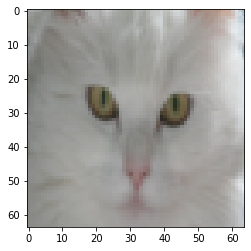

In [3]:
    # Example of a picture
index = 50
plt.imshow(train_set_x_orig[index])
print ("y = " + str(train_set_y[:, index]) + ", it's a '" + classes[np.squeeze(train_set_y[:, index])].decode("utf-8") +  "' picture.")

## 2 - Data preprocessing

<font color='blue'>
**Dataset pre-processing:**

Common steps for pre-processing a new dataset are:
* Figure out the dimensions and shapes of the problem (m_train, m_test, num_px, ...)
* Reshape the datasets such that each example is now a vector of size (num_px \* num_px \* 3, 1)
* "Standardize" the data

Many software bugs in deep learning come from having matrix/vector dimensions that don't fit. If you can keep your matrix/vector dimensions straight you will go a long way toward eliminating many bugs. 

In [4]:
m_train = train_set_x_orig.shape[0]
m_test = test_set_x_orig.shape[0]
num_px = train_set_x_orig.shape[1]

print ("Dataset dimensions:")
print ("Number of training examples: m_train = " + str(m_train))
print ("Number of testing examples: m_test = " + str(m_test))
print ("Height/Width of each image: num_px = " + str(num_px))
print ("Each image is of size: (" + str(num_px) + ", " + str(num_px) + ", 3)")
print ("train_set_x shape: " + str(train_set_x_orig.shape))
print ("train_set_y shape: " + str(train_set_y.shape))
print ("test_set_x shape: " + str(test_set_x_orig.shape))
print ("test_set_y shape: " + str(test_set_y.shape))

Dataset dimensions:
Number of training examples: m_train = 209
Number of testing examples: m_test = 50
Height/Width of each image: num_px = 64
Each image is of size: (64, 64, 3)
train_set_x shape: (209, 64, 64, 3)
train_set_y shape: (1, 209)
test_set_x shape: (50, 64, 64, 3)
test_set_y shape: (1, 50)


For convenience, we now reshape images of shape (num_px, num_px, 3) in a numpy-array of shape (num_px $*$ num_px $*$ 3, 1). After this, our training (and test) dataset is a numpy-array where each column represents a flattened image. There should be m_train (respectively m_test) columns.


A trick when you want to flatten a matrix X of shape (a,b,c,d) to a matrix X_flatten of shape (b$*$c$*$d, a) is to use: 
```python
X_flatten = X.reshape(X.shape[0], -1).T      # X.T is the transpose of X
```

In [5]:
# Reshape the training and test examples

train_set_x_flatten = train_set_x_orig.reshape(train_set_x_orig.shape[0], -1).T 
test_set_x_flatten = test_set_x_orig.reshape(test_set_x_orig.shape[0], -1).T 

print ("train_set_x_flatten shape: " + str(train_set_x_flatten.shape))
print ("train_set_y shape: " + str(train_set_y.shape))
print ("test_set_x_flatten shape: " + str(test_set_x_flatten.shape))
print ("test_set_y shape: " + str(test_set_y.shape))
print ("sanity check after reshaping: " + str(train_set_x_flatten[0:5,0]))

train_set_x_flatten shape: (12288, 209)
train_set_y shape: (1, 209)
test_set_x_flatten shape: (12288, 50)
test_set_y shape: (1, 50)
sanity check after reshaping: [17 31 56 22 33]


To represent color images, the red, green and blue channels (RGB) must be specified for each pixel, and so the pixel value is actually a vector of three numbers ranging from 0 to 255.

One common preprocessing step in machine learning is to center and standardize your dataset, meaning that you substract the mean of the whole numpy array from each example, and then divide each example by the standard deviation of the whole numpy array. But for picture datasets, it is simpler and more convenient and works almost as well to just divide every row of the dataset by 255 (the maximum value of a pixel channel).

<!-- During the training of your model, you're going to multiply weights and add biases to some initial inputs in order to observe neuron activations. Then you backpropogate with the gradients to train the model. But, it is extremely important for each feature to have a similar range such that our gradients don't explode. You will see that more in detail later in the lectures. !--> 

Let's standardize our dataset.

In [6]:
train_set_x = train_set_x_flatten/255.
test_set_x = test_set_x_flatten/255.

# Logistic Regression 

We will build first [a logistic regression classifier](https://github.com/Mashimo/datascience/blob/master/01-Regression/LogisticRegression.ipynb) to recognize the cats.  

![Logistic geeral diagram](../images/logistic.png)


## 3 - General Architecture of the learning algorithm ##

It's time to design a simple algorithm to distinguish cat images from non-cat images.  
The input will be the image transformed into a vector above, normlaised and flattened. The activation function is the sigmoid. If the output is more than 0.5 then it is considered a cat, otherwise not.  

![Logistic diagram to classify our cats images](../images/LogReg_kiank.png)

**Mathematical expression of the algorithm**:

For one example $x^{(i)}$:
$$z^{(i)} = w^T x^{(i)} + b $$
$$y_{hat}^{(i)} = a^{(i)} = sigmoid(z^{(i)})$$ 
$$ \mathcal{L}(a^{(i)}, y^{(i)}) =  - y^{(i)}  \log(a^{(i)}) - (1-y^{(i)} )  \log(1-a^{(i)})$$

The cost is then computed by summing over all training examples:
$$ J = \frac{1}{m} \sum_{i=1}^m \mathcal{L}(a^{(i)}, y^{(i)})$$

Will use the *LogisticRegression* module from *sklearn*.   

**Key steps**:
* Initialize the parameters of the model
* Learn the parameters for the model by minimizing the cost  
* Use the learned parameters to make predictions (on the test set)
* Analyse the results and conclude

## 3.1 - Define and fit the logistic regression model

In [7]:
from sklearn.linear_model import LogisticRegression

In [8]:
lr = LogisticRegression(C=1000.0, random_state=0)

In [9]:
lr.fit(train_set_x.T, train_set_y.T.ravel())

c:\users\0012708\appdata\local\programs\python\python38\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=1000.0, random_state=0)

These are the weights that the algorithm fitted to the model:

In [9]:
lr.coef_.shape

(1, 12288)

In [10]:
lr.coef_

array([[ 0.08102441, -0.10450839, -0.01967902, ..., -0.05286658,
        -0.11922794,  0.17649064]])

In [11]:
lr.intercept_

array([-0.10167889])

The model fitted is therefore: $$-0.001 + 0.056*x_{1} -0.114*x_{2} + ... + 0.154*x_{12288}$$

### 3.2 - Assess predictions on test data

We can measure the model accuracy using the test set:

In [10]:
Y_prediction = lr.predict(test_set_x.T)
Y_prediction.shape

(50,)

In [11]:
print("test accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction - test_set_y)) * 100))

test accuracy: 70.0 %


**72% of the test photos have been predicted correctly.**   

We can also see how many and which images have been misclassified:

In [12]:
def print_mislabeled_images(classes, X, y, p):
    """
    Plots images where predictions and truth were different.
    X -- dataset
    y -- true labels
    p -- predictions
    """
    a = p + y
    mislabeled_indices = np.asarray(np.where(a == 1))
    plt.rcParams['figure.figsize'] = (40.0, 40.0) # set default size of plots
    num_images = len(mislabeled_indices[0])
    for i in range(num_images):
        index = mislabeled_indices[1][i]
        
        plt.subplot(2, num_images, i + 1)
        plt.imshow(X[:,index].reshape(64,64,3), interpolation='nearest')
        plt.axis('off')
        t1 = classes[int(p[index])].decode("utf-8")
        t2 = classes[y[0,index]].decode("utf-8")
        plt.title("Prediction: " + t1 + " \n Class: " + t2)
        
    return num_images

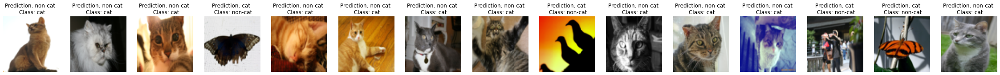

In [13]:
misses = print_mislabeled_images(classes, test_set_x, test_set_y, Y_prediction)

In [14]:
print("Number of misses: {0}".format(misses))

Number of misses: 15


### 3.3 - Test with your own image 

You can use your own image and see the output of the model. To do that:
1. Clone the repository.
1. Click on "File" in the upper bar of this notebook, then click "Open".
1. Add your image to the Jupyter Notebook's directory, in the "images" folder
1. Change your image's name in the following code
1. Run the code and check if the algorithm is right (1 = cat, 0 = non-cat)!

I will try with a cat image modified to have bunny ears!

In [15]:
import scipy
#from PIL import Image
from scipy import ndimage

In [18]:
my_image_filename = "Bunny+cat.png"   # change this to the name of your image file 

# We preprocess the image to fit the LR algorithm.
fname = "../images/" + my_image_filename
image = np.array(scipy.ndimage.imread(fname, flatten=False))
my_image = scipy.misc.imresize(image, size=(num_px,num_px)).reshape((1, num_px*num_px*3)).T

AttributeError: module 'scipy.ndimage' has no attribute 'imread'

y = 0, the algorithm predicts a "non-cat" picture.


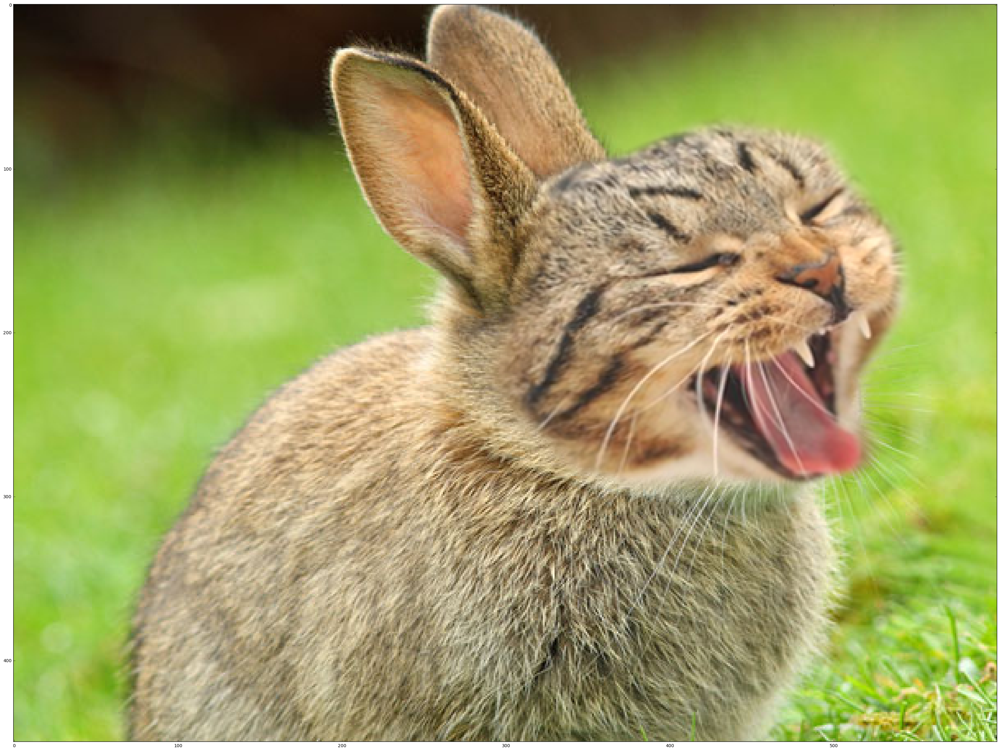

In [22]:
my_predicted_image = lr.predict(my_image.T)

plt.imshow(image)
print("y = " + str(np.squeeze(my_predicted_image)) + ", the algorithm predicts a \"" + classes[int(np.squeeze(my_predicted_image)),].decode("utf-8") +  "\" picture.")

hmmm ... ok, the model seems easy to be tricked ...

# Deep Neural Network for Image Classification

Now we will build and apply a deep neural network to the problem.

## Dataset
We will use the same "Cat vs non-Cat" dataset as above. The model we had built had 72% test accuracy on classifying cats vs non-cats images. Hopefully, our new model will perform better!

y = 0. It's a non-cat picture.


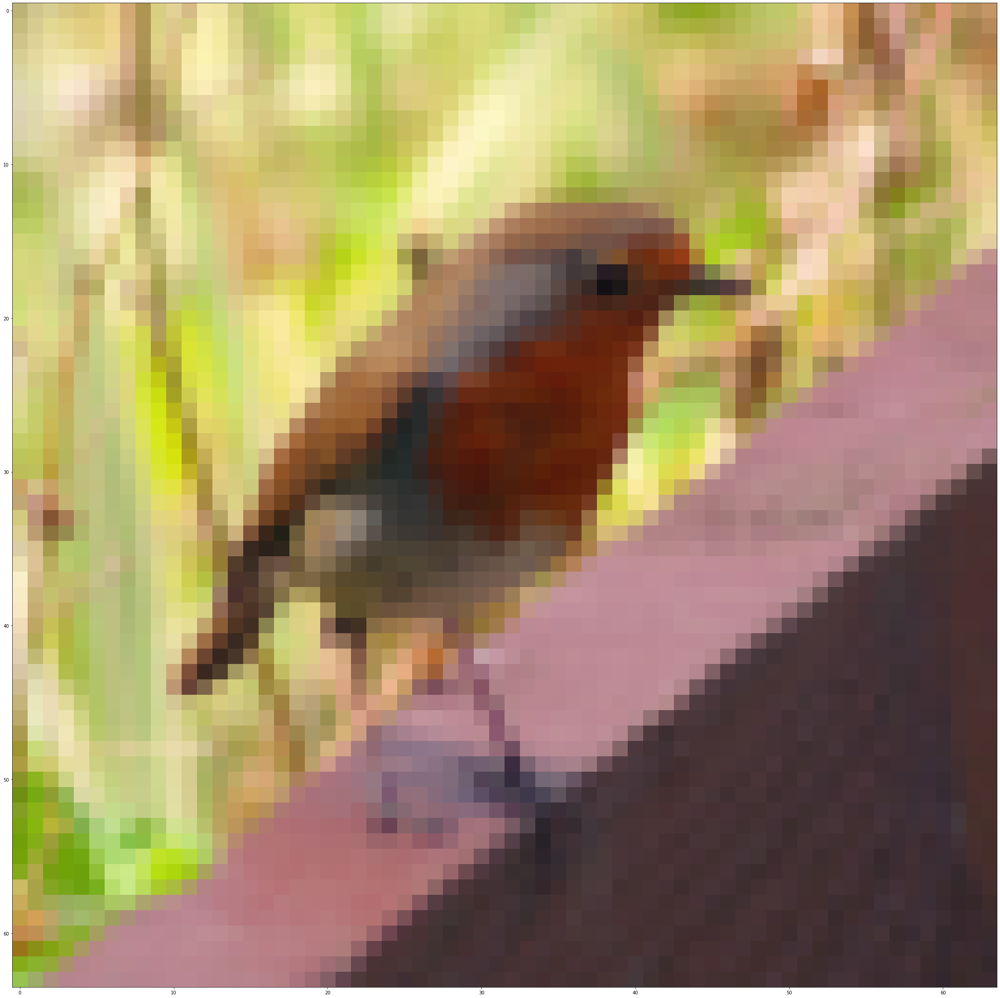

In [16]:
# Example of a picture
index = 10
plt.imshow(train_set_x_orig[index])
print ("y = " + str(train_set_y[0,index]) + ". It's a " + classes[train_set_y[0,index]].decode("utf-8") +  " picture.")

## Building the parts of our algorithm ## 

The main steps for building a Neural Network are:
1. Define the model structure (such as number of input features) and the hyperparameters
1. Initialize the model's weights
1. Loop for the number of iterations:
    - Calculate current loss (forward propagation)
    - Calculate current gradient (backward propagation)
    - Update parameters (gradient descent)
1. Use the trained weights to predict the labels

## 4 - Defining the neural network structure

![Generic Neural Network](../images/nn.png)
We will define a deep network with a total of **five layers: input, output and three hidden layers**.  
Each layer has a different number of units.  
Defining the architecture of a neural network depends on the training data and the type of classification to perform and it is an art by itself.   Defining and re-fining the number of layers, units and all other parameters is called _hyperparameters tuning_ and we will see it in details in a next notebook.  
For the moment we hard-code an initial set of parameters.

![the architecture](../images/architecture.png)

<u>Detailed Architecture</u>:
- The input is a (64,64,3) image which is flattened to a vector of size $(12288,1)$.    
- The corresponding vector: $[x_0,x_1,...,x_{12287}]^T$ is then multiplied by the weight matrix W.
- You then add a bias term (the intercept b). the result is the linear unit.
- next, we take its ReLU (Rectified Linear Unit) to get the vector: $[a_0^{[1]}, a_1^{[1]},..., a_{n^{[1]}-1}^{[1]}]^T$.  Each activation vector has a different size depending on the number of units  the layer.  
- The process is repeated for each hidden layer (in our case three times) and several times (number of iterations), each time calculating the loss and back-propagating appropriate changes in the weights until the wished loss is reached.  
- Finally, we take the sigmoid of the final linear unit. If it is greater than 0.5, we classify it to be a cat.

In [17]:
### CONSTANTS DEFINING THE MODEL ####
n_x = train_set_x_flatten.shape[0]     # size of input layer
n_y = 1  # size of output layer, will be 0 or 1
    # we define a neural network with total 5 layers, x, y and 3 hidden:
    # the first hidden has 20 units, second has 7 units and third has 5
nn_layers = [n_x, 20, 7, 5, n_y]  # length is 5 (layers)

In [18]:
nn_layers

[12288, 20, 7, 5, 1]

## 5 - Initializing parameters

There are two types of parameters to initialize in a neural network:
- the weight matrices $W^{[i]}$
- the bias vectors $b^{[i]}$

The weight matrix is initialised with random values while the bias vector as a vector of zeros.  
In general, initializing all the weights to zero results in the network failing to **break symmetry**. This means that every neuron in each layer will learn the same thing and the network is no more powerful than a linear classifier such as logistic regression.  

To break symmetry, we initialise the weights randomly. Following random initialisation, each neuron can then proceed to learn a different function of its inputs.  
Of course, different initializations lead to different results and poor initialisation can slow down the optimisation algorithm.  

One good practice is not to initialise to values that are too large, instead what bring good results are the so-called [Xavier](http://proceedings.mlr.press/v9/glorot10a/glorot10a.pdf) or the [He (for ReLU activation) initialisations](https://www.cv-foundation.org/openaccess/content_iccv_2015/papers/He_Delving_Deep_into_ICCV_2015_paper.pdf). 

### 5.1 - L-layer Neural Network

The initialization for an L-layer neural network is complicated because there are many weight matrices and bias vectors. Need to make sure that the dimensions match between each layer.

- The model's structure has $L-1$ layers using a ReLU activation function followed by an output layer with a sigmoid activation function.
- We will store $n^{[l]}$, the number of units in different layers, in a variable `layer_dims`. For example, a model with two inputs, one hidden layer with 4 hidden units and an output layer with 1 output unit would have dimensions equal to [2,4,1]. Thus means `W1`'s shape is (4,2), `b1` is (4,1), `W2` is (1,4) and `b2` is (1,1). 

In [19]:
#  FUNCTION: initialize_parameters

def initialise_parameters(layer_dims):
    """
    Arguments:
    layer_dims -- python array (list) containing the dimensions of each layer in our network
    
    Returns:
    parameters -- python dictionary containing your parameters "W1", "b1", ..., "WL", "bL":
                    Wl -- weight matrix of shape (layer_dims[l], layer_dims[l-1])
                    bl -- bias vector of shape (layer_dims[l], 1)
    """
    
    
    parameters = {}
    L = len(layer_dims)            # number of layers in the network

    for l in range(1, L):
        parameters['W' + str(l)] = np.random.randn(layer_dims[l], layer_dims[l-1]) / np.sqrt(layer_dims[l-1])
        parameters['b' + str(l)] = np.zeros((layer_dims[l], 1))
        
            # unit tests
        assert(parameters['W' + str(l)].shape == (layer_dims[l], layer_dims[l-1]))
        assert(parameters['b' + str(l)].shape == (layer_dims[l], 1))

        
    return parameters

How would look like that example network with 3 layers (of 2, 4 and 1 units) initialised?

In [20]:
np.random.seed(3)
parameters = initialise_parameters([2,4,1])

print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

W1 = [[ 1.26475132  0.30865908]
 [ 0.06823401 -1.31768833]
 [-0.19614308 -0.25085248]
 [-0.05850706 -0.44335643]]
b1 = [[0.]
 [0.]
 [0.]
 [0.]]
W2 = [[-0.02190908 -0.23860902 -0.65693238  0.44231119]]
b2 = [[0.]]


## 6 - Forward propagation module

Now that we have initialized our parameters, we will do the forward propagation module.  

![Feed Forward](../images/forward.png)

We will implement some helper functions and then put all together: 

- linear_forward:  implement the linear part, i.e. the $$Z^{[l]} = W^{[l]}A^{[l-1]} +b^{[l]}$$ equation, where $A^{[0]} = X$.
- linear_activation_forward: will add to the linear part the activation where activation will be either ReLU or Sigmoid. 
- L-model_forward: will call the [LINEAR -> RELU] $\times$ (L-1) times, finally the LINEAR -> SIGMOID


### 6.1 - Linear Forward 


In [21]:
#  FUNCTION: linear_forward

def linear_forward(A, W, b):
    """
    Implement the linear part of a layer's forward propagation.

    Arguments:
    A -- activations from previous layer (or input data): (size of previous layer, number of examples)
    W -- weights matrix: numpy array of shape (size of current layer, size of previous layer)
    b -- bias vector, numpy array of shape (size of the current layer, 1)

    Returns:
    Z -- the input of the activation function, also called pre-activation parameter 
    cache -- a python dictionary containing "A", "W" and "b" ; stored for computing the backward pass efficiently
    """
    
    Z = np.dot(W, A) + b
    
    assert(Z.shape == (W.shape[0], A.shape[1]))
    cache = (A, W, b)
    
    return Z, cache

A quick check:

In [22]:
def linear_forward_test_case():
    np.random.seed(1)

    A = np.random.randn(3,2)
    W = np.random.randn(1,3)
    b = np.random.randn(1,1)
    
    Z, linear_cache = linear_forward(A, W, b)
    
    assert(round(Z[0][0], 5) ==  3.26295)
    assert(round(Z[0][1], 5) == -1.23430)

    return "OK"

In [23]:
print(linear_forward_test_case())

OK


### 6.2 - Linear-Activation Forward

In this notebook, we will use two activation functions:

- **Sigmoid**: $\sigma(Z) = \sigma(W A + b) = \frac{1}{ 1 + e^{-(W A + b)}}$.  
This function returns **two** items: the activation value "`a`" and a "`cache`" that contains "`Z`" (it's what we will feed in to the corresponding backward function). To use it you could just call: 
``` python
A, activation_cache = sigmoid(Z)
```

- **ReLU**: The mathematical formula for ReLu is $A = RELU(Z) = max(0, Z)$.  
This function returns **two** items: the activation value "`A`" and a "`cache`" that contains "`Z`" (it's what we will feed in to the corresponding backward function). To use it you could just call:
``` python
A, activation_cache = relu(Z)
```

#### activation functions

In [24]:
#  FUNCTION: sigmoid

def sigmoid(Z):
    """
    Implements the sigmoid activation in numpy
    
    Arguments:
    Z -- numpy array of any shape
    
    Returns:
    A -- output of sigmoid(z), same shape as Z
    cache -- returns Z as well, useful during backpropagation
    """
    
    A = 1/(1+np.exp(-Z))
    cache = Z
    
    return A, cache

A quick black-box test for the sigmoid:

In [25]:
def sigmoid_test_case():
    
    result, cache = sigmoid(np.array([0,2]))
                                
    assert(round(result[0], 5) ==  0.5)
    assert(round(result[1], 5) == 0.8808)

    return "OK"

In [26]:
sigmoid_test_case()

'OK'

In [27]:
def relu(Z):
    """
    Implement the RELU function.

    Arguments:
    Z -- Output of the linear layer, of any shape

    Returns:
    A -- Post-activation parameter, of the same shape as Z
    cache -- a python dictionary containing "A" ; stored for computing the backward pass efficiently
    """
    
    A = np.maximum(0,Z)
    
    assert(A.shape == Z.shape)
    
    cache = Z 
    return A, cache


**Next**: Implement the forward propagation of the *LINEAR->ACTIVATION* layer.  
Mathematical relation is: $A^{[l]} = g(Z^{[l]}) = g(W^{[l]}A^{[l-1]} +b^{[l]})$ where the activation "g" can be sigmoid() or relu(). Use linear_forward() and the correct activation function.

In [28]:
# FUNCTION: linear_activation_forward

def linear_activation_forward(A_prev, W, b, activation):
    """
    Implement the forward propagation for the LINEAR->ACTIVATION layer

    Arguments:
    A_prev -- activations from previous layer (or input data): (size of previous layer, number of examples)
    W -- weights matrix: numpy array of shape (size of current layer, size of previous layer)
    b -- bias vector, numpy array of shape (size of the current layer, 1)
    activation -- the activation to be used in this layer, stored as a text string: "sigmoid" or "relu"

    Returns:
    A -- the output of the activation function, also called the post-activation value 
    cache -- a python dictionary containing "linear_cache" and "activation_cache";
             stored for computing the backward pass efficiently
    """

    Z, linear_cache = linear_forward(A_prev, W, b)

    if activation == "sigmoid":
        A, activation_cache = sigmoid(Z)
    
    elif activation == "relu":
        A, activation_cache = relu(Z)
    
    assert (A.shape == (W.shape[0], A_prev.shape[1]))
    cache = (linear_cache, activation_cache)

    return A, cache

As usual, a quick test:

In [29]:
def linear_activation_forward_test_case():

    np.random.seed(2)

    A_prev = np.random.randn(3,2)
    W = np.random.randn(1,3)
    b = np.random.randn(1,1)
    
    A, linear_activation_cache = linear_activation_forward(A_prev, W, b, activation = "sigmoid")

    assert(round(A[0][0], 5) == 0.9689)
    assert(round(A[0][1], 5) == 0.11013)


    A, linear_activation_cache = linear_activation_forward(A_prev, W, b, activation = "relu")

    assert(round(A[0][0], 5) == 3.43896)
    assert(round(A[0][1], 5) == 0.0)


    return "OK"

In [30]:
linear_activation_forward_test_case()

'OK'

**Note**: In deep learning, the "[LINEAR->ACTIVATION]" computation is counted as a single layer in the neural network, not two layers. 

###  L-Layer Model 

Now we put all together, using the helper functions:  
the (`linear_activation_forward` with RELU) $L-1$ times, then follows that with one `linear_activation_forward` with SIGMOID.


In [31]:
#  FUNCTION: L_model_forward

def L_model_forward(X, parameters):
    """
    Implement forward propagation for the [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID computation
    
    Arguments:
    X -- data, numpy array of shape (input size, number of examples)
    parameters -- output of initialize_parameters_deep()
    
    Returns:
    AL -- last post-activation value
    caches -- list of caches containing:
                every cache of linear_relu_forward() (there are L-1 of them, indexed from 0 to L-2)
                the cache of linear_sigmoid_forward() (there is one, indexed L-1)
    """

    caches = []
    A = X
    L = len(parameters) // 2                  # number of layers in the neural network
    
    # Implement [LINEAR -> RELU]*(L-1). Add "cache" to the "caches" list.
    for l in range(1, L):
        A_prev = A 
        w_l = parameters['W' + str(l)] 
        b_l = parameters['b' + str(l)] 
        A, cache = linear_activation_forward(A_prev, w_l, b_l, activation = "relu")
        caches.append(cache)
    
    # Implement LINEAR -> SIGMOID. Add "cache" to the "caches" list.

    w_L = parameters['W' + str(L)]
    b_L = parameters['b' + str(L)] 
    Yhat, cache = linear_activation_forward(A, w_L, b_L, activation = "sigmoid")
    caches.append(cache)
    
    assert(Yhat.shape == (1,X.shape[1]))
    #print ('Coursera L_model_forward,Yhat {0}'.format(Yhat[0:1,0:10]))
    return Yhat, caches

In [32]:
def L_model_forward_test_case():
    np.random.seed(6)
    X = np.random.randn(5,4)
    W1 = np.random.randn(4,5)
    b1 = np.random.randn(4,1)
    W2 = np.random.randn(3,4)
    b2 = np.random.randn(3,1)
    W3 = np.random.randn(1,3)
    b3 = np.random.randn(1,1)
  
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2,
                  "W3": W3,
                  "b3": b3}
    
    AL, caches = L_model_forward(X, parameters)

    np.testing.assert_array_almost_equal(AL, [[0.03922,  0.704989,  0.19734,  0.04728]], decimal=5)
    assert(len(caches) == 3)

    return "OK"


In [33]:
L_model_forward_test_case()

'OK'

Great! Now we have a full forward propagation that takes the input X and outputs a row vector $A^{[L]}$ containing our predictions. It also records all intermediate values in "caches". Using $A^{[L]}$, we can compute the cost of our predictions.

## 7 - Cost function

Now we need to compute the cost, because we want to check if our model is actually learning.

**Next**: Compute the cross-entropy cost $J$, using the following formula: $$-\frac{1}{m} \sum\limits_{i = 1}^{m} (y^{(i)}\log\left(a^{[L] (i)}\right) + (1-y^{(i)})\log\left(1- a^{[L](i)}\right)) \tag{7}$$


In [59]:
#  FUNCTION: compute_cost

def compute_cost(Yhat, Y):
    print ('compute_cost',Yhat[0:5])
    print ('compute_cost',Y[0:5])
    """
    Implement the cross-entropy cost function

    Arguments:
    Yhat -- probability vector corresponding to the label predictions, shape (1, number of examples)
    Y -- true "label" vector (for example: containing 0 if non-cat, 1 if cat), shape (1, number of examples)

    Returns:
    cost -- cross-entropy cost
    """
    
    m = Y.shape[1]

        # Compute loss from AL and Y.
    logprobs = np.dot(Y, np.log(Yhat).T) + np.dot((1-Y), np.log(1-Yhat).T)

    cost = (-1./m) * logprobs 

    
    cost = np.squeeze(cost)      # To make sure your cost's shape is what we expect (e.g. this turns [[17]] into 17).
    assert(cost.shape == ())
    
    return cost

In [35]:
def compute_cost_test_case():
    y = np.asarray([[1, 1, 1]])
    al = np.array([[.8,.9,0.4]])
    
    cost = compute_cost(al, y)
    
    #assert(cost == 0.41493)
    np.testing.assert_approx_equal(cost, 0.41493, significant=5)
    
    return "OK"

In [36]:
compute_cost_test_case()

'OK'

## 8 - Backward propagation module

Now we will implement the backward function for the whole network.  

![Backward pass](../images/backward.png) 

Just like with forward propagation, we will implement helper functions for backpropagation. Remember that back propagation is used to calculate the gradient of the loss function with respect to the parameters. 
You can see more about backpropagation in my previous post: 


Now, similar to forward propagation, we are going to build the backward propagation in three steps:
- linear backward
- LINEAR -> ACTIVATION backward where ACTIVATION computes the derivative of either the ReLU or sigmoid activation
- [LINEAR -> RELU] $\times$ (L-1) -> LINEAR -> SIGMOID backward (whole model)

**Reminder**: 
![Forward and Backward propagation for LINEAR->RELU->LINEAR->SIGMOID](../images/backprop_kiank.png)

_The purple blocks represent the forward propagation, and the red blocks represent the backward propagation._

### 8.1 - Linear backward

For layer $l$, the linear part is: $Z^{[l]} = W^{[l]} A^{[l-1]} + b^{[l]}$ (followed by an activation).

Now we need to compute the three derivatives $(dW^{[l]}, db^{[l]}, dA^{[l]})$, using as input a known derivate $dZ^{[l]}  = \frac{\partial \mathcal{L} }{\partial Z^{[l]}}$. :


$$ dW^{[l]} = \frac{\partial \mathcal{L} }{\partial W^{[l]}} = \frac{1}{m} dZ^{[l]} A^{[l-1] T} $$
$$ db^{[l]} = \frac{\partial \mathcal{L} }{\partial b^{[l]}} = \frac{1}{m} \sum_{i = 1}^{m} dZ^{[l](i)}$$
$$ dA^{[l-1]} = \frac{\partial \mathcal{L} }{\partial A^{[l-1]}} = W^{[l] T} dZ^{[l]} $$

In [37]:
#  FUNCTION: linear_backward

def linear_backward(dZ, cache):
    """
    Implement the linear portion of backward propagation for a single layer (layer l)

    Arguments:
    dZ -- Gradient of the cost with respect to the linear output (of current layer l)
    cache -- tuple of values (A_prev, W, b) coming from the forward propagation in the current layer

    Returns:
    dA_prev -- Gradient of the cost with respect to the activation (of the previous layer l-1), same shape as A_prev
    dW -- Gradient of the cost with respect to W (current layer l), same shape as W
    db -- Gradient of the cost with respect to b (current layer l), same shape as b
    """
    A_prev, W, b = cache
    m = A_prev.shape[1]

    dW = (1./m) * np.dot(dZ, A_prev.T)
    db = (1./m) * np.sum(dZ, axis=1, keepdims=True)
    dA_prev = np.dot(W.T, dZ)
    
    assert (dA_prev.shape == A_prev.shape)
    assert (dW.shape == W.shape)
    assert (db.shape == b.shape)
    
    return dA_prev, dW, db

In [38]:
def linear_backward_test_case():

    np.random.seed(1)

    dZ = np.random.randn(1,2)
    
    A = np.random.randn(3,2)
    W = np.random.randn(1,3)
    b = np.random.randn(1,1)
    
    linear_cache = (A, W, b)
    
    dA_prev, dW, db = linear_backward(dZ, linear_cache)
    
    np.testing.assert_array_almost_equal(dA_prev, [[ 0.51823, -0.19517], [-0.40506,  0.15255], [ 2.37496, -0.89445]], decimal=5)
    np.testing.assert_array_almost_equal(dW, [[-0.10077,  1.40685,  1.64992]], decimal=5)
    np.testing.assert_approx_equal(db, 0.50629, significant=5)


    
    return "OK"

In [39]:
linear_backward_test_case()

'OK'

### 8.2 - Linear-Activation backward

Next, we will create a function that merges the two helper functions: **`linear_backward`** and the backward step for the activation: 

- **`sigmoid_backward`**: Implements the backward propagation for SIGMOID unit. 

- **`relu_backward`**: Implements the backward propagation for RELU unit. 

If $g(.)$ is the activation function, 
`sigmoid_backward` and `relu_backward` compute $$dZ^{[l]} = dA^{[l]} * g'(Z^{[l]}) \tag{11}$$.  


In [40]:
def sigmoid_backward(dA, cache):
    """
    Implement the backward propagation for a single SIGMOID unit.

    Arguments:
    dA -- post-activation gradient, of any shape
    cache -- 'Z' where we store for computing backward propagation efficiently

    Returns:
    dZ -- Gradient of the cost with respect to Z
    """
    
    Z = cache
    
    s = 1/(1+np.exp(-Z))
    dZ = dA * s * (1-s)
    
    assert (dZ.shape == Z.shape)
    
    return dZ


In [41]:
def relu_backward(dA, cache):
    """
    Implement the backward propagation for a single RELU unit.

    Arguments:
    dA -- post-activation gradient, of any shape
    cache -- 'Z' where we store for computing backward propagation efficiently

    Returns:
    dZ -- Gradient of the cost with respect to Z
    """
    
    Z = cache
    dZ = np.array(dA, copy=True) # just converting dz to a correct object.
    
    # When z <= 0, you should set dz to 0 as well. 
    dZ[Z <= 0] = 0
    
    assert (dZ.shape == Z.shape)
    
    return dZ

In [42]:
#  FUNCTION: linear_activation_backward

def linear_activation_backward(dA, cache, activation):
    """
    Implement the backward propagation for the LINEAR->ACTIVATION layer.
    
    Arguments:
    dA -- post-activation gradient for current layer l 
    cache -- tuple of values (linear_cache, activation_cache) we store for computing backward propagation efficiently
    activation -- the activation to be used in this layer, stored as a text string: "sigmoid" or "relu"
    
    Returns:
    dA_prev -- Gradient of the cost with respect to the activation (of the previous layer l-1), same shape as A_prev
    dW -- Gradient of the cost with respect to W (current layer l), same shape as W
    db -- Gradient of the cost with respect to b (current layer l), same shape as b
    """
    linear_cache, activation_cache = cache
    
    if activation == "relu":
        dZ = relu_backward(dA, activation_cache)
        
    elif activation == "sigmoid":
        dZ = sigmoid_backward(dA, activation_cache)

    dA_prev, dW, db = linear_backward(dZ, linear_cache)

    return dA_prev, dW, db

In [43]:
def linear_activation_backward_test_case():

    np.random.seed(2)

    dA = np.random.randn(1,2)
    A = np.random.randn(3,2)
    W = np.random.randn(1,3)
    b = np.random.randn(1,1)
    Z = np.random.randn(1,2)
    
    linear_cache = (A, W, b)
    activation_cache = Z
    linear_activation_cache = (linear_cache, activation_cache)
    
    dA_prev, dW, db = linear_activation_backward(dA, linear_activation_cache, activation = "sigmoid")
    
    np.testing.assert_array_almost_equal(dA_prev, [[0.11018,  0.01105], [ 0.09467,  0.00949], [-0.05743, -0.00576]], decimal=5)
    np.testing.assert_approx_equal(db, -0.057296, significant=5)
    np.testing.assert_array_almost_equal(dW, [[ 0.10267,  0.09778, -0.01968]] , decimal=5)

    
    dA_prev, dW, db = linear_activation_backward(dA, linear_activation_cache, activation = "relu")


    np.testing.assert_array_almost_equal(dA_prev, [[ 0.4409,  0.], [ 0.37884,  0. ], [-0.22982, 0. ]] , decimal=5)
    np.testing.assert_array_almost_equal(dW, [[ 0.44514,  0.37371, -0.10479]] , decimal=5)
    np.testing.assert_approx_equal(db, -0.20838, significant=5)
    
    return "OK"

In [44]:
linear_activation_backward_test_case()

'OK'

### 8.3 - L-Model Backward 

Recall that when we implemented the `L_model_forward` function, at each iteration, we stored a cache which contains (X,W,b, and z). In the back propagation module, we will use those variables to compute the gradients. Therefore, in the `L_model_backward` function, we will iterate through all the hidden layers backward, starting from layer $L$. On each step, we will use the cached values for layer $l$ to backpropagate through layer $l$. 



In [45]:
#  FUNCTION: L_model_backward

def L_model_backward(Yhat, Y, caches):
    """
    Implement the backward propagation for the [LINEAR->RELU] * (L-1) -> LINEAR -> SIGMOID group
    
    Arguments:
    AL -- probability vector, output of the forward propagation (L_model_forward())
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat)
    caches -- list of caches containing:
                every cache of linear_activation_forward() with "relu" (it's caches[l], for l in range(L-1) i.e l = 0...L-2)
                the cache of linear_activation_forward() with "sigmoid" (it's caches[L-1])
    
    Returns:
    grads -- A dictionary with the gradients
             grads["dA" + str(l)] = ... 
             grads["dW" + str(l)] = ...
             grads["db" + str(l)] = ... 
    """
    grads = {}
    L = len(caches) # the number of layers
    m = Yhat.shape[1]
    Y = Y.reshape(Yhat.shape) # after this line, Y is the same shape as AL
    
    # Initializing the backpropagation
    dAL = - (np.divide(Y, Yhat) - np.divide(1 - Y, 1 - Yhat)) # derivative of cost with respect to AL
    
    # Lth layer (SIGMOID -> LINEAR) gradients. Inputs: "AL, Y, caches". Outputs: "grads["dAL"], grads["dWL"], grads["dbL"]
    current_cache = caches[L-1]
    grads["dA" + str(L)], grads["dW" + str(L)], grads["db" + str(L)] = linear_activation_backward(dAL, current_cache, activation = "sigmoid")
    
    for l in reversed(range(L-1)):
        # lth layer: (RELU -> LINEAR) gradients.
        # Inputs: "grads["dA" + str(l + 2)], caches". Outputs: "grads["dA" + str(l + 1)] , grads["dW" + str(l + 1)] , grads["db" + str(l + 1)] 
        current_cache = caches[l]
        dA_prev_temp, dW_temp, db_temp = linear_activation_backward(grads["dA"+str(l+2)], current_cache, activation = "relu")
        grads["dA" + str(l + 1)] = dA_prev_temp
        grads["dW" + str(l + 1)] = dW_temp
        grads["db" + str(l + 1)] = db_temp

    return grads

In [46]:
def L_model_backward_test_case():

    np.random.seed(3)
    AL = np.random.randn(1, 2)
    Y = np.array([[1, 0]])

    A1 = np.random.randn(4,2)
    W1 = np.random.randn(3,4)
    b1 = np.random.randn(3,1)
    Z1 = np.random.randn(3,2)
    linear_cache_activation_1 = ((A1, W1, b1), Z1)

    A2 = np.random.randn(3,2)
    W2 = np.random.randn(1,3)
    b2 = np.random.randn(1,1)
    Z2 = np.random.randn(1,2)
    linear_cache_activation_2 = ((A2, W2, b2), Z2)

    caches = (linear_cache_activation_1, linear_cache_activation_2)
    
    grads = L_model_backward(AL, Y, caches)
    
    np.testing.assert_array_almost_equal(grads["dW1"], [[ 0.4101, 0.078072, 0.13798, 0.10502], [ 0., 0., 0., 0. ], [0.05284, 0.01006, 0.01778, 0.01353]] , decimal=5)
    np.testing.assert_array_almost_equal(grads["db1"], [[-0.22007], [ 0.], [-0.02835]], decimal=5)
    np.testing.assert_array_almost_equal(grads["dA2"], [[ 0.12913, -0.44014], [-0.14176,0.48317], [0.01664, -0.05671]], decimal=5)

    return "OK"

In [47]:
L_model_backward_test_case()

'OK'

### 8.4 - Update Parameters

In this section we will update the parameters of the model, using gradient descent: 

$$ W^{[l]} = W^{[l]} - \alpha \text{ } dW^{[l]} \tag{16}$$
$$ b^{[l]} = b^{[l]} - \alpha \text{ } db^{[l]} \tag{17}$$

where $\alpha$ is the learning rate. After computing the updated parameters, we store them in the parameters dictionary. 

In [48]:
#  FUNCTION: update_parameters

def update_parameters(parameters, grads, learning_rate):
    """
    Update parameters using gradient descent
    
    Arguments:
    parameters -- python dictionary containing your parameters 
    grads -- python dictionary containing your gradients, output of L_model_backward
    
    Returns:
    parameters -- python dictionary containing your updated parameters 
                  parameters["W" + str(l)] = ... 
                  parameters["b" + str(l)] = ...
    """
    
    L = len(parameters) // 2 # number of layers in the neural network

    # Update rule for each parameter. Use a for loop.
    for l in range(L):
        parameters["W"+str(l+1)] = parameters["W"+str(l+1)] - learning_rate * grads["dW" + str(l+1)]
        parameters["b"+str(l+1)] = parameters["b"+str(l+1)] - learning_rate * grads["db" + str(l+1)]
    return parameters

In [49]:
def update_parameters_test_case():
    np.random.seed(2)
    W1 = np.random.randn(3,4)
    b1 = np.random.randn(3,1)
    W2 = np.random.randn(1,3)
    b2 = np.random.randn(1,1)
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2}
    np.random.seed(3)
    dW1 = np.random.randn(3,4)
    db1 = np.random.randn(3,1)
    dW2 = np.random.randn(1,3)
    db2 = np.random.randn(1,1)
    grads = {"dW1": dW1,
             "db1": db1,
             "dW2": dW2,
             "db2": db2}
    
    parameters = update_parameters(parameters, grads, 0.1)
    
    np.testing.assert_array_almost_equal(parameters["W1"], [[-0.59562, -0.09992, -2.14585, 1.82662], [-1.7657, -0.80627, 0.51116, -1.18259,], [-1.05357,  -0.86129,  0.68284,  2.20375]] , decimal=5)
    np.testing.assert_array_almost_equal(parameters["b1"], [[-0.04659], [-1.28888], [ 0.53405]], decimal=5)
    np.testing.assert_array_almost_equal(parameters["W2"], [[-0.55569,  0.0354, 1.32964]], decimal=5)
    np.testing.assert_array_almost_equal(parameters["b2"], [[-0.8461]], decimal=5)
    
    return "OK"

In [50]:
update_parameters_test_case()

'OK'

## 9 - L-layer Neural Network

Now we can put together all the functions to build an L-layer neural network with this structure:

In [58]:
nn_layers

[12288, 20, 7, 5, 1]

In [52]:
#  FUNCTION: L_layer_model

def L_layer_model(X, Y, layers_dims, learning_rate = 0.0075, num_iterations = 3000, print_cost=False):
    """
    Implements a L-layer neural network: [LINEAR->RELU]*(L-1)->LINEAR->SIGMOID.
    
    Arguments:
    X -- data, numpy array of shape (number of examples, num_px * num_px * 3)
    Y -- true "label" vector (containing 0 if cat, 1 if non-cat), of shape (1, number of examples)
    layers_dims -- list containing the input size and each layer size, of length (number of layers + 1).
    learning_rate -- learning rate of the gradient descent update rule
    num_iterations -- number of iterations of the optimization loop
    print_cost -- if True, it prints the cost every 100 steps
    
    Returns:
    parameters -- parameters learnt by the model. They can then be used to predict.
    """

    costs = []                         # keep track of cost
    
    # Parameters initialization.
    parameters = initialise_parameters(layers_dims)
    starting_parameters = parameters.copy()
    # Loop (gradient descent)
    for i in range(0, num_iterations):

        # Forward propagation: [LINEAR -> RELU]*(L-1) -> LINEAR -> SIGMOID.
        AL, caches = L_model_forward(X, parameters)
        
        # Compute cost.
        cost = compute_cost(AL, Y)
    
        # Backward propagation.
        grads = L_model_backward(AL, Y, caches)
 
        # Update parameters.
        parameters = update_parameters(parameters, grads, learning_rate)
                
        # Print the cost every 100 training example
        if print_cost and i % 100 == 0:
            print ("Cost after iteration %i: %f" %(i, cost))
        if print_cost and i % 100 == 0:
            costs.append(cost)
            
    # plot the cost
    plt.plot(np.squeeze(costs))
    plt.ylabel('cost')
    plt.xlabel('iterations (per tens)')
    plt.title("Learning rate =" + str(learning_rate))
    plt.show()
    
    return starting_parameters,parameters

You will now train the model as a 5-layer neural network.
Run the cell below to train your model. The cost should decrease on every iteration. It may take up to 5 minutes to run 2500 iterations. If the cost is not decreasing, then you can click on the square (⬛) on the upper bar of the notebook to stop the cell and try to find your error.

In [53]:
np.random.seed(1)

compute_cost [[0.5036329  0.51569753 0.53980987 0.52289205 0.51854445 0.52389938
  0.51229733 0.50275499 0.50698101 0.50951729 0.51370611 0.53114419
  0.51783837 0.51832017 0.53471361 0.53983233 0.53376687 0.5293838
  0.53367364 0.51025137 0.51831989 0.52644369 0.52816791 0.54784688
  0.53176392 0.50236703 0.53115926 0.51375805 0.50852763 0.53338054
  0.50820468 0.55474319 0.50654651 0.54003662 0.50041677 0.51440094
  0.52300685 0.54006513 0.51697278 0.53145771 0.54363339 0.50326895
  0.50886486 0.53472417 0.5028753  0.50562857 0.52722835 0.50669123
  0.52859606 0.51554404 0.54435559 0.52245666 0.51918925 0.52951846
  0.50146016 0.52122245 0.51459877 0.55644511 0.51070767 0.51454397
  0.52155616 0.50585571 0.52427901 0.52507028 0.55618474 0.51271685
  0.55887711 0.51773155 0.53009423 0.53027798 0.52934201 0.50836604
  0.51270274 0.52082149 0.53936108 0.52802993 0.5236895  0.52251795
  0.52927978 0.50140937 0.51408156 0.54183504 0.51258192 0.5230795
  0.51729721 0.51722752 0.53051339 0.

compute_cost [[0.50229596 0.50289902 0.50321526 0.50471338 0.50101415 0.50595541
  0.50170883 0.50127072 0.50315564 0.50187173 0.50365738 0.50074459
  0.50123408 0.50280269 0.50243426 0.50516712 0.50097794 0.5026126
  0.50191149 0.50198974 0.50392549 0.50251441 0.50294968 0.50300128
  0.50227075 0.49993152 0.50155963 0.50231993 0.50024953 0.50358469
  0.50289259 0.50671556 0.50104646 0.50212565 0.49911757 0.50420857
  0.50302984 0.50348595 0.50784169 0.50175235 0.51038012 0.50209283
  0.5017382  0.50070028 0.50111311 0.50124055 0.50209337 0.5007716
  0.50502562 0.50013533 0.50372881 0.50235789 0.50150127 0.50392692
  0.50098656 0.50280638 0.50138563 0.50623353 0.50059308 0.50151523
  0.50305811 0.5006925  0.50256072 0.50087812 0.50227266 0.5015242
  0.51029288 0.49975945 0.50198105 0.5039661  0.50187408 0.50250334
  0.50013649 0.50093171 0.5024752  0.50263959 0.5000848  0.50321204
  0.50331902 0.50047014 0.50090962 0.50369248 0.50063509 0.50714249
  0.50184206 0.50204649 0.50343037 0.5

compute_cost [[0.50054467 0.50085986 0.50125192 0.50142026 0.49931414 0.50332659
  0.50015478 0.49977467 0.5012947  0.50007561 0.50153931 0.49903595
  0.49935204 0.50065742 0.50054666 0.50313318 0.50055628 0.50056844
  0.5001064  0.50040543 0.50191029 0.49993397 0.5006347  0.50090028
  0.50035728 0.49869302 0.49944283 0.50035003 0.49884926 0.50172077
  0.5019936  0.50311249 0.49943285 0.50027255 0.49790336 0.50251457
  0.50113244 0.50129649 0.50747818 0.49894721 0.50843191 0.50074952
  0.50009186 0.49891758 0.49995352 0.49951773 0.50037774 0.49895405
  0.49920137 0.49826295 0.50128058 0.50025053 0.49944761 0.5016581
  0.50008593 0.50060398 0.49952229 0.50625518 0.49914753 0.4998221
  0.50147746 0.49919316 0.50047698 0.49915029 0.50000982 0.50056196
  0.50885547 0.49928873 0.49975623 0.50206201 0.49971079 0.50074988
  0.49869558 0.4992036  0.50063998 0.50058098 0.49929891 0.5014083
  0.50240668 0.49910896 0.49960609 0.501694   0.49910077 0.50713303
  0.49986142 0.5003092  0.5011562  0.5

compute_cost [[0.49901591 0.49914781 0.49930227 0.49881667 0.49775259 0.50150815
  0.4987337  0.49837148 0.49970459 0.49850627 0.49980839 0.49890968
  0.49772585 0.4989107  0.49858376 0.50106267 0.50204792 0.49897368
  0.49839066 0.49883879 0.50022052 0.49813933 0.49899828 0.49878198
  0.49863892 0.49749443 0.49695978 0.49870058 0.49753807 0.50238421
  0.50083726 0.50191015 0.49795276 0.49862621 0.49667174 0.50075998
  0.49945676 0.49943221 0.50736657 0.49697295 0.50771877 0.49946736
  0.49858764 0.49736395 0.49863736 0.49789715 0.49941001 0.49734637
  0.49772786 0.49675777 0.4991194  0.4984236  0.49777579 0.49984802
  0.49892668 0.4987952  0.49794771 0.50817619 0.49778964 0.49831821
  0.50000871 0.49782825 0.49875181 0.49762973 0.4986645  0.4994535
  0.50945093 0.49851115 0.49806924 0.50012154 0.49775315 0.49923978
  0.49734516 0.49771213 0.49899547 0.49862031 0.49805703 0.49979531
  0.50035933 0.49782072 0.49821347 0.499674   0.49764108 0.50785954
  0.49824027 0.49882356 0.49908393 0

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.49716482 0.49715274 0.49743048 0.49624012 0.4958845  0.49545791
  0.49695497 0.49693751 0.49780631 0.49670873 0.49781348 0.49920896
  0.49596035 0.49679415 0.49655513 0.49897108 0.50202329 0.4971569
  0.49636012 0.49706303 0.49822893 0.49640793 0.4970131  0.49666198
  0.49661198 0.49606342 0.49540113 0.49669829 0.49605561 0.501439
  0.49906024 0.49890862 0.49615658 0.49665757 0.49518401 0.49884179
  0.49769886 0.49728755 0.50696353 0.49525692 0.50648486 0.4979455
  0.49674898 0.49564602 0.49687505 0.49618311 0.4974207  0.49545971
  0.49613093 0.49506699 0.49704776 0.49648545 0.49585711 0.49773168
  0.49673089 0.49680202 0.49606484 0.50789551 0.49609997 0.49657181
  0.49822722 0.49606127 0.49677568 0.49571491 0.49634086 0.49756843
  0.50905022 0.49675029 0.49623653 0.49817565 0.49578292 0.49741538
  0.49565945 0.49474995 0.49699125 0.49658944 0.49640147 0.49801514
  0.49822346 0.49622504 0.49650145 0.49773198

compute_cost [[0.49617509 0.49615042 0.49594627 0.49539034 0.494704   0.49458961
  0.49599649 0.49673887 0.49681968 0.49561875 0.49680176 0.49877287
  0.49498834 0.49573854 0.49534398 0.49751568 0.50329431 0.4960406
  0.49535139 0.49596975 0.49718337 0.49757751 0.49645965 0.4995913
  0.49559082 0.4951241  0.49539093 0.49564788 0.49511889 0.50317575
  0.49815404 0.50120707 0.4951552  0.49538257 0.49429414 0.49755131
  0.49672027 0.49618842 0.50686336 0.49494574 0.50755665 0.49701816
  0.49575044 0.4953314  0.49624101 0.49497014 0.49751288 0.49441855
  0.49525255 0.49410983 0.4957819  0.49540975 0.49478918 0.49671342
  0.49580161 0.49574136 0.49509607 0.51150133 0.49509034 0.49559952
  0.49705906 0.49510056 0.49570628 0.49471879 0.49955833 0.49664632
  0.51271197 0.49599911 0.49521958 0.49676547 0.49470094 0.49644946
  0.49464472 0.49422506 0.49592251 0.49556292 0.49544224 0.49702855
  0.49818236 0.4952534  0.49564844 0.4983966  0.49493108 0.50875387
  0.49530349 0.49579036 0.49583358 0.

compute_cost [[0.49524521 0.49526309 0.49563214 0.49445933 0.49407908 0.49367855
  0.49510506 0.4949844  0.49594638 0.49484604 0.49594278 0.4969952
  0.49410696 0.49482016 0.49465497 0.49724305 0.50123877 0.49509047
  0.49445912 0.49519491 0.49636407 0.49460823 0.49513893 0.49503534
  0.49470356 0.49430098 0.49375434 0.49477994 0.4943171  0.50056239
  0.49726125 0.4955702  0.49430739 0.49501735 0.49342002 0.49704261
  0.49595591 0.4956145  0.50531634 0.49363058 0.50409609 0.49613887
  0.49490598 0.49390725 0.49451597 0.49438422 0.49426894 0.49360953
  0.49426339 0.49325313 0.49520735 0.49465895 0.49396852 0.49585137
  0.49453237 0.49497816 0.49420654 0.50377988 0.49428421 0.49470176
  0.49651443 0.4942321  0.49488456 0.49389264 0.49478955 0.49532187
  0.50549312 0.49483333 0.49438008 0.49631596 0.49386831 0.49555995
  0.49382683 0.49212323 0.49511166 0.49477707 0.49441619 0.49631907
  0.49624739 0.49442425 0.49482959 0.49587224 0.494064   0.50741954
  0.49457321 0.49502928 0.49516874 0

compute_cost [[0.49406335 0.49415563 0.49410806 0.49322199 0.49263912 0.49258904
  0.49394994 0.49440711 0.49480424 0.49354386 0.49484476 0.49593693
  0.4929511  0.49366753 0.49333115 0.49553139 0.50239159 0.4936503
  0.49335292 0.49394144 0.4951734  0.49345681 0.49403062 0.49507374
  0.49357515 0.49315274 0.49260917 0.49357918 0.49307077 0.50295507
  0.49600592 0.49785336 0.49318282 0.49343994 0.49226361 0.49553328
  0.49468101 0.49434133 0.50541516 0.49238629 0.5044859  0.49493049
  0.49376075 0.49282782 0.49321642 0.49304058 0.4928623  0.49241553
  0.49312672 0.49211953 0.49401072 0.4934116  0.49283018 0.4948036
  0.49332787 0.493986   0.49309158 0.51020771 0.49303031 0.49352126
  0.49509975 0.49309767 0.49381249 0.49267424 0.49724457 0.49407674
  0.51043901 0.49384156 0.49326369 0.49481447 0.49268333 0.49441958
  0.49269661 0.49092335 0.49367361 0.49356779 0.49312675 0.49496137
  0.49664588 0.4932194  0.49312125 0.49415972 0.49283549 0.50806959
  0.49340145 0.49377736 0.49386521 0.

  0.49434992 0.49378954 0.49346928 0.49377524 0.49222254]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.49250253 0.49260688 0.49299888 0.49188168 0.49136484 0.49108477
  0.49244114 0.49265614 0.49326871 0.49219318 0.49330345 0.49456756
  0.49144499 0.49207434 0.49193718 0.4945649  0.49968454 0.49222626
  0.49176533 0.49255407 0.49366986 0.49207011 0.49252922 0.49259302
  0.4920021  0.49177612 0.49121995 0.49203416 0.49165896 0.49895577
  0.49440348 0.49314605 0.49176734 0.4924382  0.49081922 0.4942723
  0.49340687 0.49288762 0.50387223 0.49104631 0.50034074 0.49350667
  0.4922

compute_cost [[0.49158656 0.49169873 0.49151637 0.49094695 0.49032194 0.49026747
  0.49153895 0.49298186 0.49235434 0.49102642 0.49238096 0.494769
  0.49053317 0.49097954 0.49097482 0.49276929 0.50230577 0.49122919
  0.4906565  0.49147349 0.49266967 0.49097126 0.49305759 0.49402984
  0.49092118 0.49087816 0.49027278 0.49108716 0.49068173 0.50219289
  0.49350755 0.49481144 0.4908566  0.49107533 0.49005363 0.49294256
  0.49237983 0.49159624 0.50423267 0.49015218 0.501683   0.4925994
  0.49136346 0.49040675 0.4907045  0.48985082 0.49115785 0.49008518
  0.49071936 0.4898763  0.49125389 0.49097138 0.4901684  0.49230169
  0.490975   0.49152086 0.49062455 0.51080671 0.49067347 0.49111369
  0.49282737 0.49072393 0.49111475 0.49036068 0.4960615  0.49130546
  0.50882311 0.49139719 0.49120252 0.49216625 0.49023598 0.49199713
  0.49022381 0.4882781  0.4913256  0.4911364  0.49072856 0.49260978
  0.49363689 0.49089322 0.49057452 0.49150097 0.49051701 0.50818998
  0.49077801 0.49149154 0.49104394 0.4

compute_cost [[0.49018606 0.49025497 0.49062541 0.48958838 0.48917486 0.48878466
  0.49011864 0.49066703 0.49096722 0.48981758 0.49098402 0.49255595
  0.48910602 0.48967228 0.48950957 0.49224357 0.498545   0.48992131
  0.48933954 0.49023843 0.4913254  0.4899169  0.49077929 0.49038625
  0.48959052 0.48953829 0.48894997 0.48978335 0.48933238 0.49721062
  0.49197586 0.49111928 0.48948454 0.49024743 0.48854228 0.49200912
  0.49104693 0.49047186 0.502279   0.48873409 0.49609758 0.49122712
  0.48997281 0.48908589 0.4888427  0.48871381 0.48907168 0.48864469
  0.48917886 0.4884896  0.49020865 0.48979831 0.48893198 0.49092263
  0.48937325 0.49016616 0.48918332 0.49893388 0.48938135 0.48972236
  0.49193531 0.48931008 0.48983881 0.48896801 0.48989346 0.48940065
  0.49753999 0.48957149 0.48942599 0.49113354 0.48890398 0.49058695
  0.48892098 0.48652149 0.49029546 0.48974785 0.48925871 0.49138388
  0.4909946  0.48956241 0.48936242 0.49081413 0.48919963 0.50584736
  0.48962895 0.49016032 0.49005789 

compute_cost [[0.48901608 0.48909271 0.48937227 0.48842449 0.48786783 0.48767835
  0.48898234 0.49044782 0.48977686 0.48853261 0.48983069 0.49176553
  0.48794773 0.48840481 0.4883855  0.49073222 0.49902155 0.48867563
  0.48808076 0.48903814 0.49011998 0.488595   0.49005172 0.48892336
  0.48833245 0.48843805 0.48783032 0.48858109 0.48815004 0.49841598
  0.49078778 0.4896232  0.48832179 0.48900731 0.48748411 0.49060113
  0.48986098 0.48901667 0.50221884 0.48762894 0.49573369 0.49008038
  0.48881109 0.48794881 0.48767763 0.4873469  0.48796076 0.48754365
  0.48804635 0.48739051 0.48894148 0.4885866  0.48770812 0.48974527
  0.48838854 0.48904735 0.48802442 0.50224413 0.4881838  0.48853448
  0.49066839 0.48814298 0.48861502 0.48781825 0.48873352 0.48816546
  0.49930623 0.48847269 0.48826147 0.48984122 0.48767499 0.48943835
  0.48774886 0.48535921 0.48897583 0.48856518 0.48806727 0.4900996
  0.48985319 0.48841099 0.48796833 0.48946056 0.48805446 0.50680501
  0.48834248 0.48894095 0.48870761 0

compute_cost [[0.48759998 0.48781632 0.48733341 0.48691744 0.48637271 0.486388
  0.48762507 0.49062181 0.48842791 0.48683432 0.48856224 0.49075719
  0.48658872 0.48687209 0.48723817 0.48953884 0.50197729 0.48731904
  0.48662563 0.48754203 0.48873233 0.48689845 0.48910736 0.49172653
  0.48684621 0.48698719 0.48683898 0.48729522 0.48664488 0.5021298
  0.48933249 0.49111437 0.48693023 0.48718347 0.48631298 0.48870792
  0.48836497 0.48756286 0.5024533  0.48627348 0.49695732 0.48864067
  0.4874385  0.4865158  0.48691576 0.48566914 0.48793096 0.48620095
  0.48672252 0.4860283  0.48703481 0.48717739 0.48620602 0.48832774
  0.48723888 0.48773377 0.48672034 0.51268126 0.48670524 0.4874324
  0.48899129 0.4872939  0.48707957 0.48652743 0.49463681 0.48684874
  0.50600892 0.48742412 0.48745572 0.48788047 0.48652704 0.4881041
  0.48710046 0.48440079 0.48732913 0.48717149 0.48657842 0.48918883
  0.49016046 0.48694258 0.48651441 0.48796201 0.48660857 0.50866693
  0.48673589 0.48738892 0.48670512 0.487

compute_cost [[0.48621271 0.48643322 0.48607329 0.48551908 0.48499773 0.4850089
  0.48626332 0.48964985 0.48707159 0.48542872 0.4872474  0.48921545
  0.48522372 0.48545384 0.48545032 0.48724001 0.50121463 0.48600958
  0.48525193 0.48616811 0.48737594 0.48552609 0.48756421 0.48893056
  0.48546805 0.48562984 0.48504206 0.48594211 0.48522331 0.50116161
  0.48793405 0.48901792 0.48555494 0.48575183 0.48496919 0.48734618
  0.48695134 0.48616361 0.50167631 0.48500411 0.49490783 0.48725644
  0.48605666 0.48517385 0.48535701 0.48435915 0.48551867 0.48484412
  0.48530448 0.48467916 0.48578469 0.48589055 0.48484761 0.48696609
  0.485918   0.48642863 0.48534879 0.51098941 0.48532937 0.48623887
  0.4877083  0.4859418  0.48571574 0.48516726 0.49263263 0.48526602
  0.50366603 0.48597682 0.48602794 0.48657246 0.48483834 0.48673993
  0.48568898 0.48294015 0.48595561 0.48575316 0.48515118 0.48760316
  0.48852497 0.4855765  0.48516007 0.48604368 0.48522628 0.50869069
  0.48537594 0.4859761  0.48533721 0

compute_cost [[0.48478488 0.48494805 0.48457092 0.48412774 0.4836177  0.48364732
  0.48486255 0.48854233 0.48565472 0.48394817 0.48584315 0.48833737
  0.48411004 0.48391184 0.48551356 0.48681685 0.50073713 0.48458988
  0.48376826 0.48475307 0.48591135 0.48411133 0.48660218 0.4887735
  0.48398398 0.48428634 0.48425676 0.48451096 0.48383263 0.50069835
  0.48649033 0.48823137 0.48414367 0.48431244 0.48364701 0.48582296
  0.48556291 0.48468281 0.5010808  0.48359299 0.4932895  0.48589692
  0.48465096 0.48381706 0.48408535 0.48298658 0.48493325 0.4835397
  0.48391589 0.48334194 0.48425011 0.4844055  0.48345939 0.48545885
  0.48465909 0.48504673 0.48390721 0.51204737 0.48393818 0.48516592
  0.48631291 0.4849964  0.48426421 0.48380901 0.49190276 0.48378392
  0.50360574 0.48460606 0.48507715 0.48503851 0.48381962 0.48531388
  0.48446259 0.48165609 0.48451387 0.48437229 0.4837649  0.4862102
  0.48692853 0.4841936  0.48382788 0.48482557 0.48387174 0.50898633
  0.48388383 0.48454102 0.48440488 0.4

compute_cost [[0.48370349 0.48375322 0.48374747 0.48309266 0.48253333 0.48250589
  0.48371646 0.48741813 0.48450675 0.48291841 0.48466666 0.48735228
  0.48335852 0.4826772  0.48318235 0.48495772 0.49833804 0.48339852
  0.48258422 0.48366016 0.48474132 0.48308862 0.48596573 0.48347346
  0.48277037 0.48318884 0.48248212 0.48338188 0.48275777 0.49784485
  0.48543451 0.48391721 0.48302002 0.48354772 0.48254572 0.48491437
  0.48440648 0.48349625 0.49977181 0.48249809 0.48943949 0.48481731
  0.48353262 0.48273635 0.48280997 0.48173635 0.48276855 0.48242906
  0.48274337 0.48228104 0.48329064 0.48335153 0.48238846 0.48422666
  0.4835396  0.48382409 0.48269665 0.50568912 0.48293179 0.48460067
  0.48550928 0.48360766 0.48303407 0.48269931 0.48440296 0.48252788
  0.49606146 0.48329821 0.48469332 0.48421479 0.48248341 0.4841408
  0.48238627 0.48021031 0.48367798 0.48322408 0.48272048 0.48473356
  0.48448199 0.48312507 0.48271442 0.48377195 0.4828275  0.50758647
  0.48277688 0.48353096 0.48313293 0

compute_cost [[0.48232418 0.48231563 0.48221543 0.48169356 0.48113671 0.48119961
  0.48237264 0.48636336 0.48315176 0.48142965 0.48334096 0.4862732
  0.48231766 0.48118392 0.48194746 0.48331267 0.49916703 0.48207691
  0.48121367 0.48226178 0.48335923 0.481723   0.48508666 0.48407524
  0.48134613 0.48186188 0.48117124 0.48203448 0.48134872 0.49903946
  0.48403644 0.48280631 0.48164115 0.48198489 0.48131326 0.48337269
  0.48301106 0.48204724 0.49939496 0.481158   0.48878938 0.48345549
  0.48217599 0.4813777  0.48170153 0.48047698 0.48141141 0.48114871
  0.48143378 0.48096599 0.48186616 0.48191134 0.48104648 0.48278814
  0.48233257 0.48252974 0.48133693 0.50863143 0.48154817 0.48376075
  0.48411022 0.48292976 0.48162871 0.48139193 0.48578521 0.48121522
  0.49758331 0.48205044 0.48373293 0.48266074 0.48116522 0.4827759
  0.48147465 0.47895912 0.48212994 0.48185877 0.48134664 0.48332657
  0.48376093 0.48176644 0.48142154 0.48222215 0.48146332 0.50856326
  0.48133007 0.48209728 0.48149494 0.

compute_cost [[0.48123087 0.48127863 0.48130329 0.48062985 0.48007345 0.48014016
  0.48131281 0.4852669  0.482099   0.48037222 0.48231375 0.48504142
  0.48101091 0.48013613 0.48095963 0.48241703 0.49746546 0.48105476
  0.48019143 0.48123002 0.48229432 0.48058471 0.4834489  0.48113717
  0.48033281 0.48079032 0.4801068  0.4809544  0.48024924 0.4979513
  0.48282871 0.4815375  0.48059336 0.48102958 0.48021883 0.4823199
  0.48193954 0.48094911 0.49874202 0.48011942 0.48712819 0.48239379
  0.48111738 0.48032172 0.48047686 0.47948912 0.4803333  0.48004595
  0.4803705  0.47992139 0.48089003 0.48097802 0.47997081 0.48179458
  0.48127083 0.48150095 0.48026905 0.50637635 0.48048896 0.48250496
  0.48313535 0.48179692 0.48062514 0.48033794 0.48233263 0.48016086
  0.4949076  0.48095559 0.48247239 0.48176454 0.48006056 0.48169702
  0.47998503 0.47791477 0.48112647 0.4807836  0.48033955 0.48225338
  0.4821882  0.48069748 0.48039783 0.48115879 0.48041939 0.50826334
  0.48036874 0.4809938  0.48057369 0.

compute_cost [[0.47991437 0.4798482  0.47971567 0.47930564 0.47874052 0.47883401
  0.47998783 0.48425394 0.48077453 0.47894615 0.48101465 0.48412459
  0.48011553 0.47869361 0.48046244 0.48082081 0.49780679 0.47975828
  0.47882766 0.47984586 0.48092697 0.47927017 0.48286855 0.48141567
  0.47894875 0.47947981 0.47879179 0.47963121 0.4789073  0.49820506
  0.48156625 0.48008172 0.47924762 0.4795367  0.4790146  0.4808569
  0.48055397 0.47958967 0.49815634 0.47876974 0.48527404 0.48107003
  0.47985971 0.47902979 0.47936883 0.47815842 0.4790203  0.47876247
  0.47904309 0.47862736 0.47935154 0.47946697 0.47872035 0.4803477
  0.4800019  0.48019239 0.47895605 0.50865542 0.47919156 0.48195559
  0.48183564 0.48097059 0.47920836 0.47905882 0.48347902 0.47885383
  0.49498003 0.47966353 0.48151398 0.48020043 0.47878014 0.48035119
  0.47886897 0.47657586 0.47972288 0.47945009 0.47896834 0.48092477
  0.48108634 0.47937303 0.47910885 0.47967909 0.47910705 0.5085832
  0.47889117 0.47965956 0.47907626 0.4

compute_cost [[0.47857905 0.47858217 0.47815212 0.47794102 0.47744653 0.47760153
  0.4787355  0.48327669 0.47955101 0.47759839 0.47979778 0.48296576
  0.47868094 0.47741576 0.48263961 0.48331576 0.49844559 0.47851312
  0.4775818  0.47854062 0.47966987 0.47784654 0.48122944 0.48294229
  0.47757811 0.47818249 0.47972741 0.47838745 0.47754449 0.49995671
  0.48017665 0.48231949 0.47796012 0.47955608 0.47780346 0.47930609
  0.47928972 0.4783043  0.49822301 0.4774154  0.48577143 0.47974959
  0.47900375 0.47842508 0.47828762 0.47704878 0.47967283 0.47755294
  0.47781388 0.47734481 0.47897303 0.47795497 0.47736265 0.4790236
  0.47872318 0.47904104 0.4777     0.5130688  0.47780128 0.48063734
  0.48034487 0.48006003 0.47798713 0.4782459  0.48696004 0.47761473
  0.49900211 0.47864559 0.48025085 0.47862658 0.47929892 0.47908916
  0.47873095 0.47558323 0.47880847 0.47819444 0.47764045 0.48020652
  0.48119387 0.47805107 0.47787487 0.4806705  0.4777831  0.51014075
  0.47760742 0.47827001 0.4813728  0

compute_cost [[0.47735002 0.47736003 0.47764549 0.4766989  0.47612306 0.47618466
  0.47741195 0.48128769 0.47821654 0.47660936 0.47848059 0.48097998
  0.47674025 0.47634381 0.47714582 0.47941681 0.49144397 0.47724873
  0.47637281 0.47743272 0.47833986 0.47687486 0.47855098 0.47813946
  0.47649635 0.47698797 0.47620943 0.47693547 0.47626168 0.49172136
  0.47887557 0.4782952  0.47671289 0.47757368 0.4762407  0.47874064
  0.4779328  0.47693199 0.49579696 0.47625415 0.47817176 0.47849332
  0.4772686  0.47647614 0.47627234 0.47554774 0.47641894 0.47612042
  0.47634663 0.47607238 0.47730853 0.47727217 0.47612674 0.47805515
  0.47731313 0.47778874 0.47633528 0.49494978 0.47671388 0.47931342
  0.47971547 0.47692099 0.47693521 0.47643515 0.47706342 0.4762158
  0.48208393 0.47672842 0.47802934 0.47798626 0.47635031 0.47770063
  0.47637333 0.47348378 0.47747315 0.47688836 0.47641055 0.47844529
  0.47844932 0.4768749  0.47651667 0.47812951 0.47655951 0.50590525
  0.47665833 0.47731937 0.47730433 0

compute_cost [[0.47596963 0.47592385 0.47559871 0.47537345 0.47483054 0.47504148
  0.47613927 0.48103642 0.47699039 0.47501411 0.4771899  0.48087758
  0.4764046  0.47486411 0.48017975 0.48028038 0.49690282 0.4759513
  0.47498473 0.47597747 0.47702373 0.47532382 0.4790834  0.48003754
  0.47506504 0.47563142 0.4768463  0.47576359 0.4749468  0.49884372
  0.47759164 0.47833261 0.47538608 0.47559523 0.4752912  0.47665911
  0.47662284 0.47566969 0.49690151 0.4748938  0.48137253 0.47716698
  0.47686308 0.4755822  0.47591047 0.47446556 0.47650947 0.47498619
  0.47522361 0.47481431 0.47614464 0.47530675 0.47488381 0.47635648
  0.47630536 0.47649381 0.47508376 0.51234378 0.4752714  0.47858212
  0.47794408 0.47764481 0.4753595  0.47524102 0.48270111 0.475068
  0.49460826 0.47624423 0.47797361 0.47602872 0.47502447 0.47645688
  0.4758993  0.47278713 0.47559334 0.47562222 0.47510628 0.47729678
  0.47831786 0.47548752 0.47534378 0.47686799 0.47524382 0.51014919
  0.47497812 0.47575566 0.47785977 0.4

compute_cost [[0.47477758 0.47474605 0.47497524 0.47407387 0.47356416 0.47366685
  0.47482982 0.47916992 0.47568196 0.47396006 0.4759608  0.47883476
  0.4745004  0.47369294 0.47579617 0.47680557 0.49053181 0.4747377
  0.47380656 0.47492282 0.47572524 0.47429823 0.47660191 0.47558271
  0.47392765 0.4744282  0.47362576 0.47432513 0.4736538  0.49125907
  0.47633631 0.47561686 0.4741692  0.47491159 0.47376939 0.47604821
  0.47535233 0.47433405 0.49469857 0.47369069 0.47521857 0.47594552
  0.47476515 0.47391609 0.47381674 0.47298339 0.47389535 0.47357383
  0.47379877 0.47356416 0.47462602 0.47468724 0.47356859 0.47541858
  0.47498111 0.47526198 0.47378118 0.49502381 0.47415621 0.47719872
  0.47716751 0.47486284 0.47428488 0.47390117 0.47448388 0.4737152
  0.47943105 0.47434483 0.47617008 0.47532149 0.47382647 0.47509932
  0.47383674 0.47082654 0.47486199 0.4743481  0.47383566 0.47589144
  0.47582322 0.47431925 0.47400943 0.47557199 0.47405408 0.50710603
  0.4740401  0.47476121 0.47466995 0.

Cost after iteration 100: 0.674204
compute_cost [[0.47371884 0.47364599 0.47383054 0.47306071 0.47257311 0.47268605
  0.4737965  0.47836784 0.47464857 0.47284142 0.47493586 0.47811219
  0.4736155  0.47266864 0.47598819 0.475493   0.4908842  0.47369308
  0.47275792 0.47390704 0.47462977 0.47324592 0.47591949 0.47430896
  0.47288938 0.47341346 0.47260281 0.47326935 0.47263249 0.49225316
  0.47523941 0.47449393 0.47308682 0.47376537 0.47279348 0.47482766
  0.4743477  0.47321738 0.49462023 0.47266766 0.47474775 0.47494032
  0.47371311 0.47288234 0.47285227 0.47200302 0.47282402 0.47257311
  0.4728037  0.47257311 0.47344781 0.47359323 0.47257311 0.47425007
  0.47408344 0.47421587 0.47275744 0.49837582 0.47311602 0.47625337
  0.47612293 0.4743137  0.47319569 0.47292158 0.47407707 0.47272282
  0.48084542 0.47337633 0.47523863 0.47418371 0.4727475  0.47405307
  0.47281232 0.47006132 0.47377344 0.47326665 0.47286548 0.474872
  0.47478358 0.47327617 0.47304788 0.4742958  0.47305794 0.50804653
  

  0.47391874 0.47569222 0.47308194 0.47432977 0.47211042]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.47278851 0.47282954 0.47308352 0.47209814 0.47158853 0.47172703
  0.47288902 0.47746076 0.47379457 0.47191253 0.47414442 0.47708661
  0.4720962  0.47165623 0.47339062 0.47482767 0.49046889 0.4729478
  0.47190065 0.47303125 0.47380207 0.47228242 0.47387645 0.47362032
  0.47202203 0.47245689 0.47167871 0.47242408 0.47165902 0.49144286
  0.47435969 0.47374966 0.47222242 0.47309041 0.47182237 0.47394807
  0.4733924  0.47234142 0.49395102 0.47177238 0.4733592  0.4739541
  0.47283

compute_cost [[0.47178859 0.47189988 0.47220904 0.47111    0.4706106  0.47075421
  0.47191705 0.47651248 0.47282384 0.47092977 0.47319114 0.47600744
  0.47109614 0.47074048 0.47216005 0.47387878 0.48978865 0.47199334
  0.47097318 0.47213795 0.47280578 0.47131311 0.47214421 0.47269922
  0.47111379 0.47149961 0.47077166 0.47146231 0.47069702 0.49120371
  0.47338858 0.47286765 0.47121616 0.47224721 0.47078128 0.47294323
  0.47244161 0.47140638 0.493547   0.47084857 0.47241026 0.47297797
  0.47186989 0.47098575 0.47083527 0.47020481 0.47096607 0.47075962
  0.47080974 0.4706106  0.4718883  0.47186395 0.47068178 0.47269458
  0.47210276 0.47252946 0.47087403 0.49617009 0.47119991 0.47417693
  0.47428518 0.47176322 0.47156094 0.47101915 0.47157782 0.47074619
  0.47867575 0.47140871 0.4725273  0.47251086 0.47105772 0.47217765
  0.47089834 0.46788066 0.47210042 0.47129093 0.47101551 0.47299581
  0.47287669 0.47134519 0.47116067 0.47266177 0.47109562 0.5084755
  0.4711784  0.47180998 0.47184771 0

compute_cost [[0.47037455 0.47036209 0.47032363 0.4699026  0.46939879 0.46963298
  0.47059717 0.47610953 0.47152388 0.46950567 0.47175381 0.47577599
  0.47074835 0.47054769 0.47398793 0.47365258 0.49472907 0.47026077
  0.46954388 0.47071455 0.47140609 0.46992403 0.47326898 0.47270204
  0.46965838 0.47018723 0.46952108 0.47013335 0.46944588 0.49659726
  0.47201855 0.47069491 0.46989438 0.47018656 0.469797   0.47103041
  0.47114893 0.47009759 0.49409872 0.46955085 0.47570866 0.47171713
  0.47144034 0.47062329 0.47029921 0.46907192 0.46956956 0.46946897
  0.46971895 0.46939879 0.46981761 0.46981665 0.46939879 0.47072529
  0.47109815 0.47115258 0.46958014 0.50817673 0.46976199 0.47347569
  0.47267682 0.47245607 0.46990038 0.46982348 0.47508142 0.4696357
  0.48829266 0.47084524 0.47253631 0.47071252 0.46946515 0.47084854
  0.46963295 0.46697732 0.47010332 0.4700434  0.46964068 0.47161183
  0.47189614 0.46999332 0.46999316 0.47036487 0.46985207 0.51224152
  0.46958816 0.47031303 0.47129147 0

compute_cost [[0.46928546 0.46932601 0.46902102 0.46890443 0.46843657 0.46869399
  0.46963617 0.47544783 0.47057652 0.46847982 0.47055099 0.47514596
  0.4699887  0.47015111 0.47617496 0.47609375 0.49586069 0.46916184
  0.46855338 0.4696945  0.4704069  0.46892184 0.47271931 0.47516721
  0.46847268 0.46922042 0.4709256  0.46918752 0.4684554  0.49801302
  0.47105587 0.47242952 0.46900027 0.47007954 0.46890801 0.46983955
  0.47020903 0.46936675 0.49427741 0.46847272 0.47576804 0.47073929
  0.47073381 0.47118081 0.46961165 0.468718   0.47029375 0.46856761
  0.46878899 0.46843657 0.47163062 0.46945671 0.46844526 0.46962037
  0.47020204 0.47015395 0.46857913 0.51284795 0.46875101 0.47273994
  0.47157155 0.4718406  0.46882407 0.46966155 0.47852527 0.46869736
  0.49164912 0.46999548 0.47172509 0.46941194 0.47037887 0.46987746
  0.46935686 0.46632014 0.47026239 0.46913038 0.46866411 0.47123753
  0.47188069 0.46899703 0.4690661  0.47195523 0.46885378 0.51338982
  0.4685222  0.46929273 0.47426884 

compute_cost [[0.46825682 0.46828458 0.4685696  0.46763422 0.46724182 0.467375
  0.46838627 0.47369242 0.46932607 0.46745626 0.46965607 0.47321367
  0.46802605 0.46747308 0.47041565 0.47045538 0.48847126 0.46835631
  0.46748355 0.4686834  0.46919399 0.46786641 0.47011371 0.46940169
  0.46760712 0.46809439 0.46731482 0.46787887 0.46727018 0.49029465
  0.47000187 0.46915888 0.46773159 0.4685933  0.46743528 0.46932419
  0.46901514 0.46793416 0.49202158 0.46745361 0.4688741  0.46956465
  0.46847193 0.46758379 0.46749996 0.46677653 0.46756739 0.46731709
  0.46743977 0.46724182 0.46821168 0.46829357 0.46724182 0.46905383
  0.46891763 0.46893243 0.46739046 0.49474949 0.46771706 0.47144254
  0.47082382 0.46951255 0.46790727 0.46761787 0.46812876 0.46740758
  0.47601105 0.46832765 0.47012281 0.4688922  0.4675348  0.46860164
  0.46749669 0.46407003 0.46849943 0.46776159 0.46759504 0.46957229
  0.46934454 0.46790041 0.46776578 0.46896944 0.46770521 0.51016028
  0.46760982 0.46833713 0.46820645 0.

compute_cost [[0.46690323 0.46691637 0.46665817 0.46648676 0.4660603  0.4663125
  0.46720103 0.47388412 0.46815221 0.46608577 0.46817613 0.47315372
  0.46746331 0.46813929 0.47345267 0.47315083 0.49376909 0.46675996
  0.46622121 0.46736311 0.46791277 0.46650611 0.47033971 0.471419
  0.46620485 0.46682849 0.46785511 0.46674802 0.4660675  0.49691371
  0.46870865 0.46950824 0.46659301 0.46680929 0.46649899 0.46736446
  0.46778716 0.46677842 0.4932131  0.46617733 0.47242361 0.46834143
  0.46863135 0.46793931 0.46722063 0.46609036 0.46689611 0.46610022
  0.46638902 0.4660603  0.46904818 0.46652086 0.46613566 0.46707725
  0.4679147  0.46776378 0.46618893 0.51140336 0.46636451 0.47075898
  0.46925111 0.46956496 0.46644133 0.46650987 0.47564273 0.46632393
  0.48869344 0.46744765 0.46956881 0.46706304 0.46638418 0.46741849
  0.46612864 0.46365648 0.46683649 0.46670247 0.46623491 0.46837633
  0.46872348 0.4665921  0.466678   0.46932563 0.46647508 0.51321611
  0.46613311 0.46693407 0.47162302 0.4

compute_cost [[0.46595024 0.46596148 0.46569408 0.46553912 0.46512177 0.46538136
  0.46624302 0.47317917 0.46720854 0.4651356  0.46719824 0.47245605
  0.46652395 0.4674255  0.47251594 0.47219693 0.49364806 0.46583627
  0.46528608 0.46643594 0.46693542 0.46561541 0.46958225 0.46982227
  0.46527636 0.46586919 0.46686545 0.46578192 0.46512177 0.49672209
  0.46780255 0.46866431 0.4656868  0.4659253  0.4655695  0.46639754
  0.46685661 0.46605962 0.49302867 0.46526047 0.47172155 0.46738833
  0.46785145 0.46708447 0.46639431 0.46513661 0.46559501 0.4651923
  0.46545048 0.46512177 0.46821294 0.46549304 0.46529373 0.46610075
  0.46704434 0.46678092 0.4652379  0.51100402 0.46539938 0.47031502
  0.46832961 0.46878091 0.46546407 0.46574406 0.47546031 0.46539833
  0.48821883 0.46646448 0.46885068 0.46611177 0.4651881  0.46644675
  0.46512177 0.46273861 0.46568561 0.46572624 0.46530525 0.46758574
  0.46771415 0.46563821 0.46573699 0.46837676 0.46550329 0.51433575
  0.46522446 0.46602751 0.47128865 0

compute_cost [[0.46495705 0.4650366  0.4646805  0.46461448 0.46418853 0.4644625
  0.46534712 0.47263079 0.46633666 0.46425022 0.46617954 0.47143234
  0.46528748 0.46673452 0.47273992 0.47262128 0.49437976 0.46564265
  0.46433319 0.46554621 0.46604992 0.46459901 0.46823074 0.47085397
  0.46428349 0.46493672 0.46682467 0.46490791 0.46418853 0.49733398
  0.46681815 0.46867919 0.46487418 0.46616617 0.46465937 0.46575077
  0.4659219  0.46486715 0.4929269  0.46425226 0.47139038 0.46645888
  0.46670895 0.46774893 0.46545225 0.4648665  0.46590509 0.46419714
  0.46451292 0.46418853 0.46884298 0.46617269 0.46536342 0.4664907
  0.46613578 0.46585963 0.46429883 0.51229621 0.46448194 0.47002199
  0.46741097 0.46795347 0.46445828 0.46552749 0.4757689  0.46445039
  0.48880656 0.46546946 0.4677261  0.46511011 0.46547875 0.46554411
  0.46449924 0.4618647  0.46561877 0.4648378  0.46442095 0.46678182
  0.46711018 0.46469693 0.46484554 0.46899868 0.46458161 0.51528427
  0.46426523 0.46506162 0.47181936 0.

compute_cost [[0.46401064 0.46406218 0.46392616 0.46366643 0.46326189 0.46350612
  0.46439714 0.47172663 0.46537328 0.46326189 0.46528413 0.47049293
  0.46440716 0.46624959 0.46987053 0.46910796 0.49424545 0.4639634
  0.46340352 0.4646134  0.46509828 0.46376506 0.46739329 0.46748748
  0.46344913 0.46402578 0.46422185 0.46393086 0.46326189 0.49658279
  0.46583943 0.46609758 0.46393388 0.46370844 0.46371868 0.4645213
  0.46497042 0.46389428 0.49254152 0.4634161  0.47052777 0.46552216
  0.46590038 0.46637739 0.4644148  0.46360114 0.46362579 0.46326189
  0.46355432 0.46326189 0.46511142 0.46391745 0.46423745 0.46457902
  0.46521839 0.46498054 0.46334056 0.50879913 0.46354403 0.46878567
  0.4666026  0.46694997 0.46362706 0.46446651 0.47197502 0.46349407
  0.48593754 0.4646029  0.4667941  0.46433803 0.46334786 0.46457865
  0.46326603 0.46075464 0.46393361 0.46387503 0.46349804 0.46557174
  0.46563885 0.4637807  0.463912   0.466029   0.46362636 0.51592207
  0.46337188 0.46413754 0.46921429 0.

compute_cost [[0.4630984  0.46301107 0.46303478 0.46273895 0.46234196 0.46253254
  0.46338338 0.47079518 0.46434798 0.46234997 0.46437323 0.4700572
  0.46405231 0.4655598  0.46803788 0.46683118 0.49255686 0.46294976
  0.4624028  0.46362991 0.46398724 0.46300919 0.46767725 0.46510467
  0.46265875 0.46313488 0.46260918 0.46286788 0.46234196 0.49529574
  0.46503745 0.46415444 0.46292577 0.46283165 0.46278349 0.46359463
  0.46401339 0.46398601 0.49207852 0.46245469 0.46823451 0.46460327
  0.46581138 0.4638492  0.4634913  0.46190072 0.46237256 0.46239637
  0.46259403 0.46234196 0.46335669 0.46265798 0.46311793 0.46331616
  0.46434367 0.46391353 0.46234941 0.50685604 0.46262069 0.46737998
  0.46567037 0.46611485 0.46266646 0.46273106 0.46947318 0.46257687
  0.48425206 0.46409502 0.46633333 0.46338811 0.46256808 0.46352754
  0.46241811 0.45985307 0.462942   0.46404186 0.46249801 0.46456651
  0.46408115 0.46286305 0.46290646 0.46383745 0.46272299 0.51551098
  0.46239084 0.46325038 0.46795242 0

compute_cost [[0.46208036 0.46211353 0.46238391 0.46180176 0.46142773 0.46168488
  0.46251564 0.4709764  0.46350512 0.46179022 0.46314028 0.46947769
  0.46301765 0.46533284 0.47124969 0.47105128 0.49506707 0.464422
  0.46148901 0.46272637 0.46311332 0.46253841 0.46662685 0.47089283
  0.46182589 0.46218967 0.46562425 0.46200291 0.46142773 0.49712395
  0.46407469 0.46832627 0.46214512 0.46546912 0.46197089 0.46422662
  0.46312983 0.46311796 0.49276469 0.46178736 0.46954392 0.46367428
  0.46487161 0.46599966 0.46297374 0.46208321 0.46524435 0.4614738
  0.46174419 0.46142773 0.46874768 0.4653872  0.46424428 0.4652252
  0.46352131 0.46277711 0.46143167 0.51240218 0.46168914 0.46848182
  0.46461591 0.46562872 0.46154864 0.46299372 0.47473276 0.46170068
  0.48961138 0.4628767  0.46547068 0.46204805 0.46435879 0.46266398
  0.46176877 0.46022087 0.46316224 0.46341209 0.46165749 0.46400435
  0.46418546 0.46190276 0.46206779 0.46807302 0.46177796 0.51764464
  0.46142773 0.46228579 0.47271086 0.46

compute_cost [[0.46127087 0.46146042 0.46192268 0.46064186 0.4602911  0.46042436
  0.46144848 0.46748466 0.46248878 0.46052071 0.46297645 0.46633222
  0.46088005 0.46066037 0.46214588 0.46424459 0.48425637 0.46162075
  0.46073259 0.4620303  0.46224771 0.46109549 0.46139979 0.46349116
  0.4609894  0.46124355 0.46046887 0.46102559 0.4602911  0.48686474
  0.46314089 0.46228571 0.46120142 0.46210502 0.46041863 0.46247367
  0.46219901 0.46121876 0.4901491  0.46068514 0.46225081 0.46261271
  0.46162867 0.46086928 0.4604345  0.46006085 0.4607293  0.46066919
  0.46038003 0.4602911  0.46158611 0.46159723 0.46037119 0.46247163
  0.46215759 0.46224949 0.46045513 0.48814706 0.46083064 0.46479806
  0.46399926 0.46211204 0.46120242 0.46077593 0.4611468  0.46039585
  0.46807638 0.4609247  0.46269812 0.4621806  0.46088852 0.46161572
  0.46057371 0.45677162 0.46192587 0.46079812 0.46086467 0.46281995
  0.46246284 0.46097534 0.46093019 0.46245762 0.4607284  0.5135099
  0.46094395 0.46163003 0.46150816 0

compute_cost [[0.46034341 0.46055209 0.46088247 0.4597482  0.45939055 0.45953981
  0.46054195 0.46695583 0.46160021 0.45957954 0.46210684 0.46584152
  0.4600064  0.46086087 0.46214234 0.46313867 0.48523528 0.46064832
  0.4597865  0.4611243  0.46130688 0.46010453 0.46051604 0.46245591
  0.46005497 0.46030478 0.4595114  0.46008771 0.45939055 0.488543
  0.46227846 0.46131675 0.46037045 0.4610821  0.45957416 0.46146013
  0.46130812 0.46014645 0.49036586 0.45975994 0.46113905 0.46171304
  0.46073667 0.45995776 0.45959795 0.45922256 0.45977929 0.45977165
  0.45949269 0.45939055 0.460523   0.46053821 0.45942925 0.46147791
  0.4614512  0.46138945 0.45955825 0.49047659 0.4599208  0.46410329
  0.46308621 0.46179193 0.46020021 0.45989599 0.46024101 0.45951292
  0.46914486 0.45988298 0.46212662 0.46118179 0.45994233 0.46068992
  0.45967492 0.45590915 0.46101598 0.4597974  0.45987437 0.46196181
  0.46146775 0.46003843 0.46005523 0.46125637 0.45984374 0.51484886
  0.45995452 0.46070601 0.46036376 0.

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.45890272 0.45895321 0.4589409  0.45866216 0.45827413 0.45850178
  0.45929192 0.46806799 0.46032415 0.45827413 0.46009999 0.46629229
  0.45947205 0.46299216 0.46396306 0.46442482 0.49498403 0.45895429
  0.45841061 0.45969975 0.45986683 0.4589838  0.46287517 0.46163573
  0.45862917 0.45907842 0.4590933  0.45877487 0.45827413 0.49523327
  0.46102249 0.46234383 0.45913253 0.45881901 0.45879857 0.45952311
  0.46004103 0.45888909 0.4920448  0.45842122 0.46725965 0.46055675
  0.46208998 0.4619281  0.45952705 0.45894887 0.45864402 0.45835336
  0.45847165 0.45827413 0.46067836 0.45911648 0.45969375 0.45988621
  0.4605339  0.45955024 0.45827876 0.50830081 0.45851263 0.46526916
  0.461761   0.46246395 0.45860766 0.45908249 0.46631428 0.45850038
  0.4835942  0.45934674 0.46217417 0.45928994 0.45836387 0.45938975
  0.45832716 0.45549923 0.45886942 0.45927177 0.45847385 0.46067088
  0.45999903 0.45873785 0.45897487 0.4616

compute_cost [[0.45849624 0.45874614 0.4590202  0.45793836 0.45760422 0.45775005
  0.45873699 0.46542041 0.45981882 0.45776595 0.4603756  0.46418422
  0.45821824 0.46040084 0.4610794  0.46138213 0.48559848 0.45886755
  0.45799144 0.45935912 0.45946835 0.45830217 0.45877165 0.4608198
  0.45828347 0.45847274 0.45772287 0.45824494 0.45760422 0.48831845
  0.46043729 0.459443   0.45869421 0.45918196 0.45779726 0.45972587
  0.45948972 0.45836634 0.49028375 0.4579735  0.46052654 0.45989086
  0.45891295 0.45820609 0.45779033 0.45758011 0.45802652 0.45801307
  0.45767231 0.45760422 0.45871758 0.45872879 0.45760422 0.45970149
  0.45974148 0.45956117 0.45776092 0.49027527 0.45812104 0.46242701
  0.4612966  0.46033848 0.4584316  0.45813477 0.4584286  0.45772009
  0.46890731 0.45806042 0.46036457 0.45939081 0.45820652 0.45885623
  0.45788155 0.45434201 0.45923836 0.45798633 0.45798367 0.46019385
  0.45956943 0.4582115  0.45829411 0.45955643 0.45806994 0.51669503
  0.4581811  0.45893055 0.45846796 0

compute_cost [[0.45752667 0.4577883  0.45796945 0.45708029 0.45671976 0.45690522
  0.45782616 0.46566327 0.4588903  0.45681351 0.45922561 0.46388235
  0.45734914 0.46009717 0.46077319 0.46001078 0.48850255 0.45766758
  0.45705358 0.45841247 0.45850866 0.4573099  0.45774129 0.45945434
  0.45730064 0.45759254 0.45680661 0.45732081 0.45671976 0.49062279
  0.45955614 0.45810715 0.45781988 0.45810904 0.45696897 0.45846597
  0.45856726 0.45732507 0.49070574 0.45707486 0.46163702 0.45903069
  0.45802262 0.45780294 0.45706028 0.45741318 0.45706929 0.45708907
  0.456841   0.45671976 0.45765003 0.45753923 0.45671976 0.45856058
  0.4588691  0.45858553 0.4568552  0.49644178 0.45715774 0.46261939
  0.4603715  0.46018139 0.45742989 0.45729218 0.45823292 0.45687646
  0.47375119 0.45687316 0.45979447 0.45833237 0.45716533 0.45792552
  0.45698669 0.45326511 0.45814085 0.45697013 0.4570888  0.45928306
  0.45860538 0.45728015 0.45746664 0.45815846 0.45719848 0.51924737
  0.45713193 0.45783029 0.45720912 

compute_cost [[0.45664596 0.45696862 0.45723986 0.45620451 0.45583983 0.45601381
  0.45695135 0.46485936 0.45803623 0.45595885 0.45839887 0.46285544
  0.45647115 0.45918455 0.459442   0.4593993  0.48627782 0.45688846
  0.4562256  0.45756195 0.45764713 0.45649647 0.45679361 0.45890979
  0.45647498 0.45675839 0.45598254 0.45646476 0.45583983 0.4893315
  0.45875452 0.45735596 0.45700656 0.45740002 0.45608764 0.45772831
  0.45765221 0.45651857 0.4903334  0.45623382 0.45962879 0.45814669
  0.45715668 0.45645087 0.45608722 0.45656359 0.45624988 0.45627607
  0.45593566 0.45583983 0.4568939  0.45681233 0.45583983 0.45788932
  0.4579961  0.45777208 0.45597621 0.4933138  0.45630689 0.46181144
  0.45952258 0.45920606 0.45663843 0.45641843 0.456684   0.45598745
  0.47129766 0.4559553  0.45866091 0.45754339 0.45638275 0.45704332
  0.45612101 0.45237398 0.45738209 0.45615196 0.45628153 0.45840787
  0.45780964 0.45642699 0.45657573 0.45753258 0.45631582 0.51913994
  0.45635089 0.45697853 0.45643913 0

compute_cost [[0.45570052 0.45592128 0.45608494 0.4553437  0.45496724 0.45516069
  0.45602272 0.46528758 0.45709969 0.45500887 0.45721551 0.46262864
  0.4556313  0.4593888  0.45976509 0.45797654 0.48909593 0.45578956
  0.45524973 0.45660506 0.45663598 0.45558298 0.45664395 0.45746135
  0.45547219 0.45584331 0.45503814 0.4555138  0.45496724 0.49124787
  0.45783053 0.45599831 0.45610956 0.45616903 0.45534102 0.45655054
  0.45675151 0.45554292 0.49086375 0.45528616 0.46060482 0.45727088
  0.45734335 0.45688307 0.45559141 0.45565035 0.45529828 0.45530305
  0.45509907 0.45496724 0.45567242 0.45567144 0.45496724 0.45650649
  0.45722049 0.45659139 0.4550619  0.49982777 0.45536126 0.46239375
  0.45857716 0.4588465  0.4555626  0.45554416 0.4579749  0.45515388
  0.47560097 0.45515543 0.45838813 0.45644323 0.45531474 0.45608465
  0.45520114 0.45133621 0.45612054 0.45525453 0.45531728 0.45748887
  0.45681863 0.45549619 0.45571277 0.45606439 0.45544639 0.52133684
  0.45526496 0.45599303 0.45673437 

compute_cost [[0.45490431 0.45523915 0.45552371 0.45443996 0.45409779 0.45428687
  0.45520322 0.46394069 0.45630491 0.45420379 0.45660332 0.46136369
  0.45477095 0.45797295 0.45816021 0.45766913 0.48589751 0.45515002
  0.45448473 0.45588128 0.45585499 0.45483285 0.45503993 0.4572078
  0.4548149  0.45504235 0.45426325 0.45470681 0.45409779 0.48890139
  0.45699271 0.4555718  0.45538366 0.45570955 0.45437107 0.45594862
  0.45599672 0.45471008 0.49047229 0.45451827 0.45830658 0.45641492
  0.45545806 0.45513463 0.4543487  0.4548552  0.45458364 0.45457353
  0.45418286 0.45409779 0.45516273 0.45507807 0.45410647 0.45607081
  0.4563741  0.45599821 0.45424942 0.49488711 0.45455397 0.46120139
  0.45779338 0.45766187 0.45491725 0.45470993 0.45496544 0.45424899
  0.47221013 0.45414283 0.4569486  0.45586255 0.45467944 0.45526649
  0.45437709 0.45067511 0.45566013 0.45439479 0.45458247 0.45676899
  0.45615074 0.45468421 0.45489338 0.45572685 0.45461103 0.52108045
  0.45466173 0.45530116 0.45462816 0

compute_cost [[0.45359148 0.45378654 0.45366302 0.4534059  0.45302113 0.45328654
  0.45403076 0.46508011 0.45510373 0.45302113 0.45445955 0.46170412
  0.45379623 0.45922777 0.45967008 0.46242002 0.49328542 0.45567806
  0.45318763 0.45457373 0.454527   0.45373978 0.4564821  0.45766787
  0.45325258 0.45384431 0.4542632  0.45350067 0.45302113 0.494092
  0.45578683 0.46042165 0.45412801 0.45474088 0.45361057 0.45419474
  0.45479809 0.45360987 0.49191325 0.4532448  0.46265121 0.45530949
  0.45765967 0.45878911 0.45446727 0.45358316 0.45330607 0.45327727
  0.45322226 0.45302113 0.45825474 0.45635021 0.45605205 0.45756345
  0.45545925 0.45402557 0.45304626 0.51176319 0.45329402 0.46371651
  0.45654289 0.45778579 0.45319842 0.45519686 0.46092898 0.45328982
  0.4843769  0.45342221 0.45699953 0.45404377 0.45315441 0.45405528
  0.45307039 0.45016783 0.4535155  0.45351001 0.45323529 0.45549633
  0.45467652 0.45345357 0.45382904 0.46037138 0.45348941 0.52562114
  0.45319014 0.45394001 0.46390044 0.

compute_cost [[0.45271962 0.45283665 0.45275576 0.45253833 0.45216341 0.45240631
  0.45310656 0.46473729 0.45415537 0.45216341 0.45350652 0.46106627
  0.45320389 0.4585136  0.45847029 0.46155378 0.49405039 0.45471505
  0.45235947 0.45366528 0.45353228 0.45291393 0.45626496 0.45757442
  0.45247259 0.45300829 0.45342801 0.45257212 0.45216341 0.49353748
  0.45497713 0.45974648 0.45324953 0.45446384 0.45271202 0.45321496
  0.45395438 0.45317955 0.49207093 0.45243519 0.46250493 0.45445159
  0.45792467 0.45739855 0.45360821 0.45306534 0.45241704 0.45238396
  0.45233491 0.45216341 0.45820342 0.45546467 0.45451179 0.45646646
  0.4546261  0.45304778 0.45216341 0.51202908 0.452409   0.46292896
  0.4556463  0.45696    0.45237281 0.4540305  0.45961861 0.45241074
  0.48449438 0.45268663 0.45634673 0.45312986 0.45231961 0.45310513
  0.4522496  0.4501315  0.45264767 0.45317344 0.4524126  0.45465235
  0.45384691 0.45258037 0.45296943 0.4595048  0.45264296 0.52665341
  0.45229038 0.45308459 0.46363079 

compute_cost [[0.45183523 0.45203642 0.45168815 0.45172095 0.45131145 0.45159649
  0.45228203 0.46442529 0.4533468  0.45145209 0.45276099 0.46064395
  0.45234061 0.45778367 0.46040135 0.46516467 0.49589152 0.45743871
  0.45132431 0.45283511 0.45268568 0.45184437 0.45447207 0.46222625
  0.45241151 0.45218673 0.45544487 0.45175684 0.45131145 0.49448454
  0.45420994 0.46258131 0.4522865  0.45765865 0.45192783 0.45507985
  0.45312034 0.45241817 0.49257608 0.45239507 0.4634303  0.45361255
  0.45774786 0.45769608 0.4530496  0.45373114 0.4537818  0.45154883
  0.45152379 0.45131145 0.46239974 0.45700712 0.45422589 0.45863821
  0.45377886 0.45286904 0.45131145 0.5165735  0.45155345 0.46396787
  0.4546714  0.45644886 0.45147955 0.45424167 0.46307567 0.45168594
  0.48940089 0.45242056 0.45559458 0.45202584 0.45237855 0.45228032
  0.45132004 0.45079058 0.45349442 0.45347556 0.45157933 0.45430075
  0.45301522 0.45172111 0.45216035 0.4626676  0.45179909 0.52837816
  0.45138759 0.45224507 0.46695837 

compute_cost [[0.45104613 0.45149714 0.45198881 0.45056493 0.45025147 0.4504173
  0.45137516 0.46054305 0.45252336 0.45041355 0.45287965 0.45723947
  0.45092111 0.45418279 0.45308056 0.45455893 0.47926176 0.45161019
  0.45080511 0.45221588 0.4520018  0.45090051 0.45100996 0.45418986
  0.45128213 0.45123503 0.45056    0.45089195 0.45025147 0.48495847
  0.45335815 0.45229178 0.45183607 0.45232783 0.45041208 0.45230729
  0.4521901  0.45127507 0.49004471 0.45082715 0.45318725 0.45254133
  0.45165236 0.45104454 0.45033578 0.4510155  0.45092083 0.45106771
  0.45025951 0.45025147 0.45166496 0.45151914 0.45036762 0.45266171
  0.45252591 0.45251118 0.45043573 0.48870397 0.4507285  0.45820986
  0.45404781 0.45311091 0.45137689 0.45092844 0.45100604 0.45034301
  0.46699812 0.45025147 0.45218839 0.45232735 0.45127945 0.45141142
  0.45055057 0.44699862 0.45205036 0.4507886  0.45077168 0.45303906
  0.45240609 0.45085587 0.45109892 0.45247006 0.45087209 0.52313329
  0.45103981 0.45154412 0.45128275 0

compute_cost [[0.44968311 0.44989276 0.4496662  0.44959722 0.44920566 0.44948589
  0.45014278 0.46315367 0.45124463 0.44923292 0.45151158 0.4587509
  0.45028346 0.45680328 0.45703222 0.46212376 0.49440532 0.45471701
  0.44933411 0.45076727 0.45053781 0.44997884 0.4527587  0.45786007
  0.45102765 0.45004171 0.45181153 0.44960981 0.44920566 0.49397678
  0.45216761 0.46120933 0.45019895 0.45433808 0.44989566 0.45187248
  0.45099445 0.45013616 0.49261446 0.44927326 0.4620375  0.45150075
  0.45581008 0.45680445 0.45100242 0.45068311 0.44991862 0.449513
  0.44937274 0.44920566 0.4585349  0.45494727 0.45307    0.45749754
  0.45181892 0.45055853 0.44920566 0.51632049 0.44945214 0.46296511
  0.45268733 0.45458404 0.44933898 0.45233732 0.45848574 0.44961826
  0.4875812  0.4507545  0.45369974 0.45007151 0.44935694 0.45011397
  0.44923447 0.44760384 0.45090253 0.45031793 0.44943996 0.4521497
  0.45083905 0.4495938  0.45005312 0.4604822  0.44971464 0.53084226
  0.44934751 0.45013344 0.46432602 0.44

compute_cost [[0.44886337 0.4493329  0.44972548 0.44850931 0.4481623  0.44837456
  0.44922274 0.46077788 0.45036927 0.44826023 0.45045492 0.45618114
  0.44892078 0.45349723 0.45238458 0.45177725 0.4829131  0.44925664
  0.44868157 0.45008625 0.44976906 0.44888186 0.44878899 0.45156421
  0.44911312 0.44913346 0.44840914 0.44874581 0.4481623  0.48731082
  0.45134902 0.45036407 0.44964098 0.45023297 0.44850093 0.45001146
  0.45009177 0.448897   0.49099834 0.44873558 0.45401561 0.45046981
  0.45070341 0.45083859 0.44858222 0.44895271 0.44890795 0.44885388
  0.44820966 0.4481623  0.44928755 0.44929544 0.44822957 0.45003578
  0.45067467 0.44986132 0.44832796 0.49723383 0.44856251 0.45932073
  0.45194822 0.45234129 0.44911459 0.44887516 0.44888014 0.44833814
  0.47286301 0.4481623  0.45113957 0.45012843 0.44898717 0.44922185
  0.44843889 0.44484599 0.44974114 0.44848439 0.44864573 0.45095955
  0.45018873 0.44871232 0.4490458  0.44980478 0.44880344 0.52807587
  0.44886199 0.44928895 0.44878235 

compute_cost [[0.44762636 0.44792735 0.44778352 0.44754061 0.44713011 0.44742785
  0.44805968 0.46183976 0.4492095  0.44713011 0.44933369 0.45704023
  0.44801581 0.45500259 0.45447489 0.45964905 0.49234509 0.45113309
  0.44720546 0.44879515 0.44842399 0.44780414 0.44957005 0.4550049
  0.44874656 0.44800561 0.44903748 0.44753788 0.44713011 0.49286488
  0.45035418 0.45931599 0.44817265 0.45207063 0.44785472 0.44926797
  0.44897302 0.44777997 0.49278086 0.44730277 0.45976464 0.44945635
  0.45377205 0.45451235 0.44894798 0.4482623  0.44759841 0.44756743
  0.44726698 0.44713011 0.45555885 0.45310197 0.45005669 0.45509877
  0.44989402 0.44794969 0.44715859 0.51628563 0.44738369 0.46220008
  0.45069106 0.45272844 0.44724768 0.44995806 0.45481036 0.44767132
  0.48617881 0.44815877 0.45170939 0.44816422 0.44739117 0.44801349
  0.44722648 0.44504358 0.44810926 0.44767278 0.44745475 0.44985325
  0.44885149 0.44752496 0.44802541 0.45832159 0.44770399 0.53319977
  0.44732484 0.44808049 0.46169112 0

compute_cost [[0.44675364 0.44700286 0.44720683 0.4467578  0.44630699 0.44665804
  0.44722055 0.4620073  0.44836824 0.44734062 0.45197863 0.45692637
  0.447572   0.45483506 0.45744438 0.46480521 0.49477346 0.45508028
  0.44916348 0.44792709 0.44749266 0.4475538  0.44936303 0.46283307
  0.45072836 0.44714755 0.45236989 0.44669653 0.44630699 0.49393846
  0.44958955 0.46254624 0.44723014 0.45672137 0.44713128 0.45152293
  0.44824109 0.44828425 0.49337666 0.45072218 0.46150969 0.44864946
  0.45429003 0.45578323 0.44848242 0.44979438 0.45091351 0.44669297
  0.44648347 0.44630699 0.46206767 0.4560251  0.45151456 0.45797526
  0.44921817 0.44940875 0.44630699 0.52229109 0.44656492 0.46338343
  0.44970733 0.45241613 0.44855408 0.45055671 0.45975059 0.44701632
  0.49151228 0.44940901 0.45350001 0.44725668 0.44875856 0.44715722
  0.44630699 0.44847083 0.44937786 0.45163806 0.44653605 0.44995464
  0.44792739 0.44664802 0.44725973 0.46275029 0.44694091 0.53570715
  0.44710176 0.44731422 0.46615998 

compute_cost [[0.4459272  0.44622104 0.44603742 0.44597016 0.4454888  0.44580923
  0.44639162 0.46112453 0.44757661 0.44561244 0.44984033 0.45585539
  0.44656455 0.45423065 0.45285344 0.4592244  0.49399078 0.45213169
  0.446393   0.44714111 0.44672803 0.44620079 0.4483949  0.45685039
  0.44798811 0.4463585  0.44812321 0.44587919 0.4454888  0.4929962
  0.4488913  0.45807159 0.44648181 0.45201123 0.4463636  0.44827111
  0.44736155 0.44644971 0.49304603 0.44638699 0.46048894 0.44781737
  0.45343025 0.45349339 0.44742843 0.44691492 0.44626931 0.44591133
  0.44560185 0.4454888  0.45608453 0.45232888 0.44917212 0.45458171
  0.44845661 0.44749676 0.44548899 0.51783398 0.4457395  0.4620038
  0.44907858 0.45147512 0.44577736 0.4490649  0.45365498 0.44610659
  0.4870375  0.44709206 0.45072539 0.44653398 0.44582564 0.44632583
  0.44557514 0.44398457 0.44679341 0.44679237 0.44578685 0.44829063
  0.44721196 0.44585904 0.44641879 0.457937   0.44611009 0.53670951
  0.44568201 0.4464244  0.4613297  0.

compute_cost [[0.44518977 0.44578582 0.4462849  0.44482691 0.44449755 0.44467254
  0.44557491 0.45756297 0.44682024 0.44463299 0.446937   0.45244091
  0.44526654 0.45027261 0.44769438 0.4487905  0.4775142  0.44601662
  0.44508891 0.4465145  0.44615906 0.44507843 0.44538062 0.44866148
  0.44565934 0.44544681 0.444802   0.44513145 0.44447122 0.48362006
  0.44811743 0.44647906 0.44616054 0.44669782 0.44487144 0.4466738
  0.44634612 0.44559128 0.49067966 0.44520051 0.44923434 0.44675481
  0.4465664  0.44534323 0.44463035 0.44546224 0.44537826 0.4455216
  0.44447122 0.44447122 0.44595029 0.44588867 0.4446783  0.44686318
  0.44714642 0.44653509 0.44467891 0.49027287 0.44492781 0.45636226
  0.44837139 0.44842555 0.44569925 0.44521113 0.44521247 0.44462648
  0.46663568 0.44447122 0.44655567 0.44672346 0.4457546  0.4455534
  0.44478605 0.44113612 0.446315   0.44502086 0.44494147 0.44729417
  0.44652857 0.44505146 0.44537236 0.44668076 0.44517141 0.53179727
  0.44538367 0.44571811 0.44532437 0.4

compute_cost [[0.44424909 0.44479447 0.44501688 0.44406474 0.44366645 0.44392816
  0.44466006 0.45917347 0.44589804 0.44366969 0.44526754 0.45321369
  0.44450429 0.45114432 0.44934098 0.44989856 0.48582688 0.44471974
  0.44405653 0.44550033 0.44510774 0.44425052 0.44430109 0.44646005
  0.44430479 0.44463898 0.44381542 0.44419655 0.44366645 0.48877236
  0.44727387 0.45162015 0.44494551 0.44552064 0.44431099 0.44514985
  0.44545939 0.44425965 0.49234645 0.44417085 0.45451921 0.44596639
  0.44897709 0.44821141 0.44481725 0.44443313 0.44433299 0.44440899
  0.443703   0.44366645 0.44397941 0.44685638 0.44377613 0.4454689
  0.44651128 0.44498717 0.44382277 0.50692592 0.44398706 0.45922915
  0.44745212 0.4490042  0.44434875 0.44527867 0.44485356 0.4440159
  0.4784965  0.44366645 0.44765398 0.44544416 0.44432389 0.44466832
  0.4439523  0.44031205 0.44485654 0.44379947 0.44411787 0.44643981
  0.44560786 0.44414198 0.44460196 0.44948559 0.44430329 0.53673877
  0.4441144  0.44461483 0.45145908 0.

compute_cost [[0.44359791 0.44418714 0.44490644 0.44315019 0.44296118 0.44299494
  0.44395996 0.45489083 0.44520252 0.44307169 0.44565507 0.45025508
  0.44361008 0.44847105 0.44564168 0.44819695 0.47017951 0.44487066
  0.44355614 0.44498431 0.44465509 0.4434706  0.44400576 0.44800139
  0.44413345 0.44390122 0.44320865 0.44358395 0.44285982 0.47814147
  0.44661303 0.44570016 0.44479688 0.4454371  0.44314756 0.4454468
  0.44471425 0.44424917 0.48964932 0.44365833 0.44546426 0.44511498
  0.44418738 0.44391172 0.44257185 0.44402859 0.44391424 0.44390725
  0.44285982 0.44285982 0.44459914 0.4445916  0.44321991 0.44566937
  0.44554745 0.44543101 0.4430333  0.47792195 0.44335795 0.45315429
  0.44675174 0.44587086 0.4442303  0.44357291 0.444205   0.44286835
  0.45603609 0.44285982 0.44369194 0.44524483 0.44451145 0.44395358
  0.44316724 0.43957466 0.44466669 0.4435581  0.4434245  0.44565798
  0.4451866  0.44349062 0.44373831 0.44582641 0.44358253 0.53100318
  0.44391719 0.4441997  0.44457108 0

compute_cost [[0.44283317 0.44357288 0.4442459  0.44239017 0.44216443 0.44228095
  0.44323376 0.45603332 0.44452765 0.44228353 0.44470389 0.44955316
  0.44287221 0.44715425 0.44378373 0.44702444 0.4726364  0.44393181
  0.44284814 0.44424082 0.44385294 0.44276976 0.44332643 0.44689797
  0.44347559 0.44316673 0.44251536 0.44282587 0.44206338 0.48107897
  0.44597897 0.44458862 0.44388429 0.44477504 0.44241669 0.4444749
  0.4439486  0.44363406 0.49037752 0.44297939 0.44516303 0.44436655
  0.44328313 0.44305934 0.44195104 0.44303099 0.4431645  0.44327178
  0.44206338 0.44206338 0.44397626 0.44366951 0.44259499 0.44479241
  0.44480578 0.4445401  0.44233655 0.48524337 0.44255173 0.45486383
  0.44606132 0.44553825 0.44357565 0.44286931 0.44348321 0.44218472
  0.46249319 0.44208236 0.44280365 0.44455788 0.44379    0.44328929
  0.44242563 0.43922076 0.44408475 0.44283832 0.44269207 0.44500068
  0.44439799 0.44270712 0.4430249  0.44467921 0.44283279 0.53396576
  0.4431626  0.44335907 0.44340716 0

compute_cost [[0.44206425 0.44282581 0.44351595 0.44157697 0.44138678 0.44147532
  0.44244179 0.45538613 0.44376245 0.44152372 0.44400588 0.4485669
  0.44207837 0.44648596 0.44272329 0.44647241 0.47018666 0.44331415
  0.44211161 0.44347498 0.44311292 0.44187381 0.44264747 0.44634814
  0.44273049 0.4423657  0.44171801 0.44209178 0.44127036 0.47949617
  0.44529825 0.4440353  0.44318543 0.44403072 0.44162316 0.4437774
  0.4431817  0.44294581 0.49018519 0.44218835 0.44384758 0.44357503
  0.4424834  0.44228733 0.44122617 0.4423259  0.44247557 0.44250496
  0.44127036 0.44127036 0.44325206 0.44295718 0.44179061 0.44420714
  0.44403719 0.44389423 0.44154182 0.48276669 0.44178706 0.45393124
  0.44527699 0.44440016 0.44284755 0.44205899 0.44281168 0.44136079
  0.46008186 0.44127036 0.44203823 0.44383218 0.44306089 0.44248299
  0.44163354 0.43828553 0.44323993 0.44211695 0.44186303 0.4441854
  0.44360273 0.44192483 0.44222771 0.44405817 0.44204758 0.53434447
  0.44242266 0.44258079 0.44282626 0.4

compute_cost [[0.44073257 0.44112601 0.44065544 0.44090879 0.44029035 0.44063351
  0.44111852 0.45861708 0.44240796 0.44073939 0.44898009 0.45192117
  0.44155222 0.45055263 0.44946527 0.46089175 0.4924221  0.44810328
  0.44294385 0.44189147 0.44132688 0.44089385 0.44206559 0.45870334
  0.44475019 0.44121151 0.44496602 0.44060345 0.44060113 0.49246472
  0.44415553 0.46013805 0.44167602 0.44997423 0.44127347 0.44528938
  0.44194512 0.44114978 0.49313327 0.4440101  0.45723007 0.4425983
  0.4494195  0.44947753 0.44236778 0.44359906 0.44398682 0.44089602
  0.44036456 0.44029035 0.45663215 0.45158874 0.44491451 0.45353536
  0.4434758  0.44459164 0.44029035 0.52574336 0.44051473 0.46082685
  0.44375227 0.44708863 0.44132432 0.44384069 0.45084801 0.441209
  0.49123325 0.44287502 0.44801424 0.44106972 0.44040979 0.4410873
  0.44035856 0.439781   0.44111712 0.4460393  0.4406406  0.44337529
  0.44199612 0.44063982 0.44126072 0.45837369 0.44088603 0.54517073
  0.44482286 0.44113911 0.46109543 0.44

compute_cost [[0.43993593 0.44043818 0.44006367 0.43999783 0.43950873 0.43984072
  0.44035623 0.45821416 0.44166522 0.43950873 0.44806611 0.45097789
  0.44045326 0.44972829 0.44755033 0.45880942 0.49228985 0.44655989
  0.44129973 0.44115119 0.4406106  0.43999573 0.44040278 0.45631356
  0.44328324 0.44044567 0.44340476 0.43985176 0.43968103 0.49209789
  0.44337432 0.45823879 0.44104966 0.44776142 0.44041468 0.4437001
  0.44116115 0.4402205  0.49330729 0.44133718 0.45711044 0.44180128
  0.44810497 0.44812731 0.44147396 0.44250246 0.44217915 0.44018621
  0.43956922 0.43950873 0.45407794 0.45051817 0.44403988 0.45204915
  0.44269539 0.44332583 0.43952007 0.52521853 0.43974109 0.46006054
  0.44307291 0.44619272 0.43968334 0.44303753 0.44821945 0.44032322
  0.49007552 0.44164802 0.44678228 0.44044089 0.43977226 0.44032923
  0.43961128 0.43743733 0.44017167 0.44395881 0.43988174 0.44223594
  0.44124463 0.43987148 0.44052484 0.45695333 0.44012638 0.54660463
  0.44350633 0.44033691 0.45965351 0

compute_cost [[0.43918353 0.43964697 0.43926117 0.43931338 0.43872976 0.43907589
  0.43956731 0.45791278 0.44090982 0.43879813 0.44850121 0.45058803
  0.43985736 0.44943125 0.4471919  0.45928218 0.4923668  0.44651364
  0.44165889 0.44036665 0.43978462 0.43919262 0.44002727 0.45692922
  0.44380913 0.43968622 0.44327002 0.43907523 0.43921589 0.49237409
  0.44269221 0.45873167 0.44062526 0.44777592 0.43976703 0.44356053
  0.44034497 0.4395087  0.4933582  0.44164771 0.45648633 0.44103162
  0.44774854 0.44837476 0.44078119 0.4421793  0.44196235 0.43941622
  0.43878953 0.43872976 0.4545754  0.45080669 0.44392885 0.45269491
  0.44202999 0.44296537 0.43872976 0.52751453 0.4389574  0.46025556
  0.44227989 0.44569891 0.43962213 0.44258836 0.44773977 0.43967624
  0.49061198 0.44161778 0.4466893  0.43961028 0.43890548 0.43957621
  0.43881253 0.43650302 0.43938666 0.44420654 0.43911743 0.44140633
  0.44048922 0.439096   0.43972936 0.45743222 0.43933179 0.54814225
  0.44411808 0.43953255 0.45988558 

compute_cost [[0.43847797 0.43929525 0.4398493  0.43802561 0.43783883 0.43798664
  0.43885822 0.4547046  0.44026671 0.43797226 0.44021252 0.44649345
  0.43856806 0.4452624  0.44118685 0.44260158 0.47024576 0.43978255
  0.43845079 0.43987134 0.43949002 0.43824715 0.43895822 0.44255326
  0.43905407 0.43883603 0.43804188 0.43851764 0.43775841 0.4806137
  0.44218512 0.44026776 0.43966871 0.44029126 0.43844939 0.44010519
  0.43952922 0.43911423 0.49117733 0.43859129 0.44107733 0.44003888
  0.4388751  0.43872061 0.43774879 0.43881364 0.43884205 0.43899973
  0.43775841 0.43775841 0.43956985 0.43938028 0.43808793 0.44032777
  0.44081995 0.44028965 0.43801089 0.48805213 0.4382304  0.45413468
  0.44171121 0.44238323 0.43923141 0.43857144 0.43905104 0.43794309
  0.4609327  0.43775841 0.43887652 0.44014797 0.43930563 0.43889867
  0.43811903 0.43471743 0.43941699 0.43841423 0.43830426 0.44062144
  0.43999723 0.43837046 0.43871138 0.44012278 0.4385154  0.54179281
  0.43867576 0.43891872 0.43894094 0

compute_cost [[0.43727513 0.43771833 0.43720016 0.43740677 0.43680323 0.43716385
  0.43760712 0.4572081  0.43898752 0.43718989 0.44907997 0.44926144
  0.43815666 0.44865522 0.44588332 0.4607385  0.49410922 0.44643496
  0.44071218 0.438405   0.43774294 0.43750823 0.43816806 0.45847072
  0.44308285 0.43774044 0.44271365 0.43712559 0.43752628 0.4932258
  0.44101124 0.46034516 0.44064044 0.44704427 0.43801109 0.44256436
  0.43833492 0.43788073 0.4939542  0.44055705 0.45735198 0.43908921
  0.4465931  0.44790115 0.43912867 0.4419482  0.44157311 0.43753082
  0.43685728 0.43680323 0.4554842  0.45111762 0.44291112 0.45270338
  0.44027715 0.44248446 0.43680323 0.53062083 0.43702128 0.46007195
  0.44034041 0.44419393 0.43868434 0.44123498 0.44646549 0.43788894
  0.49197811 0.4404639  0.44585635 0.43754365 0.43728321 0.43761628
  0.43684551 0.43490515 0.43796599 0.44420017 0.4371598  0.43981696
  0.43849732 0.43715973 0.43784133 0.4585218  0.43739949 0.55230442
  0.44534013 0.43755029 0.46119736 0

compute_cost [[0.43653593 0.4370256  0.43636071 0.4364257  0.43603733 0.43640041
  0.43686995 0.45728323 0.43827163 0.43610018 0.44804513 0.44878923
  0.43723073 0.44760399 0.44522305 0.45956468 0.4922864  0.44451871
  0.44020636 0.43764173 0.43696337 0.43675867 0.43661068 0.45722466
  0.44207519 0.43696172 0.44165579 0.43639171 0.43662436 0.49255194
  0.44051821 0.46032215 0.43904144 0.44631139 0.43726996 0.44183727
  0.43761716 0.43693918 0.49401708 0.44087742 0.45619495 0.43836179
  0.44565091 0.44677611 0.43834723 0.44140791 0.44115526 0.43680231
  0.43608059 0.43603733 0.45471368 0.45004773 0.44178254 0.45159221
  0.43952194 0.44035462 0.43603733 0.53191289 0.43626534 0.46027856
  0.43960952 0.44352892 0.43734527 0.43977748 0.44633126 0.43710806
  0.49084013 0.43929545 0.44563279 0.43675975 0.43612456 0.43685056
  0.43608246 0.43477935 0.43728192 0.44329482 0.43635871 0.43871512
  0.43772164 0.43639626 0.43709785 0.45735628 0.43670256 0.55341103
  0.4450623  0.43681499 0.45978824 

compute_cost [[0.4357911  0.43636782 0.43575701 0.43565993 0.43527661 0.4356511
  0.43612813 0.45683973 0.43755201 0.43527661 0.44711941 0.44818874
  0.43624425 0.44706091 0.44447342 0.45828556 0.49120503 0.44290737
  0.43942625 0.43692075 0.43624637 0.43590419 0.43579499 0.45611146
  0.4416821  0.43623159 0.44107887 0.43565055 0.43594353 0.49235796
  0.43982129 0.45913342 0.43854023 0.44593538 0.43652966 0.44092486
  0.43686329 0.43613547 0.49415056 0.44001096 0.45567525 0.43761269
  0.44445524 0.44621736 0.43764936 0.44025942 0.44027513 0.43614717
  0.43533053 0.43527661 0.45379895 0.44959153 0.44112825 0.45109065
  0.43883517 0.43939402 0.43528326 0.53285676 0.43551324 0.46018327
  0.43886504 0.44284452 0.43613826 0.43932899 0.44425883 0.43641098
  0.49025896 0.43865556 0.44507676 0.43607029 0.43546469 0.43614332
  0.435333   0.43434199 0.43671642 0.44272544 0.43562713 0.43797072
  0.43702649 0.43564607 0.43635998 0.45611796 0.43596037 0.55479552
  0.44491758 0.43604822 0.45869891 0

  0.436055   0.44071076 0.44043627 0.4376179  0.43598896]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.43508544 0.43586764 0.43658781 0.43449792 0.43442881 0.43449346
  0.43537546 0.45220514 0.43682809 0.43457683 0.43691466 0.44334913
  0.43511299 0.44205015 0.43817668 0.43963323 0.4646056  0.43669338
  0.43507008 0.4364263  0.43612456 0.43477831 0.43566407 0.4396351
  0.43567606 0.43548711 0.4345499  0.4352166  0.43432604 0.47686308
  0.43866059 0.43726307 0.43656793 0.43693788 0.43507747 0.43696466
  0.43617555 0.43599178 0.49122562 0.4351833  0.43678869 0.43659984
  0.4354

compute_cost [[0.4342787  0.43485103 0.43433311 0.43411138 0.43376828 0.43413244
  0.43455738 0.45653374 0.43597792 0.43376828 0.4458047  0.44705921
  0.43491984 0.44615048 0.44264166 0.45593146 0.49039971 0.44003444
  0.43705975 0.43535476 0.43463602 0.43418582 0.43433974 0.45370776
  0.43995119 0.43475668 0.43905528 0.43410937 0.43452683 0.49235612
  0.43841379 0.45683135 0.43740238 0.44375482 0.43501477 0.43894268
  0.43532017 0.43464664 0.49425518 0.43708371 0.45458336 0.43609491
  0.44276535 0.44440401 0.43603282 0.43794277 0.43845833 0.43471262
  0.4338582  0.43376828 0.45136995 0.44814306 0.43938579 0.44991805
  0.43738822 0.43723547 0.43376828 0.53231956 0.43399696 0.45960386
  0.43734199 0.44151507 0.43403567 0.43810008 0.43974329 0.43494092
  0.48876132 0.43682371 0.44324106 0.43459056 0.4340851  0.43459764
  0.43382204 0.43151257 0.43433417 0.44115603 0.43415851 0.43695496
  0.4355812  0.43413451 0.43486221 0.45462964 0.43443551 0.55752107
  0.44424478 0.43451302 0.45655592 

compute_cost [[0.433574   0.43419597 0.43350032 0.43331051 0.4330202  0.43340958
  0.43384368 0.45646736 0.43530676 0.43313413 0.44703963 0.44671479
  0.43428061 0.44562236 0.44225651 0.45841803 0.491256   0.44102933
  0.4383993  0.43460866 0.43390653 0.43360289 0.43421861 0.45614433
  0.44078718 0.4340171  0.43949389 0.4333979  0.43387428 0.49253091
  0.43782589 0.45981434 0.43766812 0.44514237 0.43436939 0.43950274
  0.43455588 0.43388402 0.49471138 0.43910988 0.45435236 0.43536021
  0.4423115  0.44555945 0.43546559 0.43843932 0.438893   0.43400026
  0.4331337  0.4330202  0.45362598 0.44927946 0.43979236 0.45081032
  0.43672027 0.43793752 0.43302708 0.53747814 0.43326247 0.46030725
  0.4365976  0.4410687  0.43449191 0.43772795 0.44091264 0.43433455
  0.49142085 0.43702217 0.44397857 0.43412806 0.43319868 0.43391932
  0.43304237 0.43402342 0.43488567 0.44197966 0.43341528 0.43663617
  0.43481299 0.43339362 0.43411943 0.45652867 0.43370322 0.55978025
  0.44535476 0.43377172 0.45800004 

compute_cost [[0.43277213 0.43341012 0.43408438 0.43223782 0.43212402 0.43221195
  0.43297771 0.45117717 0.43444311 0.43225575 0.4344079  0.44247672
  0.43296026 0.44179088 0.43891796 0.43706639 0.46406471 0.4342014
  0.43270327 0.43399787 0.43367634 0.43248312 0.43307875 0.43714407
  0.43315275 0.43321669 0.43211025 0.43282459 0.43208511 0.47633329
  0.43648492 0.43486714 0.43425641 0.43443859 0.43299796 0.43449674
  0.43378084 0.43335713 0.49165388 0.43281596 0.43450137 0.43433784
  0.43333113 0.43321715 0.43175744 0.43358684 0.43315613 0.43315996
  0.43208511 0.43208511 0.43365031 0.43382117 0.43226799 0.43478006
  0.43560741 0.43467463 0.43219151 0.48566075 0.43257396 0.44956842
  0.43590484 0.43739573 0.43352868 0.43284388 0.43326512 0.43214705
  0.45287698 0.43208511 0.43374573 0.43422989 0.43331004 0.43304401
  0.43237387 0.42783022 0.43337807 0.4324876  0.43270169 0.43523435
  0.43445876 0.43266443 0.43297112 0.43449834 0.43282726 0.55197563
  0.43261181 0.43298686 0.43337113 0

compute_cost [[0.43170607 0.43224782 0.43182347 0.4314514  0.43116787 0.43148371
  0.431849   0.45566998 0.4332944  0.43116787 0.44408532 0.4451289
  0.43295922 0.44454339 0.44080411 0.45397195 0.49111146 0.43629388
  0.43414518 0.43264722 0.43197197 0.43181474 0.43260398 0.45217514
  0.43512614 0.43219251 0.43437648 0.43153868 0.43239728 0.49051539
  0.43625426 0.455855   0.43577768 0.43939312 0.43257812 0.43532633
  0.43259035 0.43219649 0.49478169 0.43374567 0.45282082 0.43348334
  0.44250126 0.44139851 0.43335658 0.43618594 0.43388688 0.43199004
  0.43127585 0.43116787 0.44819165 0.44660271 0.43426207 0.44702219
  0.43499136 0.43547166 0.43120738 0.53419379 0.43137017 0.45756317
  0.4347143  0.4392764  0.43137554 0.43447435 0.43845819 0.4324705
  0.48735783 0.43116787 0.43829161 0.43217849 0.43168463 0.43190676
  0.43131349 0.42825813 0.43168218 0.4366257  0.43160286 0.43377047
  0.43307954 0.43154871 0.43219431 0.45368061 0.43186069 0.5633611
  0.44109144 0.43181237 0.45390184 0.4

Cost after iteration 300: 0.640426
compute_cost [[0.43101836 0.43220127 0.43273057 0.43024392 0.43037121 0.43055903
  0.43140654 0.45303846 0.43296569 0.4305185  0.43242866 0.44002954
  0.43070917 0.43923653 0.43225137 0.43530838 0.46621642 0.43246446
  0.43117334 0.43231655 0.43201934 0.43068657 0.43187121 0.43524458
  0.43141844 0.43143385 0.43056335 0.43121459 0.43024392 0.48185481
  0.43490432 0.43364034 0.43229876 0.4331013  0.43127156 0.43252971
  0.43206593 0.43212143 0.4929865  0.43130352 0.43505526 0.43255447
  0.43099901 0.43269698 0.43038647 0.43126039 0.43159506 0.43178497
  0.43029742 0.43024392 0.43232765 0.43192029 0.43073252 0.43271738
  0.43387131 0.43300207 0.43063983 0.49469358 0.43072847 0.45468208
  0.43442357 0.4356229  0.43212257 0.43122366 0.43225165 0.43048547
  0.46119209 0.43024392 0.43135519 0.43285535 0.43213404 0.43152658
  0.43068784 0.42812755 0.43202807 0.43109008 0.4308385  0.43357151
  0.43257499 0.43088073 0.43136262 0.43256166 0.43120748 0.55830876


compute_cost [[0.42998823 0.43065571 0.42983911 0.42941787 0.42933609 0.42972605
  0.43013361 0.45641253 0.43167313 0.42955446 0.4471343  0.44532405
  0.43128704 0.44336787 0.43878341 0.45729511 0.49123143 0.43802312
  0.43621138 0.43084323 0.43008142 0.42962819 0.43204411 0.4544249
  0.43898109 0.43037681 0.43680035 0.42976752 0.43091831 0.49346412
  0.43479877 0.45943745 0.43635876 0.44205438 0.43084373 0.43645079
  0.4307901  0.42999589 0.49579605 0.43633214 0.45254155 0.43167345
  0.43955681 0.44305955 0.43224856 0.43608261 0.43624936 0.43047088
  0.42952531 0.42933609 0.45223148 0.44773377 0.43710938 0.45092475
  0.43328298 0.43519101 0.42945443 0.54310848 0.42959165 0.4605482
  0.43300124 0.4384212  0.43171687 0.43210107 0.43544326 0.43101168
  0.49220466 0.43066824 0.44247697 0.43089965 0.42961719 0.43023168
  0.42981164 0.42917594 0.43120152 0.44035041 0.42974587 0.43377976
  0.43117786 0.42971198 0.43048259 0.4556846  0.43054512 0.56890616
  0.44585506 0.43000445 0.45603606 0.

compute_cost [[0.42917202 0.43004545 0.43076134 0.42842164 0.42845683 0.42859203
  0.42941051 0.45129403 0.43096186 0.42865004 0.43076946 0.43999069
  0.42911613 0.43851266 0.43446912 0.43359531 0.46230388 0.43091188
  0.42917707 0.43039135 0.43011625 0.42881294 0.42977214 0.43368712
  0.4296965  0.42965922 0.42847806 0.42929895 0.42842164 0.47637352
  0.43282074 0.43146211 0.43059162 0.43113138 0.42940857 0.43083298
  0.43023455 0.43009007 0.49281673 0.4294208  0.43097395 0.43073069
  0.42973177 0.42956726 0.42842164 0.42970378 0.42957312 0.42972085
  0.42842631 0.42842164 0.43034055 0.43028945 0.428834   0.43123558
  0.43220615 0.43143874 0.42867459 0.49059946 0.42898194 0.44976381
  0.4324108  0.43412393 0.43023476 0.4292923  0.43017694 0.42857124
  0.45325397 0.42842164 0.4294823  0.43078166 0.42995336 0.42954249
  0.42876483 0.42468867 0.42990892 0.42900656 0.42911398 0.43195636
  0.4309233  0.42905114 0.42943283 0.43091373 0.42936642 0.56111455
  0.42901225 0.42928044 0.4298174  

compute_cost [[0.42812893 0.42871363 0.4282997  0.42765219 0.42752558 0.42782582
  0.42821491 0.45584464 0.42976808 0.42779577 0.44255973 0.44297274
  0.42943259 0.44281745 0.43786332 0.45080685 0.48989992 0.43172994
  0.43136323 0.42894504 0.42818102 0.42799372 0.42921327 0.44830721
  0.43338995 0.42856611 0.4316065  0.42795397 0.42912758 0.49102562
  0.43286403 0.45475239 0.43326296 0.43450493 0.42914007 0.43184638
  0.42886489 0.42854232 0.49592014 0.43042627 0.44986949 0.42986504
  0.43948771 0.43767879 0.42999516 0.43424446 0.4315718  0.42855146
  0.42766572 0.42752558 0.44600827 0.44528575 0.43145309 0.44589442
  0.43160391 0.43020941 0.42804333 0.53895638 0.42775066 0.45774546
  0.43117923 0.43659538 0.42781021 0.42848429 0.43298674 0.42904429
  0.4850662  0.42752558 0.43580206 0.42849915 0.42805275 0.4282875
  0.427673   0.42415942 0.42829223 0.43464237 0.42794933 0.43082147
  0.4294697  0.42791979 0.42861484 0.45081934 0.42829376 0.57222337
  0.4412747  0.42803948 0.45093392 0

compute_cost [[0.42727801 0.42847623 0.42879311 0.4266216  0.4266565  0.42691885
  0.42766243 0.45337381 0.42933084 0.42679863 0.42862298 0.43978693
  0.42721979 0.43905    0.4330801  0.43120264 0.46640964 0.42893432
  0.42731262 0.42856527 0.42820353 0.42707972 0.42785156 0.43123731
  0.42755308 0.42777458 0.42669764 0.42747701 0.42690256 0.48216296
  0.43133624 0.43108466 0.42859001 0.42911681 0.42806939 0.42855235
  0.42844688 0.42811363 0.49420312 0.42767869 0.43149148 0.42904169
  0.42936736 0.42881726 0.42750768 0.42786332 0.42783192 0.42808463
  0.42668681 0.4266216  0.42811764 0.42870356 0.42685505 0.42869299
  0.43074628 0.42942367 0.42682237 0.50550795 0.4270924  0.45446559
  0.43073254 0.43445273 0.42830569 0.42757454 0.42817648 0.42720326
  0.4598387  0.4266216  0.42863551 0.4289023  0.42807106 0.42776098
  0.42700667 0.42352821 0.42813563 0.42708434 0.42714648 0.43031929
  0.42896725 0.42719647 0.4276956  0.428582   0.42775489 0.56767378
  0.42697668 0.42740709 0.42757722 

compute_cost [[0.4264715  0.42727133 0.42638263 0.42573692 0.42573692 0.42616374
  0.42656795 0.45607966 0.4282494  0.42588661 0.4450607  0.44504647
  0.42830296 0.44125634 0.4356845  0.45443881 0.48883446 0.43356439
  0.43419719 0.42736446 0.42643206 0.42604054 0.42919567 0.45207795
  0.43725601 0.42681327 0.43391978 0.42623641 0.42758872 0.49323968
  0.43139971 0.45741897 0.43384755 0.43804751 0.427378   0.43311565
  0.42733366 0.42632307 0.49709079 0.43446113 0.4484051  0.42815713
  0.43762576 0.44003849 0.42901959 0.4338097  0.43316541 0.42705176
  0.42595035 0.42573692 0.45051659 0.44652837 0.43416661 0.45049787
  0.42997119 0.43100986 0.42606173 0.55062161 0.42601819 0.46115262
  0.42957377 0.43573913 0.42829081 0.428215   0.42948985 0.42772746
  0.48957318 0.42764093 0.43930196 0.42727502 0.42634554 0.42668526
  0.42601706 0.42546499 0.42706875 0.43822912 0.42615729 0.43016506
  0.42772542 0.42613342 0.42698742 0.45282599 0.42677018 0.57784423
  0.44602759 0.42636333 0.45250708 

compute_cost [[0.42558266 0.42665004 0.42720474 0.42485218 0.42495439 0.42501253
  0.42583379 0.45148467 0.42745123 0.42508623 0.4272345  0.43668466
  0.42552384 0.43727389 0.43080687 0.43043953 0.45952419 0.42747982
  0.42564239 0.42686326 0.42656048 0.42533339 0.4262895  0.43057219
  0.4260275  0.42605045 0.42488979 0.42583352 0.42484173 0.47527153
  0.42889943 0.42851091 0.42708378 0.42750892 0.42603854 0.42733992
  0.42674938 0.42652585 0.49404586 0.42596912 0.42729221 0.42723774
  0.42659559 0.42616462 0.42485239 0.426428   0.42624489 0.42617816
  0.42488474 0.42484173 0.42672576 0.42713732 0.42519139 0.42793356
  0.42895898 0.42810857 0.42506114 0.48892292 0.42545753 0.44954073
  0.4289242  0.43180066 0.42665087 0.42574852 0.42677365 0.42501821
  0.44625283 0.42484173 0.42597957 0.42722178 0.42647121 0.42589815
  0.42516919 0.42081635 0.4262039  0.42543087 0.42545677 0.42878508
  0.42725087 0.42547149 0.42589686 0.42765572 0.42606538 0.57017891
  0.42538988 0.4256395  0.42663123 

  0.42720808 0.42696216 0.42735481 0.42720206 0.42428359]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.4246514  0.4252648  0.42445411 0.42403951 0.42396783 0.42431043
  0.42465594 0.45603949 0.42627297 0.42467282 0.44413006 0.44270679
  0.42597448 0.44115117 0.43531249 0.4537454  0.49126513 0.4309667
  0.43149234 0.42545583 0.42445043 0.42473227 0.42584739 0.45205479
  0.43285983 0.4250192  0.43051585 0.42439741 0.42407382 0.49229566
  0.42953815 0.457648   0.43334597 0.43511911 0.42564602 0.43085277
  0.42547875 0.42506568 0.49778508 0.43096012 0.44898803 0.42640362
  0.4381

compute_cost [[0.42411791 0.42525141 0.4256693  0.42350381 0.4234659  0.42361583
  0.42441015 0.45176991 0.42616387 0.42362716 0.42581601 0.4375791
  0.42428018 0.43747028 0.43175631 0.42871625 0.46072498 0.42616268
  0.42419051 0.42546891 0.4250892  0.42406215 0.42472553 0.42890915
  0.42457478 0.4245951  0.42343282 0.42437795 0.42411547 0.47687828
  0.42752554 0.42693429 0.42565292 0.42597159 0.42506729 0.42577788
  0.42544669 0.42508249 0.49465571 0.42450873 0.42571214 0.42589688
  0.42775463 0.42466535 0.42358088 0.42510203 0.42476968 0.4248162
  0.42348622 0.42343282 0.42517052 0.42569896 0.42381474 0.42621717
  0.42788262 0.42673853 0.42357008 0.49545078 0.42408297 0.45004591
  0.42753827 0.43132811 0.42518219 0.42432472 0.42522148 0.42365521
  0.44785185 0.42343282 0.42518097 0.42572995 0.4249575  0.42446633
  0.42376038 0.41978853 0.42484889 0.42387841 0.4240003  0.42765954
  0.42577204 0.42403975 0.42448265 0.42600078 0.4247454  0.57474568
  0.42380417 0.42433039 0.42492805 0.

compute_cost [[0.42331885 0.42384717 0.4230123  0.42262852 0.42256586 0.4229112
  0.4232493  0.45613928 0.42493068 0.42361666 0.44464581 0.44317261
  0.42502321 0.44087039 0.434694   0.45303309 0.49024176 0.4299017
  0.43121756 0.42405302 0.42297643 0.4233523  0.42522067 0.45131059
  0.43305421 0.42361121 0.42956208 0.42302292 0.42495117 0.49268491
  0.42829469 0.45744238 0.43281755 0.43384435 0.42444213 0.42980603
  0.42405685 0.42423165 0.49841395 0.43026576 0.44772827 0.42505048
  0.43745155 0.43746435 0.42618317 0.43222917 0.43019637 0.42369587
  0.42279286 0.42263767 0.44922142 0.44669271 0.42887366 0.44951057
  0.42706122 0.42772381 0.42498224 0.55390002 0.42280043 0.45971841
  0.42627306 0.43347365 0.4242041  0.42359637 0.42902837 0.42479591
  0.48802641 0.42259163 0.4348488  0.42336781 0.42332396 0.42326432
  0.42266665 0.4204829  0.42305031 0.43493735 0.42295029 0.42711839
  0.42457573 0.4229519  0.42373824 0.45283258 0.42364378 0.58701149
  0.44447966 0.42302299 0.45099215 0.

compute_cost [[0.4226123  0.42333343 0.42257699 0.42186911 0.42186911 0.42222211
  0.42257665 0.45598085 0.42428324 0.42213612 0.44134802 0.44286132
  0.4233965  0.43957921 0.43370296 0.44989119 0.48659948 0.42574449
  0.42900855 0.42344924 0.42242415 0.42236788 0.42275166 0.44807832
  0.43145013 0.42295792 0.42808455 0.42237205 0.42186911 0.49141087
  0.42740421 0.45428115 0.43070724 0.43184162 0.42357505 0.42823749
  0.42343439 0.42281226 0.49859312 0.42894492 0.44413687 0.42437239
  0.4363371  0.43482323 0.42521123 0.43080612 0.42847596 0.42308122
  0.42210342 0.42186911 0.44658123 0.44509496 0.42644276 0.4468563
  0.426253   0.42510744 0.42413437 0.55421271 0.4221209  0.45930063
  0.42564012 0.43251404 0.42230575 0.4229377  0.42568602 0.42400373
  0.48557877 0.42186911 0.43321757 0.4228531  0.42258985 0.42261796
  0.4220244  0.41942765 0.42241967 0.43307011 0.42230104 0.42572463
  0.42398106 0.42227455 0.42308478 0.44981645 0.42297462 0.58778707
  0.44323916 0.42237762 0.44811121 0

compute_cost [[0.42194957 0.42259511 0.42152866 0.42117491 0.42117491 0.42153356
  0.42187427 0.45664179 0.42357488 0.42216238 0.44295448 0.44518479
  0.42429689 0.44001984 0.4335263  0.45297661 0.48787517 0.42717525
  0.43101714 0.42271414 0.42153542 0.42206572 0.42435989 0.4521132
  0.43327709 0.42224303 0.42970394 0.42163133 0.42117491 0.49275996
  0.42681456 0.45591022 0.43049617 0.43462395 0.42289298 0.42947223
  0.422796   0.42257635 0.49920482 0.43152042 0.44380599 0.42370038
  0.43626847 0.43642992 0.42492217 0.43191392 0.43084844 0.42238402
  0.42143505 0.42123457 0.45072853 0.44769286 0.42807272 0.44972063
  0.42561548 0.42523357 0.42390903 0.55948691 0.42142664 0.46049156
  0.42492952 0.43225973 0.42271959 0.42227076 0.42691934 0.42347656
  0.48735873 0.42117491 0.43528054 0.42254773 0.42195103 0.42187423
  0.42123639 0.42009681 0.42159384 0.43595071 0.42157174 0.42640257
  0.42325073 0.42155875 0.42242897 0.45221571 0.42230436 0.59032701
  0.44661299 0.42167838 0.44986301 0

compute_cost [[0.42103051 0.42249931 0.42282937 0.42039587 0.42034817 0.42065374
  0.4213925  0.45313524 0.42325295 0.42058983 0.42261314 0.43482971
  0.42068798 0.43447087 0.42614115 0.42565787 0.45862058 0.42311444
  0.42127057 0.42247444 0.42200002 0.42076483 0.42198486 0.42567389
  0.42151495 0.42155835 0.42042751 0.42138534 0.42030879 0.48028954
  0.42398598 0.42410379 0.42259811 0.42323158 0.42192074 0.42246307
  0.42249118 0.42219075 0.49678904 0.42170474 0.42268039 0.42292652
  0.42252038 0.42136097 0.4205733  0.42169567 0.42195581 0.42200375
  0.42043051 0.42030879 0.42227818 0.42249721 0.42110122 0.4227948
  0.42474721 0.42378749 0.42062554 0.50916397 0.42092468 0.45383801
  0.42461478 0.42919683 0.42242812 0.42138229 0.42269153 0.42060259
  0.4530677  0.42030879 0.42174472 0.42287249 0.42225053 0.42147405
  0.420679   0.41745593 0.42182939 0.4209797  0.42091701 0.42475971
  0.4228346  0.42093962 0.42155657 0.42281831 0.4218624  0.58438737
  0.4223979  0.42106871 0.4217944  0

compute_cost [[0.42036106 0.42105171 0.42002699 0.41946568 0.41945675 0.41985326
  0.42022388 0.4570867  0.42213023 0.42045072 0.44437976 0.44560461
  0.42436225 0.43978741 0.43231941 0.45151913 0.48756422 0.42875118
  0.43143554 0.42109176 0.41976827 0.42011355 0.42640949 0.44990502
  0.43560032 0.42053244 0.42963072 0.4200094  0.424993   0.49638187
  0.42504268 0.45594736 0.43028793 0.43190761 0.42152866 0.42767498
  0.42112713 0.4202272  0.50056027 0.43014447 0.44461822 0.4220617
  0.4350951  0.43730927 0.42420473 0.43073787 0.42965996 0.42079776
  0.41971294 0.41945675 0.4498918  0.44583309 0.42810928 0.45169757
  0.42450827 0.42399143 0.42300818 0.56429754 0.41975023 0.46287144
  0.42340314 0.43177217 0.42266946 0.42354084 0.42200269 0.42223218
  0.4880146  0.42603765 0.43538727 0.42171957 0.42032167 0.42030456
  0.4200175  0.42061889 0.41988833 0.43618462 0.4198165  0.42551083
  0.42148426 0.41984502 0.42076417 0.45055236 0.42081632 0.59715288
  0.44811075 0.41989557 0.44916929 0

compute_cost [[0.41931037 0.42057271 0.42095198 0.41874199 0.41865434 0.41881105
  0.41952516 0.45312892 0.42131158 0.41886482 0.42093455 0.43393409
  0.41930959 0.4340247  0.427016   0.42417544 0.45616725 0.42145223
  0.41938896 0.42066452 0.42026755 0.41907521 0.42002381 0.42432577
  0.41986321 0.41989385 0.41859752 0.41966445 0.41859448 0.47558976
  0.42187953 0.42267251 0.42091055 0.42127993 0.42004733 0.42087501
  0.42073565 0.42029477 0.49764212 0.41992724 0.42132678 0.42117519
  0.42356032 0.41999467 0.4187115  0.42031085 0.42028561 0.42003907
  0.41871002 0.41859448 0.42038468 0.42114322 0.41921836 0.42152959
  0.42310747 0.42212962 0.41889231 0.50394229 0.41927187 0.45024723
  0.42273596 0.42733475 0.42056266 0.41960305 0.4207089  0.41880788
  0.44394646 0.41859448 0.42046386 0.42095215 0.42018748 0.41959144
  0.41887889 0.41430408 0.41984318 0.41904231 0.41927193 0.42318885
  0.4210122  0.41923057 0.41976348 0.42136134 0.4200861  0.58831381
  0.4189463  0.41930878 0.42034601 

  0.42059527 0.42162331 0.4210473  0.42172561 0.41890663]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.41864861 0.41928232 0.41814829 0.41775271 0.41775271 0.41814806
  0.41845559 0.45783126 0.42025423 0.41879698 0.44389537 0.44674121
  0.42228625 0.43882688 0.43148031 0.45183875 0.48828186 0.42529229
  0.43004991 0.41934735 0.41798651 0.41837954 0.42360464 0.45112917
  0.43276648 0.41885862 0.42763404 0.41826817 0.41857335 0.49614254
  0.4229874  0.45584522 0.42933291 0.43179338 0.41965719 0.42624378
  0.41949589 0.41862918 0.50179797 0.42917431 0.442801   0.4203583
  0.4345

compute_cost [[0.41801541 0.41968233 0.42002412 0.41743569 0.41727831 0.41760956
  0.41838755 0.45376316 0.42030709 0.41758574 0.41969198 0.43291794
  0.41765054 0.43171077 0.42226049 0.42290405 0.45576528 0.42041504
  0.41837879 0.41946929 0.41902057 0.41772056 0.419211   0.42291545
  0.41876918 0.41862724 0.4173654  0.41846551 0.41723807 0.47972324
  0.41962725 0.42132859 0.41968729 0.42043867 0.41884979 0.41948131
  0.41957729 0.41945857 0.49898191 0.4187555  0.41996605 0.41995939
  0.42053944 0.41846277 0.41756369 0.41857059 0.41902097 0.41905948
  0.41741395 0.41723807 0.41952356 0.41976076 0.41835399 0.41996768
  0.42182688 0.4210569  0.41774427 0.513495   0.41795939 0.45369983
  0.42163689 0.42595427 0.41967562 0.41839359 0.42007836 0.41755998
  0.45024372 0.41723807 0.41868258 0.41997241 0.41937864 0.41847941
  0.41760214 0.41424758 0.41890144 0.41804472 0.41808682 0.42208099
  0.41993932 0.41793955 0.41857198 0.41996897 0.4189159  0.59365824
  0.42227052 0.41806883 0.41895749 

compute_cost [[0.4174061  0.41880293 0.41888992 0.41670685 0.41656422 0.4169936
  0.4176029  0.45537298 0.4195667  0.41681239 0.4245674  0.434302
  0.41688157 0.43331474 0.42489466 0.42287967 0.46300037 0.41931104
  0.41723787 0.41863398 0.41794724 0.41696345 0.41802605 0.42126285
  0.41807425 0.41783381 0.41670894 0.41757561 0.41656422 0.48544303
  0.41912621 0.43210663 0.41854226 0.41934329 0.41818029 0.41823419
  0.41872412 0.41837856 0.50042395 0.41787534 0.42360663 0.41917948
  0.4232002  0.4222129  0.41796449 0.4218449  0.4180384  0.41834914
  0.41673432 0.41656422 0.41812874 0.4249381  0.41731349 0.42306823
  0.42122503 0.41981162 0.41747413 0.5319766  0.41715677 0.45732988
  0.42087635 0.4268943  0.41867677 0.41779145 0.41868927 0.41710769
  0.4612714  0.41656422 0.41936382 0.41901117 0.4182652  0.41765633
  0.41689327 0.41364741 0.41806162 0.416894   0.41721348 0.42121022
  0.41906084 0.41714753 0.41795727 0.42186433 0.41813626 0.59919281
  0.43110297 0.41717751 0.42192608 0.4

compute_cost [[0.41670728 0.41805847 0.41807509 0.41604123 0.41588848 0.41623051
  0.41687711 0.45537036 0.41883768 0.41610393 0.42037988 0.43468538
  0.41656846 0.43450618 0.42608232 0.4208631  0.46075291 0.41887424
  0.41667906 0.41792719 0.41718299 0.41652987 0.41717059 0.42085888
  0.41697658 0.41713377 0.4159137  0.41685939 0.41588848 0.4839465
  0.41896588 0.42343617 0.41806342 0.41852356 0.41788364 0.41772627
  0.41808112 0.41747554 0.5004114  0.41750343 0.4191738  0.41862754
  0.42398193 0.41710271 0.41779605 0.41910055 0.41782672 0.41753233
  0.41602963 0.41588848 0.41725707 0.41962226 0.41659795 0.41806258
  0.42087509 0.41940862 0.41749907 0.52565668 0.41653195 0.45618165
  0.4201372  0.42683816 0.41789655 0.41701316 0.41787319 0.4167067
  0.45172976 0.41588848 0.41975033 0.418208   0.41748103 0.41684625
  0.41618181 0.41252207 0.41719604 0.41627938 0.41651554 0.42073754
  0.41829155 0.41646285 0.41720492 0.41808079 0.41761208 0.59999757
  0.42707155 0.4163609  0.41707703 0.

compute_cost [[0.41597885 0.41763522 0.41790371 0.41548278 0.41525117 0.41548066
  0.41631452 0.45365218 0.41827086 0.4155659  0.41803289 0.43279915
  0.41592037 0.43229389 0.42249818 0.42147923 0.45056421 0.41865892
  0.41633073 0.41743957 0.41699339 0.41582126 0.41709182 0.42150043
  0.41706109 0.41657817 0.41525114 0.41648015 0.41522705 0.47696875
  0.41748134 0.4200305  0.41799311 0.41839719 0.41721966 0.41779811
  0.41765367 0.41740618 0.49956809 0.41673967 0.41825697 0.41804042
  0.41927465 0.41672001 0.41552857 0.41710899 0.41727217 0.41692462
  0.4154354  0.41521668 0.41756456 0.41830485 0.4163825  0.41849582
  0.42023576 0.41946467 0.41587083 0.50610558 0.41601163 0.45123725
  0.41956703 0.42481501 0.41762099 0.41628352 0.41804242 0.4155321
  0.43780545 0.41521668 0.41704006 0.41788548 0.41733864 0.41637105
  0.41554151 0.41169912 0.41680012 0.41593982 0.4161111  0.42052605
  0.41777562 0.41592296 0.41647468 0.41847637 0.41710901 0.59808456
  0.41717351 0.41605547 0.41752429 0

compute_cost [[0.41528015 0.41680962 0.41707828 0.41481739 0.41458608 0.41476551
  0.41554205 0.45394969 0.41747264 0.41486948 0.41728055 0.43248968
  0.4154088  0.43256363 0.42350647 0.4207813  0.45043387 0.41777913
  0.41551362 0.41670974 0.41626347 0.4151538  0.41621821 0.42087683
  0.41625844 0.41589766 0.41455097 0.41574983 0.41455097 0.47661707
  0.41699976 0.41940785 0.41725836 0.41755855 0.41649226 0.41714071
  0.41692682 0.41646181 0.50009814 0.41612038 0.41752103 0.41734938
  0.4197954  0.41613353 0.41479576 0.41660323 0.41687763 0.41611552
  0.41474937 0.41455097 0.41667846 0.41768983 0.41559091 0.41785384
  0.41959455 0.41861412 0.41520397 0.50491498 0.41527617 0.45023722
  0.41879506 0.42447372 0.41679916 0.41557912 0.41720329 0.41482252
  0.43531347 0.41455097 0.41672641 0.41706588 0.41647215 0.41565257
  0.414823   0.41039821 0.41585939 0.41511484 0.41538766 0.41986714
  0.41699791 0.41522479 0.41574277 0.41781152 0.41640968 0.60080931
  0.41587595 0.41529558 0.41684939 

compute_cost [[0.41474664 0.41585451 0.41573852 0.41405396 0.41388872 0.41417098
  0.41472849 0.45656002 0.41669282 0.41404547 0.42042373 0.43507565
  0.41512817 0.43483986 0.42668492 0.41825098 0.46305207 0.41663267
  0.41450509 0.41582144 0.41493548 0.41460349 0.4147853  0.41859374
  0.41496715 0.41510862 0.41388872 0.41478806 0.41399799 0.48662767
  0.41671284 0.42540796 0.41576961 0.41625437 0.41606135 0.41547583
  0.4160918  0.4149514  0.50235622 0.41558873 0.4201567  0.41668256
  0.42660058 0.41595265 0.4172189  0.41926883 0.4164269  0.41537718
  0.41402752 0.41388872 0.41519235 0.42132497 0.41493454 0.4178031
  0.41941724 0.41706316 0.41784997 0.53687363 0.41451131 0.45642448
  0.41799422 0.42580179 0.41566918 0.41497249 0.41534139 0.41513773
  0.45369209 0.41388872 0.41998156 0.41587336 0.41503542 0.41467519
  0.41409799 0.41028859 0.41482651 0.41424916 0.41449658 0.41898647
  0.41612892 0.41441835 0.41521022 0.41722024 0.41565898 0.60870551
  0.43029565 0.41428145 0.41706312 0

  0.41581811 0.41750272 0.41647171 0.41764141 0.41488443]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.4146602  0.41479039 0.41351809 0.41308048 0.41306673 0.41348771
  0.4137955  0.46002519 0.41570908 0.41407354 0.4413197  0.45051704
  0.41872069 0.43740768 0.42865488 0.44851342 0.48534144 0.4202943
  0.4274579  0.41504607 0.41313555 0.41404048 0.42087128 0.44902199
  0.4303633  0.41419698 0.42466766 0.41363561 0.41511292 0.50026312
  0.41658298 0.45207559 0.42623231 0.42772842 0.41517926 0.4208669
  0.41504519 0.41380889 0.50545178 0.42625173 0.43694237 0.41580594
  0.43226

compute_cost [[0.41343976 0.41504226 0.41514672 0.4128582  0.4125788  0.41287599
  0.41363662 0.45552507 0.4156455  0.41289897 0.41512557 0.43229328
  0.41333256 0.43202897 0.4214007  0.41855667 0.45297349 0.41617306
  0.41368513 0.41478902 0.41412194 0.4132661  0.41433937 0.41856196
  0.41451898 0.41390613 0.41260295 0.41379058 0.41256508 0.48231555
  0.41409735 0.41750593 0.41513459 0.41568514 0.41481303 0.41497056
  0.41510712 0.414623   0.50220974 0.4144161  0.41539131 0.41548085
  0.41916506 0.41408974 0.41304788 0.41465984 0.41508023 0.41432016
  0.41279017 0.41256508 0.41477782 0.41563262 0.41385547 0.41559985
  0.41789568 0.41688688 0.41445203 0.51905482 0.41336391 0.45446934
  0.41693274 0.42418917 0.41500398 0.41388906 0.41528967 0.41299548
  0.43994651 0.41256508 0.41522289 0.41519804 0.4146657  0.41365301
  0.41283601 0.40919899 0.41408023 0.41322965 0.41347063 0.41819995
  0.4150548  0.41323251 0.41391743 0.41561271 0.41471168 0.60934117
  0.42270869 0.41331669 0.41463974 

compute_cost [[0.41277044 0.41429964 0.41436563 0.4122261  0.41190958 0.41214693
  0.41290768 0.45538001 0.4149444  0.41223363 0.41464418 0.43275365
  0.41283177 0.43261571 0.42270609 0.41806628 0.45039057 0.41542511
  0.41294686 0.41409878 0.4134604  0.41256119 0.41351514 0.4181418
  0.41382062 0.41319028 0.41190743 0.41314757 0.41406823 0.48084352
  0.41338896 0.41685865 0.41462571 0.41496357 0.41441456 0.41441565
  0.41442801 0.41393657 0.50235862 0.41377311 0.41479776 0.41481315
  0.41882815 0.41346374 0.41237515 0.41414588 0.41455357 0.41360274
  0.4121511  0.41190743 0.41402972 0.41499593 0.41330108 0.41505203
  0.41803033 0.41626294 0.414743   0.51561583 0.41267864 0.453123
  0.41622557 0.42362276 0.41424803 0.41299067 0.41459715 0.41232696
  0.43567724 0.41190743 0.41561443 0.4144605  0.413958   0.41297466
  0.41215353 0.40814793 0.41332248 0.41247962 0.4128049  0.41762169
  0.41430226 0.4125612  0.41318667 0.41512201 0.41402469 0.61097076
  0.42136906 0.41264153 0.41415064 0.4

compute_cost [[0.41210458 0.41353051 0.41356205 0.41155486 0.41125181 0.41152961
  0.41217956 0.45674453 0.41418203 0.41156011 0.41367723 0.43169922
  0.41212055 0.43198512 0.42256746 0.4171185  0.45259679 0.41461959
  0.4121907  0.4133962  0.41270365 0.4118729  0.412691   0.41719412
  0.41301779 0.41255979 0.41125181 0.41241371 0.41125181 0.483018
  0.41244824 0.41618816 0.41372462 0.41412407 0.41337146 0.41360487
  0.41367392 0.41297673 0.50348412 0.41321946 0.41397519 0.41414012
  0.41922274 0.41285495 0.41219728 0.41347423 0.41397807 0.41286216
  0.41150963 0.41125181 0.41311099 0.41417987 0.41250294 0.41420788
  0.41749009 0.41539072 0.41498784 0.52176116 0.41197216 0.45426054
  0.41548874 0.42315035 0.41348328 0.4123613  0.41364    0.41171954
  0.437787   0.41125181 0.41554735 0.41367074 0.4131034  0.41224452
  0.4114539  0.40705126 0.41244081 0.41168861 0.41209933 0.41684297
  0.41351327 0.41187124 0.41256291 0.41421674 0.41329536 0.61482798
  0.42271815 0.41186406 0.4132453  0.

compute_cost [[0.41148339 0.41295667 0.41294647 0.41093044 0.41059754 0.41082476
  0.41154613 0.45675911 0.41357302 0.41091066 0.41320528 0.4324057
  0.41160944 0.43225518 0.42265971 0.41663193 0.4512474  0.41406592
  0.41157045 0.41279425 0.4120532  0.41129822 0.41209423 0.41675509
  0.41261501 0.41190241 0.41059754 0.41183287 0.41080768 0.48222141
  0.41174916 0.41552608 0.41320482 0.41354395 0.41305636 0.41309237
  0.41312722 0.41246149 0.5038105  0.41255857 0.41340683 0.41354534
  0.41907789 0.41223156 0.41141179 0.41318548 0.41348372 0.41224202
  0.41086192 0.41059754 0.41254506 0.41372316 0.41214368 0.41369329
  0.41881183 0.41487652 0.41473823 0.51970845 0.41133454 0.45373492
  0.41486952 0.42289466 0.41289086 0.41168109 0.41311733 0.4110563
  0.43477494 0.41059754 0.41510515 0.4130369  0.41256424 0.41165348
  0.41081579 0.40641966 0.41193955 0.41115755 0.41151249 0.41646299
  0.4129074  0.41123892 0.41187978 0.41372229 0.41276701 0.61670715
  0.42254789 0.41128344 0.41272946 0.

compute_cost [[0.41094553 0.41220104 0.41202329 0.41020967 0.40994765 0.41034631
  0.41086394 0.4595379  0.41293186 0.41020017 0.42069061 0.43716124
  0.41064964 0.43219681 0.4226325  0.41542134 0.46103647 0.41291266
  0.41079771 0.41188336 0.41103115 0.41047    0.41120447 0.41514727
  0.41266044 0.41121649 0.40996281 0.41097221 0.40994765 0.49065372
  0.41066113 0.42579438 0.41333556 0.41279688 0.41188929 0.41172111
  0.41219452 0.41154651 0.50609735 0.41206742 0.41695687 0.41275568
  0.42208798 0.41309181 0.41246801 0.41689781 0.41259841 0.41166483
  0.4102089  0.40994765 0.41386191 0.41920256 0.41085299 0.41650495
  0.4238236  0.41339393 0.41624167 0.54697846 0.41060778 0.4601587
  0.41418083 0.42341104 0.41214766 0.41121011 0.41183034 0.41062607
  0.45211676 0.40994765 0.41592548 0.41222122 0.41154845 0.41078063
  0.41012779 0.4059552  0.41119178 0.41019439 0.41071592 0.41534513
  0.41213988 0.41048781 0.41138335 0.41447543 0.41193528 0.62359978
  0.43446164 0.41050896 0.41299534 0

compute_cost [[0.41129067 0.41100836 0.40964297 0.40924539 0.40913835 0.40959861
  0.40987352 0.46401535 0.41185415 0.41033574 0.43937957 0.45661513
  0.41577824 0.43604379 0.42627308 0.44572584 0.48163561 0.41611778
  0.4260041  0.41133234 0.40915414 0.41010846 0.41864874 0.44673499
  0.42974704 0.41029048 0.42339375 0.40969749 0.40987708 0.50416983
  0.41091553 0.45148108 0.42301261 0.42475187 0.41095932 0.41604187
  0.41120965 0.40974079 0.50947758 0.42516232 0.4312977  0.41177459
  0.43066547 0.42978346 0.41576636 0.42616853 0.42497522 0.41064501
  0.40951456 0.40932945 0.4486695  0.44511644 0.41848567 0.44968262
  0.4354296  0.411216   0.41862771 0.59352453 0.40950186 0.4673197
  0.41305691 0.42530219 0.41058895 0.41051686 0.4120945  0.41149244
  0.47809164 0.40913835 0.43010873 0.41120103 0.41048711 0.40952004
  0.40923391 0.41225029 0.40946668 0.43338751 0.40958293 0.42069773
  0.4110957  0.40945008 0.41064939 0.44314597 0.41090196 0.63264371
  0.45740873 0.40972154 0.43835807 0

compute_cost [[0.40934428 0.41087398 0.41076294 0.40868969 0.41088623 0.4086675
  0.40935126 0.45984321 0.41147229 0.40867058 0.41232919 0.43511269
  0.40909054 0.43095477 0.41985528 0.41431566 0.45051692 0.41206373
  0.40947372 0.41057098 0.40966474 0.40901194 0.40998495 0.41424239
  0.41018038 0.40964999 0.40833761 0.40955853 0.40832269 0.48781303
  0.40886565 0.41337735 0.41098157 0.41141398 0.41055792 0.41063869
  0.41089634 0.41014545 0.50686275 0.41043305 0.4112775  0.41135271
  0.4177541  0.40990525 0.40996741 0.41401826 0.41109352 0.41017392
  0.40868308 0.40832269 0.41021534 0.41126737 0.40970064 0.41118768
  0.42530135 0.41277362 0.41436937 0.53585733 0.40913966 0.45802491
  0.41268772 0.42201354 0.41086117 0.40955682 0.4110308  0.40882852
  0.43839174 0.40832269 0.4130647  0.41087986 0.41044333 0.40931913
  0.40853768 0.40446734 0.40961549 0.40887627 0.40932861 0.41440588
  0.41060558 0.40895259 0.40977314 0.41142508 0.4105923  0.62645643
  0.42951052 0.40894544 0.41044425 0

compute_cost [[0.41008694 0.40940232 0.40865058 0.40763886 0.40752449 0.40796401
  0.40824085 0.46469022 0.41021969 0.4090053  0.43972983 0.45884141
  0.41426473 0.43595328 0.42605099 0.44716895 0.4820882  0.41541087
  0.42395924 0.41007688 0.40752449 0.4090349  0.41768765 0.44825006
  0.42799439 0.40866825 0.42378233 0.40806882 0.41030207 0.50649595
  0.40940988 0.45258018 0.42436775 0.4235801  0.40956267 0.41488449
  0.40962772 0.40881915 0.51121168 0.4242735  0.43176721 0.41025973
  0.43001379 0.42806488 0.41478814 0.42663394 0.42528318 0.40896885
  0.4079316  0.40770318 0.45029274 0.44538606 0.41601332 0.45187631
  0.4391998  0.41104482 0.41820124 0.59906049 0.40788606 0.46824752
  0.4113984  0.42463712 0.40871433 0.40889536 0.40959413 0.41043698
  0.48011699 0.40908034 0.43049268 0.41051416 0.40893758 0.40788228
  0.40755407 0.41133852 0.4078177  0.43511253 0.4079675  0.41898725
  0.40951152 0.40782217 0.40907396 0.44445532 0.40938897 0.64048657
  0.46083923 0.40949859 0.43975495 

compute_cost [[0.40768777 0.40927713 0.40932152 0.40710528 0.4068142  0.40713299
  0.40770768 0.4607996  0.40984446 0.40712573 0.41284112 0.43484202
  0.40714764 0.42818256 0.41635331 0.41293869 0.44992167 0.41030383
  0.40800464 0.40886237 0.40822007 0.40729878 0.40852932 0.41286751
  0.40853509 0.40810106 0.40679247 0.40794307 0.40671223 0.48740395
  0.40707638 0.41217737 0.40932195 0.41012892 0.40791685 0.40921243
  0.409095   0.40903967 0.50841821 0.40890672 0.40981178 0.40970389
  0.41436326 0.4083119  0.4073356  0.41119573 0.40919797 0.40858162
  0.40712339 0.40684038 0.40879416 0.40965359 0.40798375 0.40970578
  0.4272551  0.41112837 0.41338143 0.53694707 0.40751868 0.45784208
  0.41106963 0.4192664  0.40944626 0.40806028 0.40982503 0.40694795
  0.43853884 0.40671223 0.40958404 0.40941314 0.40909553 0.40769719
  0.40682662 0.40228869 0.40811685 0.40735888 0.40775251 0.4126253
  0.40905627 0.40733252 0.40823225 0.41004287 0.40882329 0.63242723
  0.4292472  0.40740727 0.40906068 0

compute_cost [[0.40706485 0.40864152 0.40864424 0.4064759  0.40617605 0.40645175
  0.40705402 0.46162605 0.40920149 0.40648251 0.41030865 0.43411294
  0.40657641 0.4284365  0.41634917 0.41258017 0.44702869 0.40974215
  0.4073217  0.40822443 0.40755378 0.40670054 0.40782761 0.41252305
  0.40795297 0.40745344 0.40612264 0.40731542 0.40607085 0.48708768
  0.40646012 0.41164416 0.40886401 0.40947199 0.4074328  0.40872969
  0.40846943 0.40843967 0.50865038 0.40834298 0.4092983  0.40908475
  0.41302269 0.40770069 0.40672687 0.40991998 0.40870333 0.4079242
  0.40650108 0.40618629 0.40841991 0.40913557 0.40733996 0.40913215
  0.42786739 0.41083729 0.41349862 0.53210145 0.40686567 0.45788034
  0.41041093 0.41937703 0.40877144 0.40739372 0.40917761 0.40639354
  0.4341092  0.40607085 0.40934146 0.4087215  0.40855317 0.40705797
  0.40616276 0.4015592  0.40749401 0.40665519 0.40712971 0.41217168
  0.40842117 0.40669309 0.40757411 0.40963422 0.40827449 0.63393657
  0.42831684 0.40672874 0.40867745 0

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.40749382 0.40723338 0.40631394 0.4054738  0.40528086 0.40569429
  0.40602007 0.46708508 0.40802386 0.4053329  0.43253463 0.45794705
  0.40989123 0.4348478  0.423837   0.43500678 0.47389832 0.40745449
  0.41782727 0.40788496 0.40539651 0.40605694 0.41096819 0.43492366
  0.42264376 0.40641094 0.41722162 0.40592716 0.40528086 0.50600844
  0.40632032 0.44377839 0.41917982 0.41346284 0.40707981 0.40676095
  0.40738115 0.40590392 0.51339176 0.41722301 0.42411634 0.40801836
  0.4284104  0.42183323 0.41259215 0.42134564 0.41735018 0.4068157

compute_cost [[0.40729133 0.40665684 0.4056773  0.40484516 0.40464218 0.40507842
  0.40540145 0.46859073 0.40741918 0.40470851 0.43206243 0.4585145
  0.41033255 0.43519247 0.42309337 0.43154785 0.47093023 0.40659635
  0.41696054 0.40727666 0.40473264 0.40554427 0.40949255 0.43169428
  0.42405069 0.40573891 0.41600872 0.40525479 0.40464218 0.5072597
  0.40550011 0.44022722 0.41698563 0.41301468 0.40625986 0.40551257
  0.40677293 0.40507815 0.51447324 0.41715993 0.42142069 0.40740089
  0.42788459 0.42076504 0.41225346 0.41956898 0.41566428 0.4062013
  0.40515736 0.40464218 0.43834083 0.43638325 0.41089679 0.43907703
  0.44128452 0.40739156 0.41766261 0.59644063 0.40510071 0.46927952
  0.40859098 0.42285111 0.40590585 0.40608112 0.40527874 0.40664449
  0.46417259 0.40464218 0.42259987 0.40608793 0.40614123 0.40493566
  0.40464218 0.40473422 0.40525312 0.42628192 0.40520259 0.41753748
  0.40648291 0.40494605 0.40621892 0.42840931 0.40682792 0.6494592
  0.45662266 0.40528209 0.42467154 0.41

compute_cost [[0.40512541 0.40610002 0.40565219 0.40411598 0.40384347 0.40432093
  0.40466574 0.46804617 0.40676636 0.40406087 0.42493479 0.45237123
  0.40639249 0.43246406 0.41989619 0.41495292 0.46005598 0.40647031
  0.40430736 0.40638007 0.40438333 0.40451476 0.404911   0.41470079
  0.41702531 0.4050947  0.40776357 0.40458239 0.40384347 0.50362048
  0.4041362  0.42275992 0.4115569  0.40681269 0.40509695 0.40516518
  0.40602876 0.40462219 0.51453383 0.40750975 0.41210892 0.40673788
  0.42240414 0.40920335 0.41039607 0.41406866 0.40725285 0.40545766
  0.40433433 0.40384347 0.42297318 0.42352948 0.4051109  0.42333166
  0.43803916 0.40733177 0.41654377 0.58057353 0.40440618 0.46747005
  0.40791297 0.42091235 0.40589134 0.40529293 0.40529545 0.40481545
  0.45128151 0.40384347 0.41384525 0.40585091 0.40538532 0.40433209
  0.40384347 0.40022702 0.40458993 0.41557149 0.40460948 0.41373506
  0.40585092 0.40424307 0.40544884 0.41177296 0.40621198 0.65004545
  0.44821361 0.40458229 0.41032173 

compute_cost [[0.40774997 0.40488358 0.41686363 0.40320885 0.40305789 0.40356126
  0.40378723 0.47253478 0.40581216 0.40888914 0.44361709 0.47327447
  0.41554111 0.43773758 0.42479486 0.44995618 0.48175258 0.41656372
  0.43146925 0.40746573 0.40305789 0.40647646 0.42402147 0.45464798
  0.43479955 0.4039214  0.42688781 0.40371765 0.40745396 0.51473937
  0.40430902 0.4527556  0.4227036  0.42927459 0.40523525 0.4164506
  0.40521261 0.40757109 0.51822018 0.42960752 0.42780227 0.40575339
  0.43014165 0.43287031 0.41256762 0.42720069 0.43227782 0.40457121
  0.40369879 0.40581051 0.46115351 0.45210908 0.42002026 0.45976331
  0.4509188  0.40912873 0.4187796  0.62405304 0.40339773 0.47427699
  0.40683898 0.42349553 0.41057126 0.40461449 0.41922829 0.40632478
  0.47857127 0.40585277 0.43545673 0.41295457 0.40712726 0.40305789
  0.40305789 0.417566   0.4079761  0.44188906 0.40347298 0.42080468
  0.40471809 0.40320538 0.40473056 0.44333964 0.40857697 0.6597512
  0.47313034 0.40769761 0.43913318 0.

compute_cost [[0.40333199 0.40486054 0.4047117  0.40274329 0.4023738  0.40254791
  0.40323901 0.46654419 0.405358   0.40268177 0.40542523 0.43635321
  0.40339445 0.4294162  0.41485384 0.40967438 0.44044972 0.40614825
  0.40357006 0.40485252 0.40363605 0.40297551 0.40396624 0.40929211
  0.40415413 0.40362537 0.40225498 0.40341412 0.40225498 0.48529598
  0.40260825 0.40895849 0.40564148 0.4056471  0.40374261 0.40498241
  0.40453859 0.40448626 0.51229494 0.40462146 0.40609247 0.40537097
  0.4113584  0.40409913 0.40303367 0.40480045 0.40586446 0.4039947
  0.40281706 0.40239382 0.40458333 0.40581936 0.40361285 0.40596121
  0.43414837 0.40748643 0.4131721  0.53308522 0.40302389 0.45849865
  0.40646591 0.41778727 0.4050221  0.40362006 0.40520401 0.40274857
  0.42306928 0.40225498 0.40823063 0.40485027 0.40491526 0.40309315
  0.40226738 0.39671034 0.40358417 0.40286548 0.40342891 0.40893654
  0.40441915 0.40286405 0.40366481 0.40675073 0.40479866 0.64634668
  0.4277887  0.40278353 0.40578928 0

compute_cost [[0.40547785 0.40332335 0.4068331  0.40166715 0.40148481 0.40195566
  0.40217591 0.4727112  0.40414743 0.40378478 0.43835777 0.47022299
  0.40994368 0.43611108 0.42347718 0.4424766  0.47811298 0.40824131
  0.41621746 0.40624654 0.40148481 0.40244852 0.41481799 0.44530904
  0.42734994 0.40251106 0.41896052 0.40202731 0.40148481 0.5146326
  0.40252156 0.44932755 0.4220203  0.42092368 0.40284493 0.40983848
  0.40342174 0.40459443 0.51987592 0.42121251 0.42301251 0.40418938
  0.42808914 0.42325215 0.41054944 0.42317008 0.42497485 0.40284275
  0.40213055 0.4031846  0.45206503 0.44578816 0.41224656 0.45164231
  0.45303056 0.4057678  0.41769198 0.61909598 0.40184281 0.47272328
  0.40514047 0.42190257 0.4025212  0.40302741 0.40585375 0.404823
  0.47640121 0.40151481 0.43001911 0.4046494  0.40315604 0.4015383
  0.40148481 0.40431574 0.40273135 0.43624601 0.40193496 0.4185995
  0.40316501 0.40169542 0.40318834 0.43652184 0.40440836 0.66337095
  0.47079207 0.40209825 0.43256494 0.415

compute_cost [[0.40186806 0.40332242 0.40306776 0.40119962 0.40084023 0.40093965
  0.40166073 0.46938289 0.40386324 0.4011107  0.40386223 0.43998376
  0.40248881 0.43062613 0.41541737 0.40806324 0.44096474 0.40471924
  0.40197706 0.40373893 0.40197542 0.4014691  0.40231755 0.40773283
  0.40312334 0.40197614 0.4006851  0.40181364 0.4006851  0.49012069
  0.40104127 0.40728491 0.40405469 0.40403596 0.40240465 0.40340732
  0.40310341 0.40277972 0.5152338  0.40357965 0.40445719 0.40390034
  0.41144124 0.40253103 0.40208429 0.40521812 0.40453865 0.40246237
  0.40130755 0.40074225 0.40297975 0.40430185 0.40245628 0.40420331
  0.43941845 0.40608804 0.41346101 0.54082537 0.40147748 0.46046621
  0.40487558 0.41783375 0.40353452 0.40207865 0.40371062 0.40139516
  0.42192491 0.4006851  0.40829833 0.40328675 0.40339955 0.40144859
  0.40072076 0.39558586 0.40189712 0.40154629 0.40187295 0.40775659
  0.40284323 0.4012566  0.40221848 0.40510469 0.40346853 0.65607923
  0.43232819 0.4012339  0.40410832 

compute_cost [[0.4054411  0.40187357 0.40797075 0.4001251  0.39991431 0.40034021
  0.40063192 0.47638742 0.40266866 0.40339375 0.43842142 0.47369669
  0.41103921 0.43825436 0.42401766 0.44225605 0.47984202 0.41023006
  0.422223   0.40721713 0.39991431 0.40182596 0.41837114 0.44558544
  0.43050519 0.40098937 0.42272164 0.40114126 0.40278049 0.51851955
  0.4010126  0.45187789 0.42184379 0.42045787 0.40230428 0.40868414
  0.40183654 0.40507354 0.52280418 0.42203749 0.42371269 0.40264961
  0.42812578 0.42536295 0.41041196 0.42326502 0.4252435  0.40130223
  0.40058165 0.40288461 0.45389939 0.44689057 0.41382813 0.45442475
  0.45675864 0.40375038 0.41826342 0.62614524 0.40031758 0.4763209
  0.40357068 0.42224761 0.40138733 0.4014748  0.4054773  0.40389022
  0.47755966 0.40316401 0.43149657 0.40445568 0.40182573 0.40087027
  0.39991431 0.40448667 0.40058925 0.43888836 0.40039389 0.41924645
  0.40153034 0.40007726 0.40166135 0.43639286 0.40351284 0.67524921
  0.4749334  0.40436717 0.43317496 0

compute_cost [[0.4004365  0.40147753 0.40093748 0.39956804 0.39921966 0.39938692
  0.39997445 0.47367789 0.40212521 0.39942825 0.4104326  0.44915986
  0.40322523 0.43349436 0.41860504 0.40541153 0.44925492 0.40293694
  0.40000348 0.40230843 0.39991544 0.39976952 0.40079579 0.40522896
  0.40347224 0.40024928 0.40049695 0.39994346 0.39912164 0.49916228
  0.39946567 0.40514388 0.40194506 0.40185106 0.40063387 0.40127711
  0.40111924 0.40042338 0.51977469 0.4022773  0.40228352 0.40213632
  0.4165695  0.40077942 0.40372226 0.40766745 0.40345216 0.40072257
  0.39973314 0.39912164 0.40221341 0.40547282 0.40142578 0.40298395
  0.44664882 0.4039001  0.41419289 0.56830623 0.39981688 0.46549668
  0.40305296 0.4183563  0.40165799 0.40054213 0.40153074 0.40063324
  0.432781   0.39912164 0.4117859  0.40130426 0.40123134 0.39946632
  0.39912164 0.39328116 0.39997482 0.40376461 0.40009324 0.40863016
  0.40091903 0.39956404 0.40070829 0.40260289 0.40178569 0.66869123
  0.44350863 0.39960205 0.40159117 

compute_cost [[0.40410678 0.40025921 0.40615758 0.39859681 0.39835481 0.39874755
  0.39905203 0.47890127 0.40107527 0.40159082 0.43678605 0.47594095
  0.40846864 0.43832418 0.42362035 0.4399904  0.47742735 0.40508121
  0.41443589 0.40704321 0.39835114 0.39936844 0.41454865 0.44277732
  0.42802541 0.40004717 0.41634381 0.40061685 0.39838827 0.51937142
  0.39924039 0.45122281 0.42090934 0.41751955 0.39984357 0.4059325
  0.40024223 0.40369859 0.52543458 0.42068176 0.4209748  0.40112231
  0.42791393 0.42302753 0.40899925 0.42147042 0.42360057 0.39971361
  0.39908895 0.40196231 0.45247039 0.44636068 0.41064275 0.45305861
  0.46091469 0.40122413 0.41772697 0.63023728 0.39877424 0.47651493
  0.40189877 0.42136297 0.39953757 0.39994283 0.40164128 0.40226699
  0.47612428 0.39835114 0.42948959 0.40025108 0.40065394 0.40127681
  0.39835114 0.40239739 0.3986114  0.43742869 0.39887809 0.41898744
  0.39998533 0.39851522 0.40020476 0.43399327 0.40171278 0.68308367
  0.47590544 0.39891964 0.43045426 0

compute_cost [[0.39939849 0.4003093  0.39976782 0.39810003 0.39770558 0.39777273
  0.39854896 0.47602404 0.40085523 0.39793598 0.4065293  0.45070506
  0.4016506  0.43443178 0.41763641 0.40453458 0.44325859 0.40204955
  0.3987628  0.40239845 0.39847817 0.39835209 0.39969086 0.40419185
  0.4022447  0.39862534 0.39971148 0.3984845  0.39755788 0.49909361
  0.39794672 0.40388594 0.40089522 0.40063862 0.39962443 0.39999262
  0.3999023  0.39938863 0.5217455  0.40171128 0.40130482 0.40077559
  0.41492297 0.39928759 0.40148516 0.40610619 0.40214015 0.39938933
  0.3982438  0.39756765 0.39927388 0.40154355 0.39994313 0.4006375
  0.45037698 0.40310474 0.41445968 0.56744077 0.39838317 0.46747383
  0.40164678 0.41814868 0.40053239 0.40194372 0.40056826 0.39885138
  0.42718711 0.39755788 0.40929316 0.40010172 0.40009608 0.39793592
  0.39762651 0.39225565 0.39860214 0.40217186 0.3988024  0.40624753
  0.3997688  0.3980222  0.39923785 0.40161144 0.40076017 0.6749721
  0.44490306 0.40524356 0.40058612 0.

compute_cost [[0.4033792  0.39902609 0.40650062 0.39710178 0.39679622 0.39722492
  0.39759995 0.48238644 0.3998327  0.39958029 0.43728886 0.47839222
  0.40842247 0.43914117 0.42149499 0.43682455 0.47489402 0.40500287
  0.4216068  0.4071207  0.39678601 0.39765942 0.41626656 0.44018642
  0.42980127 0.39889435 0.42113566 0.39996851 0.3995634  0.52318061
  0.39706044 0.45031596 0.4217713  0.41737486 0.39938812 0.4040579
  0.3987326  0.3992108  0.52848742 0.42218014 0.42007402 0.39967334
  0.42741512 0.42593564 0.4084463  0.41966328 0.42303558 0.39839501
  0.39758878 0.39825052 0.45361579 0.44352646 0.40980154 0.45454404
  0.4635412  0.40000376 0.41800855 0.63820067 0.3973047  0.48114376
  0.40053252 0.42121902 0.39816804 0.39847053 0.40082622 0.39993646
  0.47678821 0.39812526 0.43023869 0.39902489 0.3990983  0.40192977
  0.39678601 0.40300655 0.39705604 0.43764577 0.39750755 0.4169164
  0.39871994 0.39695875 0.39883315 0.43187249 0.40029028 0.6928249
  0.47910823 0.40096168 0.42893294 0.4

compute_cost [[0.39736514 0.39861463 0.39823206 0.39654035 0.39631684 0.39628739
  0.3968931  0.47754137 0.39912601 0.39644416 0.4061471  0.448991
  0.39860694 0.4317849  0.41389077 0.40334277 0.44432035 0.4005
  0.39724717 0.40112031 0.39709624 0.39677951 0.39764336 0.40273745
  0.39791628 0.39717233 0.39602801 0.39678683 0.39599651 0.49831323
  0.39625047 0.40305781 0.3992202  0.39937345 0.39663948 0.39849518
  0.39800163 0.39793017 0.52352478 0.39922147 0.39954529 0.39914076
  0.41009151 0.39778812 0.39787425 0.39981077 0.40046409 0.3976376
  0.39681219 0.39608762 0.39805658 0.3995188  0.39751051 0.39931486
  0.45130345 0.40148208 0.41300424 0.56572587 0.39673404 0.46715221
  0.39990192 0.41619712 0.39898593 0.3975128  0.39923084 0.39698517
  0.42766547 0.39599651 0.40514992 0.39859202 0.39861635 0.39627986
  0.39599651 0.38995023 0.39691412 0.39832193 0.39722171 0.40498762
  0.39827495 0.39652484 0.39777351 0.40030386 0.39883254 0.68211328
  0.44160897 0.39662126 0.39940008 0.39610

compute_cost [[0.40248818 0.39712775 0.40771224 0.3955251  0.39535039 0.39563721
  0.39594234 0.48476391 0.39798864 0.39920409 0.43707839 0.4816657
  0.406599   0.44006848 0.42287799 0.43824461 0.47467131 0.39998874
  0.41050582 0.40862888 0.39523225 0.39705214 0.41385075 0.44167496
  0.42883041 0.3986523  0.4081589  0.40112013 0.39532726 0.52538858
  0.39605824 0.45213944 0.4218294  0.41756329 0.39633597 0.40212313
  0.39717453 0.40183615 0.53114762 0.42047086 0.41957805 0.39801222
  0.4273537  0.42206928 0.40702437 0.41882453 0.42318226 0.39654196
  0.3961234  0.39977299 0.45449801 0.4458151  0.40914049 0.45623598
  0.46918728 0.39822944 0.41771631 0.64335992 0.39567151 0.48149029
  0.39866048 0.4205091  0.39668152 0.39695093 0.40010267 0.39979503
  0.47602117 0.39529688 0.42969568 0.39731586 0.39805216 0.40394771
  0.39523225 0.40035743 0.39551551 0.4396292  0.39580541 0.41777402
  0.3970034  0.39538676 0.39729328 0.43299394 0.39902758 0.69892792
  0.48345999 0.39588874 0.42853789 0

compute_cost [[0.39845891 0.39709346 0.39628622 0.39498947 0.39465586 0.39471372
  0.39537315 0.48394299 0.39771973 0.39479115 0.412579   0.46324715
  0.39939745 0.4366442  0.41751616 0.40087177 0.44767868 0.39886402
  0.39542092 0.40439324 0.39505078 0.39517692 0.39712016 0.40044617
  0.40836988 0.395434   0.4007745  0.39524652 0.39444002 0.50956871
  0.39469929 0.4096551  0.40056433 0.39719947 0.39558199 0.39651113
  0.39656192 0.39588739 0.52831202 0.40119466 0.3976817  0.39761141
  0.41609443 0.39601995 0.39987445 0.40509242 0.39933272 0.39621467
  0.39534083 0.39444002 0.41038873 0.40778843 0.39867356 0.41065854
  0.46132324 0.39971824 0.41512891 0.59485324 0.395233   0.47527996
  0.39834819 0.4179986  0.39736738 0.3960762  0.39719426 0.39584688
  0.43697908 0.39444002 0.4091284  0.39681819 0.39671872 0.39876331
  0.39444002 0.39107082 0.39533904 0.41003678 0.39565091 0.40798957
  0.39666433 0.39485176 0.39640622 0.39804498 0.39773052 0.69399899
  0.45771849 0.39502704 0.39700395 

compute_cost [[0.40270812 0.3957364  0.41263362 0.39398432 0.39378875 0.39407649
  0.39441475 0.4897681  0.39654652 0.40047131 0.43663215 0.48898491
  0.40869193 0.44686648 0.42325259 0.4387212  0.4724475  0.40238332
  0.41530255 0.40978524 0.39394201 0.39837261 0.41935286 0.44374519
  0.4349296  0.39837585 0.41038725 0.40305461 0.39565573 0.5309046
  0.39441539 0.45323791 0.42061541 0.41986712 0.3953833  0.4024891
  0.39564021 0.40181172 0.53435956 0.42461598 0.41845492 0.3965055
  0.42762511 0.4245579  0.40690443 0.41983848 0.4278972  0.3951001
  0.39467115 0.39940107 0.46071978 0.44728862 0.41266901 0.4609829
  0.47527665 0.39691458 0.41862894 0.65491035 0.39411832 0.48680288
  0.39707494 0.42109846 0.39511283 0.39543727 0.40384564 0.39888684
  0.47643863 0.39377928 0.43443519 0.40104779 0.39672021 0.40696777
  0.3936708  0.4023781  0.39539659 0.44543666 0.39431775 0.41819565
  0.39555724 0.39379223 0.39587583 0.4335805  0.39938494 0.70875718
  0.49115056 0.39628896 0.43034456 0.414

compute_cost [[0.39533522 0.39572711 0.39522856 0.39350161 0.39331356 0.39315477
  0.39384557 0.48455418 0.39617076 0.39339593 0.40202635 0.45359892
  0.39567647 0.4330555  0.4121173  0.40087761 0.43950251 0.39794738
  0.39430216 0.40215952 0.39402068 0.39379543 0.39478969 0.40026064
  0.39806862 0.39388934 0.39298731 0.39362579 0.39287794 0.50308799
  0.39320759 0.40050499 0.39642293 0.39634492 0.39308487 0.39546971
  0.39494819 0.39488102 0.52893979 0.39676001 0.39667034 0.39610852
  0.4067012  0.39487574 0.39474112 0.39516362 0.39760746 0.39462583
  0.3939036  0.39311253 0.39524149 0.39682363 0.39453109 0.39649639
  0.45872471 0.39901888 0.413013   0.57155895 0.39366092 0.47271053
  0.39677784 0.4148443  0.39618429 0.39448691 0.39648454 0.39356907
  0.42034209 0.39291341 0.40191542 0.39570285 0.39588847 0.39504516
  0.39287794 0.38685129 0.39383708 0.39514209 0.39431643 0.4038979
  0.395351   0.3934295  0.39507536 0.39769281 0.39593394 0.69694223
  0.44446389 0.39358983 0.39677293 0

compute_cost [[0.40143289 0.39397259 0.41345238 0.39244861 0.39237407 0.39254258
  0.39283352 0.4929279  0.39494637 0.39805453 0.4425144  0.49023155
  0.40625771 0.44901666 0.42195095 0.44025243 0.47563312 0.3971378
  0.40399378 0.41029176 0.39211609 0.39633629 0.41564027 0.44531069
  0.43419451 0.39759251 0.39627103 0.40199087 0.39235307 0.53410293
  0.3925915  0.4581165  0.42412116 0.42139532 0.39259403 0.40126748
  0.39388045 0.3987418  0.53816233 0.42510487 0.42074494 0.39488997
  0.42790786 0.42500595 0.40504212 0.41902674 0.42739719 0.39348012
  0.39321737 0.39742942 0.46361301 0.45018081 0.41059919 0.46367951
  0.47860256 0.39744072 0.41823672 0.66312157 0.39252641 0.48835719
  0.39539123 0.42017203 0.39349083 0.39397975 0.40127049 0.39676256
  0.47887864 0.39231895 0.43294683 0.3969187  0.39588922 0.40655081
  0.39211609 0.40012753 0.39515159 0.44422388 0.39278861 0.41850485
  0.39402041 0.39226979 0.39438523 0.43473346 0.39714404 0.71628947
  0.49425438 0.39287155 0.43109114 0

compute_cost [[0.39577781 0.39415262 0.39335593 0.39198031 0.39167259 0.39145754
  0.39227342 0.48935212 0.39461022 0.3918166  0.3979405  0.4589276
  0.39716427 0.43722513 0.41425429 0.39938153 0.43221031 0.39649225
  0.39252264 0.40480108 0.3922377  0.39230389 0.39329573 0.39898856
  0.40090955 0.39357999 0.39424269 0.39225253 0.3913242  0.50482511
  0.39167569 0.39872116 0.39527627 0.39457898 0.3924039  0.39380485
  0.39345219 0.39339686 0.53127417 0.39801119 0.39550108 0.39460223
  0.40850526 0.39330176 0.39405721 0.3957904  0.39676867 0.39302143
  0.39249149 0.39142067 0.39356235 0.39526766 0.39461501 0.39470209
  0.46428438 0.3976668  0.41404138 0.57472671 0.39208721 0.47602298
  0.39512564 0.4163209  0.39462192 0.39286093 0.39463842 0.39287769
  0.41368298 0.3913242  0.40502578 0.39391522 0.39427428 0.39899968
  0.3913242  0.38572884 0.39240577 0.39843886 0.39278587 0.40399226
  0.39400331 0.39184252 0.39398002 0.39642625 0.39488826 0.70356412
  0.45082607 0.39188814 0.39521993 0

compute_cost [[0.40159808 0.39277317 0.41131904 0.390964   0.39076334 0.39137844
  0.39135266 0.49774444 0.39357582 0.39566953 0.43518892 0.49518116
  0.40656224 0.45351715 0.42189588 0.43113982 0.46802576 0.39401782
  0.41316319 0.41299329 0.39093323 0.39473299 0.41710984 0.43673322
  0.43706904 0.39722417 0.40556157 0.40302963 0.39497253 0.53522097
  0.39081313 0.45503154 0.41799278 0.41388171 0.3952362  0.39778444
  0.39250519 0.39727845 0.54101089 0.42357602 0.41250784 0.39344206
  0.42705539 0.42006317 0.40368719 0.4169699  0.42561169 0.39207765
  0.39166379 0.39671007 0.45957852 0.44416269 0.41058503 0.45946475
  0.48273614 0.39440805 0.42005413 0.66537789 0.39108146 0.49358112
  0.39395918 0.42088431 0.39226968 0.39241662 0.39298821 0.39643397
  0.47191254 0.39142612 0.43284845 0.39460464 0.39335807 0.40787618
  0.39056207 0.40000174 0.39104297 0.44525024 0.39138329 0.41700904
  0.39260643 0.39070695 0.39289609 0.42745427 0.39587562 0.72541191
  0.49711201 0.39619829 0.42644457 

compute_cost [[0.39788298 0.39226302 0.39109932 0.39028911 0.39020559 0.39007844
  0.39061864 0.49752741 0.3928289  0.39005704 0.41747558 0.47957138
  0.39784859 0.44604604 0.41647636 0.39588502 0.45189871 0.39386437
  0.39025157 0.40801221 0.38998776 0.39049739 0.39660342 0.39638991
  0.42063985 0.39549205 0.39000531 0.39478323 0.38998891 0.52546332
  0.38997286 0.41580613 0.40266086 0.39267239 0.39023319 0.39148119
  0.39165874 0.39059564 0.53833503 0.40347531 0.39713522 0.39280846
  0.41794133 0.39153848 0.39728311 0.40175224 0.399819   0.39132404
  0.39086187 0.38977155 0.42041263 0.41212623 0.39919458 0.420682
  0.47541859 0.39482866 0.41754091 0.62755139 0.39042989 0.48755286
  0.39331256 0.41783683 0.39249974 0.39157485 0.39214971 0.39214961
  0.44056507 0.3899132  0.40912803 0.39180234 0.39193838 0.40449907
  0.38977155 0.38890748 0.39048937 0.41895766 0.39091477 0.41225201
  0.39209882 0.39008497 0.39195747 0.39364868 0.3929254  0.72106525
  0.47541963 0.39054197 0.39428345 0.

compute_cost [[0.40209473 0.39096651 0.42089078 0.38936593 0.38929949 0.38983373
  0.38976268 0.50392523 0.39191139 0.39945836 0.4452751  0.50385653
  0.40978979 0.46509953 0.42291071 0.43936167 0.4745515  0.40003456
  0.41330755 0.42004032 0.39177482 0.39748587 0.42455123 0.44806065
  0.44475305 0.39792595 0.39949655 0.4054189  0.39280083 0.54514158
  0.38961064 0.45735057 0.42023082 0.42500382 0.39322601 0.40103373
  0.39087695 0.40036189 0.54527916 0.43055164 0.41633135 0.39183892
  0.42883313 0.42837335 0.404133   0.41854558 0.43284463 0.39044176
  0.39016141 0.39677429 0.47295464 0.45249919 0.41630757 0.47202651
  0.48793749 0.3922815  0.42073971 0.68281029 0.38941773 0.49912929
  0.39211188 0.42146631 0.39453246 0.39097168 0.40742788 0.39637689
  0.47522266 0.38986758 0.43918595 0.40027497 0.39447418 0.40910372
  0.38899874 0.40779923 0.3936942  0.45328469 0.38975588 0.42009959
  0.3909752  0.38904698 0.39140701 0.43275139 0.39653818 0.73516024
  0.50796212 0.39557477 0.43153933 

compute_cost [[0.40169659 0.39065878 0.41923759 0.38879515 0.38862395 0.39541975
  0.38919745 0.50477634 0.39148107 0.39796156 0.43947068 0.50540592
  0.40891125 0.46554371 0.42255202 0.43483031 0.4695574  0.39675989
  0.42060628 0.42124459 0.39089873 0.39617959 0.42381155 0.44369412
  0.44478011 0.39726879 0.40656323 0.40557265 0.3984716  0.54327911
  0.38878553 0.45594173 0.41835918 0.41878226 0.39907984 0.39943112
  0.39029641 0.39738737 0.54621447 0.42969281 0.41166321 0.39127232
  0.42705955 0.42506346 0.40257569 0.41813784 0.431345   0.38997645
  0.3896036  0.39514659 0.47056383 0.4495251  0.41461047 0.46920957
  0.48838454 0.39224463 0.42107391 0.68470036 0.38887561 0.50017169
  0.39168567 0.42166466 0.39171997 0.3903226  0.39974815 0.39577027
  0.47268014 0.39690612 0.43962245 0.39979323 0.39158665 0.40952531
  0.38837885 0.40780793 0.38965639 0.45409001 0.389266   0.41810959
  0.39048067 0.38847299 0.390841   0.42877955 0.39564927 0.73721766
  0.51041505 0.40397019 0.43036632 

compute_cost [[0.39338982 0.39031523 0.38958322 0.38825378 0.38828048 0.38776987
  0.3885122  0.49869796 0.39066822 0.38812002 0.39910525 0.46544392
  0.39379151 0.43684879 0.41073978 0.39591605 0.43518496 0.39285479
  0.388807   0.4058004  0.38856089 0.38861154 0.3892657  0.39512565
  0.4006568  0.3931546  0.38776117 0.38866879 0.38771425 0.51142056
  0.3879693  0.39600732 0.39132071 0.39113763 0.38799174 0.38992757
  0.38949595 0.38959061 0.53914085 0.39325198 0.39212265 0.39080283
  0.40610833 0.38974715 0.38915648 0.39023729 0.39334191 0.38907602
  0.38874378 0.3878373  0.38973692 0.39170532 0.39117961 0.39107737
  0.470189   0.39378891 0.41395018 0.59043231 0.38823386 0.48232591
  0.39106732 0.41382919 0.39089395 0.38917339 0.39112958 0.38928427
  0.41462556 0.3876988  0.40094117 0.39028475 0.39049758 0.40045391
  0.38758514 0.38113228 0.38855755 0.39506065 0.38913215 0.4042209
  0.39022459 0.38808388 0.3901318  0.39283289 0.39085063 0.72331049
  0.45480377 0.38842759 0.39162088 0

compute_cost [[0.40053878 0.38854072 0.41629534 0.38723958 0.3872611  0.38720068
  0.3875344  0.50982696 0.38960355 0.39513425 0.44636347 0.50662292
  0.40614411 0.46795135 0.42309471 0.43354105 0.47531127 0.39367059
  0.39425973 0.42396488 0.38854389 0.39465622 0.41917798 0.44315389
  0.44276289 0.39703792 0.38744978 0.40433278 0.38723809 0.5506083
  0.38729972 0.45559965 0.42289329 0.42151241 0.38749738 0.39631647
  0.38853822 0.40021731 0.55065126 0.42563909 0.41660663 0.38963141
  0.42828708 0.42143386 0.40146098 0.41575132 0.42745814 0.38807661
  0.38803696 0.39443472 0.47035565 0.44971692 0.41235354 0.47136017
  0.49265139 0.39122214 0.42053149 0.68700357 0.3872179  0.50131069
  0.389557   0.42067549 0.38836272 0.38885779 0.39854936 0.39397973
  0.47683596 0.38708263 0.43569192 0.39229288 0.39176975 0.4094702
  0.38682416 0.39684954 0.38947859 0.45087473 0.38756867 0.42026064
  0.38868081 0.3869051  0.38923893 0.42945839 0.39230314 0.74549866
  0.51169799 0.38774877 0.42778705 0.

compute_cost [[0.40067273 0.38801189 0.42104245 0.38660795 0.38667547 0.38660612
  0.38688614 0.51226593 0.38896689 0.39813248 0.44478352 0.50957217
  0.40731351 0.46705773 0.42395452 0.43508802 0.47218201 0.39546947
  0.38907751 0.42787476 0.38915271 0.3978451  0.42170729 0.44528562
  0.44593018 0.39691112 0.38694126 0.39821245 0.38665967 0.55393933
  0.38666964 0.45913667 0.42116866 0.4235362  0.38691859 0.39745942
  0.3879083  0.40159305 0.55198092 0.42759639 0.41463626 0.38896581
  0.42737569 0.41473286 0.4007358  0.41767423 0.43078157 0.38747911
  0.38743791 0.38691228 0.47417196 0.45209663 0.41478173 0.47568219
  0.49474319 0.38941841 0.42078127 0.69276283 0.3865577  0.50381663
  0.38882354 0.420814   0.38789826 0.38827901 0.40095795 0.39373899
  0.47977237 0.38652701 0.43869717 0.39715589 0.39015666 0.40977879
  0.38620082 0.39831297 0.39207309 0.45720727 0.38689478 0.42153524
  0.38800266 0.38624741 0.38864881 0.43136153 0.39423105 0.74793934
  0.519587   0.38719424 0.43022355 

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.39237721 0.38832295 0.38754105 0.38619744 0.3860916  0.38554805
  0.38644192 0.50603618 0.38865516 0.3860344  0.39006873 0.4686066
  0.39211776 0.44053839 0.40890582 0.39464243 0.42298929 0.39111261
  0.38690868 0.4068176  0.38658708 0.38658948 0.38735414 0.39397726
  0.40055076 0.39205446 0.3856045  0.38744054 0.38555183 0.51113342
  0.38588177 0.39428629 0.38985753 0.38911797 0.38582104 0.38804069
  0.38742872 0.38797422 0.54268446 0.39267187 0.3903919  0.38869151
  0.40368627 0.38774117 0.38692131 0.38839484 0.39141103 0.38702464
  0.38664588 0.38583342 0.38825121 0.38987658 0.38850705 0.38932152
  0.47517841 0.39234023 0.41455131 0.58332455 0.38611007 0.4871702
  0.38889699 0.41433404 0.38899171 0.38706812 0.38927678 0.3866204
  0.40261441 0.38551271 0.39997245 0.38846325 0.38868247 0.40286484
  0.38540234 0.37947029 0.3866675  0.39322971 0.38712622 0.40259546
  0.38809473 0.38589564 0.3882197  0.3913406

compute_cost [[0.39479638 0.38768566 0.38663826 0.38551142 0.38537763 0.38499047
  0.38573831 0.5110759  0.38808199 0.38529461 0.40373317 0.48348768
  0.39343236 0.4540865  0.4134989  0.39290376 0.43381534 0.39042365
  0.38607768 0.41292873 0.3854752  0.38566671 0.38887856 0.392245
  0.41620697 0.39325086 0.38507447 0.39300599 0.38502464 0.52528994
  0.38518967 0.39496763 0.38870733 0.3880006  0.3852926  0.38710471
  0.38680324 0.38676674 0.54759728 0.39585891 0.38930582 0.38800308
  0.40986659 0.3870318  0.38770748 0.39349246 0.39107325 0.3864666
  0.38602949 0.38499992 0.40054024 0.39412719 0.39306777 0.40160671
  0.484931   0.39143467 0.41790959 0.62160152 0.38550653 0.49622812
  0.38823864 0.41689295 0.3882724  0.38662428 0.38826874 0.38709112
  0.4120884  0.38497998 0.40371681 0.38754614 0.3878733  0.40724316
  0.38478063 0.38118458 0.38589606 0.40879757 0.38635076 0.4077228
  0.38735227 0.3851578  0.38748867 0.39000859 0.38852927 0.7415295
  0.4763124  0.38560976 0.38852875 0.384

compute_cost [[0.40010689 0.38620307 0.4160473  0.38448429 0.38451428 0.38443319
  0.38478693 0.51919842 0.38699076 0.39089546 0.43705261 0.5177063
  0.4068344  0.48075682 0.42014897 0.4221467  0.46268328 0.38737304
  0.39906719 0.43316501 0.3848287  0.39052512 0.42174364 0.43464518
  0.45080074 0.39628832 0.3898038  0.40504755 0.38894151 0.55327566
  0.38413207 0.45436017 0.41506558 0.41176975 0.3890162  0.39180813
  0.38583859 0.39059824 0.55617964 0.42560821 0.40478185 0.38687992
  0.42572155 0.41330026 0.39374943 0.41123739 0.42495523 0.38555003
  0.38528972 0.3907116  0.4675995  0.44530344 0.41321888 0.46455001
  0.50036836 0.38829942 0.42324583 0.69613679 0.38445104 0.51058911
  0.3870568  0.42073372 0.38604282 0.38615339 0.38571509 0.39151806
  0.46792383 0.38452302 0.43531876 0.38806604 0.38733265 0.41067055
  0.38401163 0.39525539 0.38464585 0.45247459 0.38496202 0.41958371
  0.38613959 0.38408413 0.38654251 0.41781462 0.38822193 0.75953741
  0.52170762 0.39133411 0.42110399 0

compute_cost [[0.3945446  0.38598166 0.38473928 0.38391472 0.383934   0.38347753
  0.38414127 0.51848881 0.38641867 0.38365267 0.4077165  0.49316023
  0.39266355 0.46537856 0.41413159 0.3908799  0.44085558 0.38845238
  0.38421801 0.42116904 0.3837094  0.38408679 0.38935328 0.39018548
  0.42305221 0.39375433 0.38364869 0.39400039 0.38359738 0.53724559
  0.38355577 0.39916934 0.39169195 0.38631762 0.38386529 0.38531862
  0.38512882 0.38453091 0.55220835 0.39811574 0.38764084 0.38636879
  0.41249622 0.38557619 0.38571739 0.39285789 0.38939502 0.38483905
  0.38437554 0.38338901 0.41179231 0.39888657 0.39339148 0.40930444
  0.4914525  0.38939767 0.41907101 0.64063252 0.38389477 0.50210226
  0.3865289  0.41733329 0.38649122 0.38514933 0.38625351 0.38554827
  0.41855739 0.38354613 0.40499811 0.3858302  0.38600412 0.40796017
  0.38321222 0.38223195 0.38414963 0.41454541 0.38470611 0.41081739
  0.38555245 0.38349987 0.38569008 0.3882902  0.38666936 0.75251089
  0.48658604 0.38420053 0.38660108 

compute_cost [[0.39981714 0.38442243 0.42628899 0.38292735 0.38302943 0.38285358
  0.3832181  0.52673301 0.38540884 0.39491166 0.44891388 0.52522866
  0.40883775 0.48337564 0.42255429 0.43226777 0.47266068 0.39191635
  0.39398894 0.44171547 0.38583823 0.39502025 0.42699224 0.44848324
  0.45643809 0.39666656 0.3833334  0.40611674 0.38333432 0.56703883
  0.38287531 0.4586557  0.42115739 0.42511599 0.38392367 0.39565577
  0.3842396  0.3967103  0.56184152 0.43418872 0.41051729 0.38536698
  0.4301456  0.42127652 0.3951864  0.41519809 0.43427867 0.38397939
  0.38371126 0.3892902  0.48517846 0.4539626  0.41636151 0.48118631
  0.5073329  0.38601804 0.42420998 0.71627945 0.38286928 0.51709959
  0.38513987 0.42212657 0.38737961 0.38472539 0.40158734 0.39116793
  0.47411789 0.38294434 0.4428079  0.39388301 0.38862476 0.41215139
  0.38243824 0.40366177 0.38757713 0.46129894 0.383345   0.42204881
  0.38440496 0.38243824 0.38497012 0.42536058 0.389282   0.77114889
  0.53281185 0.38460408 0.42811642 

compute_cost [[0.39253715 0.38468969 0.38361471 0.38260887 0.38231879 0.38286377
  0.3827547  0.51885804 0.38498653 0.38223717 0.3860527  0.48250876
  0.39345177 0.45754747 0.41336432 0.39087953 0.4174769  0.38745617
  0.3832122  0.41775743 0.38266851 0.38282484 0.38951677 0.39040123
  0.40707068 0.39210855 0.38583628 0.39321027 0.38568584 0.51842281
  0.38230463 0.39161719 0.38647069 0.38536164 0.3888469  0.38414659
  0.38391166 0.38416342 0.55107399 0.39484067 0.38702718 0.38507802
  0.4083196  0.38430065 0.38388528 0.38651434 0.38915124 0.38330252
  0.38299745 0.38205335 0.38434021 0.38652811 0.39174808 0.38568997
  0.48536124 0.3886772  0.41805967 0.59876886 0.382387   0.49829473
  0.38506507 0.41746857 0.38538001 0.38330317 0.38531892 0.38481568
  0.39533591 0.38163952 0.40496819 0.38471679 0.38491128 0.40860656
  0.38174249 0.37664678 0.38315672 0.39757319 0.38348214 0.40253837
  0.38451198 0.38202144 0.38519127 0.38813036 0.38611902 0.74848561
  0.46913787 0.40133786 0.38661643 

compute_cost [[0.39164291 0.38413031 0.38308949 0.38196688 0.38183391 0.38101419
  0.38211574 0.5208587  0.38433057 0.38162638 0.38536912 0.48216269
  0.39219551 0.45698358 0.41059862 0.39037219 0.41858491 0.38702166
  0.38261597 0.41917426 0.3821063  0.38228231 0.38584691 0.38980349
  0.40611734 0.39188438 0.38112963 0.39170247 0.38118744 0.51910979
  0.38170248 0.39069524 0.38579279 0.3847962  0.38148257 0.38351829
  0.38319893 0.38363252 0.55291149 0.39324494 0.38646882 0.38446042
  0.4074001  0.38364178 0.38301104 0.38488423 0.38840753 0.38265361
  0.38234464 0.38149976 0.3837498  0.38596883 0.38903272 0.38510093
  0.4870132  0.38812623 0.41791584 0.60078325 0.38174447 0.49942747
  0.38439004 0.41670281 0.38486528 0.38269511 0.38490133 0.38375858
  0.39551295 0.38105161 0.40238802 0.38417209 0.38431288 0.40808066
  0.38105606 0.37564907 0.38255064 0.39587273 0.38290715 0.40288098
  0.3838826  0.38141539 0.38450187 0.38758754 0.38536945 0.75286363
  0.46826296 0.38611526 0.38604752 

compute_cost [[0.39926389 0.38246531 0.42132863 0.38077281 0.38089294 0.38307784
  0.38104463 0.53328863 0.3832808  0.38961706 0.44015285 0.53301069
  0.40846608 0.49953221 0.42133086 0.41959669 0.46413424 0.38377549
  0.39950519 0.44902737 0.383008   0.38974986 0.42726126 0.43767368
  0.46130931 0.39633992 0.38780011 0.40679568 0.38829388 0.56652622
  0.38094777 0.45291403 0.41710746 0.4121069  0.38785434 0.39017206
  0.3821022  0.38944198 0.56624078 0.43001484 0.40102651 0.38320695
  0.42751279 0.41344676 0.3903297  0.41114549 0.42743956 0.38206198
  0.38159168 0.38927955 0.47818505 0.44740385 0.41591054 0.47221164
  0.51237551 0.3846226  0.42612246 0.71954949 0.38070987 0.52276002
  0.38314687 0.42289342 0.38239147 0.3825329  0.38259384 0.38970169
  0.46232758 0.380892   0.43937253 0.38667412 0.38414007 0.41360243
  0.38025115 0.39657536 0.3809987  0.45973067 0.3812915  0.42092808
  0.38224232 0.38025115 0.38282074 0.41253581 0.38491093 0.78063731
  0.53840944 0.39224746 0.4207984  

compute_cost [[0.39096028 0.38237441 0.38132252 0.38032269 0.38037943 0.37964796
  0.38043278 0.52916479 0.3826257  0.38007386 0.39632771 0.49522303
  0.38896281 0.47121255 0.41066888 0.38856145 0.42759026 0.38540647
  0.38088965 0.42938383 0.38045465 0.38052703 0.38284935 0.38748883
  0.41597556 0.39191483 0.37988924 0.39030805 0.37984463 0.53501172
  0.37994786 0.3889167  0.38357298 0.38297653 0.38014328 0.38178121
  0.38137166 0.38151422 0.55964117 0.39141122 0.38464448 0.38272287
  0.40700013 0.38211212 0.38079153 0.3845352  0.38633047 0.3811188
  0.38072201 0.37989672 0.39098024 0.38361898 0.38711467 0.38976992
  0.49806219 0.38611278 0.41918926 0.6331889  0.38011452 0.50718686
  0.38261813 0.41583017 0.38307933 0.38134898 0.38322571 0.38120393
  0.40192634 0.37985693 0.40075125 0.38259335 0.38265524 0.40795853
  0.37945132 0.3754718  0.38058432 0.40251382 0.38118588 0.40496981
  0.38182481 0.37979996 0.38221542 0.38533822 0.38297694 0.76713596
  0.48408651 0.38056773 0.38395001 0

compute_cost [[0.38923675 0.38188046 0.38093468 0.37977728 0.37980374 0.37897763
  0.37988936 0.52945516 0.38208003 0.37958667 0.38924702 0.49028059
  0.38688032 0.46692259 0.40755972 0.38835387 0.42102208 0.38499998
  0.38053385 0.42774683 0.38009921 0.38010556 0.3810422  0.38731941
  0.40808225 0.39092741 0.37922465 0.38787087 0.37916144 0.5288018
  0.3794154  0.38865311 0.38330739 0.38254207 0.37946655 0.38132306
  0.38077965 0.38127161 0.5602137  0.38942611 0.38427812 0.3821641
  0.40422511 0.38151502 0.38013954 0.38224567 0.38539622 0.38047065
  0.38012959 0.3795169  0.3813334  0.38344691 0.38361634 0.38283841
  0.49510969 0.3857794  0.41843623 0.62115525 0.37952543 0.50494198
  0.38203884 0.41440349 0.38260464 0.38066888 0.38300132 0.37990063
  0.39766766 0.37921661 0.39775399 0.38220193 0.38225122 0.40715481
  0.37882047 0.37293426 0.3800086  0.39379388 0.38068345 0.40096449
  0.3812541  0.37922192 0.38190868 0.38500127 0.38232523 0.76740121
  0.47674206 0.37994    0.38391564 0.

compute_cost [[0.39808354 0.38011873 0.42271232 0.3785975  0.3788047  0.37847465
  0.37880552 0.54227039 0.38099006 0.38710674 0.44806278 0.53919227
  0.40684464 0.49753606 0.42262169 0.41894787 0.46887151 0.38128631
  0.38439772 0.45695688 0.38077806 0.38902373 0.42480331 0.43968139
  0.46312465 0.39579945 0.37908946 0.40677257 0.38011058 0.5769922
  0.37887006 0.45814878 0.42004011 0.41591607 0.37996151 0.38867033
  0.37986735 0.39123747 0.5739531  0.43218741 0.40289162 0.38100273
  0.42904051 0.4111471  0.38942682 0.41152414 0.42821512 0.37993716
  0.37941166 0.3858729  0.48554624 0.45070332 0.41388324 0.48080188
  0.52002646 0.38189328 0.42697854 0.73244363 0.37849612 0.52912557
  0.38053036 0.42294518 0.38021074 0.38044929 0.38259719 0.38744767
  0.46960292 0.37873426 0.43939584 0.3824052  0.38266952 0.4142028
  0.37805619 0.3923229  0.37856728 0.46137744 0.37903431 0.4223795
  0.37993743 0.37805619 0.38056722 0.41317486 0.38256517 0.79391583
  0.5473726  0.38013361 0.41966699 0.3

compute_cost [[0.39198717 0.38046941 0.37928897 0.37822453 0.37814886 0.37730139
  0.3783145  0.53785335 0.38059112 0.37787031 0.3890169  0.49876651
  0.39038228 0.48172053 0.41205643 0.38682288 0.41643267 0.38329283
  0.37895081 0.43600891 0.37820924 0.37842937 0.38486335 0.38591803
  0.41983142 0.39203206 0.37747368 0.39370661 0.38293173 0.5340939
  0.3779691  0.38693668 0.38200706 0.38103002 0.38206033 0.37974664
  0.37939927 0.3796414  0.56447946 0.39256921 0.38279702 0.38066609
  0.40955023 0.38010455 0.37922167 0.38382896 0.38501194 0.37917132
  0.37860202 0.37778216 0.38579273 0.38197682 0.38948904 0.38569972
  0.50387027 0.38451869 0.42174948 0.63076122 0.37798341 0.51618683
  0.38051825 0.41946476 0.38112015 0.37911882 0.38128061 0.38171475
  0.39007257 0.3774751  0.40239424 0.38058496 0.38067298 0.41095589
  0.37724948 0.37377191 0.37876156 0.40186914 0.37913258 0.40617069
  0.37987807 0.37754252 0.38083158 0.38387195 0.38170028 0.77543379
  0.48768853 0.39213418 0.38223523 0

compute_cost [[0.39855923 0.37872213 0.42302315 0.37704939 0.37725981 0.37792105
  0.3772404  0.5493049  0.3794621  0.38574735 0.43968966 0.54721757
  0.40851438 0.51683754 0.42253666 0.41176455 0.45993843 0.38034216
  0.39281284 0.46259337 0.38043839 0.38789558 0.42872913 0.43390173
  0.46952547 0.39616195 0.38171872 0.40809752 0.38528173 0.57791939
  0.37760996 0.45535034 0.41535232 0.40905902 0.38359341 0.38605558
  0.37830864 0.38678922 0.57701087 0.43171624 0.39283012 0.37945346
  0.42825214 0.40959174 0.38709012 0.40939357 0.42640773 0.37852567
  0.37781044 0.38716995 0.48459656 0.44747976 0.41654168 0.4749558
  0.52614343 0.38114648 0.42942816 0.73759934 0.37694257 0.5359248
  0.37922021 0.42451142 0.37879942 0.37889427 0.37862747 0.38745054
  0.45661603 0.37724671 0.44051589 0.38002612 0.38052123 0.41603663
  0.37647961 0.39253034 0.37735081 0.46372742 0.37752153 0.42334346
  0.37840038 0.37647961 0.37896176 0.40466491 0.38111552 0.80007875
  0.55388519 0.38878983 0.41547985 0.

compute_cost [[0.39034921 0.37859257 0.37737517 0.37658591 0.37673269 0.37578459
  0.37663045 0.54511975 0.37877951 0.37626414 0.39077247 0.50922735
  0.38832136 0.48923439 0.41460635 0.38487302 0.42131685 0.38153801
  0.3771105  0.44398024 0.37657261 0.37677664 0.38415903 0.38380004
  0.42237411 0.39220423 0.37609774 0.39355969 0.37612034 0.54635519
  0.37628272 0.38543754 0.37987023 0.37914521 0.37645407 0.3779419
  0.37761613 0.37746164 0.5698065  0.39140728 0.38113982 0.37899277
  0.40942436 0.37843703 0.37725404 0.38214265 0.38325184 0.3775926
  0.37693183 0.37613811 0.39312414 0.37994442 0.38646506 0.38920957
  0.51269169 0.38214752 0.42317958 0.65077125 0.3763004  0.51929308
  0.37862877 0.41804963 0.37928644 0.3775631  0.37938804 0.37851428
  0.39710657 0.37607395 0.40283437 0.37878862 0.37880928 0.41111661
  0.37566677 0.37372796 0.37675017 0.40625605 0.37743166 0.40544765
  0.37791448 0.37592605 0.37875238 0.38183349 0.37935124 0.78701304
  0.49749949 0.37689895 0.38034279 0.

compute_cost [[0.39784548 0.37717306 0.43156623 0.37546533 0.37572724 0.37532917
  0.37560443 0.5571175  0.37779328 0.38874135 0.45047745 0.55608459
  0.41050434 0.51928098 0.42509229 0.41838544 0.46481343 0.38340554
  0.38417342 0.47017317 0.38042167 0.39154224 0.433848   0.44242595
  0.47613865 0.39590291 0.37607481 0.40962239 0.38171831 0.59023527
  0.37621648 0.46443786 0.42159756 0.41837131 0.38042074 0.38841301
  0.37664393 0.3915512  0.58298917 0.43845431 0.39704948 0.37783875
  0.43103889 0.4069913  0.38747493 0.41091809 0.43320184 0.37709802
  0.37628415 0.38055815 0.49892202 0.45500555 0.42090415 0.49011383
  0.53364711 0.37894634 0.43169263 0.75307478 0.37530528 0.5424317
  0.37725163 0.42533473 0.37880857 0.37739784 0.3874975  0.38641876
  0.46788675 0.3757219  0.44797304 0.38384393 0.38048197 0.41724355
  0.37497179 0.39634082 0.37808225 0.47254419 0.37586175 0.42554321
  0.37654596 0.37489599 0.37738578 0.41201846 0.3802054  0.81025588
  0.56702094 0.38444946 0.42086803 0

compute_cost [[0.39769617 0.37642894 0.42849268 0.37486534 0.37513825 0.37633544
  0.37496017 0.55988592 0.37715533 0.3868484  0.4481384  0.55903409
  0.41030536 0.53055398 0.42585082 0.41038641 0.46064572 0.37850564
  0.38852237 0.47278038 0.37967761 0.38880314 0.43218006 0.43467785
  0.47709056 0.3960014  0.37855044 0.41011078 0.38569505 0.59158136
  0.37567188 0.45848867 0.41969269 0.41347699 0.38380897 0.38526155
  0.3760502  0.3918535  0.58416765 0.436067   0.39297063 0.37726602
  0.43021981 0.41026037 0.38739189 0.4079621  0.42865257 0.37660227
  0.37564844 0.38646421 0.49332232 0.44982522 0.4183396  0.48618331
  0.53572661 0.37842253 0.4337856  0.75130109 0.37468899 0.54420462
  0.37656345 0.42597665 0.37654571 0.37670601 0.37926874 0.38628776
  0.46151687 0.37714232 0.44533705 0.379731   0.37887601 0.41795242
  0.37433063 0.39288846 0.37497146 0.47048249 0.37530047 0.42523784
  0.37601975 0.37426092 0.37668511 0.40547253 0.37917471 0.81235899
  0.56648408 0.3906877  0.41548401 

compute_cost [[0.39669719 0.37579304 0.43503262 0.37424104 0.37449693 0.37408394
  0.37430694 0.56386271 0.3765087  0.38959273 0.45029711 0.56381605
  0.41193526 0.52533247 0.42577192 0.41569223 0.46170231 0.38148634
  0.37822274 0.47613335 0.37928529 0.39176197 0.43675926 0.44100222
  0.48193287 0.39575614 0.37489006 0.41030703 0.38101813 0.59084034
  0.37495149 0.46491468 0.42112097 0.41721122 0.37880037 0.38737841
  0.37535161 0.39067785 0.58652714 0.44029487 0.39359775 0.37657542
  0.43081213 0.39802007 0.38583851 0.41020613 0.4329744  0.37596924
  0.37506457 0.3742902  0.50201497 0.455285   0.42209367 0.49202496
  0.53909295 0.37778532 0.43770443 0.75957146 0.37402016 0.54732403
  0.37590682 0.42570291 0.37719082 0.3761623  0.38677496 0.385314
  0.46617093 0.37454211 0.45095324 0.38382613 0.3778035  0.41790591
  0.37376114 0.39660385 0.37920114 0.47657804 0.37461494 0.42724092
  0.37528667 0.37362657 0.3761098  0.40871217 0.37942982 0.81574666
  0.57515118 0.3835502  0.41964772 0.

compute_cost [[0.39497209 0.37553179 0.40530888 0.37380461 0.37393003 0.37659328
  0.37377577 0.56357223 0.37604521 0.37990803 0.42143468 0.55103141
  0.40087434 0.52969414 0.4247809  0.38043807 0.44155024 0.37745123
  0.38679888 0.47118212 0.37444941 0.37919622 0.40681737 0.39563584
  0.46110223 0.39519222 0.37693122 0.40780671 0.38578232 0.58078229
  0.37391004 0.42324474 0.39946904 0.38079926 0.38293624 0.37469535
  0.37501593 0.38545888 0.58396697 0.4183912  0.37780928 0.37616203
  0.42322217 0.39015792 0.38303393 0.39799102 0.40609951 0.37545107
  0.3742209  0.38363832 0.45884927 0.41980713 0.4034691  0.45125915
  0.53804006 0.37830818 0.43303708 0.72737215 0.37359602 0.54379377
  0.37552641 0.42598056 0.37612224 0.37522535 0.37533671 0.38350158
  0.4233482  0.37715627 0.42515797 0.37560489 0.37676243 0.41788094
  0.37298736 0.38526987 0.37389994 0.44979902 0.37449553 0.41951698
  0.37473561 0.37298736 0.37579576 0.37863428 0.37732798 0.81207086
  0.54884752 0.39470886 0.38695051 

  0.40668916 0.38670508 0.37888169 0.37379643 0.41007285]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.38527244 0.37545325 0.37440766 0.37331419 0.37343118 0.37222868
  0.37330707 0.55886392 0.37544297 0.37312411 0.37705367 0.51328229
  0.38475354 0.49832316 0.40520122 0.38238473 0.39643983 0.37870724
  0.37404624 0.45211804 0.37358012 0.37365231 0.37504692 0.38156603
  0.41598974 0.39029459 0.37263148 0.3901813  0.372678   0.54061074
  0.37300834 0.38304195 0.37742574 0.37631268 0.37303174 0.37478191
  0.37431273 0.37515011 0.57504983 0.38676689 0.3785283  0.37565243
  0.405

compute_cost [[0.38201925 0.37488325 0.37400941 0.3727066  0.37289232 0.3716375
  0.3726905  0.55861044 0.37484762 0.37271989 0.37660602 0.50964614
  0.38122894 0.492381   0.39918426 0.38221117 0.39007163 0.37822912
  0.37366439 0.45134356 0.37322606 0.37321644 0.3744983  0.38090388
  0.41005588 0.38914941 0.37212427 0.38547698 0.3721497  0.53759648
  0.37238785 0.3828346  0.37695164 0.37602699 0.37239497 0.37424805
  0.37358816 0.37497231 0.57522717 0.38176488 0.37804538 0.37501645
  0.40038259 0.37442561 0.37334757 0.37580807 0.37785516 0.37369956
  0.37299109 0.37292647 0.37508588 0.3769236  0.37471262 0.37643373
  0.51717549 0.37924239 0.42381048 0.62210368 0.37222669 0.52455454
  0.37453689 0.41071262 0.37558318 0.37343794 0.37656198 0.37225285
  0.37735705 0.37213943 0.39119179 0.37547901 0.37525517 0.40873243
  0.37159418 0.36694075 0.37354888 0.38292264 0.37372373 0.39461901
  0.37420646 0.37188974 0.37478773 0.37890895 0.3749104  0.79109803
  0.4893524  0.37322731 0.37756365 0

compute_cost [[0.39446233 0.37321497 0.42645996 0.3715249  0.37173456 0.3711181
  0.37145757 0.57689269 0.37373005 0.38076687 0.43776792 0.57341463
  0.40903677 0.55383449 0.42666467 0.39195692 0.44760248 0.37458518
  0.37934455 0.48540796 0.37520214 0.3855942  0.4309931  0.41700082
  0.48349975 0.39549124 0.37189472 0.41104554 0.38150514 0.59989071
  0.37198536 0.44477803 0.41052233 0.39831237 0.37731363 0.37608843
  0.37258436 0.38626497 0.59233795 0.43230971 0.37995211 0.37380862
  0.42864461 0.39390884 0.38203813 0.4022427  0.41883262 0.37347847
  0.37216961 0.38460935 0.4882961  0.43706602 0.41628583 0.47549215
  0.55043589 0.37566394 0.44453883 0.75918286 0.37125416 0.55638692
  0.37315962 0.42771894 0.37339615 0.37323088 0.37278702 0.38311422
  0.43836329 0.37163526 0.44325481 0.37309527 0.37464476 0.42076236
  0.37087454 0.38757564 0.371645   0.46970341 0.37204053 0.42420954
  0.3723788  0.37084761 0.37326697 0.3856925  0.37473264 0.82693779
  0.57560703 0.38497326 0.40235826 0

compute_cost [[0.39557916 0.37256217 0.44487832 0.37075868 0.3711184  0.37048145
  0.37070774 0.58221791 0.37279443 0.39183068 0.44356816 0.58004269
  0.41247311 0.53800264 0.43197445 0.41011265 0.45057575 0.37336862
  0.37195159 0.4900579  0.37961777 0.39688716 0.43945708 0.43625046
  0.48941801 0.39576914 0.3713229  0.39992814 0.37459966 0.59044882
  0.37259957 0.46192316 0.41292254 0.41417616 0.37299002 0.38334287
  0.37175394 0.39701608 0.59454145 0.44262566 0.3816044  0.37306273
  0.43150924 0.37274108 0.3838105  0.41061725 0.43544465 0.37280829
  0.37157858 0.37078978 0.51144545 0.45262496 0.42316581 0.49460483
  0.55259139 0.37465078 0.44802382 0.77509495 0.37047292 0.56104281
  0.37210045 0.4290074  0.3723188  0.37262147 0.39064999 0.38424763
  0.45305572 0.37101839 0.45888475 0.38354116 0.3777975  0.42217036
  0.37029047 0.3940189  0.3789394  0.48846231 0.3711438  0.4288022
  0.37434525 0.37218013 0.37254305 0.39991421 0.37862919 0.82764689
  0.59348632 0.37352838 0.41572956 0

compute_cost [[0.39556112 0.37235637 0.43732802 0.37023095 0.37048808 0.37053004
  0.37012479 0.58467268 0.37234654 0.38523414 0.44583292 0.58444777
  0.41282557 0.56652809 0.43135441 0.39892844 0.45008111 0.37409863
  0.38078942 0.49183911 0.37755527 0.38984575 0.44041642 0.42629674
  0.492555   0.39589558 0.37190627 0.41454839 0.38369528 0.60907969
  0.37242812 0.45272717 0.41543632 0.40740444 0.37851324 0.37925081
  0.37121255 0.39351696 0.59734151 0.43949624 0.38012745 0.37250849
  0.43194839 0.39651605 0.38468274 0.40624942 0.42649512 0.37237941
  0.37097454 0.38800929 0.50223596 0.44450832 0.42193548 0.4899762
  0.55768913 0.37408248 0.45096211 0.77408692 0.36993508 0.56310986
  0.37161343 0.43047881 0.37193648 0.37195525 0.3815996  0.38426236
  0.44434713 0.37395332 0.45396038 0.37459555 0.37445136 0.42328959
  0.36960738 0.38966825 0.37134236 0.48133228 0.37066368 0.42748938
  0.37208594 0.37121423 0.37197443 0.39202041 0.37436276 0.83434705
  0.58883445 0.38782394 0.40852256 0

compute_cost [[0.39446292 0.37155796 0.44090136 0.36963828 0.36989865 0.37019826
  0.36952221 0.58886582 0.37183462 0.3846088  0.45090274 0.58918809
  0.41421771 0.57137559 0.42982071 0.40477664 0.45301895 0.37253269
  0.38551    0.49455678 0.37624041 0.3887562  0.44181796 0.4317128
  0.49794059 0.39584954 0.371029   0.41431964 0.38269827 0.61170922
  0.37154343 0.46009758 0.41758927 0.41225198 0.37643733 0.38150975
  0.37069482 0.38898379 0.60053087 0.44563868 0.38131123 0.37192406
  0.43321212 0.39832784 0.38282029 0.40646819 0.43066065 0.37169389
  0.37035633 0.38428406 0.5122694  0.45045641 0.42290364 0.49634156
  0.56165568 0.37349825 0.45486779 0.78452481 0.36933055 0.56760351
  0.371052   0.43024266 0.37301105 0.37146531 0.37929322 0.38332782
  0.44936643 0.37380874 0.45637792 0.3761441  0.37342645 0.42361124
  0.36903456 0.39597308 0.3714576  0.48414761 0.37007495 0.42774156
  0.37055088 0.37022033 0.37139007 0.39519558 0.37318538 0.83889104
  0.59503626 0.38697475 0.41173256 0

compute_cost [[0.38465615 0.37114126 0.37286008 0.36907657 0.36938477 0.36823936
  0.36892664 0.58398479 0.3711273  0.36875024 0.3897793  0.550199
  0.38520437 0.53542392 0.41410596 0.37769926 0.40268788 0.37413585
  0.36961019 0.48033544 0.36902027 0.36921068 0.37860806 0.37651788
  0.45059631 0.39210018 0.36890289 0.39697368 0.36882518 0.57568587
  0.36874079 0.37872289 0.37263451 0.37207639 0.36912685 0.37039088
  0.37010343 0.37019334 0.59083448 0.39215109 0.37413294 0.37133789
  0.41314124 0.37101353 0.36943203 0.38012864 0.37581605 0.37078077
  0.36940089 0.37089155 0.40631329 0.37590171 0.38189424 0.39768098
  0.54713409 0.37485484 0.43442976 0.69587098 0.36865301 0.55383082
  0.37074999 0.4211375  0.37176979 0.37017825 0.37214841 0.37290989
  0.38044549 0.36888167 0.4010021  0.3714788  0.37127603 0.41699335
  0.36819049 0.36971796 0.36957756 0.42076055 0.36985715 0.40604402
  0.37035243 0.36816943 0.37105842 0.37501207 0.37138694 0.82277489
  0.53717787 0.36994556 0.37301229 0.

compute_cost [[0.39430175 0.37009754 0.44716043 0.36798252 0.36833218 0.36758798
  0.36782059 0.59639336 0.3700034  0.38757419 0.44017344 0.59534828
  0.41327408 0.57847294 0.43428723 0.39875264 0.44392591 0.37094817
  0.36924359 0.50022829 0.37786672 0.39346809 0.44182683 0.42604022
  0.50036296 0.39597589 0.36851158 0.41764632 0.38013026 0.6154158
  0.37117763 0.45823355 0.40887161 0.40777999 0.37388838 0.37823477
  0.36896143 0.39379302 0.60442597 0.44460037 0.37289295 0.37021841
  0.43226603 0.3774319  0.38174078 0.40872113 0.43208788 0.37086358
  0.36879274 0.37718011 0.51375161 0.4480342  0.42313567 0.49412378
  0.56807591 0.3721288  0.45805592 0.78779996 0.3676568  0.57309606
  0.36923576 0.43223414 0.36978134 0.36974599 0.382317   0.38286326
  0.44257364 0.36822948 0.46307922 0.3772613  0.37358887 0.4256771
  0.36743687 0.39196482 0.37258068 0.4920148  0.36833768 0.42766584
  0.37013431 0.37030568 0.36975196 0.38980164 0.37362485 0.84391112
  0.60569085 0.38118558 0.40868157 0.

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.38656547 0.36972954 0.36852251 0.36760958 0.36772612 0.36644523
  0.36747537 0.59097935 0.36970403 0.36733574 0.38152571 0.54788741
  0.38662541 0.54907398 0.41636772 0.37628895 0.3908305  0.37254354
  0.36841932 0.48187283 0.36761933 0.36783733 0.38284927 0.3755869
  0.4463146  0.39212812 0.36695221 0.39949195 0.38031674 0.56798983
  0.36744642 0.37745775 0.37154028 0.37054122 0.37713839 0.36895306
  0.36881685 0.36921085 0.59397038 0.3890556  0.37247795 0.36987462
  0.41392815 0.36961761 0.36870629 0.37697566 0.3754268  0.36939206
  0.3679943  0.37002643 0.39595147 0.37156846 0.38481933 0.38376793
  0.54829008 0.373653   0.43616743 0.68368672 0.36714266 0.55975856
  0.36931218 0.42762295 0.37031331 0.368438   0.37080747 0.37496862
  0.37172974 0.36694158 0.40415522 0.37028618 0.369997   0.42138382
  0.36642734 0.3699782  0.36861862 0.41339967 0.36849569 0.40476548
  0.36896375 0.36655714 0.37006276 0.37367

compute_cost [[0.38414907 0.36922462 0.36805396 0.36703084 0.36712673 0.36577937
  0.36689935 0.59279755 0.36911575 0.36686596 0.37531379 0.54382337
  0.38440136 0.54679919 0.41253704 0.37589629 0.38384663 0.3721963
  0.36792864 0.48079651 0.36722174 0.36733985 0.37807427 0.37519383
  0.4383859  0.39101214 0.36627955 0.39616673 0.37173338 0.5633836
  0.36678305 0.37749988 0.37110097 0.37005603 0.36873904 0.36838073
  0.36810225 0.36891436 0.59472347 0.38653128 0.37204298 0.36924485
  0.41151551 0.36900577 0.36777753 0.37475514 0.37437701 0.36875052
  0.36737185 0.36756326 0.3839983  0.37111939 0.38062701 0.3734707
  0.54679947 0.37319096 0.43514268 0.67322765 0.36652807 0.5580214
  0.36870197 0.42629099 0.3698466  0.36776277 0.37052364 0.37250773
  0.37112901 0.36631657 0.40079155 0.36983554 0.36950846 0.42068255
  0.36579326 0.36700433 0.36812667 0.40441798 0.36794494 0.40079584
  0.36838057 0.36595248 0.36940225 0.37324276 0.37003323 0.82333178
  0.52209321 0.3792213  0.37149088 0.36

compute_cost [[0.3926868  0.36765007 0.44240997 0.36580296 0.3662255  0.36572811
  0.36562115 0.60934587 0.36792402 0.37917899 0.44495802 0.6086128
  0.41571793 0.59705903 0.43108079 0.3932856  0.44342172 0.36959564
  0.38440775 0.50881074 0.37349888 0.38501932 0.44293925 0.42237447
  0.5121964  0.39610707 0.37074793 0.41728068 0.38135436 0.61971112
  0.36957916 0.45834297 0.40893129 0.40435276 0.37232519 0.37541111
  0.3668744  0.380549   0.61185193 0.44574439 0.37033843 0.36802244
  0.43552864 0.39313276 0.37879617 0.40440199 0.42670978 0.36822671
  0.36656616 0.38130182 0.51919333 0.44830301 0.42386097 0.49297802
  0.5791476  0.37033151 0.46763461 0.80037731 0.36547428 0.58582997
  0.36737082 0.43421107 0.36762691 0.36766439 0.36786474 0.38149753
  0.4296463  0.36800698 0.45919839 0.36760897 0.36944008 0.42867969
  0.36525838 0.39243938 0.36643221 0.48951818 0.36624681 0.42799997
  0.3669454  0.36752231 0.36769414 0.38163954 0.36897775 0.85492739
  0.61290259 0.38345035 0.40380862 0

compute_cost [[0.37879366 0.36737603 0.36633411 0.36533092 0.36571947 0.36431908
  0.36514983 0.60088698 0.36724674 0.36533462 0.37213644 0.55051513
  0.3803166  0.54306615 0.40693813 0.37448009 0.37738956 0.37062948
  0.36634506 0.48732271 0.36569313 0.36587165 0.36913361 0.37313877
  0.4411021  0.39078636 0.36493357 0.39174486 0.36510366 0.57608186
  0.3650434  0.37590453 0.36906742 0.36840894 0.36523417 0.36661379
  0.36628169 0.36686017 0.59915517 0.37911659 0.37053488 0.36752732
  0.40946995 0.36724992 0.36581665 0.36952863 0.37150843 0.36704415
  0.36567824 0.365478   0.37400643 0.36932057 0.37403569 0.3686861
  0.5529543  0.3710494  0.43592303 0.67194422 0.3647715  0.5613743
  0.36676169 0.41981805 0.36794235 0.36620003 0.36916942 0.36683764
  0.37138845 0.36504409 0.395252   0.36822294 0.36766618 0.41822255
  0.3643894  0.3622637  0.3659786  0.39907557 0.36618152 0.3973766
  0.36662059 0.36434256 0.36718761 0.37151292 0.36762862 0.83027318
  0.52855554 0.36636746 0.36993169 0.3

compute_cost [[0.37940743 0.36668901 0.36558357 0.36464188 0.36506823 0.36368269
  0.36442749 0.60609532 0.36653673 0.36457348 0.37612496 0.56151229
  0.3801298  0.54916661 0.41035632 0.37363491 0.37908393 0.36990497
  0.36563488 0.49422872 0.36488155 0.36506692 0.37062377 0.37236669
  0.45119644 0.39166746 0.3644313  0.39512189 0.36447778 0.58412797
  0.36436013 0.37509767 0.36841085 0.36770934 0.36463012 0.36591203
  0.36560295 0.366168   0.60222209 0.38012751 0.36986523 0.36682384
  0.41223658 0.36662121 0.36502045 0.37200401 0.37105403 0.36657434
  0.3650029  0.36492183 0.38676182 0.36844994 0.37554032 0.37818323
  0.55677965 0.37042047 0.43982887 0.68976649 0.36412425 0.56838803
  0.36608699 0.42228434 0.3672513  0.36565443 0.36828338 0.36740911
  0.37058394 0.36450248 0.39678252 0.3674453  0.3669432  0.42056819
  0.36376515 0.36222102 0.36537561 0.41027851 0.36541687 0.39951618
  0.36593409 0.36364787 0.36652912 0.37077019 0.36691701 0.83534827
  0.54195497 0.36575717 0.36922539 

compute_cost [[0.38155539 0.36604836 0.38069785 0.36395238 0.36441804 0.36315039
  0.3637124  0.61355231 0.36594767 0.36371663 0.39134167 0.57860088
  0.38924837 0.57961086 0.41453071 0.37267468 0.3923148  0.36912756
  0.36472046 0.50414239 0.36394794 0.36424761 0.37325808 0.37154569
  0.47210343 0.39330809 0.36401232 0.40088347 0.36384936 0.59957459
  0.36372924 0.37429072 0.36748555 0.36723141 0.36409196 0.36526093
  0.36513749 0.36531465 0.60728707 0.39468158 0.36909892 0.36615822
  0.41750665 0.36607588 0.36449346 0.37526686 0.37041121 0.36590507
  0.36430649 0.36499514 0.41714254 0.37264608 0.38320457 0.39998168
  0.57542796 0.36962881 0.45380631 0.72510949 0.36350905 0.58078272
  0.36543571 0.42654471 0.36667448 0.36516735 0.36729579 0.36990252
  0.37412571 0.36399717 0.40172296 0.36670395 0.36626603 0.42451051
  0.36316194 0.36709226 0.36475612 0.42997957 0.36470584 0.40521524
  0.36528666 0.36292391 0.3660449  0.37014546 0.36623786 0.8451037
  0.56256888 0.36518095 0.36807466 0

compute_cost [[0.37565684 0.36537524 0.36446277 0.36341938 0.36387807 0.36230811
  0.36322928 0.6066528  0.3653117  0.36361191 0.36760195 0.54572233
  0.37947489 0.5502368  0.39774122 0.37292226 0.36962813 0.3686804
  0.36453876 0.48771391 0.36402107 0.36421773 0.36530144 0.37104869
  0.42397624 0.39022857 0.36289661 0.38892434 0.3631846  0.55918181
  0.36316818 0.37589928 0.36760992 0.36679834 0.36320607 0.36468911
  0.36438693 0.36574428 0.59936184 0.37482225 0.36881762 0.36558403
  0.4055304  0.36513195 0.36412005 0.36697942 0.36886731 0.36500906
  0.36379526 0.36382272 0.36560699 0.36785505 0.36835417 0.3673094
  0.54955723 0.36952208 0.43666923 0.63888022 0.36283429 0.56102767
  0.36467826 0.41753391 0.36595235 0.36402495 0.36756079 0.3642046
  0.36812976 0.36294014 0.39223993 0.36651637 0.36572401 0.41889367
  0.36242573 0.36083364 0.36435368 0.38259782 0.36432586 0.38919978
  0.36492307 0.36240259 0.36519379 0.36958689 0.36578107 0.82485713
  0.51299511 0.36454243 0.36826367 0.3

compute_cost [[0.39106997 0.36417974 0.45996634 0.36207879 0.3627319  0.36174254
  0.36182207 0.63063923 0.36378307 0.38635255 0.42716013 0.61813118
  0.41413647 0.58571359 0.44074678 0.37925142 0.42138803 0.36553614
  0.36367469 0.52439141 0.37485731 0.39710672 0.44620893 0.40865448
  0.5063941  0.39876195 0.36282678 0.3947697  0.36584253 0.61349182
  0.36784695 0.4519377  0.39101162 0.39830667 0.3645762  0.36714412
  0.36303907 0.391963   0.61745028 0.44855768 0.36653455 0.36414728
  0.43717932 0.36438232 0.37650912 0.40845498 0.43215366 0.37147061
  0.36308867 0.36235211 0.5252201  0.44183397 0.42856956 0.48987812
  0.58909591 0.3667951  0.48113383 0.80794691 0.36167544 0.59957259
  0.36314665 0.43768369 0.36367693 0.36389007 0.37796833 0.38008887
  0.42170918 0.36259852 0.47199341 0.36959574 0.37160903 0.43624513
  0.36177345 0.38652005 0.36746418 0.50903958 0.3625513  0.42851207
  0.36611388 0.36574551 0.36385027 0.373019   0.36862812 0.85876752
  0.63732837 0.36362437 0.39418364 

compute_cost [[0.39116619 0.3635365  0.46477093 0.36141984 0.36211402 0.361208
  0.36118991 0.63510301 0.36324229 0.38449814 0.44668941 0.63380506
  0.42029662 0.60131592 0.43927842 0.3887042  0.43954534 0.36531208
  0.36328835 0.52809291 0.37345154 0.39291949 0.45940973 0.41936286
  0.52920754 0.40073064 0.36239342 0.41173885 0.37177029 0.63108604
  0.36768023 0.46200529 0.40667359 0.40585763 0.36736343 0.37089884
  0.36243833 0.39838011 0.62450833 0.44976699 0.36951381 0.36347924
  0.44012758 0.36389628 0.37734094 0.4052387  0.43314979 0.37008184
  0.36249514 0.36499086 0.53893013 0.4499895  0.43551124 0.50270035
  0.60019854 0.36556628 0.48918135 0.81829703 0.36104678 0.60718916
  0.36238045 0.43885234 0.36308142 0.36342607 0.3835701  0.38068965
  0.43350463 0.36213308 0.47939141 0.37184631 0.36730263 0.4414724
  0.36116986 0.39232626 0.37193486 0.51282998 0.36192964 0.43041133
  0.3664243  0.36797732 0.36328787 0.37868188 0.366655   0.86917548
  0.64471748 0.36784184 0.40049493 0.3

compute_cost [[0.37300271 0.36361994 0.36275966 0.36147128 0.36200859 0.36038998
  0.36123695 0.61743974 0.36333795 0.36178869 0.36581537 0.55766574
  0.37476691 0.56167646 0.3999285  0.37101756 0.36783218 0.36701344
  0.36289919 0.49831    0.36218904 0.36232672 0.36380071 0.36915768
  0.43711862 0.38984365 0.36109559 0.38851258 0.36139289 0.57808686
  0.36125894 0.37339827 0.3654946  0.36517242 0.36129701 0.3628205
  0.36238964 0.36357599 0.60789269 0.37086109 0.36686377 0.3635888
  0.40580599 0.36331899 0.36224033 0.36502569 0.36660039 0.36319772
  0.36187339 0.36200215 0.36388675 0.36593521 0.36538106 0.36545192
  0.56182768 0.36734504 0.4406679  0.65618319 0.36087753 0.57216915
  0.36276833 0.41709656 0.36413513 0.36230219 0.36601285 0.36255283
  0.36629077 0.36127925 0.38720338 0.36475854 0.36401959 0.42112093
  0.36052143 0.36087147 0.36233256 0.38465112 0.36234294 0.38688362
  0.36289757 0.36043911 0.36339236 0.36783457 0.36379339 0.83745369
  0.52767567 0.36281706 0.36661591 0.

compute_cost [[0.37398114 0.36289828 0.36197478 0.36080828 0.36134581 0.35970633
  0.36056645 0.62360596 0.3626494  0.36109787 0.36503567 0.5608053
  0.37721502 0.57628952 0.40194592 0.37024657 0.3669945  0.36621572
  0.36209737 0.50204827 0.36147665 0.36163958 0.36295264 0.36838088
  0.43878779 0.39066301 0.36037284 0.39054158 0.36069566 0.5801782
  0.36059018 0.37335045 0.36465377 0.36431528 0.36065267 0.36206096
  0.3617189  0.36279608 0.61046734 0.37252293 0.36613005 0.36290636
  0.40809203 0.36258906 0.36151352 0.36432948 0.36627696 0.36269322
  0.36120175 0.36127408 0.36313989 0.36517137 0.3669223  0.36469373
  0.56582147 0.36649391 0.44205837 0.65961726 0.3602059  0.57581745
  0.36203256 0.42000475 0.36337705 0.36157229 0.36528291 0.36274685
  0.36558994 0.36051042 0.39061542 0.36405953 0.36323816 0.42277853
  0.35984867 0.35981353 0.36163763 0.38478368 0.36168356 0.38955347
  0.36218754 0.35976384 0.3625855  0.36703308 0.36311201 0.84076782
  0.52980164 0.36211402 0.36572416 0.

compute_cost [[0.37406416 0.36227443 0.36133412 0.36010579 0.36070569 0.35911755
  0.35983154 0.62908214 0.36194194 0.36029592 0.36791531 0.57606077
  0.37515748 0.58554577 0.40624835 0.36935827 0.36615256 0.36556858
  0.36152617 0.51153116 0.36068046 0.36084591 0.36229883 0.36773024
  0.45570433 0.39140022 0.35998395 0.39306382 0.36013855 0.59532638
  0.35991558 0.37117531 0.3638129  0.3636703  0.360086   0.36141626
  0.36110679 0.36203446 0.61554221 0.37277152 0.36533567 0.36219348
  0.41204028 0.36212844 0.36071755 0.36491227 0.36572278 0.36214981
  0.36051945 0.36049891 0.37233137 0.3643691  0.3684935  0.36380554
  0.57589459 0.36571674 0.45368083 0.69195113 0.3595538  0.58598693
  0.36133971 0.42215356 0.36272634 0.36114108 0.36444815 0.36251969
  0.3648926  0.36009674 0.39071113 0.36331005 0.36263838 0.42513817
  0.35926075 0.36051875 0.36098679 0.40195502 0.36091585 0.39203383
  0.36143049 0.35906489 0.36201592 0.36642207 0.36242578 0.84998631
  0.5502964  0.3615806  0.36501345 

compute_cost [[0.3914181  0.36696761 0.45464597 0.35920966 0.35990428 0.35881117
  0.35892113 0.6485854  0.36097575 0.37694229 0.44126002 0.64505838
  0.41787095 0.6465529  0.44192104 0.37339272 0.4282383  0.36318444
  0.36847945 0.537072   0.37206665 0.38517552 0.44815455 0.40550486
  0.53408746 0.40304291 0.35997475 0.42743433 0.37948574 0.6433513
  0.36752117 0.45040535 0.39643135 0.394224   0.36768695 0.3646422
  0.36027053 0.38499532 0.63271465 0.44796237 0.36392728 0.36122622
  0.44258116 0.37125523 0.37723448 0.40246862 0.42099263 0.37033267
  0.36019859 0.38302523 0.53598249 0.44344811 0.42686582 0.49570947
  0.6113382  0.36366054 0.49605405 0.82758513 0.35883117 0.61622597
  0.36038274 0.44348297 0.36105386 0.36099156 0.36449226 0.38019207
  0.41227515 0.35973554 0.47223704 0.3612588  0.36500269 0.44581005
  0.35882024 0.38932439 0.36035005 0.50544487 0.35968199 0.43012247
  0.36086636 0.36526335 0.36107396 0.36485603 0.36293704 0.87636478
  0.6470504  0.38120582 0.38972942 0.

compute_cost [[0.38018468 0.36103575 0.36914414 0.35906973 0.35963335 0.35803497
  0.35877044 0.64220122 0.36083579 0.35906908 0.37826996 0.5946935
  0.38360877 0.61208275 0.41656683 0.36769272 0.36873126 0.36416631
  0.36001816 0.52426501 0.35930264 0.35967372 0.37679778 0.36661866
  0.47372892 0.39535896 0.35888393 0.40520586 0.35947109 0.6009983
  0.35963703 0.36985361 0.36279649 0.36227185 0.3591376  0.3602208
  0.36027097 0.36099413 0.62081555 0.38480519 0.36408729 0.36118163
  0.42020467 0.36116247 0.36133665 0.36997312 0.36713801 0.36349641
  0.35949229 0.36213602 0.40352186 0.36315464 0.37798622 0.38033192
  0.59188961 0.36465211 0.46680246 0.7271569  0.3585185  0.60010775
  0.36029757 0.43419086 0.36155277 0.36002186 0.36285675 0.36854949
  0.36848921 0.3588808  0.4041722  0.36210259 0.36135815 0.43363491
  0.35820449 0.36551736 0.36023802 0.42308736 0.35986305 0.40291203
  0.36052434 0.35798852 0.36115357 0.36511786 0.36183677 0.85659921
  0.5681369  0.36033729 0.36336281 0.3

compute_cost [[0.37240478 0.36071311 0.35987563 0.35855288 0.35912066 0.3572885
  0.35829297 0.63519055 0.3603708  0.35907243 0.36307703 0.56279684
  0.37678172 0.586552   0.39624094 0.3681253  0.36520639 0.36402846
  0.35985401 0.50847968 0.35940132 0.35962478 0.36100647 0.36605087
  0.42907027 0.39060312 0.35801428 0.3910536  0.3584303  0.56220475
  0.35845511 0.37283008 0.36275559 0.36255456 0.35818186 0.35978036
  0.35958266 0.3619973  0.61277246 0.37108261 0.36388672 0.3606578
  0.4068232  0.36023195 0.35938427 0.36210524 0.36442623 0.36073088
  0.3589492  0.3590362  0.36108682 0.36328434 0.36151684 0.36273129
  0.5651544  0.36455357 0.44569816 0.63923159 0.35793063 0.58123926
  0.35969629 0.42102505 0.36113371 0.35913494 0.36340921 0.360843
  0.36318878 0.35805375 0.38960979 0.36205158 0.36107315 0.42647043
  0.3574816  0.35923438 0.36004403 0.37912785 0.35944598 0.38426929
  0.36042099 0.35745178 0.36058636 0.36484897 0.36089719 0.83687978
  0.52166274 0.35987566 0.3637123  0.35

compute_cost [[0.38116704 0.35964319 0.39595947 0.35768543 0.35834222 0.35686104
  0.35733674 0.65375992 0.35948238 0.3600408  0.39589382 0.61814631
  0.39488468 0.63626394 0.42258827 0.36599835 0.3834278  0.36275904
  0.35861978 0.53626294 0.35775371 0.35816418 0.37758574 0.3650464
  0.49979395 0.39813962 0.35792613 0.41138435 0.36459503 0.62515092
  0.35937942 0.3704812  0.3609717  0.3610031  0.35798201 0.35881642
  0.35896785 0.36046852 0.62912216 0.40121967 0.36269497 0.35978539
  0.42633026 0.35986835 0.36239421 0.37476943 0.36542389 0.36425922
  0.35817822 0.36235193 0.43982699 0.36963528 0.38790316 0.40855845
  0.61017568 0.36274627 0.48777105 0.76643361 0.35718799 0.61391577
  0.35886174 0.43733589 0.36018222 0.35891318 0.36125913 0.36970476
  0.37271426 0.35783057 0.41818547 0.36065229 0.35995438 0.43827912
  0.35696117 0.36935293 0.35865977 0.44783905 0.35839025 0.40809397
  0.35901051 0.35669261 0.3598236  0.36381481 0.36036186 0.87043906
  0.59753028 0.36539044 0.36170333 0

compute_cost [[0.38154562 0.35886541 0.39540483 0.35703034 0.3577074  0.35612519
  0.35666699 0.65745894 0.35876171 0.35831255 0.39407176 0.62059227
  0.39476873 0.64304434 0.42470963 0.36528761 0.3775307  0.3620126
  0.35793161 0.538651   0.35709161 0.35759513 0.3787562  0.36438225
  0.49992008 0.40000128 0.35716155 0.41323346 0.3686326  0.62598443
  0.35903776 0.36794641 0.36030188 0.36038632 0.36090405 0.35810691
  0.358356   0.36144238 0.62956902 0.39838355 0.36193227 0.3591409
  0.42729152 0.35919658 0.362502   0.37073723 0.36542558 0.36504172
  0.35750612 0.36168364 0.43811846 0.36359827 0.38679444 0.40442357
  0.61118959 0.36202582 0.48992379 0.76424304 0.35649037 0.61684599
  0.35814136 0.43919198 0.35948729 0.35814951 0.3605453  0.37002467
  0.37110103 0.35707964 0.41796799 0.36002706 0.35922919 0.44073417
  0.35625854 0.36970712 0.35795412 0.4467442  0.35773376 0.40600364
  0.35840646 0.35633935 0.35928328 0.36307588 0.35999301 0.87099673
  0.5961844  0.37126494 0.36102203 0.

compute_cost [[0.37409197 0.35858051 0.35776062 0.35661174 0.35717109 0.35520364
  0.35622787 0.64932783 0.3582225  0.35720631 0.36100929 0.57362323
  0.37886057 0.61158048 0.40082995 0.3658885  0.36320464 0.36194057
  0.35767735 0.51823307 0.35720494 0.35768814 0.36022811 0.36387827
  0.43455786 0.39370587 0.35591857 0.3971845  0.35646342 0.56973566
  0.35684468 0.37228812 0.36059578 0.36075145 0.35617917 0.35762651
  0.35779612 0.35952173 0.61732417 0.37158879 0.3616738  0.35865309
  0.41107449 0.35826686 0.35726861 0.36016507 0.3635834  0.35897117
  0.35698768 0.35687462 0.35892838 0.36140943 0.36168156 0.36081989
  0.57056529 0.36234256 0.4545874  0.64536161 0.35587737 0.59472269
  0.35754181 0.42739105 0.35901462 0.35703816 0.36112173 0.35983613
  0.36084437 0.35597356 0.39404165 0.36004035 0.35889039 0.43342279
  0.35541602 0.35965986 0.35781157 0.38300359 0.35736441 0.38322556
  0.35849931 0.35537098 0.3588103  0.36260648 0.35895241 0.84423151
  0.52915185 0.35796247 0.36146085 

compute_cost [[0.37239764 0.35777995 0.35694132 0.35574379 0.35658451 0.35473218
  0.3553893  0.65714814 0.35734204 0.35625714 0.36470731 0.59681226
  0.37579795 0.62271247 0.4047003  0.36484631 0.36205987 0.36108151
  0.35718532 0.53049424 0.35631934 0.35681711 0.35807518 0.36301183
  0.46668093 0.3944748  0.35565864 0.39909367 0.35601905 0.60077821
  0.35576994 0.36832723 0.35949497 0.35961775 0.35578966 0.35691132
  0.35700367 0.35812538 0.62618492 0.36932941 0.36090184 0.3578249
  0.41457163 0.35779604 0.35638664 0.35953703 0.36236548 0.35947282
  0.35621963 0.35624857 0.3721663  0.36042888 0.36611746 0.35975765
  0.59105695 0.361288   0.47290276 0.70489753 0.35511674 0.60658149
  0.35675395 0.42711236 0.35819839 0.35667248 0.36021971 0.3606627
  0.36041487 0.3557696  0.39174179 0.35921133 0.35815322 0.43460909
  0.35493586 0.35895112 0.35677094 0.40172851 0.35646181 0.38703018
  0.35734181 0.35465367 0.35782622 0.36186629 0.35818258 0.86013974
  0.56120208 0.35765987 0.36047995 0.

  0.35823051 0.35909169 0.35856031 0.35428777 0.38072828]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.3886672  0.36260673 0.46894163 0.35462539 0.3578259  0.35871284
  0.35416955 0.67768087 0.35632462 0.37185628 0.44084724 0.67312033
  0.41937906 0.68552911 0.44946452 0.36126308 0.41436495 0.35829217
  0.3865019  0.55773974 0.36789954 0.38032066 0.45879027 0.38408073
  0.54992551 0.41492574 0.36729184 0.43548081 0.39063821 0.66669784
  0.36396086 0.43756867 0.39372087 0.38273327 0.37781052 0.35672297
  0.35582838 0.3881274  0.6467835  0.451875   0.35886151 0.35653963
  0.446

compute_cost [[0.37433628 0.3564201  0.3559079  0.35444047 0.35513553 0.35314922
  0.35410797 0.66127218 0.35604329 0.35505132 0.35886099 0.58821568
  0.38028204 0.62730266 0.40557156 0.36347176 0.36110729 0.35967024
  0.35562234 0.52958526 0.35511888 0.35548599 0.36376623 0.36154359
  0.44470824 0.39634301 0.35390015 0.40191998 0.35439561 0.5800071
  0.35494304 0.36980807 0.35835174 0.35839755 0.35416924 0.35550934
  0.35559768 0.35733993 0.62385455 0.37301147 0.35938236 0.35643263
  0.41536583 0.35615806 0.35514055 0.3578859  0.36163998 0.3594214
  0.35496203 0.35476144 0.35677069 0.35905847 0.36458395 0.35847106
  0.58343239 0.36005615 0.46660256 0.6638239  0.35379091 0.60499947
  0.35536777 0.43366356 0.35681123 0.35496654 0.35891725 0.36057978
  0.35865983 0.35391618 0.39770696 0.35789943 0.3567857  0.43938845
  0.3533815  0.35782607 0.35570214 0.3865848  0.35521658 0.38124029
  0.35623764 0.35330653 0.35652477 0.36030153 0.35673106 0.85268287
  0.54170182 0.35584711 0.35922552 0.

compute_cost [[0.36782683 0.35560911 0.35501761 0.35369213 0.35455293 0.35262598
  0.35337595 0.65755285 0.35528766 0.35459623 0.35811822 0.58618538
  0.37410645 0.61804857 0.39593486 0.36289498 0.36035705 0.35880861
  0.355116   0.52910385 0.35468109 0.35492906 0.35618373 0.36052411
  0.44019212 0.39435816 0.35349979 0.39386046 0.35399834 0.58009161
  0.3536994  0.3675511  0.35758933 0.35781498 0.35360038 0.35483084
  0.35479858 0.35712474 0.6251983  0.36437022 0.35865644 0.35566265
  0.40984788 0.35544446 0.35460729 0.35738199 0.35925531 0.35715341
  0.35426023 0.35432999 0.35616074 0.35807212 0.35831147 0.35768785
  0.58462575 0.35916271 0.46712375 0.6553631  0.35307555 0.60203577
  0.35456224 0.42551967 0.35597026 0.35439524 0.3585968  0.35706252
  0.35814542 0.35356565 0.38948179 0.35736503 0.35612637 0.43499775
  0.35286591 0.35709891 0.35495419 0.37782661 0.35446123 0.37375966
  0.35546905 0.35265868 0.35559486 0.35952396 0.35596449 0.85237745
  0.54120937 0.35557042 0.35873501 

compute_cost [[0.370216   0.35489491 0.35418118 0.35297611 0.35387507 0.35190976
  0.35265995 0.66817429 0.35452303 0.35377359 0.35733996 0.59479319
  0.37687414 0.63554155 0.40032807 0.36195187 0.35954006 0.35800599
  0.35442139 0.53552614 0.35385    0.35416052 0.35774125 0.35973857
  0.44921373 0.39775553 0.35274647 0.39811668 0.35328121 0.58817084
  0.35316112 0.36706653 0.35677556 0.35696873 0.35300433 0.35402825
  0.3540826  0.35618016 0.62856468 0.36627678 0.35789353 0.35493086
  0.41410386 0.35474562 0.35376236 0.35659047 0.35903777 0.35780656
  0.35355931 0.35351698 0.35529137 0.35730885 0.3615536  0.35678245
  0.59250145 0.35837184 0.47281226 0.66823708 0.35237501 0.61053204
  0.35384496 0.43071286 0.35522956 0.35372445 0.35772838 0.35735689
  0.35737519 0.35286295 0.3932477  0.35652035 0.35526989 0.43821739
  0.3521725  0.35676715 0.35423406 0.3835598  0.3537329  0.37841447
  0.35467324 0.35195161 0.35478596 0.35875308 0.35526863 0.85759337
  0.5503362  0.35485847 0.3578274  

compute_cost [[0.38951616 0.35324585 0.48645344 0.3516402  0.3527835  0.35134676
  0.35132453 0.69749218 0.35299036 0.37514609 0.43043104 0.68672897
  0.42232038 0.67282789 0.45601765 0.35838181 0.40073037 0.35519491
  0.35372279 0.57551105 0.3701199  0.38839582 0.46596217 0.37827076
  0.55506039 0.42225573 0.35274881 0.42457627 0.36678053 0.66492685
  0.36404185 0.4334801  0.37948204 0.37939941 0.3592242  0.35301346
  0.35289035 0.39379267 0.6545849  0.45180872 0.3561966  0.35349298
  0.45566802 0.35427159 0.3735623  0.40233667 0.42014832 0.37506357
  0.35296278 0.35870095 0.55642923 0.42843355 0.43590881 0.49365822
  0.65183192 0.35557712 0.53935507 0.8497357  0.35121713 0.65728556
  0.35229115 0.45462301 0.35344387 0.35349257 0.36961365 0.37713243
  0.39328418 0.35248934 0.50400966 0.35372608 0.36396928 0.48574582
  0.35155369 0.38463003 0.35530371 0.5367853  0.35225224 0.42849626
  0.35894649 0.35816274 0.35353561 0.3570665  0.35698417 0.89770941
  0.68954154 0.36085455 0.3693391  

compute_cost [[0.37611119 0.35316769 0.35742572 0.3513296  0.35218083 0.35011131
  0.3509289  0.68074587 0.35272185 0.35213705 0.35536169 0.60353483
  0.38307509 0.65469752 0.41319609 0.3599943  0.35752616 0.35623738
  0.35243003 0.54646717 0.35206859 0.35252369 0.36762378 0.35810357
  0.45682451 0.40247522 0.35082367 0.40829317 0.35514533 0.59356562
  0.35437748 0.36692335 0.3547057  0.35525329 0.3512006  0.35224223
  0.35250209 0.35402371 0.63570893 0.37262059 0.35587693 0.35323428
  0.42161749 0.35295063 0.35216028 0.35530959 0.35953461 0.36036225
  0.35188792 0.35161802 0.35605425 0.35572746 0.36779132 0.35524994
  0.59928059 0.35637837 0.47910471 0.68822688 0.35066107 0.62351488
  0.35209063 0.44100484 0.35348642 0.35181065 0.35596506 0.36136052
  0.35547908 0.35084975 0.40305225 0.35484036 0.35348204 0.4483451
  0.35034894 0.35573535 0.35244111 0.39133023 0.35199712 0.38111377
  0.35296972 0.35022609 0.35320873 0.3567644  0.35377217 0.86666583
  0.55386606 0.35572459 0.35571272 0

compute_cost [[0.36768609 0.35248477 0.35202074 0.35050642 0.35162566 0.34967442
  0.35014101 0.67537194 0.35191193 0.35164188 0.36211547 0.61116851
  0.37355293 0.63185834 0.40517928 0.35934487 0.35659755 0.35537563
  0.35208849 0.55025711 0.35163525 0.35187125 0.35302183 0.35705077
  0.45323838 0.40458439 0.35062485 0.3975026  0.35112213 0.61223881
  0.35097102 0.36284167 0.3536653  0.3545649  0.3506897  0.35161237
  0.3517539  0.35334279 0.64188267 0.36062887 0.35530676 0.35238723
  0.41722285 0.35247623 0.35134177 0.3542959  0.35676641 0.35924336
  0.35119345 0.35127706 0.36224417 0.35469202 0.36316998 0.35442474
  0.60334953 0.35514413 0.48750162 0.71478854 0.34990729 0.62625775
  0.35127573 0.43189489 0.35264118 0.35157221 0.35560987 0.35686919
  0.35496718 0.35081444 0.39136378 0.35436578 0.35291847 0.44262775
  0.3499485  0.35483008 0.35146311 0.39252336 0.35115258 0.37556873
  0.35197301 0.34956385 0.35226455 0.3562769  0.35287289 0.87589943
  0.57073799 0.35283108 0.35506913 

compute_cost [[0.38828457 0.35105653 0.50355191 0.34925651 0.35052233 0.34911677
  0.34891831 0.71326318 0.35053692 0.37276178 0.47365108 0.70377906
  0.42901377 0.69923034 0.4738588  0.38025692 0.43126095 0.35250968
  0.35187544 0.58869839 0.36766805 0.38481028 0.47732553 0.41509159
  0.57396042 0.42998598 0.3506836  0.42500814 0.36701273 0.68246035
  0.36205606 0.45810253 0.41102059 0.40349936 0.35927953 0.36052287
  0.35075748 0.40703084 0.66688608 0.4634939  0.36897568 0.35107854
  0.46286511 0.35226903 0.37439619 0.40142931 0.42710695 0.37561445
  0.35072544 0.35140592 0.60104449 0.45276534 0.43542258 0.54275454
  0.66558196 0.35237073 0.55865337 0.87761645 0.34883145 0.67404831
  0.36264901 0.45802964 0.35134981 0.35132204 0.37757186 0.37402179
  0.43119083 0.35038011 0.51849365 0.35289116 0.35731059 0.50381508
  0.34926929 0.39817187 0.36943302 0.55131121 0.34987069 0.42664454
  0.35760759 0.35521581 0.35124739 0.38004884 0.35305494 0.90883733
  0.71490457 0.36242081 0.38559246 

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.37225153 0.35076408 0.3844591  0.34869583 0.34998038 0.34802662
  0.34825566 0.69692824 0.3499221  0.3495867  0.38170998 0.65258215
  0.38237994 0.66032083 0.41852099 0.35688238 0.35473147 0.35343713
  0.35038289 0.57462078 0.349405   0.34990314 0.36279497 0.35511943
  0.48151153 0.41616858 0.34926735 0.41351183 0.34953954 0.6341854
  0.35088183 0.36047564 0.35177422 0.35264452 0.34915659 0.34961033
  0.3500843  0.3510659  0.65156184 0.37477762 0.35348382 0.35054815
  0.43003481 0.35077932 0.34919948 0.35598365 0.35575291 0.36512628

compute_cost [[0.36603036 0.35015803 0.34989555 0.34821555 0.34939172 0.34722767
  0.34770053 0.69310162 0.34939219 0.34955954 0.35231233 0.61431463
  0.37176758 0.65994463 0.3973339  0.35708074 0.35446978 0.35299508
  0.34971579 0.56081248 0.34939645 0.34972537 0.35115449 0.35451866
  0.46219574 0.41000443 0.34823741 0.39869757 0.3488729  0.59993692
  0.34864665 0.36176487 0.35144538 0.35265238 0.34824686 0.34916084
  0.34952809 0.35172716 0.64294817 0.35570062 0.35277577 0.34998715
  0.41741455 0.35002646 0.34895791 0.35197718 0.35412271 0.35842426
  0.34881284 0.34898644 0.35094031 0.35252375 0.3570625  0.35254157
  0.60782493 0.3531175  0.49514433 0.69700201 0.34747896 0.63607644
  0.34878821 0.43262969 0.35025437 0.34914575 0.35347585 0.35394978
  0.35266069 0.34843585 0.38687985 0.35206733 0.35048478 0.44815166
  0.34751271 0.35607584 0.34958899 0.38487428 0.34870776 0.36666576
  0.34994374 0.34714461 0.35006432 0.35381329 0.350446   0.87302714
  0.56709609 0.35072478 0.3529201  

compute_cost [[0.3932364  0.36780503 0.50500965 0.3469897  0.35342145 0.34647121
  0.34647229 0.72924517 0.34802025 0.36855664 0.43781278 0.72524051
  0.43340319 0.75631489 0.46791766 0.35344321 0.38679712 0.35055835
  0.35026046 0.60316287 0.37031185 0.379706   0.48154197 0.36371261
  0.59385628 0.4403736  0.34795934 0.45666226 0.3873648  0.69093219
  0.36373899 0.41956998 0.37358249 0.36974517 0.36940553 0.35011039
  0.34827841 0.39386454 0.66798113 0.45878129 0.35116996 0.34860911
  0.46767049 0.35420932 0.37590447 0.3958147  0.41114627 0.37876133
  0.34833327 0.38504969 0.57338106 0.41838972 0.44360074 0.49821632
  0.6793294  0.35079392 0.57639838 0.87110752 0.34640296 0.68610535
  0.35494266 0.46655282 0.34852345 0.34862898 0.36190398 0.38239966
  0.38525093 0.34798877 0.52114648 0.3497154  0.36072292 0.5229159
  0.34670477 0.38844629 0.34852291 0.55120194 0.34737506 0.42631253
  0.35038817 0.36573969 0.34881413 0.35215045 0.35039371 0.91039116
  0.71069594 0.39118737 0.35754425 0

compute_cost [[0.39085765 0.34755946 0.50279493 0.34617915 0.34753882 0.34576744
  0.34573816 0.73243898 0.3471314  0.36548345 0.4297215  0.72507387
  0.42717853 0.74074507 0.46998873 0.35289962 0.38147021 0.34971325
  0.34830094 0.60597838 0.36718793 0.38009197 0.47560252 0.35994207
  0.58492209 0.44034348 0.34727041 0.44460707 0.36935663 0.69104808
  0.36183338 0.41198557 0.36675866 0.3654713  0.35817003 0.34791498
  0.34766937 0.39614651 0.66968011 0.45330502 0.35029273 0.34784411
  0.46797835 0.34869853 0.37231176 0.39495616 0.40506222 0.38040787
  0.34760793 0.36465161 0.56993559 0.41389644 0.43899408 0.48894397
  0.67849095 0.34968787 0.57486711 0.86837698 0.34563735 0.6869548
  0.35962361 0.46529034 0.34792068 0.34789886 0.36106047 0.37912268
  0.3892309  0.34700512 0.51947226 0.34913556 0.35955787 0.5228731
  0.34606712 0.38662166 0.35138407 0.54879806 0.34669427 0.42182785
  0.3529172  0.35508318 0.34800544 0.35126241 0.34931126 0.91116916
  0.70957994 0.36664318 0.34923184 0.

compute_cost [[0.39219454 0.35844652 0.51277219 0.34559285 0.35042019 0.34512905
  0.34505459 0.7396666  0.34654294 0.3661335  0.44058394 0.7350662
  0.43469146 0.76683369 0.47173213 0.35210894 0.38405129 0.34916644
  0.34772953 0.61191635 0.36810209 0.37987002 0.4847665  0.36617274
  0.60096283 0.44537128 0.34667338 0.46015778 0.3816251  0.69627692
  0.36171701 0.42348694 0.37441303 0.37203513 0.36750471 0.3497796
  0.34699501 0.39520264 0.67298504 0.46094822 0.34974121 0.3471401
  0.47122986 0.34812492 0.37311297 0.39631483 0.41028341 0.37979198
  0.34700216 0.37743526 0.58433901 0.42170786 0.44465615 0.50346073
  0.6885417  0.34921784 0.58821636 0.87891634 0.3449907  0.69501582
  0.36024796 0.46916453 0.34719471 0.34729688 0.35915051 0.38167213
  0.38504335 0.34640612 0.52911512 0.34791844 0.35829241 0.53519811
  0.34537875 0.39112085 0.34801861 0.55822311 0.34603723 0.42294753
  0.34838923 0.36274055 0.34738483 0.35081417 0.34848206 0.91479487
  0.71992261 0.38392116 0.35607964 0.3

compute_cost [[0.3902737  0.3461417  0.5129289  0.34476999 0.34619342 0.34441781
  0.34433896 0.74234264 0.34564421 0.36544841 0.43359438 0.73340041
  0.43026677 0.74953313 0.4733449  0.35152313 0.37960905 0.34824762
  0.34708157 0.61446708 0.36544826 0.38047639 0.48124723 0.36502112
  0.59276873 0.44643393 0.34599238 0.43937206 0.36694474 0.69510872
  0.3600188  0.41338751 0.36796174 0.36780425 0.35661019 0.34689772
  0.34638812 0.39594915 0.67411797 0.45775862 0.34881545 0.34636073
  0.47238389 0.34744328 0.37012082 0.39563655 0.40675645 0.38206178
  0.34626856 0.35462493 0.58099171 0.41665673 0.43323165 0.49527233
  0.68877609 0.3481626  0.58853393 0.87621898 0.34420206 0.69543496
  0.36591755 0.46871351 0.34651417 0.34654806 0.35895903 0.37376508
  0.38835201 0.34571924 0.52972656 0.34781329 0.35817092 0.5374882
  0.34473288 0.38678444 0.35351536 0.55834346 0.34530847 0.419476
  0.35119872 0.35145992 0.34650262 0.34988631 0.3476245  0.91518335
  0.72059726 0.36511307 0.3478233  0.3

compute_cost [[0.39481157 0.34567295 0.5453478  0.344017   0.34552296 0.34384287
  0.34363196 0.74994804 0.34499438 0.37766328 0.46948747 0.74236673
  0.44396377 0.76385064 0.50411485 0.37631239 0.40238577 0.34741553
  0.34680776 0.62155524 0.36979568 0.38707199 0.50549988 0.4019283
  0.61895087 0.45267233 0.34553777 0.43538671 0.37532591 0.71529489
  0.36027545 0.45829028 0.3973682  0.40348099 0.36479431 0.36260398
  0.34575989 0.42996701 0.68115278 0.47549522 0.34832443 0.34556875
  0.4799512  0.34715458 0.37245038 0.40160213 0.42657002 0.38166923
  0.34568975 0.3578937  0.62998783 0.45177634 0.44145559 0.54424806
  0.69773674 0.34719731 0.60565753 0.89983544 0.34355093 0.70658032
  0.38083552 0.47349591 0.34593549 0.34608555 0.38586786 0.37117905
  0.41223184 0.34524923 0.55774437 0.36236828 0.36005199 0.55412152
  0.34407414 0.40682438 0.37093323 0.58596251 0.34461454 0.42353237
  0.34810177 0.35397686 0.34581981 0.35796681 0.34905405 0.92265621
  0.74419298 0.37545525 0.38008948 0

compute_cost [[0.38997309 0.36753648 0.52216421 0.34349544 0.34657673 0.3430788
  0.34289264 0.7514379  0.34439128 0.36457043 0.46732808 0.74617805
  0.43702045 0.7829659  0.49528415 0.35454615 0.40093546 0.3465808
  0.36478533 0.62181571 0.36425486 0.37480955 0.48932526 0.39054317
  0.61417649 0.45364213 0.34473498 0.46523542 0.38551745 0.71445722
  0.3583759  0.43662314 0.39660648 0.38665239 0.36531658 0.35310168
  0.34509722 0.41476062 0.6826396  0.46719259 0.34852925 0.34495517
  0.47522033 0.37305008 0.37252636 0.39272007 0.40745163 0.38103756
  0.34486822 0.377382   0.61154126 0.43274837 0.44278543 0.53272417
  0.69682442 0.34627537 0.60662978 0.89574836 0.34487881 0.70633947
  0.37759789 0.4723743  0.34529138 0.34523208 0.37014622 0.37897507
  0.40426485 0.35482151 0.53996832 0.34608198 0.35210781 0.55481545
  0.34329182 0.40169875 0.36218781 0.56699261 0.34387285 0.4139704
  0.34818615 0.361313   0.345139   0.35199821 0.34570684 0.92391327
  0.74029327 0.39120088 0.36348176 0.3

compute_cost [[0.39258491 0.34443619 0.53111575 0.34267607 0.34418311 0.34248199
  0.34224345 0.75751933 0.34363429 0.36351375 0.47541968 0.74354789
  0.44122185 0.77545149 0.49831655 0.35667546 0.40397518 0.3460651
  0.34550181 0.62825113 0.35670646 0.37353158 0.49228123 0.39374611
  0.61889649 0.45709429 0.34425822 0.45189106 0.36932101 0.71964826
  0.35602667 0.4448642  0.40056357 0.39040218 0.36185863 0.35493634
  0.34448869 0.41540287 0.68484732 0.46519114 0.35121684 0.34413796
  0.4762422  0.35015714 0.36694863 0.38967889 0.40563689 0.37912537
  0.34431589 0.35455865 0.62006894 0.43899604 0.43562212 0.53886839
  0.69962672 0.3455851  0.61686525 0.89927538 0.34218967 0.71178294
  0.38237934 0.47458478 0.34471634 0.34474373 0.36545894 0.36736684
  0.40541462 0.34394942 0.54621772 0.34552427 0.34538142 0.56464173
  0.34269362 0.40013238 0.36664512 0.5732201  0.34325636 0.41364062
  0.34492787 0.35187658 0.34437572 0.35181757 0.34477163 0.92683594
  0.74530814 0.3695776  0.36666322 0

compute_cost [[0.36864742 0.34374819 0.3923324  0.34199605 0.343525   0.34134871
  0.34143812 0.7320508  0.34288292 0.34360125 0.36933205 0.68437064
  0.38488909 0.71893559 0.41821064 0.34969285 0.34782274 0.34621076
  0.3437523  0.61196253 0.34313624 0.34339424 0.35555534 0.34764097
  0.50135593 0.43700966 0.34266929 0.42181914 0.3432044  0.65299494
  0.34258671 0.35370733 0.34458464 0.34599006 0.3425213  0.34269177
  0.34347852 0.34505221 0.66421997 0.36859886 0.34595497 0.34344552
  0.43965556 0.34393828 0.34253338 0.34539509 0.34691598 0.36654455
  0.34293911 0.34270474 0.40889274 0.34582259 0.34469522 0.35652617
  0.64854048 0.34598524 0.57232451 0.77891623 0.34126829 0.6848571
  0.34235479 0.45108756 0.34370817 0.3434325  0.3468231  0.34309524
  0.34600894 0.34279904 0.42516755 0.34556426 0.34382716 0.52294087
  0.34165997 0.35149165 0.34333234 0.4447308  0.34251629 0.36697249
  0.34347052 0.34106873 0.34353045 0.34698133 0.34399321 0.90041186
  0.63809118 0.3452107  0.34589335 0

compute_cost [[0.39021143 0.37013369 0.52454204 0.34097736 0.34825159 0.34051365
  0.34034597 0.76684985 0.34185987 0.3573729  0.44754735 0.75475074
  0.43936569 0.79950066 0.48839277 0.34743702 0.37546917 0.34438044
  0.38029407 0.63646089 0.35786221 0.36716548 0.48294369 0.35183239
  0.62848385 0.46333259 0.35502156 0.47101792 0.39425259 0.71549443
  0.35753565 0.41176865 0.37921617 0.36554078 0.37135735 0.34261033
  0.34257201 0.39537052 0.68488822 0.46324565 0.34468929 0.34229611
  0.47976564 0.38629598 0.36856221 0.38696482 0.39145083 0.38164978
  0.34230408 0.37494244 0.60044352 0.41264468 0.44510133 0.50475339
  0.7110914  0.34415455 0.62689304 0.89733208 0.3422175  0.72051192
  0.37437419 0.47947917 0.34270333 0.34265851 0.34925254 0.37906272
  0.37115883 0.36996784 0.54131392 0.34377433 0.34554017 0.57584764
  0.34073394 0.39281129 0.34674716 0.56417267 0.34133162 0.40637423
  0.34329901 0.36556554 0.34256659 0.34596432 0.34344406 0.92656848
  0.73360322 0.41064622 0.34523255 

compute_cost [[0.37469969 0.34915239 0.43322775 0.34020775 0.34169902 0.33946243
  0.33959336 0.76005516 0.34102435 0.34225189 0.39473631 0.7175148
  0.39996433 0.77773593 0.43937024 0.3472143  0.34588968 0.34432184
  0.3419459  0.62935137 0.34110263 0.34142891 0.37319004 0.3454347
  0.56805907 0.45307212 0.34093898 0.44241611 0.3491248  0.67894848
  0.3455232  0.35150232 0.34254067 0.34372442 0.34254171 0.34079785
  0.34168147 0.34668136 0.67498566 0.3994051  0.34386951 0.34154305
  0.45540863 0.34218522 0.34491897 0.35445784 0.34797047 0.37365743
  0.3412513  0.35512492 0.47823801 0.34409563 0.38411225 0.39170741
  0.68464057 0.34369261 0.60835853 0.83564091 0.33947283 0.70136568
  0.34775165 0.46446837 0.34189275 0.34156465 0.3445943  0.36161802
  0.34391275 0.34090282 0.46186703 0.34353161 0.3419326  0.55594341
  0.33981232 0.36216836 0.34153721 0.47927334 0.34058989 0.37198488
  0.34149238 0.34653639 0.34169779 0.34485078 0.34201275 0.91325535
  0.66823811 0.35174858 0.34361234 0.

compute_cost [[0.3942771  0.38365652 0.53346531 0.33916021 0.35182703 0.34724925
  0.33851485 0.7781729  0.33996842 0.35641357 0.47132698 0.76303846
  0.44464719 0.81647998 0.50775306 0.34545532 0.38196785 0.34201743
  0.4060139  0.64880121 0.35951263 0.36503586 0.48713056 0.36171353
  0.63972913 0.47279619 0.37100956 0.47883513 0.40621568 0.73085219
  0.35765345 0.41289768 0.39547135 0.37446066 0.37932185 0.34439989
  0.34072612 0.4113005  0.6910198  0.46747413 0.34260129 0.34035108
  0.48542978 0.41971067 0.3745283  0.38275382 0.38577784 0.3849546
  0.34053018 0.3772006  0.61389685 0.41613803 0.44992946 0.52521533
  0.72109237 0.34178147 0.64544156 0.90649631 0.34081638 0.7305975
  0.38374768 0.48595859 0.34462336 0.34076675 0.36209545 0.38069737
  0.38171309 0.39011762 0.54866069 0.34198738 0.34694801 0.59646248
  0.33888129 0.39944101 0.3514543  0.56984531 0.33947374 0.40510086
  0.34256904 0.36736148 0.34062848 0.34380134 0.34178617 0.93165772
  0.74842126 0.42865209 0.34845646 0.

compute_cost [[0.39135124 0.36054116 0.53772709 0.33824666 0.33995633 0.33784998
  0.33778798 0.77965056 0.3414772  0.35639505 0.45577284 0.77095695
  0.43698577 0.81464808 0.50881514 0.34462814 0.36737702 0.34117974
  0.34483667 0.65232253 0.35892171 0.3706651  0.48662663 0.36352218
  0.62717662 0.47165786 0.3394803  0.49158034 0.3787514  0.72629461
  0.35570192 0.41500116 0.37824683 0.37195597 0.35361603 0.34406536
  0.33998296 0.40868476 0.69373207 0.46248997 0.34174128 0.33948831
  0.49105482 0.35245738 0.36947231 0.38662546 0.38162448 0.38958317
  0.33989441 0.36490676 0.6167422  0.41734463 0.44173922 0.51957935
  0.72012657 0.34073611 0.64136304 0.90326569 0.33908681 0.72940796
  0.39154042 0.48420226 0.33987856 0.33997089 0.35774825 0.37965952
  0.39568179 0.33918622 0.55480138 0.34087975 0.35330341 0.59611801
  0.33823366 0.3939846  0.35809316 0.57615445 0.3388191  0.40192474
  0.34487723 0.35336292 0.33959279 0.34286593 0.3399845  0.93158217
  0.75304003 0.38158432 0.34293157 

compute_cost [[0.37104289 0.3446777  0.40696816 0.33765779 0.33921947 0.33684461
  0.33705954 0.77052896 0.33844516 0.33970955 0.36691952 0.71024168
  0.38886655 0.78626387 0.43115471 0.34477155 0.34301801 0.3415203
  0.33916702 0.64091698 0.3389553  0.33902307 0.36632421 0.34270587
  0.55427074 0.45901502 0.33815966 0.44026832 0.34267166 0.66421735
  0.34132896 0.35197618 0.33971903 0.34129241 0.3381227  0.33822473
  0.33907635 0.34209951 0.67344473 0.37851301 0.34077872 0.33883717
  0.45372787 0.33925208 0.33818147 0.34512521 0.34485029 0.37213876
  0.33863497 0.34692231 0.42194025 0.34125744 0.36580578 0.35428456
  0.67765443 0.34119458 0.61263223 0.80213873 0.33689394 0.70560215
  0.33899558 0.46541628 0.33928324 0.33881948 0.34250502 0.35744396
  0.34096397 0.33820497 0.44005947 0.34128578 0.33934422 0.56533807
  0.33723416 0.35150066 0.33917123 0.45334198 0.33801715 0.35672735
  0.33899777 0.34191599 0.33900883 0.34179493 0.33932668 0.90919339
  0.6485221  0.34713734 0.34103268 0

compute_cost [[0.37054407 0.33839415 0.43539251 0.33673876 0.33853521 0.33630735
  0.33622378 0.77817622 0.33755703 0.3388058  0.39573765 0.72942743
  0.4014638  0.79500072 0.43886941 0.3439538  0.34225403 0.34042404
  0.33888325 0.64870812 0.33817274 0.33823585 0.36471162 0.34196266
  0.57600962 0.46669686 0.33787247 0.44229315 0.33827515 0.69617047
  0.34052029 0.34816808 0.33882392 0.34053434 0.33765748 0.33739131
  0.33846564 0.34090787 0.6833751  0.39234724 0.34017154 0.33792473
  0.46005208 0.33893939 0.33729124 0.34645222 0.34196609 0.37503356
  0.33809541 0.34183561 0.47076196 0.34041023 0.37128875 0.3853849
  0.69101123 0.33985322 0.63303987 0.83732168 0.336103   0.71800126
  0.36486587 0.46678011 0.33843769 0.33841506 0.34160137 0.35062376
  0.34030208 0.33782547 0.46697177 0.34049822 0.33846219 0.58428568
  0.33667623 0.35008025 0.33788766 0.48235304 0.33729621 0.36710802
  0.33792773 0.33602384 0.33801212 0.34108743 0.338527   0.9197339
  0.68597462 0.34032667 0.34007032 0.

compute_cost [[0.37025454 0.33758691 0.42972448 0.3360021  0.3378207  0.33554382
  0.33547012 0.78176096 0.33678666 0.33824928 0.39594871 0.73028132
  0.3993621  0.80408093 0.43777827 0.34307124 0.34129097 0.33962453
  0.33807528 0.65275844 0.33747271 0.33751206 0.36583237 0.34105166
  0.58127062 0.46986216 0.33703673 0.44427272 0.33755332 0.69409317
  0.34001538 0.34726705 0.33791288 0.33974427 0.33688829 0.33660996
  0.33771312 0.34088423 0.68451055 0.38850406 0.33927869 0.33714139
  0.46099315 0.33805963 0.33656171 0.34394234 0.34137023 0.37590044
  0.33735997 0.34383816 0.47334834 0.33956304 0.37281819 0.37700515
  0.69821622 0.33896666 0.6379665  0.8400027  0.3353312  0.71985036
  0.36424664 0.46833289 0.33763857 0.33760303 0.34096304 0.3530286
  0.33944067 0.33701517 0.46409165 0.33979134 0.33766042 0.59063463
  0.33590773 0.35365717 0.33720487 0.47694583 0.33652549 0.36438612
  0.33718166 0.33529137 0.33720549 0.34018557 0.33771208 0.92080687
  0.68136867 0.33961468 0.33918708 0

compute_cost [[0.37305847 0.33704551 0.47350505 0.33518148 0.33714411 0.33502118
  0.33480987 0.7711308  0.33595468 0.33712638 0.42154346 0.7232286
  0.39927399 0.75689281 0.4510045  0.34237253 0.34058525 0.33878947
  0.3379099  0.6610882  0.33657394 0.33687015 0.40401042 0.34065492
  0.54883358 0.46516134 0.33681208 0.4185086  0.33700415 0.6824982
  0.33829958 0.34686512 0.34735359 0.33903706 0.33625284 0.33576163
  0.33723851 0.33932911 0.69218631 0.40672037 0.33872083 0.33626771
  0.47070455 0.33795087 0.33566406 0.34830609 0.34063458 0.37940311
  0.33678646 0.33620264 0.52130323 0.35242847 0.33826181 0.41218741
  0.68099964 0.33791338 0.63445155 0.86265808 0.33466693 0.73305019
  0.38863176 0.47069247 0.33708696 0.33724147 0.34000136 0.33516648
  0.34688818 0.33670464 0.49611613 0.33884814 0.33674678 0.59102641
  0.33537013 0.34871007 0.3362506  0.51708119 0.33589855 0.37200402
  0.33638518 0.33456117 0.33658609 0.33969642 0.33690284 0.92818316
  0.7155513  0.33917186 0.33829525 0.

compute_cost [[0.40022089 0.36446193 0.5612     0.33405852 0.33588414 0.33378541
  0.33366828 0.80448916 0.34307096 0.35662885 0.42151126 0.79616705
  0.44491805 0.84638371 0.52979808 0.33967166 0.33902292 0.33686778
  0.33640909 0.67956971 0.35712716 0.37366388 0.50984503 0.33887761
  0.65082456 0.49488192 0.33533164 0.53426182 0.39192135 0.73305373
  0.35537546 0.38430804 0.34563958 0.35388531 0.35975944 0.34728852
  0.33598187 0.40852264 0.69892985 0.47240387 0.33693611 0.33505926
  0.50625326 0.34210302 0.36661281 0.38351922 0.37312346 0.39584197
  0.33589193 0.37052442 0.61184764 0.40043063 0.45499993 0.5017126
  0.74393544 0.33669207 0.6778937  0.90705308 0.33715498 0.7494565
  0.4064912  0.50533516 0.33554317 0.33577924 0.36073509 0.38158848
  0.37753575 0.34046794 0.57708512 0.33839648 0.35974839 0.63824595
  0.33419797 0.38661127 0.35361748 0.59522149 0.33467421 0.40125316
  0.3379179  0.35576251 0.33519871 0.33782329 0.33556097 0.93429335
  0.76512104 0.3934969  0.33669979 0.

compute_cost [[0.36165439 0.34755402 0.34745026 0.33328739 0.33513885 0.33272855
  0.33282581 0.77716629 0.33407584 0.33589555 0.33639856 0.68520939
  0.37951044 0.78738042 0.41589342 0.34051519 0.33744346 0.33663565
  0.33457036 0.65129579 0.33531117 0.33497519 0.35198417 0.3381144
  0.51623237 0.46592587 0.33381594 0.43150254 0.33482331 0.63684425
  0.33391748 0.34422648 0.33483929 0.33722716 0.33401537 0.33387694
  0.33479579 0.33934279 0.67169897 0.34968654 0.33586782 0.33429768
  0.44686317 0.33461583 0.33407649 0.33633109 0.33908089 0.37165242
  0.33440062 0.33414185 0.33632397 0.33619402 0.34875407 0.33660645
  0.65821245 0.33611627 0.6043815  0.73868804 0.33267912 0.70795797
  0.33677117 0.46252447 0.33473583 0.33435713 0.33904302 0.34752892
  0.33627307 0.33377637 0.40548031 0.3376694  0.33519615 0.56862497
  0.33309404 0.34785036 0.33449425 0.384989   0.33371583 0.3379877
  0.33444285 0.33298312 0.33428418 0.33706615 0.33485101 0.90586893
  0.60300778 0.33689663 0.33645092 0.

compute_cost [[0.39860939 0.36795484 0.5629052  0.33215764 0.33411497 0.33195078
  0.33175802 0.81476415 0.34397907 0.35102659 0.46325512 0.80482762
  0.44687238 0.854998   0.55277588 0.33775507 0.34467114 0.33807126
  0.3422426  0.69091312 0.35399901 0.36576226 0.50327762 0.35943871
  0.65881803 0.50224042 0.33352237 0.54175477 0.3848578  0.75183157
  0.35265758 0.39488038 0.37665812 0.37247886 0.35379631 0.34366579
  0.33422273 0.42527588 0.7091952  0.47080606 0.3348772  0.33309587
  0.51033097 0.35448728 0.36786272 0.37839726 0.35949131 0.39810148
  0.3339683  0.36190607 0.63524673 0.40499532 0.45040583 0.53467418
  0.75067008 0.33401816 0.69081713 0.91801016 0.33555629 0.75874946
  0.4292255  0.51120713 0.33362868 0.33394098 0.36361949 0.38051327
  0.40002488 0.34149751 0.58054226 0.33637723 0.35594405 0.65279774
  0.33235478 0.3914821  0.36803319 0.59679731 0.33276995 0.39796345
  0.3428803  0.35103559 0.33320861 0.33577505 0.33362859 0.94209865
  0.78166688 0.38144766 0.33469901 

Cost after iteration 900: 0.449736
compute_cost [[0.35275873 0.33278881 0.33382057 0.33136105 0.33333489 0.3309648
  0.33088691 0.77328665 0.33208206 0.33411933 0.33449402 0.68332113
  0.37047003 0.7674708  0.38939487 0.33831837 0.33531393 0.3345713
  0.33288968 0.6585158  0.33358179 0.33306519 0.33437256 0.3359217
  0.49179468 0.47131295 0.33222548 0.42231821 0.33317588 0.61956594
  0.33148007 0.34197108 0.33292025 0.33524158 0.33221409 0.33191019
  0.33304262 0.33640065 0.6656938  0.33680846 0.33377936 0.33226192
  0.44213878 0.33285803 0.3321541  0.33429511 0.33732242 0.36839164
  0.33253417 0.33236659 0.33458359 0.33396176 0.33402386 0.33447062
  0.65950856 0.33411576 0.61257752 0.70251856 0.33074635 0.71278347
  0.33191955 0.45491638 0.33281636 0.33274216 0.33733493 0.33472614
  0.33418763 0.33223411 0.39127512 0.33582044 0.33322431 0.57651431
  0.3313106  0.34452252 0.33273698 0.37369833 0.33188653 0.33574816
  0.33257361 0.33080379 0.33239255 0.3349819  0.33274274 0.89973179
  0

compute_cost [[0.36201965 0.3326239  0.34858563 0.33064323 0.3324038  0.33008598
  0.3301956  0.78611112 0.33138895 0.33342701 0.33323659 0.67119018
  0.37858743 0.79379086 0.40834764 0.337442   0.33415515 0.33378671
  0.3317495  0.65789821 0.33281925 0.33237287 0.35194759 0.33530168
  0.48976622 0.47340871 0.33102068 0.4375721  0.33745466 0.60049833
  0.33226267 0.34450647 0.33212413 0.33461037 0.33135272 0.33123261
  0.33201386 0.3385954  0.6629612  0.34912688 0.33274079 0.33149279
  0.44926922 0.33191839 0.33141746 0.33336386 0.3365836  0.37227893
  0.3315762  0.33145375 0.3337674  0.33342597 0.33537975 0.33394773
  0.64279899 0.33333906 0.6069553  0.66700933 0.33003454 0.71123673
  0.33350614 0.47123998 0.33202854 0.33128842 0.33661134 0.3441173
  0.33310393 0.33083042 0.40586647 0.33506145 0.33255299 0.57585707
  0.33022145 0.34901255 0.33218596 0.38106695 0.3309647  0.33481724
  0.33189325 0.33122535 0.33162673 0.33410642 0.33207512 0.89562765
  0.57169623 0.33775605 0.3336053  0

  0.33551074 0.33283877 0.33170484 0.32914731 0.33280503]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.39991919 0.33064038 0.5819112  0.32942974 0.33154191 0.3293836
  0.32921106 0.82667952 0.33031832 0.35267091 0.43222249 0.81045073
  0.44504719 0.85001114 0.56215202 0.3346389  0.33363525 0.33182725
  0.33206529 0.70812958 0.34803178 0.37170442 0.51084875 0.34968861
  0.65884397 0.51356441 0.33097732 0.5353652  0.36158552 0.74075028
  0.35011311 0.38339861 0.35097745 0.35433294 0.34254201 0.34444255
  0.33170163 0.41284757 0.71137854 0.46671005 0.33175621 0.33023982
  0.5212

compute_cost [[0.39298428 0.36852594 0.55090444 0.32862075 0.33072106 0.32846147
  0.32829631 0.82739722 0.34629681 0.3460659  0.39886597 0.81515748
  0.43636974 0.86749763 0.54103693 0.33349824 0.33239798 0.33825395
  0.3307418  0.7075207  0.34253876 0.35966752 0.48726584 0.33255222
  0.65325907 0.51627278 0.32994107 0.56096306 0.38064718 0.73568664
  0.35096    0.34009382 0.34090379 0.34366137 0.34607108 0.34760436
  0.33072566 0.41415777 0.70686903 0.45214666 0.33048106 0.32939042
  0.51718779 0.33084355 0.35757139 0.36650589 0.34212323 0.40324591
  0.33044841 0.36619525 0.58764737 0.36515272 0.44193347 0.47349954
  0.75820072 0.33054922 0.70581752 0.90278079 0.33295248 0.76600445
  0.4271247  0.5193443  0.3299156  0.33018705 0.35650704 0.37874639
  0.37390271 0.3294828  0.57322898 0.33480528 0.36129399 0.67418157
  0.3289143  0.38038801 0.35255609 0.58303615 0.32925232 0.37992697
  0.33638432 0.34654226 0.32950654 0.33117404 0.32991835 0.93958223
  0.76256063 0.37386574 0.33063055 

compute_cost [[0.41871586 0.33317697 0.65185284 0.32774426 0.32985745 0.32794839
  0.32755738 0.84074919 0.32836821 0.37961322 0.5183405  0.81320763
  0.46249404 0.85998557 0.60118141 0.40113389 0.37478643 0.3301873
  0.3314515  0.72525814 0.34826304 0.37765349 0.57389167 0.43952282
  0.69783564 0.53300267 0.32992272 0.54902651 0.36517651 0.76219912
  0.36149446 0.47991953 0.41091376 0.44504806 0.36160525 0.36745276
  0.33045967 0.4886992  0.72636274 0.5142409  0.36150042 0.32839301
  0.53226809 0.3347353  0.35038847 0.3852365  0.40927128 0.40271775
  0.32989444 0.32911561 0.73714846 0.47248597 0.41135326 0.6254812
  0.76414125 0.32923989 0.74838281 0.94823029 0.32754343 0.78642386
  0.50132379 0.56259265 0.3301933  0.33017425 0.42475911 0.35130542
  0.44500152 0.32949697 0.63629035 0.34689879 0.3784751  0.70717874
  0.32834196 0.41861033 0.43021751 0.66997331 0.32865639 0.40127645
  0.32839114 0.33252291 0.32889572 0.36352886 0.34126765 0.95335717
  0.82186943 0.35178482 0.39633507 0.

compute_cost [[0.40175828 0.36773535 0.56776945 0.32688877 0.32910446 0.32696722
  0.3265328  0.83758089 0.33356214 0.33538608 0.45273969 0.81493149
  0.45092949 0.88599544 0.56210149 0.33246588 0.33159559 0.329403
  0.35293188 0.72102307 0.32848501 0.34661565 0.49505555 0.33160326
  0.69331987 0.5301283  0.32874756 0.58080958 0.38843276 0.75933015
  0.34883983 0.38141842 0.36286483 0.34949156 0.36318012 0.32730953
  0.32945273 0.39534345 0.7182292  0.46218529 0.32947089 0.32754793
  0.51510509 0.37001715 0.34389345 0.35538587 0.33500311 0.40094253
  0.32890553 0.37660854 0.63900988 0.38600094 0.45630292 0.51082853
  0.76734117 0.32870078 0.7413921  0.92729179 0.3374715  0.78144575
  0.45100946 0.54577709 0.3284965  0.32900431 0.3314484  0.37929829
  0.35388347 0.35003759 0.59161496 0.33054975 0.33436151 0.70524633
  0.32735721 0.37854358 0.35811133 0.59597955 0.32751146 0.3783979
  0.32760001 0.35275379 0.32777422 0.33017406 0.32815532 0.94890249
  0.78148532 0.38925479 0.32965886 0.3

compute_cost [[0.39767279 0.32980048 0.58150434 0.32588709 0.32815826 0.32601422
  0.32565099 0.83885866 0.33803256 0.33714229 0.4304503  0.8240043
  0.4446876  0.88577157 0.56128162 0.33100678 0.33021463 0.32827955
  0.32890125 0.72642181 0.32807438 0.35325696 0.50588881 0.34191589
  0.68256371 0.531696   0.32773493 0.59554673 0.37286105 0.75286974
  0.3460569  0.36763892 0.34315197 0.34036961 0.3505986  0.32922896
  0.32848598 0.38150739 0.71815003 0.46234765 0.32813066 0.32650511
  0.51997299 0.33601243 0.34166859 0.35633268 0.33305416 0.40657852
  0.32793752 0.34401294 0.63118051 0.37925852 0.42810748 0.49718776
  0.76761885 0.32765605 0.73839042 0.92171875 0.32975135 0.78364202
  0.4622637  0.54212169 0.32743483 0.32801417 0.33088724 0.36575666
  0.35332814 0.32738486 0.60148914 0.32938348 0.33731701 0.70472444
  0.32641632 0.36575224 0.3609485  0.60717783 0.32663341 0.37520438
  0.32654103 0.33882367 0.32677659 0.32884379 0.32702585 0.94688455
  0.78577691 0.36075631 0.32838764 0

compute_cost [[0.39212527 0.34010201 0.54957381 0.32488378 0.32728329 0.32502731
  0.32459262 0.84275921 0.33378041 0.33060436 0.41640888 0.81529116
  0.4384336  0.88721186 0.54092104 0.32968901 0.32902736 0.32736135
  0.32775362 0.72977144 0.32656399 0.33694452 0.46284897 0.32899524
  0.68264352 0.53368784 0.32672486 0.58307003 0.3761011  0.74939502
  0.3423519  0.33467112 0.3353382  0.32776765 0.35227167 0.32531182
  0.32748787 0.37336611 0.71736828 0.44437857 0.32693464 0.32545931
  0.5138636  0.34848849 0.33648715 0.34533755 0.3311577  0.40433353
  0.32686977 0.35505118 0.59321739 0.35007809 0.43877164 0.45827335
  0.76686586 0.32661016 0.7434948  0.91460909 0.33397511 0.78491235
  0.4532078  0.54155778 0.3262327  0.32696739 0.32963469 0.37068151
  0.33795535 0.3263349  0.57542135 0.32859989 0.32836163 0.71243346
  0.32541588 0.36197914 0.34348243 0.57579052 0.32554552 0.36759625
  0.32558755 0.344386   0.32569772 0.32743452 0.32601252 0.94559968
  0.76768493 0.3703458  0.32711571 

compute_cost [[0.39942266 0.32594502 0.59335228 0.32394214 0.32628648 0.32419243
  0.32374395 0.84732417 0.32450695 0.3335155  0.47930422 0.81869546
  0.44715876 0.87430046 0.59162123 0.32916765 0.33057837 0.32600143
  0.32736239 0.7404841  0.32542738 0.35021899 0.50068188 0.36198142
  0.68713361 0.54014885 0.32603832 0.573612   0.34560293 0.7642931
  0.34319488 0.40107041 0.37153644 0.37517189 0.34383903 0.32419971
  0.32671611 0.40828406 0.72900801 0.46197959 0.32685009 0.32440796
  0.52123134 0.32729572 0.32975289 0.34767318 0.33835919 0.40093324
  0.32596002 0.32535625 0.67096929 0.3942946  0.38073598 0.53388994
  0.77130139 0.32519742 0.75846804 0.93529898 0.32384166 0.7940771
  0.49648663 0.5566773  0.32608025 0.32633035 0.32862218 0.33584475
  0.37480864 0.32570401 0.60584353 0.32734086 0.32485055 0.72325537
  0.32456869 0.37520653 0.38181763 0.61058554 0.32478309 0.37014198
  0.32445324 0.32466111 0.32490373 0.32701576 0.32482353 0.95418007
  0.80022235 0.32852622 0.32668345 0.

compute_cost [[0.3598016  0.3349876  0.42056219 0.32277788 0.32529166 0.32287938
  0.32244293 0.8313085  0.32465157 0.32620251 0.3517742  0.76740434
  0.39346172 0.86314205 0.44056457 0.32767758 0.32530922 0.32504175
  0.32465182 0.7287566  0.32491341 0.32449281 0.37159986 0.32642767
  0.60675936 0.52179614 0.32425875 0.51320138 0.32854009 0.69194656
  0.32810437 0.33096646 0.32639855 0.32585067 0.32437232 0.32319276
  0.32497629 0.33529707 0.70006368 0.35386386 0.32393817 0.32324609
  0.48427497 0.32394658 0.32335847 0.32498377 0.32844131 0.39377552
  0.32449468 0.34004464 0.43428887 0.3246359  0.36159276 0.32520463
  0.72263242 0.32435222 0.71101854 0.84294831 0.32252048 0.76571436
  0.40309416 0.49989935 0.32385787 0.32451057 0.32846118 0.35067739
  0.32429757 0.3239172  0.46226887 0.3270044  0.32429621 0.69176309
  0.32321575 0.3412752  0.32385203 0.44741524 0.32331685 0.32607093
  0.32348176 0.32415371 0.32347152 0.32501201 0.32372193 0.93152745
  0.67766198 0.32733434 0.32453526 

compute_cost [[0.38018688 0.32340533 0.53933196 0.3220851  0.32460292 0.32241646
  0.32189113 0.84797752 0.32383652 0.3255507  0.40540076 0.81454456
  0.4244301  0.88510585 0.53977724 0.32635469 0.32579053 0.32418392
  0.32524574 0.7426098  0.32383474 0.32465425 0.43110009 0.32571844
  0.66866204 0.53985929 0.32422963 0.58764217 0.33079262 0.75172338
  0.32833797 0.33112774 0.32300279 0.32465877 0.32689305 0.32236589
  0.32487064 0.34759567 0.72142193 0.43070043 0.32375837 0.32246572
  0.5072519  0.32525672 0.32254715 0.33126806 0.3275093  0.39963064
  0.32409771 0.32334044 0.57139714 0.33899075 0.36475276 0.43011544
  0.77035069 0.32339879 0.75180633 0.90931524 0.32203351 0.78827002
  0.47513291 0.53655568 0.32362682 0.32442142 0.32699278 0.32909438
  0.32339102 0.32385951 0.56211817 0.32585405 0.32315257 0.72332321
  0.3227946  0.34179787 0.34456878 0.56004003 0.32287105 0.34430376
  0.32254538 0.32214743 0.32290586 0.32412666 0.32284773 0.94735538
  0.76507358 0.32680282 0.32397276 

compute_cost [[0.3356213  0.32246806 0.3276905  0.32118108 0.32372562 0.32137777
  0.32083824 0.80782669 0.32169345 0.32432536 0.32321442 0.71876312
  0.36151926 0.79849985 0.38812549 0.32627227 0.32274921 0.32316108
  0.32325774 0.71694648 0.3236832  0.32279301 0.32352304 0.32491967
  0.49218857 0.51215877 0.32286833 0.45281044 0.3237431  0.64025874
  0.32121879 0.32931786 0.32173532 0.32442707 0.32278905 0.32141233
  0.32343852 0.32776869 0.68341187 0.32668904 0.32195344 0.32151226
  0.45498185 0.32244203 0.32163917 0.32338452 0.32713204 0.37885302
  0.32268999 0.32240824 0.32457777 0.32263383 0.32330595 0.32323873
  0.68595018 0.32242947 0.67049621 0.72457127 0.32084678 0.74696107
  0.37824137 0.46502939 0.32234471 0.3229244  0.32766885 0.32143948
  0.3222612  0.32267879 0.38915957 0.325937   0.32309137 0.65427478
  0.32170405 0.33735343 0.32198572 0.35662906 0.32175827 0.32368833
  0.32165462 0.32131549 0.32199765 0.3234153  0.32196738 0.91725796
  0.60534435 0.32604388 0.32262715 

compute_cost [[0.3283125  0.3212122  0.32646252 0.32022156 0.32293727 0.32051366
  0.31991364 0.79018667 0.32078092 0.32340802 0.32149152 0.64970753
  0.35104199 0.78927658 0.35827502 0.32504212 0.32170669 0.32219498
  0.32199392 0.69620336 0.32270757 0.3216738  0.32272064 0.32361212
  0.44105658 0.49514047 0.32174629 0.42684592 0.32279476 0.54271482
  0.32074431 0.32801757 0.3213705  0.32322686 0.32186168 0.32056166
  0.32184931 0.32703747 0.65407991 0.32564253 0.32089755 0.32054572
  0.43003446 0.32123443 0.32075076 0.32234379 0.32603194 0.37376305
  0.32147528 0.3210893  0.32353771 0.32171938 0.3220616  0.32239174
  0.63182546 0.32144628 0.62570964 0.52000478 0.31992457 0.70868428
  0.34468764 0.45488846 0.3211572  0.32108731 0.32696404 0.33184965
  0.32118056 0.32164169 0.37305826 0.32483393 0.32230345 0.61361592
  0.32039709 0.3389824  0.3212759  0.34031012 0.32062668 0.32240159
  0.32087566 0.32038299 0.32081727 0.32234301 0.32084785 0.88402299
  0.50369437 0.32503844 0.32160849 

compute_cost [[0.36149307 0.3294685  0.44361999 0.31926116 0.32189479 0.31962264
  0.31897284 0.848671   0.3235823  0.32296769 0.36371531 0.78715577
  0.40202193 0.88357204 0.48567522 0.32351545 0.32150636 0.32113336
  0.32164915 0.75047226 0.3215664  0.32110015 0.37402482 0.32264245
  0.63361514 0.54235806 0.32107464 0.54770619 0.33014804 0.72089454
  0.32522288 0.32637685 0.323042   0.32210318 0.32114279 0.31957358
  0.32176741 0.33311628 0.71182708 0.35881751 0.31982901 0.3194971
  0.49549268 0.32036753 0.31975856 0.3211998  0.32487572 0.39950138
  0.32125623 0.3387964  0.45343047 0.32070112 0.36297621 0.32162971
  0.74166227 0.3203317  0.74152144 0.85958863 0.31917242 0.78331753
  0.43679953 0.52416652 0.32030878 0.32130265 0.32521013 0.34469325
  0.3201064  0.32070309 0.4838208  0.32359866 0.32082374 0.72381322
  0.31996441 0.33865306 0.32009447 0.46339831 0.31985945 0.3219751
  0.31970672 0.32254843 0.31990931 0.32096617 0.32000398 0.9408364
  0.69969831 0.32397637 0.32054239 0.3

compute_cost [[0.37002849 0.31943153 0.49883298 0.3183197  0.32108024 0.31877118
  0.31817012 0.8568549  0.32530726 0.32249779 0.390398   0.81371602
  0.41385266 0.89480287 0.5268321  0.32206994 0.32095493 0.32000327
  0.32124712 0.75949396 0.32033926 0.32021749 0.38808672 0.32118826
  0.66195953 0.55230844 0.32047913 0.59209126 0.32868217 0.74678825
  0.32546069 0.3254413  0.32198771 0.32076194 0.32028353 0.3185302
  0.32118966 0.34224426 0.72300652 0.38876917 0.31908571 0.3184696
  0.51048426 0.32061298 0.31870923 0.31996816 0.3236882  0.40740246
  0.32050393 0.31925775 0.5303539  0.32004801 0.35155384 0.37204532
  0.76914387 0.31920725 0.75860818 0.89584521 0.31844856 0.79438903
  0.47239318 0.54173801 0.31962684 0.32056534 0.32382903 0.32745924
  0.3188865  0.31998951 0.53500993 0.32240626 0.31958358 0.74270107
  0.31914198 0.33979332 0.31963364 0.51624004 0.31908657 0.32105015
  0.31863037 0.31868057 0.31898632 0.31943273 0.31881823 0.94829371
  0.74101614 0.32319242 0.31938338 0.

compute_cost [[0.4036969  0.40043759 0.61233219 0.31722531 0.32612752 0.32099947
  0.3171908  0.87770897 0.33515127 0.32687153 0.46413049 0.85411652
  0.46694464 0.92231049 0.62998759 0.32144626 0.32108102 0.31891361
  0.36313292 0.77609027 0.31920296 0.34241262 0.51532585 0.33719348
  0.74220583 0.57491714 0.33245461 0.66449199 0.39384451 0.7910612
  0.34506689 0.37331412 0.37015113 0.36025434 0.36529694 0.31755714
  0.32038778 0.40830636 0.74607136 0.47243418 0.31892743 0.31730722
  0.54290139 0.39257839 0.33001647 0.34460336 0.32347058 0.41681651
  0.31969721 0.39085166 0.68522002 0.37651615 0.4682797  0.53148314
  0.80444756 0.31816317 0.80178188 0.9488135  0.33913203 0.82253055
  0.52120819 0.59585734 0.31894764 0.31983977 0.32232878 0.38287886
  0.34409653 0.36581056 0.63400587 0.32104384 0.32536214 0.77867097
  0.31824823 0.37745104 0.36158801 0.62284711 0.31805315 0.35896284
  0.3198975  0.35051191 0.31777903 0.31895585 0.31779455 0.96161075
  0.81757737 0.40781483 0.31977158 0

compute_cost [[0.32487739 0.31737031 0.32381879 0.31640817 0.31936783 0.31703853
  0.3161657  0.8067484  0.31690527 0.31961203 0.31735071 0.67380137
  0.34909824 0.81605452 0.36992872 0.3203389  0.31708129 0.31788621
  0.31827438 0.72323417 0.31883294 0.31773734 0.31847939 0.31933994
  0.46522736 0.51497375 0.31816548 0.43626139 0.31933453 0.57990535
  0.31696001 0.32276118 0.31716411 0.31900015 0.31844826 0.31659853
  0.31803141 0.32367123 0.66911706 0.32167694 0.31644301 0.31651026
  0.44029165 0.31729516 0.31673813 0.31817177 0.32195913 0.37933907
  0.31778651 0.31712986 0.31956089 0.31746797 0.31782564 0.31804236
  0.65299882 0.31710951 0.65743781 0.56065208 0.31628975 0.72932321
  0.36035187 0.4615725  0.31716552 0.31737702 0.32306435 0.330715
  0.31660344 0.31806693 0.37564456 0.3209002  0.31829485 0.65022177
  0.31682326 0.33605965 0.31712605 0.33954174 0.31687372 0.31771295
  0.31673618 0.31704139 0.3168768  0.31775498 0.31678329 0.90323376
  0.52333527 0.32149305 0.31709607 0.

compute_cost [[0.38691446 0.31782128 0.57645834 0.31598015 0.31871637 0.31658521
  0.31595644 0.87386641 0.31644007 0.32023447 0.43899745 0.84010829
  0.43387003 0.89997286 0.60346883 0.31886231 0.31893466 0.31715583
  0.31942418 0.77806399 0.31781659 0.32948795 0.45748509 0.31853073
  0.69127291 0.57222739 0.31843601 0.6292755  0.32329416 0.76907683
  0.33109807 0.32324075 0.33861201 0.31784459 0.32360271 0.31589348
  0.31903092 0.36032953 0.74131641 0.43000587 0.31681072 0.31590487
  0.53232548 0.31929235 0.31613641 0.32350664 0.32119241 0.41291105
  0.31830929 0.3177541  0.63275138 0.34876684 0.33851479 0.46282611
  0.79479924 0.31641983 0.79132022 0.93138049 0.31637269 0.8181392
  0.53000604 0.57992015 0.31768766 0.31853568 0.32103915 0.31665874
  0.32865109 0.31794808 0.59960422 0.31974983 0.31688933 0.77094184
  0.31697021 0.34593267 0.34998261 0.58447661 0.31690937 0.33237644
  0.31605653 0.31637269 0.31660654 0.31672832 0.31610986 0.95844989
  0.79862059 0.32092119 0.3172659  0

compute_cost [[0.4206587  0.3376115  0.70263986 0.3152274  0.31785189 0.31588563
  0.31528009 0.88927479 0.31570645 0.36537825 0.49243317 0.87184335
  0.47696153 0.91967717 0.68501528 0.37663367 0.33136278 0.31628429
  0.31928895 0.79339766 0.34617434 0.35750674 0.59133741 0.40774877
  0.77177716 0.59055115 0.31784504 0.67675027 0.36161593 0.79908805
  0.35189965 0.46552443 0.37627415 0.44233592 0.35498338 0.35605935
  0.31848513 0.47548982 0.75893753 0.51984547 0.32805434 0.31507216
  0.57765266 0.328157   0.32851532 0.36472828 0.3904006  0.42262517
  0.31768522 0.32603634 0.77692667 0.44413892 0.40502869 0.61727106
  0.82398834 0.31556695 0.82410206 0.96391046 0.31558111 0.83900352
  0.58396881 0.62748674 0.31789795 0.31790219 0.39016335 0.34874812
  0.40730444 0.31729602 0.69057673 0.31887075 0.36566775 0.79742116
  0.31627664 0.40401546 0.41294115 0.70072302 0.31637052 0.37088658
  0.31527695 0.32490661 0.31580304 0.31718444 0.32057834 0.96709454
  0.85740662 0.35441151 0.38002383 

compute_cost [[0.40149912 0.36593154 0.61708774 0.31415183 0.31708525 0.31497066
  0.31418262 0.88762787 0.33206119 0.32039695 0.45101354 0.86412334
  0.46658436 0.92986656 0.64230607 0.31753377 0.31727031 0.31536573
  0.32503479 0.7922938  0.31622623 0.33750625 0.50741015 0.31709684
  0.74854383 0.58843855 0.31681207 0.68559573 0.37071732 0.79645881
  0.34012812 0.36376362 0.35243239 0.34743376 0.34885461 0.31444039
  0.3175297  0.39031369 0.75178809 0.46135495 0.31513958 0.31400287
  0.55050876 0.35419432 0.32154946 0.33520804 0.3198525  0.42128548
  0.31674538 0.35761632 0.68505711 0.36219236 0.4311707  0.51236448
  0.81681525 0.31462286 0.81595144 0.9495264  0.32429453 0.83356409
  0.54397955 0.60911449 0.31593241 0.31686717 0.31946328 0.36507416
  0.33348511 0.330892   0.64127784 0.3180295  0.31721087 0.79582448
  0.31535635 0.36170945 0.35656707 0.62082413 0.31507225 0.34556498
  0.31708997 0.33697281 0.31459915 0.31502402 0.31434953 0.96307256
  0.82184425 0.36987273 0.31612222 

compute_cost [[0.3981233  0.32464906 0.63954113 0.31316333 0.31608744 0.31389758
  0.31327863 0.88787888 0.33770891 0.33135392 0.40600297 0.87408219
  0.45516512 0.931299   0.64985543 0.31552209 0.31537953 0.31426571
  0.31665891 0.79407755 0.31501296 0.3562166  0.52496232 0.32259569
  0.72992708 0.59024339 0.31557361 0.7041862  0.36872126 0.79135953
  0.3389143  0.3428451  0.31735803 0.33018362 0.34158223 0.32387664
  0.31629723 0.39537076 0.74912033 0.47121017 0.31342705 0.31294791
  0.55865239 0.31655873 0.32604076 0.34573208 0.31850056 0.42583871
  0.31577947 0.34039917 0.67270936 0.35964747 0.4143777  0.49844399
  0.81920226 0.31338971 0.81307756 0.94534305 0.31796918 0.83461843
  0.55078948 0.60743786 0.31443433 0.3157448  0.32208833 0.35241989
  0.32784733 0.31510737 0.65719131 0.31674573 0.33359948 0.79673004
  0.31426904 0.3594599  0.35822578 0.64135932 0.31422998 0.33716193
  0.31621638 0.33228275 0.31347765 0.31335949 0.31305224 0.96061845
  0.82362155 0.3629438  0.31460106 

compute_cost [[0.37827638 0.31380127 0.59850949 0.31249174 0.31530404 0.3131534
  0.31262354 0.87836611 0.31484582 0.3203179  0.35974803 0.85112944
  0.41637894 0.90549265 0.61366874 0.31439118 0.31282691 0.32249038
  0.31544282 0.79193079 0.31407647 0.3321688  0.48910691 0.31666401
  0.66798824 0.58189095 0.31479518 0.63760285 0.31533333 0.74986482
  0.32983797 0.31715371 0.31669029 0.31395061 0.31451806 0.32820866
  0.31547101 0.38328814 0.73886961 0.42950304 0.31141054 0.3121718
  0.55395443 0.31529347 0.31691729 0.33711936 0.31702189 0.42303574
  0.31482978 0.31438393 0.58914093 0.33603445 0.32390651 0.44818217
  0.80619902 0.31240872 0.79594067 0.91792321 0.31301635 0.82680135
  0.5299866  0.58819213 0.31401047 0.31471362 0.32490679 0.3138179
  0.33325073 0.31427482 0.59481516 0.31615789 0.3318307  0.78344564
  0.31350096 0.34289913 0.3361376  0.60168602 0.3136336  0.31358946
  0.31239099 0.3131534  0.31302326 0.31202372 0.31207706 0.953265
  0.80245783 0.31723659 0.31245907 0.314

compute_cost [[0.39471384 0.31288474 0.64259677 0.31156837 0.3143887  0.31224027
  0.31172403 0.88884761 0.31338601 0.33402191 0.38370772 0.86860486
  0.42557654 0.91394693 0.64670295 0.31296886 0.31219495 0.31253888
  0.31464158 0.80207814 0.31324921 0.3323315  0.52802883 0.33418029
  0.70205851 0.59413005 0.31390968 0.65847517 0.33008445 0.76874578
  0.33704269 0.31635356 0.32953051 0.32994535 0.32021327 0.3374166
  0.31455225 0.41779911 0.75008423 0.45296434 0.31033241 0.31114449
  0.57215138 0.31459992 0.3256296  0.34907371 0.32282961 0.43102357
  0.31395107 0.31361941 0.65989055 0.36632104 0.33900211 0.4965145
  0.82055048 0.31135033 0.81230495 0.93753072 0.31219853 0.83728963
  0.56937665 0.60229888 0.31315528 0.3137962  0.33230242 0.31323132
  0.35354275 0.31334094 0.61696817 0.31786553 0.34535804 0.79776839
  0.312622   0.35425889 0.36011663 0.64422397 0.31281787 0.32834776
  0.31141528 0.31219853 0.31211583 0.31067559 0.31097276 0.95813741
  0.82102078 0.31629456 0.31168544 0.

  0.50877238 0.32423554 0.36691464 0.31051984 0.39316368]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.31235073 0.31077855 0.31349676 0.30980465 0.3133881  0.3110659
  0.30981835 0.83250441 0.31009309 0.31289588 0.30997172 0.7089044
  0.34322203 0.82913546 0.37382715 0.31169732 0.30870355 0.31014614
  0.31190367 0.7566101  0.31194392 0.31105341 0.31069749 0.31144146
  0.46036621 0.5453842  0.31211664 0.47559015 0.3133655  0.61821534
  0.31019461 0.31289099 0.30962436 0.31128221 0.31251595 0.30952512
  0.31175357 0.3159704  0.69059671 0.31445817 0.30828044 0.30947071
  0.45546

compute_cost [[0.39458852 0.31630309 0.64150244 0.30982742 0.31296089 0.31090324
  0.31007085 0.89912811 0.31044036 0.31590113 0.46891615 0.86816549
  0.43866633 0.92374686 0.6609681  0.31155694 0.31261484 0.30994232
  0.31390955 0.81150033 0.31165934 0.3215684  0.52135176 0.33339294
  0.75025679 0.60658111 0.31272249 0.68147789 0.32917771 0.79764329
  0.33617569 0.34665456 0.3600507  0.34013539 0.32518336 0.30918335
  0.31331949 0.38157582 0.7624612  0.45191669 0.30983264 0.30925329
  0.5645608  0.31384218 0.30968397 0.32337973 0.31481441 0.43022007
  0.31252269 0.31232081 0.70703528 0.38322272 0.33877768 0.51389084
  0.82854361 0.30942384 0.83025717 0.95412897 0.31064045 0.85090307
  0.59616808 0.62472708 0.31231825 0.31286001 0.3150683  0.3128011
  0.34353773 0.31229598 0.6545424  0.31329908 0.31036882 0.81606226
  0.3112144  0.34630019 0.36785961 0.63744663 0.31097852 0.32878945
  0.30949476 0.31064045 0.31003246 0.3095093  0.30923549 0.967728
  0.8356458  0.31512108 0.31108244 0.3

compute_cost [[0.3930371  0.31004576 0.64792692 0.30864056 0.31196082 0.30972518
  0.30889026 0.90022955 0.33649678 0.32389146 0.40656238 0.88322315
  0.45320987 0.94029663 0.6680026  0.30905513 0.31013895 0.30892622
  0.3126226  0.81396197 0.31029099 0.34910268 0.50651506 0.32724765
  0.7445976  0.61066749 0.31144966 0.72865995 0.35919815 0.8006628
  0.33500997 0.31243569 0.3164663  0.31019367 0.33237373 0.31416649
  0.312127   0.3863844  0.75937987 0.45733055 0.30777806 0.30802119
  0.57197633 0.31254824 0.31449291 0.32955532 0.31308661 0.43387676
  0.31142268 0.3118627  0.67855907 0.35995027 0.3793251  0.48257887
  0.83010212 0.30804313 0.83015887 0.94782703 0.30970112 0.85151501
  0.5903281  0.62651552 0.31005345 0.31160858 0.3133115  0.33557154
  0.3172267  0.31100559 0.65865621 0.31197447 0.31836762 0.82098347
  0.31012106 0.34900782 0.35681339 0.64411747 0.30987903 0.32182667
  0.31148073 0.32437615 0.30863357 0.30732262 0.30790243 0.96471217
  0.8357484  0.34782359 0.30929289 0

compute_cost [[0.37041499 0.3083079  0.58974343 0.30743587 0.31098349 0.30876469
  0.30774781 0.8970931  0.32784821 0.3138404  0.38064569 0.87198783
  0.42880207 0.93236826 0.62075149 0.30712325 0.30814823 0.30748694
  0.31142321 0.81585428 0.30917639 0.32242579 0.44516449 0.30751972
  0.72600541 0.60605821 0.31046285 0.70211709 0.33857546 0.78611024
  0.3220277  0.3099066  0.30990755 0.30758339 0.31674846 0.30696509
  0.31097487 0.35863547 0.75523435 0.41712643 0.30598127 0.30677136
  0.55577606 0.3108506  0.30737818 0.30958853 0.31151787 0.42723503
  0.31027786 0.30883316 0.614878   0.31531095 0.355875   0.40679133
  0.81921661 0.30667169 0.82470104 0.93611291 0.30849101 0.8453977
  0.56972536 0.60146201 0.30845073 0.31057479 0.31213364 0.32378478
  0.30495661 0.3099834  0.61769981 0.31071562 0.30771399 0.819442
  0.3091237  0.33656454 0.31755135 0.58648206 0.30855063 0.30763608
  0.30696542 0.31875401 0.30727909 0.30518411 0.30673905 0.96302318
  0.80617236 0.32311497 0.30676861 0.3

compute_cost [[0.37353779 0.30908142 0.64029746 0.30658777 0.31005725 0.30790366
  0.3070058  0.90199004 0.3070592  0.31083847 0.45908046 0.86226634
  0.40737333 0.91600789 0.65012567 0.30608121 0.30824288 0.30600526
  0.31096082 0.8214664  0.30802228 0.30917493 0.48384808 0.33397918
  0.73246668 0.61383185 0.30978678 0.66521755 0.31029415 0.79190597
  0.3238711  0.33978134 0.34190577 0.3327898  0.30931058 0.30554472
  0.31032743 0.37065591 0.77060767 0.43495456 0.30544326 0.305806
  0.56504362 0.31085207 0.30619528 0.31360189 0.31059962 0.43277193
  0.30945833 0.30927639 0.70619686 0.36992804 0.31018231 0.50216049
  0.82924937 0.30569554 0.83607849 0.95428618 0.30773821 0.85327843
  0.61884177 0.61502772 0.30883116 0.30986871 0.31040035 0.30775258
  0.34193866 0.30931079 0.62364725 0.30953643 0.30656219 0.82970874
  0.30828226 0.33834686 0.35854653 0.62868498 0.3078999  0.31072727
  0.30601384 0.30773821 0.3065402  0.30470063 0.30543212 0.97035462
  0.83823732 0.31222866 0.30682617 0.

compute_cost [[0.37408184 0.30691296 0.61867473 0.3057518  0.3091236  0.30700466
  0.30610359 0.89895163 0.30936407 0.31412782 0.36255476 0.87491624
  0.41199127 0.92632622 0.67259514 0.30524647 0.30411755 0.31400096
  0.30922886 0.82207692 0.3072946  0.31369553 0.48226012 0.3213936
  0.70609417 0.61306715 0.30858657 0.68691698 0.31169252 0.779396
  0.32338031 0.30682466 0.31411428 0.30596606 0.30836954 0.32136394
  0.30919198 0.39900532 0.7592742  0.41772466 0.30292556 0.30491107
  0.57290949 0.30899926 0.30606273 0.32038384 0.30948427 0.43601939
  0.30828078 0.30805984 0.6100662  0.33152283 0.31158379 0.4302889
  0.82904417 0.30475625 0.8286881  0.92939173 0.3068841  0.85089931
  0.6001372  0.61723174 0.30713991 0.30846453 0.31628507 0.30693679
  0.32783435 0.30807327 0.61644376 0.3092285  0.32018192 0.82410536
  0.30732338 0.33645652 0.34326278 0.61026944 0.30711404 0.30505899
  0.30514935 0.30700466 0.30574818 0.30310506 0.30452365 0.96334914
  0.82057121 0.31098341 0.30442598 0.30

compute_cost [[0.31391457 0.30459182 0.43724636 0.30419987 0.30818116 0.30584151
  0.30446525 0.88206034 0.30439003 0.30668566 0.3132003  0.82235362
  0.34630539 0.88700485 0.49345004 0.30247733 0.30213576 0.30310924
  0.3068685  0.80922128 0.30558549 0.30549199 0.3220532  0.30332754
  0.61195808 0.59780534 0.30769855 0.61988997 0.30823007 0.72850955
  0.30426415 0.30275711 0.30273705 0.30341084 0.30744328 0.30299408
  0.30746703 0.31166854 0.73883794 0.31183447 0.30058363 0.30328032
  0.5105368  0.30487825 0.30343823 0.30400744 0.30747077 0.40847524
  0.30659286 0.30437767 0.41707601 0.30289305 0.30510938 0.30303698
  0.77949407 0.3022765  0.79820865 0.85941957 0.30524845 0.82514545
  0.52622497 0.54985898 0.30494943 0.30761055 0.30852363 0.30493437
  0.29996511 0.30729444 0.47936882 0.30729213 0.30423008 0.80279554
  0.30614142 0.32364303 0.3032383  0.42883069 0.30518556 0.30225749
  0.30318024 0.30595527 0.30400943 0.30050287 0.30317394 0.95589628
  0.71138519 0.31051791 0.30200314 

compute_cost [[0.31863537 0.30356019 0.49797369 0.30327057 0.30727676 0.3049806
  0.30370662 0.89103271 0.30349197 0.30577564 0.34657656 0.84016278
  0.35469281 0.8936501  0.55264481 0.30073543 0.30177702 0.30191729
  0.30727826 0.81756554 0.30442039 0.30498558 0.34695875 0.30160757
  0.64815776 0.6066498  0.3068566  0.63323383 0.3072379  0.75034072
  0.30533752 0.30155373 0.30297805 0.30197767 0.30651009 0.30182282
  0.30676026 0.31325938 0.75439357 0.33279224 0.29969737 0.30230107
  0.52668169 0.30526516 0.30243062 0.302864   0.30631821 0.42375744
  0.30577124 0.3036622  0.50164812 0.30172032 0.30438449 0.30275511
  0.80456172 0.30138904 0.81124605 0.89897001 0.30466515 0.83920767
  0.57350503 0.56843135 0.30412714 0.30689477 0.30704379 0.30404928
  0.29855577 0.30640708 0.53312452 0.30608247 0.30308238 0.81607696
  0.30532415 0.32142462 0.30235887 0.48676565 0.30439754 0.30128552
  0.30220622 0.3050497  0.30274953 0.29880122 0.3020302  0.96356528
  0.75686366 0.30948248 0.30073694 0

compute_cost [[0.37088395 0.30357143 0.63728214 0.30259442 0.30653433 0.3043414
  0.30302797 0.91385135 0.32540845 0.31045015 0.38651186 0.8937808
  0.44240264 0.94857808 0.6541935  0.30013842 0.30240857 0.30163692
  0.30709419 0.83922582 0.30423482 0.32546938 0.48351483 0.30127258
  0.7594744  0.63467491 0.30600769 0.75356081 0.33899461 0.80048476
  0.32239803 0.30291517 0.30523894 0.30136799 0.31770726 0.30147683
  0.306637   0.35411148 0.77194446 0.42862536 0.29966633 0.30148321
  0.58181415 0.30649132 0.30218376 0.30746249 0.30590101 0.43872065
  0.30567626 0.30435083 0.67212749 0.3227706  0.34994172 0.43382978
  0.84491181 0.30076196 0.85396873 0.95172834 0.30405472 0.86916643
  0.6079602  0.64243235 0.30354678 0.30617039 0.30692951 0.31432535
  0.30225425 0.30559895 0.65851213 0.30568682 0.30359608 0.85257428
  0.30468454 0.33311832 0.30633292 0.62018195 0.30385559 0.30169793
  0.3014247  0.31710418 0.30194244 0.29847274 0.30120689 0.96919152
  0.83436851 0.31735357 0.3014958  0.

compute_cost [[0.29963723 0.3001528  0.30330736 0.30030407 0.30445493 0.30250755
  0.30053711 0.82625083 0.30030523 0.30281804 0.29909037 0.62588674
  0.30142539 0.7783543  0.30405273 0.29872041 0.2961621  0.29819254
  0.30190343 0.75580021 0.3013959  0.30038893 0.29798624 0.29982632
  0.35075196 0.55028133 0.30264853 0.40159734 0.30530099 0.50120786
  0.30028177 0.29795828 0.2988383  0.29980917 0.30452363 0.29917184
  0.30113408 0.30571461 0.67844164 0.30351003 0.29607509 0.29938205
  0.41721988 0.29938586 0.29899388 0.30018708 0.30306353 0.37133122
  0.30213082 0.29947399 0.30102545 0.29874358 0.29856881 0.29831554
  0.63657874 0.29762755 0.66106518 0.37081964 0.30085955 0.73759195
  0.38012491 0.4439552  0.29964902 0.30179355 0.30490606 0.30108151
  0.29495833 0.30309036 0.31424144 0.30276169 0.30078945 0.68337645
  0.30212072 0.31902743 0.29871055 0.30199693 0.30090603 0.2967202
  0.29880453 0.30298585 0.29997688 0.29649027 0.29931073 0.91489887
  0.43402763 0.30761103 0.29645581 0

compute_cost [[0.30966624 0.30008351 0.47876826 0.30006218 0.3045687  0.30197256
  0.30056043 0.897248   0.30026989 0.30230826 0.32076413 0.84591043
  0.34435948 0.90301267 0.53367109 0.29597683 0.29727317 0.29790515
  0.30326184 0.83284172 0.30091663 0.30134219 0.33033006 0.29752976
  0.65165591 0.61875467 0.30414058 0.65795067 0.30458836 0.74978954
  0.30036806 0.29548203 0.29851828 0.29769469 0.3038428  0.29820819
  0.30330042 0.30871261 0.75750312 0.31498377 0.29494996 0.29877988
  0.53273937 0.30085687 0.29895558 0.29915302 0.30223742 0.42184224
  0.30255387 0.29994174 0.48018389 0.2977433  0.30055331 0.29765785
  0.80656394 0.29737964 0.8232194  0.89591476 0.30163115 0.84489731
  0.56978445 0.57490227 0.30070213 0.30378764 0.30329318 0.30086083
  0.29394309 0.30367146 0.51868785 0.30247693 0.29934952 0.83206066
  0.30235515 0.31973535 0.29845524 0.46012185 0.30118841 0.29677499
  0.29862578 0.30237396 0.29945393 0.29427802 0.29842096 0.96443532
  0.74366142 0.30685162 0.29659292 

  0.46194462 0.30604215 0.31375206 0.30005258 0.36447753]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.29932284 0.29860568 0.34618529 0.29869002 0.30364688 0.30082542
  0.29922383 0.88234567 0.29893682 0.30087662 0.29817277 0.79058037
  0.30740565 0.86842635 0.4283952  0.29429431 0.29407165 0.29610888
  0.29937363 0.81655353 0.29930656 0.2992479  0.29633172 0.29613613
  0.54935175 0.60337771 0.30310139 0.57057154 0.30364086 0.68828791
  0.29884809 0.29336738 0.29667882 0.29624746 0.30288866 0.2966187
  0.30086528 0.30398216 0.74202888 0.30102033 0.29320797 0.29737053
  0.5021

compute_cost [[0.35549317 0.29862828 0.64261911 0.29841712 0.30298664 0.3006635
  0.29904892 0.91909014 0.32403303 0.3074257  0.36231937 0.90187155
  0.43154618 0.95174395 0.66543961 0.29394573 0.29653682 0.29674921
  0.30345071 0.85228872 0.29975458 0.31246925 0.46330103 0.29702678
  0.7561529  0.64885056 0.30234794 0.76500629 0.32830377 0.7974643
  0.31665153 0.29491141 0.30116734 0.29585966 0.30221984 0.29949632
  0.30213758 0.35764351 0.77960501 0.4153435  0.29375464 0.29696994
  0.59322296 0.30228934 0.29771525 0.30402621 0.30074839 0.44655929
  0.30142995 0.29982311 0.6610656  0.31628342 0.33507894 0.41516175
  0.85166157 0.29570724 0.86201011 0.95054279 0.30015829 0.87821004
  0.62755161 0.65034888 0.29913394 0.30244205 0.30217883 0.3038561
  0.29394032 0.30189826 0.65842242 0.3011233  0.3000995  0.86726408
  0.30093894 0.33114859 0.29852547 0.62153677 0.29994311 0.29568053
  0.29682479 0.30935855 0.29734745 0.29246683 0.29650728 0.97182914
  0.84174401 0.30484224 0.29582601 0.3

compute_cost [[0.29765017 0.29635846 0.38696127 0.29677519 0.30190562 0.29898394
  0.29726969 0.8938675  0.29695791 0.29875025 0.29594835 0.81739685
  0.30328839 0.88209956 0.45395815 0.29110948 0.29098243 0.29350951
  0.29733768 0.82820119 0.29700765 0.29750783 0.29682037 0.29323549
  0.57883352 0.62001906 0.30141384 0.6144475  0.30190316 0.70356119
  0.2967369  0.28963947 0.29415623 0.29346382 0.30117627 0.29430462
  0.29914138 0.30203886 0.74567491 0.29856263 0.2903801  0.29526716
  0.51642995 0.29585563 0.29506501 0.29530655 0.29787705 0.41241828
  0.29881469 0.2958973  0.32346552 0.29367514 0.29521024 0.29303612
  0.78641764 0.29293289 0.81259456 0.8102945  0.29790505 0.83775484
  0.53117044 0.54623221 0.29690289 0.29979023 0.29927731 0.29768212
  0.28886099 0.30085427 0.43736087 0.29865857 0.29567743 0.82223758
  0.29920471 0.31773107 0.29418548 0.36839451 0.29782064 0.29173808
  0.29476925 0.29975613 0.29600041 0.28957969 0.29480124 0.9585
  0.68799746 0.30421196 0.29206403 0.30

compute_cost [[0.34989074 0.29832173 0.65040786 0.29621119 0.30111158 0.29895779
  0.29717905 0.92620283 0.29668137 0.30325984 0.43111321 0.89395337
  0.40385786 0.94509844 0.69589783 0.29045768 0.29544117 0.29306145
  0.30209775 0.86281904 0.29720052 0.29886091 0.46783191 0.29522976
  0.78565318 0.66212086 0.30075979 0.74732451 0.30797602 0.82193659
  0.31407769 0.29146959 0.32086959 0.29379243 0.30042275 0.29359956
  0.30045772 0.34005297 0.79318235 0.40548574 0.29141022 0.29455303
  0.5971019  0.30060266 0.29511569 0.29465812 0.29742613 0.45827575
  0.29965155 0.29777699 0.7092757  0.33181815 0.29853084 0.4398862
  0.86237995 0.29333638 0.87364896 0.96058226 0.29878954 0.88569072
  0.66489551 0.66666778 0.29807057 0.30083069 0.29870389 0.29750787
  0.30372216 0.30032222 0.66132167 0.2983775  0.29489122 0.88222321
  0.29929404 0.32602554 0.31563439 0.6220389  0.29778178 0.29310025
  0.29448275 0.29886536 0.29501116 0.28934928 0.29373534 0.97793322
  0.84912605 0.30330943 0.29356116 0

compute_cost [[0.38742804 0.29739913 0.71770571 0.29567405 0.30035454 0.29841603
  0.29660228 0.93465052 0.2961721  0.33452692 0.40059628 0.91299022
  0.41392433 0.9532925  0.73440959 0.29020856 0.29326832 0.29377808
  0.30088296 0.87147183 0.29793971 0.30017712 0.53592752 0.33862413
  0.79266533 0.674629   0.29994621 0.7694083  0.32689639 0.82226789
  0.33619841 0.30373346 0.30815079 0.31672867 0.31447241 0.32095925
  0.30038163 0.40878035 0.79548598 0.45265545 0.28985615 0.29405412
  0.62939269 0.30069925 0.29566272 0.32729387 0.30011409 0.46927953
  0.29936126 0.29927434 0.74669084 0.36624171 0.32754243 0.50925206
  0.88085521 0.29259509 0.8900596  0.96531035 0.29811569 0.89896955
  0.66971253 0.69094755 0.29706592 0.2997981  0.3026511  0.29797942
  0.32718526 0.29937732 0.67436474 0.29867408 0.32184643 0.89139148
  0.29856184 0.34126086 0.35187924 0.69497755 0.29753635 0.31398057
  0.2941275  0.3071149  0.29488235 0.28893133 0.29288188 0.97680105
  0.87226715 0.3022984  0.29326996 

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.38909343 0.29539409 0.73651275 0.29420512 0.29942505 0.29733081
  0.29520353 0.93835553 0.31848775 0.33556335 0.39366485 0.9287988
  0.48060682 0.96977471 0.76222891 0.28821792 0.29141661 0.29455391
  0.30008139 0.87536962 0.31215553 0.33642436 0.56698013 0.33433673
  0.81406124 0.68372849 0.29903841 0.82686375 0.37186229 0.8387915
  0.33569577 0.28896701 0.29782705 0.30201821 0.3342395  0.31416133
  0.29842083 0.41271325 0.7970356  0.47087347 0.28873001 0.29255127
  0.6362895  0.2993906  0.31115172 0.32914614 0.29649404 0.46826865
  0.29803834 0.3054714  0.73953776 0.35572162 0.40061998 0.5135915
  0.88482259 0.2908509  0.89568599 0.96601783 0.29683713 0.90379336
  0.68127973 0.71745822 0.29507428 0.29886863 0.29835596 0.33891474
  0.30094319 0.29964869 0.73303349 0.29971421 0.32480703 0.8990978
  0.29758151 0.35094072 0.33491988 0.7090897  0.29615473 0.31077593
  0.29563377 0.32757026 0.29284073 0.28706072

compute_cost [[0.28981499 0.29001765 0.29266633 0.29143079 0.29519807 0.29464045
  0.29220385 0.85133361 0.29123039 0.2930016  0.28850377 0.62394166
  0.29279269 0.79568199 0.29030902 0.28473916 0.28393688 0.28652888
  0.29125153 0.78673113 0.29070228 0.29044476 0.28513434 0.28774211
  0.35558902 0.5759733  0.29373125 0.40010384 0.29870693 0.46115364
  0.29142735 0.28215041 0.28885923 0.28778006 0.29801359 0.28910458
  0.29089968 0.29567913 0.68672362 0.29253902 0.28411936 0.29008049
  0.4215004  0.28844919 0.28921817 0.28978393 0.29133028 0.37325612
  0.29360775 0.28870008 0.28878808 0.28770468 0.28667016 0.28614093
  0.64714445 0.28635994 0.68513074 0.33130712 0.2925818  0.75958706
  0.37686097 0.44991076 0.28912596 0.29290468 0.29307337 0.29312481
  0.28173052 0.29455184 0.29810187 0.2917399  0.28989893 0.71383715
  0.29450204 0.31237585 0.28732198 0.29132076 0.29213989 0.28449942
  0.28845764 0.29599426 0.29014927 0.28336324 0.28967271 0.92226635
  0.41460948 0.29938634 0.28422594 

compute_cost [[0.28882229 0.28945202 0.29162892 0.29048352 0.2959035  0.29375295
  0.29144528 0.87653525 0.29033441 0.29209061 0.2874645  0.70640784
  0.30182173 0.85366867 0.31714487 0.28292799 0.28256034 0.285544
  0.29042036 0.8195253  0.28964175 0.28935705 0.2842148  0.28615842
  0.45175499 0.603081   0.293173   0.48238781 0.29783648 0.5518333
  0.29050403 0.27997089 0.28770286 0.28619428 0.29716334 0.2877792
  0.29022388 0.29494578 0.71372971 0.29129985 0.28272121 0.28905408
  0.46489393 0.28780096 0.28828117 0.28860362 0.29002545 0.39002576
  0.29268222 0.28796896 0.28747911 0.28661628 0.28595127 0.28497957
  0.71159032 0.2853407  0.75286984 0.4780022  0.29190062 0.79794911
  0.43371621 0.48094993 0.28863807 0.2918361  0.29217435 0.29217325
  0.28033374 0.2936774  0.33539904 0.29084847 0.28874294 0.77201224
  0.29353654 0.31233612 0.28632079 0.29044382 0.2913885  0.28315059
  0.28740297 0.29568223 0.28905801 0.28175481 0.28853538 0.94129657
  0.51591556 0.30020821 0.28329499 0.29

compute_cost [[0.41544282 0.34938088 0.80785203 0.29141724 0.29714235 0.29526042
  0.29283068 0.94979681 0.29211659 0.37269756 0.52316714 0.93778615
  0.48142572 0.97257263 0.82018754 0.38289743 0.30363785 0.28752111
  0.3020445  0.89141691 0.31655245 0.32008425 0.64481613 0.43530615
  0.87004222 0.70895804 0.30022383 0.84371866 0.37453884 0.87435072
  0.35099645 0.45312077 0.38646335 0.44763795 0.34835702 0.34861997
  0.29694266 0.53709601 0.82402444 0.5335419  0.2888873  0.28975582
  0.69803823 0.31270655 0.3170872  0.34223643 0.37601883 0.49262144
  0.29612561 0.30469598 0.87045667 0.44568176 0.40399749 0.66199685
  0.90275209 0.28789288 0.91804387 0.98606214 0.29482797 0.92015036
  0.73684187 0.76173146 0.29505139 0.29688951 0.39261197 0.34453641
  0.42939719 0.32065835 0.77914564 0.29370638 0.35097922 0.92026924
  0.29535141 0.40281836 0.40442022 0.77939577 0.29359662 0.34209789
  0.28929933 0.33112705 0.28960519 0.297298   0.3041841  0.98484127
  0.92088342 0.35628435 0.40747781 

compute_cost [[0.38786669 0.38193072 0.76902198 0.28986007 0.29618579 0.29392408
  0.29149529 0.94800459 0.30302688 0.3224742  0.50765033 0.93788426
  0.50131097 0.97503363 0.80518982 0.31848261 0.29116429 0.28589731
  0.34458375 0.89077701 0.30825839 0.31973556 0.59655735 0.40499201
  0.86775806 0.70575895 0.30085112 0.84982712 0.36871454 0.86762726
  0.33353245 0.38562391 0.37979837 0.39795479 0.33495657 0.31718
  0.29480219 0.46593809 0.82373365 0.50075878 0.28467241 0.28804322
  0.66897771 0.35601421 0.29923217 0.32364708 0.32241634 0.49219275
  0.29419097 0.3175537  0.84011254 0.41012558 0.41211902 0.616914
  0.89901035 0.28636226 0.91305445 0.98396473 0.30012088 0.91811703
  0.73150599 0.73994064 0.29269769 0.29604637 0.3222675  0.33874014
  0.3970324  0.33252016 0.76836815 0.29142613 0.29556584 0.92164918
  0.29425643 0.37813599 0.36197909 0.73295486 0.29196383 0.31265625
  0.28766296 0.32546167 0.28757621 0.28251394 0.286569   0.98537499
  0.90800207 0.35459278 0.34620363 0.295

Cost after iteration 1100: 0.327019
compute_cost [[0.32986597 0.31126648 0.62178837 0.28769309 0.29530234 0.29111094
  0.28941063 0.93699611 0.32070845 0.29675906 0.36433301 0.90789333
  0.43430028 0.96163317 0.68867068 0.27599246 0.28337828 0.2829093
  0.29187801 0.88576101 0.28811437 0.2970987  0.393249   0.28049905
  0.79413376 0.69487956 0.29506067 0.78864082 0.3318078  0.82275755
  0.30375762 0.27481759 0.2896389  0.28057958 0.30671618 0.28421708
  0.29073121 0.31822037 0.80260524 0.36719573 0.27950118 0.2858324
  0.61209247 0.28777448 0.28681231 0.28524395 0.28695752 0.46361464
  0.29113251 0.28640141 0.64849206 0.28266187 0.33886455 0.3338685
  0.87147212 0.28308169 0.89371885 0.95703659 0.29182912 0.90253687
  0.67211099 0.68202039 0.28691253 0.29230305 0.28933197 0.30848346
  0.27593068 0.29454238 0.65011334 0.28830845 0.28516364 0.90979401
  0.29196592 0.31595927 0.28374844 0.57735808 0.28949024 0.28137555
  0.28487857 0.31457777 0.28477901 0.27666917 0.28487061 0.97984956
  

compute_cost [[0.28586607 0.28394325 0.46408082 0.28618474 0.2943831  0.28932183
  0.28761071 0.92100275 0.28606309 0.28710367 0.28389288 0.86482783
  0.29581918 0.91846563 0.54012868 0.2716893  0.27713289 0.27855452
  0.28592152 0.87349654 0.28376207 0.28656442 0.29057808 0.27649607
  0.67376392 0.67232264 0.29367746 0.70255514 0.29443411 0.75146629
  0.28665971 0.26807745 0.28171614 0.27705031 0.29382141 0.2811139
  0.28759932 0.29073882 0.7793517  0.28703185 0.27504578 0.28408668
  0.55987217 0.28232602 0.28414736 0.28239223 0.28276149 0.43154174
  0.28837794 0.28328978 0.41948858 0.27903553 0.28239523 0.27658468
  0.83576394 0.27928851 0.8642199  0.88198677 0.28853398 0.87818072
  0.61636458 0.60673927 0.28448381 0.28986929 0.28478126 0.28721443
  0.27181737 0.29168706 0.51030359 0.28504889 0.28188406 0.8775232
  0.29063123 0.30825405 0.28006289 0.41796908 0.28779852 0.27674223
  0.28232736 0.29199349 0.28334005 0.27272728 0.28261266 0.97238329
  0.74919111 0.2968638  0.27640876 0.

compute_cost [[0.31850884 0.28627283 0.6548246  0.2855551  0.29360382 0.28893514
  0.28757229 0.93758371 0.28571972 0.29302551 0.38831431 0.90529505
  0.36292    0.95103479 0.72075523 0.27122529 0.28148207 0.27854013
  0.29108813 0.887652   0.28446708 0.28818558 0.42313708 0.27577236
  0.79330558 0.70243328 0.29336659 0.77607899 0.29360474 0.82650981
  0.29494285 0.27073675 0.28708389 0.28037068 0.29301113 0.28051986
  0.28842736 0.31402363 0.81171335 0.36295316 0.27603126 0.28347735
  0.6179498  0.28730868 0.28404057 0.28160189 0.28255127 0.47803509
  0.28872784 0.28526142 0.69903786 0.29853881 0.28488307 0.37074689
  0.87761935 0.27996905 0.89279649 0.96211784 0.28945453 0.9040517
  0.71094297 0.69099324 0.2855212  0.29071467 0.28490052 0.28671489
  0.27616226 0.29294471 0.65735589 0.28473868 0.28153729 0.91249944
  0.29055979 0.30800493 0.28402311 0.60310362 0.28787041 0.27768733
  0.28222547 0.29113873 0.2821998  0.27203761 0.28169558 0.98293352
  0.85513694 0.29588611 0.27830518 0

compute_cost [[0.30752379 0.28443109 0.6279605  0.28412018 0.2928299  0.28764558
  0.28615618 0.93706337 0.28417577 0.29034777 0.38186746 0.90579961
  0.35408083 0.94898438 0.70486227 0.26760853 0.27900363 0.27578069
  0.28827154 0.8901113  0.28216494 0.28611772 0.37206669 0.27291232
  0.79447111 0.70580203 0.2927307  0.77644945 0.2928943  0.82795294
  0.28959428 0.26695128 0.28423123 0.27341131 0.29229932 0.27840665
  0.28650969 0.29391105 0.81025133 0.33944488 0.27368725 0.28195727
  0.61009769 0.28397567 0.2825396  0.27988432 0.28029395 0.47750697
  0.28709597 0.2825194  0.66376852 0.27715348 0.2825791  0.33704767
  0.87644537 0.27776751 0.89397141 0.95603929 0.28823398 0.90533855
  0.70951479 0.68572595 0.28308055 0.28918124 0.28262216 0.28534434
  0.2685947  0.29229626 0.65587222 0.28238763 0.27947581 0.91705422
  0.28944871 0.30535174 0.27818588 0.56820886 0.28622136 0.27543095
  0.28037131 0.2903652  0.28027816 0.26933219 0.28003631 0.98230383
  0.84246221 0.29524051 0.27504696 

compute_cost [[0.28766552 0.28181832 0.43404353 0.28285049 0.29182367 0.28603384
  0.28518505 0.91296727 0.28290218 0.28978967 0.29953951 0.84497225
  0.29298059 0.91623276 0.60186438 0.26897888 0.27246542 0.27530422
  0.28281364 0.86704637 0.28053101 0.28370032 0.34496583 0.30610092
  0.58125663 0.67340981 0.28713536 0.68102147 0.29181026 0.71641046
  0.29717469 0.26364042 0.31260238 0.27465499 0.29124163 0.27813285
  0.28170759 0.31643657 0.7755703  0.30670658 0.27142378 0.28085912
  0.59004207 0.28077416 0.2806152  0.27841547 0.278478   0.48192235
  0.28458062 0.28100251 0.35339176 0.27684154 0.27650398 0.3232593
  0.83200589 0.28072773 0.84157109 0.76967168 0.28587821 0.86182664
  0.65920748 0.59423444 0.28231454 0.28355783 0.2827484  0.28560545
  0.26832824 0.28604778 0.43492129 0.28170166 0.28820123 0.88817949
  0.28682924 0.3080336  0.30440459 0.41914896 0.28512374 0.27181254
  0.27938985 0.28948881 0.28009971 0.26932092 0.27907062 0.97091637
  0.74553016 0.29399141 0.27317874 0

compute_cost [[0.31678129 0.28310934 0.67777947 0.28197022 0.29117823 0.28571713
  0.28458393 0.94218462 0.28249753 0.29273582 0.4070178  0.91321623
  0.35586178 0.95507799 0.74816244 0.2652108  0.27551076 0.27506738
  0.28860253 0.89573347 0.28138056 0.28625846 0.42679223 0.33564851
  0.77813133 0.71752571 0.2909748  0.78274183 0.29117625 0.82996417
  0.29768673 0.26372621 0.31072846 0.31320555 0.29061058 0.2884969
  0.28488047 0.38425186 0.8204979  0.36217677 0.27046385 0.27998582
  0.62795066 0.28437487 0.28028346 0.27782978 0.27754562 0.51226221
  0.28482891 0.28344284 0.7047013  0.31403666 0.28053237 0.42334465
  0.88873232 0.27649224 0.90510272 0.9618619  0.2869117  0.91414521
  0.74737214 0.69708515 0.28131103 0.28666779 0.28164512 0.28341168
  0.3219409  0.29043921 0.64099095 0.28124868 0.28453488 0.92830387
  0.28751809 0.30919762 0.3345089  0.62452867 0.28456589 0.27224377
  0.27880057 0.28874394 0.2786094  0.26708286 0.27732776 0.98516272
  0.87055064 0.2933211  0.27318317 0

compute_cost [[0.3606094  0.28195433 0.75859769 0.28092105 0.29049942 0.28564965
  0.28344535 0.95379639 0.28120832 0.3084639  0.40943152 0.93869151
  0.40947248 0.9713818  0.80935698 0.2639284  0.27496315 0.27314819
  0.28769942 0.90804905 0.28086403 0.28634636 0.5521292  0.32465636
  0.83821549 0.74083226 0.29036246 0.84482584 0.32976198 0.86312461
  0.32571103 0.27272709 0.29612377 0.30061638 0.30774747 0.30142787
  0.28435286 0.41977677 0.82675238 0.43083357 0.26907753 0.27904823
  0.69202968 0.28335346 0.27991978 0.30612787 0.27750797 0.51490412
  0.28446325 0.28384883 0.7847436  0.33795606 0.32329785 0.50279758
  0.90950302 0.2748719  0.92371153 0.97533968 0.28631826 0.92691339
  0.75528356 0.76216837 0.28020922 0.28583006 0.2825386  0.28503368
  0.299761   0.2897949  0.73165966 0.28013902 0.30059807 0.94052981
  0.28712201 0.32974675 0.34417999 0.71565305 0.28361276 0.28558568
  0.27721946 0.30733656 0.27693143 0.26549601 0.27609772 0.98532523
  0.90364814 0.29267342 0.27260357 

compute_cost [[0.3616868  0.27787827 0.76697556 0.27908383 0.28965194 0.28371277
  0.28155596 0.9555506  0.29254587 0.30468018 0.36543018 0.9476065
  0.45127709 0.98104064 0.81756072 0.2603646  0.27090994 0.27249985
  0.28500125 0.9104365  0.27766623 0.30112602 0.54452265 0.30396515
  0.84395806 0.74408583 0.28945777 0.87403926 0.35313349 0.85693187
  0.32003456 0.25813991 0.28388763 0.27343057 0.31191701 0.29572071
  0.28183059 0.40053509 0.82372699 0.43376375 0.26679622 0.2773833
  0.67857481 0.28083322 0.29263423 0.31080017 0.27497278 0.50644521
  0.282763   0.28083577 0.74566532 0.32449379 0.36045509 0.47067228
  0.90999682 0.2720258  0.92431892 0.97069728 0.28411751 0.92923507
  0.75663482 0.76669262 0.27742944 0.28384441 0.27952006 0.30552245
  0.26643055 0.2889331  0.76158012 0.27990068 0.30150177 0.93868253
  0.28565236 0.34002189 0.30670654 0.71509227 0.2822913  0.27782027
  0.27508976 0.31972537 0.27440698 0.26275295 0.27452982 0.98395602
  0.90589151 0.3320159  0.2700254  0.

compute_cost [[0.31564032 0.27296597 0.67779592 0.27680368 0.28891171 0.28077063
  0.27915083 0.94724903 0.29652172 0.28825237 0.32036897 0.93409202
  0.40174276 0.9727162  0.74467898 0.2552819  0.26817353 0.26635136
  0.27970258 0.90680599 0.27351153 0.27950596 0.41608601 0.26312656
  0.80660173 0.73684284 0.28673105 0.85418352 0.31607517 0.81893163
  0.29572921 0.25187505 0.2786656  0.27177739 0.28838493 0.27078832
  0.2774558  0.31032144 0.81952876 0.35742066 0.26351095 0.27493654
  0.64343801 0.27415992 0.27521195 0.27188765 0.27051549 0.47788451
  0.2793725  0.27355684 0.69539668 0.2675543  0.30005056 0.33232854
  0.89093643 0.26800328 0.91129702 0.96448529 0.28135054 0.92126955
  0.72730335 0.72117084 0.27374391 0.28043905 0.27380578 0.28727978
  0.25747046 0.2841278  0.69059727 0.27369182 0.27602238 0.92813235
  0.28369978 0.31834708 0.26853937 0.61268196 0.27993617 0.2659511
  0.27153455 0.30312411 0.2707743  0.25848356 0.27255708 0.98392482
  0.87222373 0.29106699 0.26450113 0

compute_cost [[0.26984063 0.26821017 0.49973596 0.27444445 0.28577138 0.27896534
  0.27688105 0.93691544 0.27325958 0.27554229 0.26801246 0.88947164
  0.28393924 0.93927343 0.60132056 0.24835    0.260851   0.25911247
  0.27118499 0.89960298 0.26760757 0.27421035 0.27893487 0.25551879
  0.71936366 0.7136357  0.28302979 0.75849986 0.28802822 0.78243259
  0.27628469 0.24219251 0.26798917 0.25733684 0.28753498 0.26579405
  0.27307074 0.27391636 0.80420584 0.27495089 0.25751194 0.27231192
  0.58092667 0.26519098 0.27120718 0.26789916 0.26476875 0.45518457
  0.27594967 0.26849224 0.46026579 0.26158179 0.26586025 0.2559637
  0.86551535 0.26206329 0.89123489 0.9051514  0.27861546 0.90333939
  0.68233105 0.65837817 0.26878814 0.27757848 0.26596027 0.27546178
  0.25053765 0.28017312 0.54933071 0.26730603 0.26578697 0.91441166
  0.28191778 0.29710913 0.26287903 0.43123807 0.27678111 0.25964543
  0.26801007 0.28539982 0.26770587 0.25214598 0.26910054 0.98043116
  0.7812938  0.29054839 0.2569783  0

compute_cost [[0.32695353 0.28561704 0.73895386 0.2736569  0.28721589 0.27862622
  0.2768666  0.95567763 0.27301989 0.28466434 0.38960586 0.94134999
  0.40059105 0.974928   0.80978573 0.24896991 0.2657498  0.25951835
  0.27823671 0.91531275 0.26920911 0.27718077 0.47396902 0.27372684
  0.85291764 0.75363342 0.28548357 0.86139282 0.31340199 0.86385111
  0.3020401  0.25470266 0.2960117  0.27687013 0.28771543 0.26564373
  0.27420546 0.3401546  0.83798983 0.38917759 0.25958647 0.27192193
  0.66516371 0.27199647 0.27126589 0.27494137 0.26486091 0.51263768
  0.27668202 0.27235726 0.7774401  0.30314266 0.29774082 0.42952094
  0.90942214 0.26301669 0.92415782 0.97649042 0.27994361 0.93048252
  0.77367138 0.75795231 0.27065262 0.27864051 0.26750526 0.27577986
  0.27573845 0.28446559 0.75018648 0.267657   0.27231602 0.94618139
  0.28194833 0.31465251 0.28928309 0.67225293 0.2771281  0.26237909
  0.26818989 0.30386255 0.26664777 0.25204886 0.26829928 0.9879689
  0.89773984 0.28958333 0.26091902 0

compute_cost [[0.29395395 0.26571112 0.64124456 0.27146428 0.28640678 0.27639807
  0.27454135 0.94968841 0.27002081 0.27970531 0.29345131 0.92298478
  0.33610813 0.96648511 0.73469056 0.24333849 0.25934567 0.25570414
  0.27172365 0.91250482 0.26541238 0.27374636 0.37364745 0.25146276
  0.7968789  0.74510942 0.28171241 0.8351028  0.28644697 0.82436541
  0.28322631 0.23850181 0.26888916 0.25330332 0.28598018 0.26286264
  0.27054161 0.28313552 0.82539853 0.31354838 0.25435884 0.26973221
  0.63790031 0.26551003 0.26822009 0.26467104 0.26111824 0.4864503
  0.27355054 0.26638879 0.6481198  0.2582938  0.26497379 0.27734836
  0.89381456 0.25916903 0.9128836  0.95578414 0.27713273 0.92305978
  0.73615721 0.72121835 0.26618083 0.27507479 0.26302248 0.27313076
  0.24613229 0.27898599 0.6655964  0.26425819 0.26478684 0.93586468
  0.28022135 0.29665422 0.25952639 0.56812598 0.27477444 0.25734264
  0.26496888 0.28423895 0.26391342 0.24750914 0.26609175 0.98525402
  0.85955413 0.28884047 0.25407999 0

compute_cost [[0.27662805 0.26603371 0.68274418 0.27072364 0.28564032 0.27514665
  0.27375507 0.95199408 0.26950605 0.27919889 0.34858092 0.9243197
  0.30214652 0.96230939 0.72283722 0.24268272 0.25885104 0.25638047
  0.27327212 0.91350291 0.26608786 0.2752221  0.35855916 0.314999
  0.8134515  0.74489202 0.27983528 0.82210737 0.28562408 0.80806373
  0.29430187 0.25867729 0.30775379 0.33074729 0.28516495 0.28197259
  0.26956013 0.32166038 0.83292609 0.3454605  0.25282784 0.26897779
  0.65178214 0.26645115 0.26750686 0.2673714  0.25913937 0.51061648
  0.27235214 0.26826401 0.75085182 0.32432965 0.26355287 0.40476524
  0.90256372 0.2628954  0.91334165 0.97098286 0.27664467 0.92596816
  0.7501714  0.72190324 0.26763261 0.27300033 0.26334114 0.27301626
  0.32318038 0.27708379 0.62566323 0.26305541 0.27971869 0.93133995
  0.27913004 0.31943684 0.28296801 0.62119442 0.27451677 0.25747322
  0.26457063 0.28301537 0.26405678 0.24678814 0.26491602 0.98718777
  0.85730664 0.28788172 0.25732698 0.2

compute_cost [[0.25597533 0.25151162 0.25069524 0.26331191 0.26411098 0.27071796
  0.26540303 0.88225675 0.2601725  0.25941092 0.24783283 0.63201005
  0.26214978 0.80591205 0.25072351 0.22982932 0.23976852 0.23849185
  0.25095796 0.8315386  0.24855867 0.25646274 0.23221849 0.23813641
  0.2706642  0.63559303 0.26124479 0.41191739 0.27982266 0.39650695
  0.265882   0.22285442 0.2575771  0.24178397 0.27415615 0.25382354
  0.2542495  0.25295774 0.72153456 0.25208975 0.24214371 0.26231447
  0.41697368 0.24533094 0.2561995  0.25465177 0.24640708 0.36246597
  0.26509371 0.25082751 0.23944835 0.24683363 0.24348427 0.23679692
  0.66813855 0.24459202 0.72237766 0.26435243 0.26721777 0.78251728
  0.41095167 0.45149399 0.24892095 0.26166584 0.24311239 0.26381618
  0.23083213 0.26447936 0.2671387  0.24940489 0.25108442 0.78881643
  0.27312343 0.28502811 0.24657475 0.24895152 0.26363725 0.24370188
  0.25293816 0.27694895 0.25467449 0.233822   0.25821298 0.93733544
  0.35788534 0.26449949 0.23915823 

compute_cost [[0.26373043 0.25424938 0.53896671 0.26442853 0.27791434 0.27032201
  0.26789928 0.95168303 0.26189908 0.26742785 0.25363602 0.9177163
  0.30939194 0.96372206 0.66613663 0.22748789 0.24565254 0.24161587
  0.25751546 0.91758224 0.25334597 0.26377593 0.28042831 0.23695164
  0.7764348  0.74840332 0.27404042 0.81570998 0.28417186 0.81117395
  0.26951719 0.22009269 0.25803658 0.24022738 0.28373219 0.25297277
  0.26009783 0.25905393 0.82455118 0.27221692 0.24195102 0.26284645
  0.60419356 0.2492771  0.25936653 0.25582386 0.24861153 0.47464216
  0.26614601 0.25539955 0.5125202  0.24642259 0.2526565  0.23745169
  0.88675095 0.24654083 0.91242774 0.92930356 0.2706793  0.92071743
  0.71931297 0.7001431  0.25488043 0.26714185 0.24825664 0.2655779
  0.23154606 0.27085906 0.59367577 0.25128181 0.25188007 0.94024664
  0.27484068 0.28893864 0.2480186  0.456425   0.26685912 0.24717601
  0.25626422 0.28133095 0.25486872 0.23356564 0.25793839 0.98464399
  0.81239706 0.28359514 0.239912   0.

  0.25229217 0.27267733 0.24485833 0.27218123 0.25644433]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.3348603  0.29462543 0.78708406 0.26343511 0.28338105 0.27051546
  0.26761012 0.96518854 0.27770771 0.2769383  0.39562724 0.95849434
  0.42673382 0.98568259 0.852406   0.22968992 0.25137731 0.24202663
  0.26574814 0.93005843 0.25537612 0.28867775 0.51392332 0.27576031
  0.89168561 0.78504362 0.27684438 0.9090546  0.34715434 0.88311395
  0.31074876 0.26380278 0.30622933 0.29233577 0.30531835 0.2642226
  0.26122481 0.3522371  0.85573961 0.40593651 0.24434995 0.26270449
  0.7129

compute_cost [[0.27288832 0.25467542 0.72875172 0.26261506 0.28216331 0.26853281
  0.26653971 0.96045087 0.26039888 0.27180335 0.34840094 0.9397855
  0.31954046 0.97343169 0.77637993 0.22570182 0.24671423 0.24268396
  0.26307103 0.92594961 0.25483885 0.26771684 0.38773414 0.29805408
  0.85317225 0.77010684 0.27260272 0.86496762 0.28285988 0.84383653
  0.29379516 0.25231054 0.29603406 0.31149586 0.2824579  0.27507958
  0.2591772  0.33712217 0.84621116 0.35496444 0.24036914 0.26153845
  0.68375404 0.25481523 0.25806324 0.2669166  0.24623536 0.5298558
  0.26377183 0.25851477 0.79037424 0.3246946  0.25342153 0.40800625
  0.91696797 0.2456961  0.92873088 0.97853098 0.27055023 0.93941357
  0.78287228 0.76724052 0.25595642 0.2647063  0.24837423 0.26559463
  0.29557149 0.26973301 0.681601   0.25012008 0.26418768 0.94769901
  0.27333268 0.31688219 0.27546216 0.663413   0.26620278 0.24925335
  0.25502295 0.29005306 0.25293103 0.23122056 0.25611549 0.9895229
  0.88097897 0.28511377 0.25179804 0.2

compute_cost [[0.34837187 0.33124532 0.88001215 0.2605376  0.28233164 0.27085087
  0.26626018 0.9730982  0.26068863 0.3408116  0.54425799 0.96342117
  0.45002932 0.98660415 0.88784145 0.37584026 0.29470912 0.23793449
  0.31018334 0.93905619 0.25807967 0.28600814 0.63753163 0.47272688
  0.93726664 0.80386024 0.29721834 0.91927997 0.36653918 0.91679698
  0.33611494 0.40517956 0.41278814 0.46466449 0.32851766 0.35127734
  0.26051982 0.56553513 0.87145466 0.53395821 0.25477433 0.26026283
  0.79310563 0.29536574 0.25704182 0.32640403 0.35683771 0.56271726
  0.26451875 0.27605018 0.92987539 0.46247984 0.3956887  0.7141529
  0.94298738 0.25260781 0.95817353 0.99448484 0.27636693 0.95705203
  0.83898105 0.84696028 0.25908305 0.26837946 0.3866096  0.30995141
  0.43478249 0.32868266 0.84015073 0.24782012 0.32383876 0.96996172
  0.27392545 0.40319652 0.40989507 0.8340897  0.26401322 0.29926362
  0.25399887 0.33246747 0.24912887 0.2571068  0.25967054 0.99332995
  0.94598194 0.32817862 0.40531153 0

compute_cost [[0.33999968 0.37615269 0.80294279 0.2571176  0.27895053 0.28629834
  0.26181034 0.97064116 0.33276221 0.27218863 0.41401247 0.96377868
  0.50006982 0.98854914 0.86455822 0.22041616 0.24435082 0.23165009
  0.32647589 0.93687161 0.2497461  0.31213795 0.5256591  0.27942951
  0.91299805 0.80008686 0.29812723 0.9230587  0.38948399 0.88659912
  0.30438832 0.26024972 0.32308185 0.29116665 0.33362529 0.25355885
  0.25424127 0.35090238 0.86329198 0.42277559 0.23735282 0.25722593
  0.73117094 0.32705536 0.26688904 0.26696766 0.24095774 0.54257271
  0.26042542 0.31023369 0.84412088 0.32660507 0.42854959 0.48331324
  0.93257575 0.23789551 0.95064537 0.98824554 0.2999273  0.95217198
  0.83303182 0.81208527 0.2493857  0.26215124 0.23882588 0.32650154
  0.28960871 0.35034244 0.80964312 0.24207771 0.25410524 0.96602756
  0.27044314 0.32857958 0.28634073 0.72588026 0.25987016 0.2525125
  0.26797301 0.3490722  0.24460802 0.22504858 0.25090716 0.99220779
  0.92725428 0.37042752 0.24935933 0

compute_cost [[0.35011677 0.33010646 0.8306577  0.25545936 0.27797172 0.2653554
  0.26092156 0.97154497 0.26277743 0.28078342 0.46749224 0.96496647
  0.44674969 0.988757   0.88611125 0.25309894 0.24148923 0.22678061
  0.28789249 0.93947829 0.24547984 0.28009137 0.56354062 0.3254561
  0.92541552 0.80694141 0.27701506 0.92722678 0.35757047 0.9009994
  0.30952947 0.29418274 0.35679142 0.33226203 0.31268306 0.27970395
  0.2527915  0.40260694 0.8691619  0.44593522 0.23358708 0.25574217
  0.75775993 0.26907392 0.2593135  0.27341041 0.26814652 0.55331506
  0.25809252 0.26749042 0.88304981 0.3668751  0.35567944 0.56782267
  0.93853762 0.23359295 0.95416416 0.99088719 0.27589226 0.95548606
  0.84387985 0.83068245 0.24790829 0.26114323 0.23628632 0.29860244
  0.32971532 0.29928088 0.82808205 0.23858916 0.24973086 0.96951934
  0.26951867 0.34746629 0.32001048 0.7565024  0.25848557 0.25775135
  0.24637929 0.33270076 0.24205172 0.22166669 0.2488729  0.99303798
  0.93865089 0.31903201 0.29727582 0.2

compute_cost [[0.2384435  0.23023346 0.22657466 0.24909366 0.25058462 0.25814138
  0.25179908 0.92223179 0.24313259 0.24168634 0.22279709 0.76868134
  0.24660404 0.88982612 0.28906476 0.19719668 0.21537272 0.21065576
  0.228225   0.88612213 0.22502134 0.23882706 0.20228079 0.20810413
  0.43281172 0.70496584 0.24361404 0.57440779 0.27015785 0.55945957
  0.25443485 0.18944243 0.24080702 0.21451374 0.26362203 0.23368815
  0.23420613 0.22668715 0.77782884 0.22983902 0.21774745 0.24831745
  0.4761499  0.22111205 0.23814727 0.23643941 0.22098029 0.40850219
  0.24908212 0.2308876  0.21032007 0.22295113 0.2205016  0.20754784
  0.766783   0.21863136 0.82883211 0.56979161 0.25523109 0.86588139
  0.55211222 0.50220058 0.22809046 0.2437841  0.21414896 0.24945635
  0.20177795 0.24712478 0.29767885 0.22327198 0.22937246 0.87601912
  0.26128395 0.26973324 0.22293715 0.2257011  0.24809058 0.22298793
  0.2348071  0.27035523 0.23488271 0.20455026 0.24127493 0.97139053
  0.49958143 0.24901072 0.21187681 

compute_cost [[0.23396965 0.22373646 0.21887887 0.24474532 0.24080923 0.25526954
  0.24703433 0.88730752 0.23768114 0.23632493 0.21624513 0.61067766
  0.24108594 0.78091029 0.22060149 0.19086569 0.20863604 0.20207492
  0.22139513 0.84842333 0.21786985 0.23362454 0.19329842 0.20170528
  0.23623643 0.66589535 0.23683646 0.40243894 0.26137594 0.37016517
  0.25011015 0.18328468 0.23509616 0.20892125 0.25345581 0.22961382
  0.22789915 0.21796373 0.73783688 0.22432674 0.21209341 0.2448168
  0.40024305 0.21351155 0.23204829 0.23159107 0.21479596 0.36002209
  0.24465735 0.22445166 0.20262203 0.21718896 0.21264075 0.19995833
  0.65890217 0.21147023 0.73124576 0.27821366 0.25135541 0.79736342
  0.43292114 0.43944507 0.21926543 0.23851194 0.20487438 0.24423457
  0.19456854 0.24165852 0.24105701 0.21648653 0.22370313 0.80906516
  0.25908389 0.26428575 0.21651145 0.21789304 0.2418969  0.21694894
  0.22863678 0.26485667 0.23030908 0.19799907 0.23755288 0.95218169
  0.32032801 0.23660542 0.2050966  0

  0.20524403 0.25905628 0.21506739 0.2613261  0.23540573]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.33261738 0.28924338 0.88728244 0.24853995 0.27367447 0.26092703
  0.25603466 0.97726799 0.24819371 0.32208707 0.50545726 0.96713827
  0.4426365  0.98844258 0.89412651 0.31664577 0.25979971 0.21359928
  0.26349032 0.94793361 0.23924234 0.26177657 0.59971109 0.43777948
  0.93931114 0.82347954 0.26492022 0.933566   0.36461214 0.91900489
  0.32224503 0.34113386 0.39614349 0.41356957 0.32133621 0.33108922
  0.24350303 0.54124247 0.87943135 0.49740905 0.22243437 0.24927921
  0.813

compute_cost [[0.23471875 0.22434498 0.58572456 0.24385568 0.25776028 0.25353352
  0.25001938 0.96208917 0.23865709 0.23850931 0.22373385 0.92974103
  0.28768766 0.97316976 0.71800078 0.18533613 0.21039249 0.20148878
  0.227039   0.93439287 0.22126735 0.24131189 0.27084169 0.19731283
  0.79407903 0.78815416 0.25055001 0.85720729 0.27632296 0.82803779
  0.25409372 0.17698299 0.23619186 0.20452016 0.26949277 0.22647703
  0.23166142 0.22127415 0.84674123 0.25500797 0.20887771 0.24417425
  0.63157718 0.21636224 0.2342967  0.23113524 0.21425748 0.5114041
  0.24257253 0.22812383 0.53106858 0.21418412 0.22088425 0.19812655
  0.9030248  0.21019214 0.93178816 0.94074906 0.25441648 0.93958932
  0.77976097 0.7415988  0.22276333 0.24374029 0.20688997 0.24471344
  0.19199586 0.24861729 0.62293893 0.21555792 0.22155224 0.95999407
  0.26019358 0.26680104 0.21590111 0.47878269 0.24485333 0.2195225
  0.23014246 0.27488523 0.22654828 0.1945586  0.2354483  0.99001777
  0.84238897 0.25856674 0.20283435 0.

compute_cost [[0.36312562 0.34914069 0.86760861 0.24140986 0.27265017 0.27976116
  0.2489266  0.97770115 0.29229188 0.26774592 0.46234045 0.97433817
  0.50093934 0.99295809 0.90971742 0.23719185 0.22816055 0.20005295
  0.31828727 0.94947375 0.25237722 0.28664898 0.61222024 0.34907238
  0.94263143 0.83019694 0.29668058 0.95122109 0.39053548 0.92074518
  0.30582984 0.27173178 0.36398543 0.3451392  0.32584333 0.28924575
  0.23357171 0.43652219 0.88190417 0.46279294 0.21301264 0.24327006
  0.8012866  0.29903824 0.26401767 0.26759264 0.25860849 0.57628082
  0.24301896 0.29908411 0.90246029 0.36405769 0.42693958 0.5989979
  0.94700225 0.20890073 0.96789997 0.99349566 0.28365967 0.96512021
  0.87967799 0.86481513 0.22669127 0.24737086 0.26875207 0.3290656
  0.3230099  0.36333142 0.86397131 0.21336028 0.24691555 0.97803587
  0.25982895 0.35399149 0.32193298 0.79028113 0.24298865 0.25062117
  0.23269125 0.3508406  0.22238663 0.19652141 0.24036892 0.99477703
  0.95128142 0.34696063 0.28533116 0.

compute_cost [[0.22319553 0.21035378 0.24672034 0.23645421 0.23851287 0.24725389
  0.24027494 0.93805461 0.22788927 0.22400714 0.1992797  0.81006799
  0.23257776 0.90388636 0.41234433 0.16875925 0.19065021 0.18369812
  0.20718635 0.90411758 0.2033756  0.22444684 0.17537186 0.18066357
  0.48694701 0.73723638 0.22857527 0.66344689 0.25876794 0.66497896
  0.24398757 0.16156482 0.2232499  0.19001486 0.25159305 0.21629969
  0.21646994 0.20078101 0.81194009 0.20983307 0.19595311 0.23645276
  0.50412486 0.19901025 0.2211941  0.22027688 0.19832676 0.45047523
  0.23449292 0.21422905 0.18284223 0.20118215 0.19942944 0.18106181
  0.81262828 0.19389962 0.86730734 0.75221072 0.2453977  0.89199676
  0.6775729  0.54474159 0.20810923 0.22800603 0.18486082 0.23594465
  0.17605149 0.23081985 0.31946665 0.19921855 0.20717875 0.92605932
  0.25195404 0.25328605 0.20195412 0.22673372 0.23372783 0.20576624
  0.21913796 0.26461538 0.21670126 0.17909738 0.22691956 0.9838159
  0.59741671 0.23250885 0.18726352 0

compute_cost [[0.31374011 0.23005294 0.87342356 0.23711494 0.26205228 0.25076571
  0.24508256 0.97812293 0.23377383 0.27974181 0.42971097 0.96992935
  0.42402105 0.98983511 0.89224909 0.20532247 0.20722945 0.18916131
  0.2313844  0.95245093 0.21898207 0.24281263 0.54236676 0.35773875
  0.92542878 0.83564159 0.25015576 0.93818818 0.35236023 0.92246524
  0.29883835 0.24057361 0.33167092 0.29876073 0.29711992 0.29082146
  0.22629579 0.4479298  0.88200233 0.4483464  0.20345637 0.23928793
  0.80714076 0.21825321 0.22810206 0.26161802 0.22230067 0.5854127
  0.23649633 0.23132877 0.89248603 0.34325975 0.32282857 0.58479911
  0.94821687 0.19917829 0.96717908 0.99174374 0.25308954 0.96681587
  0.87264473 0.86962819 0.21795428 0.24107583 0.26846455 0.2821832
  0.27169217 0.28190226 0.83557742 0.20420844 0.24455979 0.97929533
  0.25611227 0.33743772 0.33233342 0.81064848 0.23807182 0.24443538
  0.22329727 0.32891252 0.21696259 0.18597443 0.22969303 0.99478272
  0.94589428 0.27448842 0.26138493 0.

compute_cost [[0.21248439 0.19570541 0.18762238 0.22707418 0.22159909 0.23976133
  0.22899834 0.91644361 0.21446381 0.211952   0.18434975 0.69385597
  0.22027884 0.84578697 0.23194564 0.15352817 0.17515588 0.16613311
  0.19153725 0.88903362 0.18741553 0.21126814 0.15650954 0.16542393
  0.31943992 0.71379077 0.21204209 0.49378624 0.24448574 0.47385061
  0.2359331  0.14712393 0.21083665 0.17665721 0.23473034 0.20579446
  0.20207201 0.18261946 0.77276528 0.19700893 0.18280985 0.22810529
  0.42928504 0.18231844 0.20677216 0.20993291 0.18373311 0.38664568
  0.22386944 0.19907407 0.16719234 0.18771344 0.18280215 0.16451639
  0.72166879 0.17775855 0.80355845 0.3580375  0.23646696 0.8545396
  0.52898918 0.45801957 0.18970096 0.21420498 0.1673982  0.22482069
  0.16015199 0.21770761 0.23780669 0.18335816 0.19394297 0.86871192
  0.24484005 0.24263687 0.18786393 0.18758068 0.21976805 0.19281167
  0.2054026  0.25489496 0.20490397 0.16384221 0.217533   0.9676182
  0.39476378 0.21225347 0.17203492 0.

compute_cost [[0.29455513 0.24007678 0.77610282 0.22935384 0.24835972 0.24107764
  0.23695936 0.97460209 0.30519652 0.23351675 0.28732975 0.97043517
  0.43002494 0.99174342 0.85479611 0.16058066 0.19113736 0.19254674
  0.21034052 0.94985231 0.21507065 0.25321721 0.42723777 0.22584242
  0.8969265  0.82275523 0.23480147 0.92972996 0.34389454 0.88398387
  0.27237142 0.15630646 0.25480483 0.23079172 0.26918632 0.23685785
  0.2123014  0.29155371 0.87659419 0.32994916 0.19004588 0.2327335
  0.74264521 0.22038305 0.2533155  0.21746633 0.19449102 0.57630098
  0.22591607 0.23170837 0.78611137 0.24209774 0.3153879  0.34194254
  0.93614919 0.18903432 0.95671552 0.98387827 0.2558169  0.96290695
  0.8480087  0.81569339 0.20125382 0.22651745 0.18500258 0.28409434
  0.20147882 0.2594705  0.79815704 0.19478313 0.21065555 0.97452113
  0.24824434 0.30148398 0.22651538 0.66955829 0.22902981 0.21225829
  0.24022749 0.32935072 0.20729443 0.17232859 0.22285488 0.9938167
  0.92533548 0.28044234 0.18420047 0.

compute_cost [[0.20989592 0.1927998  0.31452741 0.22384242 0.22735511 0.23597253
  0.22892542 0.94879244 0.21332306 0.20860285 0.1801256  0.85693104
  0.21972512 0.93462285 0.53103851 0.1475238  0.17035105 0.16161489
  0.18942348 0.9257394  0.18584734 0.21121719 0.1685016  0.16030553
  0.56618312 0.76924408 0.21165427 0.74638314 0.24674043 0.7010318
  0.23719122 0.14056186 0.21103127 0.17169966 0.23952303 0.201704
  0.19900438 0.17942934 0.83255887 0.1942523  0.17760474 0.22564509
  0.56486678 0.18105802 0.2054229  0.20609288 0.17877118 0.49461425
  0.21974006 0.19868847 0.21462854 0.18335737 0.18062179 0.16029316
  0.84943338 0.17362734 0.89101953 0.81125546 0.23567918 0.91474014
  0.72936135 0.60849475 0.18992954 0.21271772 0.1638766  0.22339159
  0.15538878 0.21567341 0.36067901 0.17849639 0.19036912 0.94751753
  0.24146291 0.242256   0.18450054 0.27906432 0.22048053 0.19123755
  0.20400992 0.25890722 0.20061866 0.15848108 0.21374288 0.98676392
  0.69379264 0.21611175 0.16731127 0.2

compute_cost [[0.30890086 0.282409   0.85213953 0.22263064 0.24447905 0.23759507
  0.23174147 0.98009369 0.23562699 0.2181105  0.44512928 0.97248071
  0.42046861 0.99230867 0.90317389 0.20636234 0.2102963  0.16154988
  0.24636196 0.95664492 0.19264042 0.22424249 0.5332547  0.31564191
  0.94282592 0.84438896 0.23117622 0.94688943 0.32035101 0.92403536
  0.26748473 0.24614308 0.35831883 0.30614111 0.2647157  0.25699189
  0.20626699 0.33976892 0.89495253 0.41112702 0.18310481 0.22684674
  0.80179083 0.21844781 0.20927108 0.23676562 0.20718696 0.60270471
  0.21901855 0.21758411 0.89799884 0.34697883 0.31304563 0.56089209
  0.94976258 0.18217139 0.97009154 0.99373051 0.24513535 0.9705305
  0.89619709 0.86705046 0.1966109  0.22530755 0.18523178 0.26545722
  0.30619327 0.27795231 0.85248553 0.1799857  0.19008862 0.98245481
  0.24514755 0.32239776 0.2847359  0.76254983 0.22179625 0.20338051
  0.20561809 0.31892212 0.19701041 0.16227781 0.21436907 0.99616512
  0.95070911 0.25092432 0.2503533  0

compute_cost [[0.1929057  0.16929322 0.15886938 0.21072766 0.19700484 0.22551535
  0.21018554 0.85781647 0.19154374 0.18942993 0.15711062 0.44481521
  0.1989857  0.64511224 0.16256136 0.12574852 0.14729977 0.13502432
  0.16449688 0.84086803 0.16026505 0.19048592 0.12534217 0.13738812
  0.16321971 0.64854472 0.18663373 0.29431535 0.21513863 0.24196634
  0.22189192 0.12106591 0.1878883  0.15155803 0.20749682 0.18663851
  0.17732808 0.15065653 0.73013007 0.17435694 0.15852755 0.21316861
  0.31902976 0.15338588 0.18245184 0.19051062 0.15817453 0.34226155
  0.20537931 0.17443038 0.13806441 0.1624724  0.15562418 0.13523371
  0.54455779 0.14895946 0.64347892 0.11368606 0.22143048 0.75846774
  0.42414478 0.36586538 0.16123216 0.19210596 0.135099   0.20582374
  0.13253698 0.19381162 0.17898348 0.15552354 0.16822624 0.75181181
  0.23245231 0.22473537 0.16300837 0.15852206 0.19764242 0.1716574
  0.18351741 0.23808146 0.18456996 0.13659179 0.20073591 0.94649576
  0.20130915 0.17451441 0.14461233 0

compute_cost [[0.24647097 0.19995499 0.77791531 0.2135557  0.22919005 0.2291853
  0.22105545 0.97857346 0.20425988 0.19932483 0.33096894 0.96115638
  0.34628373 0.98790196 0.86099892 0.13061191 0.1646321  0.14166127
  0.18887334 0.95634262 0.17527242 0.20998806 0.36582627 0.1938248
  0.91603476 0.84314767 0.21410696 0.92375855 0.2811862  0.90559809
  0.24227232 0.15235418 0.27391157 0.20079079 0.24172833 0.18973667
  0.190659   0.20462627 0.89323263 0.30570561 0.16632334 0.21794622
  0.74878413 0.17225113 0.19646058 0.19731335 0.16513374 0.57611622
  0.20745704 0.19286683 0.81289858 0.24004039 0.2192361  0.3693691
  0.93946112 0.15557078 0.96451413 0.98787491 0.23221041 0.96817142
  0.88283863 0.83652586 0.1766134  0.21139696 0.14680038 0.2149646
  0.1857336  0.2213808  0.7892375  0.161383   0.17254279 0.9822543
  0.23830895 0.2575308  0.20358081 0.65672073 0.20883579 0.18917927
  0.19233838 0.29566474 0.1845162  0.14202475 0.20252474 0.9955812
  0.92635928 0.2210565  0.15745827 0.2141

compute_cost [[0.1876375  0.16305501 0.18730024 0.20722843 0.19867558 0.22165475
  0.20801481 0.92110552 0.18696951 0.18202636 0.14663144 0.70348438
  0.19527521 0.83489284 0.29029715 0.11467455 0.13642755 0.12517602
  0.1581478  0.89899871 0.15406567 0.18647661 0.11703032 0.12628489
  0.29050246 0.74592997 0.18184482 0.5225141  0.21848921 0.50867902
  0.22183776 0.11039799 0.1787283  0.14141718 0.21020751 0.17805698
  0.17237902 0.14136372 0.81651977 0.16554223 0.14876712 0.20895402
  0.47041946 0.14816323 0.1773371  0.18364353 0.1488181  0.44200154
  0.20096212 0.17097138 0.12750188 0.15323161 0.15008729 0.12490551
  0.74481527 0.13838973 0.81950789 0.63646261 0.21928311 0.85727672
  0.66479926 0.43962892 0.15809611 0.18690104 0.12557937 0.20227216
  0.12257708 0.18847218 0.18501161 0.14559004 0.15912344 0.92033164
  0.22888363 0.21702643 0.15470736 0.17476286 0.19511027 0.16746293
  0.17957701 0.24314841 0.17897451 0.12647158 0.19366073 0.98295682
  0.44089531 0.17973073 0.13462022 

compute_cost [[0.18567506 0.1596089  0.18354125 0.20389088 0.19067869 0.21974651
  0.20474861 0.9132356  0.20890421 0.18219038 0.14943065 0.68036301
  0.20140295 0.88039991 0.25650486 0.11903047 0.1382057  0.12460756
  0.15536137 0.89929222 0.15183046 0.1834161  0.11579319 0.13158354
  0.29968536 0.72322998 0.17861697 0.4915831  0.21294192 0.42578051
  0.2228437  0.11432955 0.18143197 0.14621627 0.20156177 0.18081239
  0.16926641 0.1423948  0.76868226 0.16759076 0.14985366 0.20664829
  0.44247529 0.14413485 0.17431778 0.18415763 0.15027941 0.44106795
  0.19817968 0.17036206 0.13230305 0.1542617  0.14588927 0.12756571
  0.71388033 0.14043064 0.79869573 0.18708383 0.21673275 0.84181901
  0.57295099 0.47537914 0.15276766 0.18433386 0.12658991 0.20399252
  0.12481467 0.18502871 0.26070668 0.14729859 0.16240512 0.8921773
  0.22803537 0.22608988 0.15691024 0.16092684 0.19000966 0.16542354
  0.17613512 0.23699783 0.17815355 0.12911954 0.19438483 0.96392444
  0.34516647 0.1708916  0.13657465 0

compute_cost [[0.22505551 0.19577061 0.7628629  0.20897385 0.22044647 0.22371262
  0.21327385 0.98027026 0.2148948  0.19996117 0.40138239 0.9605726
  0.30844204 0.98613838 0.84486569 0.18782353 0.16594302 0.15201529
  0.17731124 0.9600573  0.16502759 0.20276589 0.25813259 0.30406846
  0.89893266 0.84686569 0.1970482  0.92415021 0.23725693 0.88366151
  0.25326139 0.22360476 0.32172574 0.28731817 0.22881697 0.25173377
  0.17738578 0.3286098  0.89820447 0.31095651 0.15195124 0.21135717
  0.72053125 0.16032294 0.1852372  0.21632853 0.16912754 0.63691797
  0.20131763 0.1836932  0.83393834 0.33516869 0.16157408 0.496246
  0.93658764 0.22156017 0.96383098 0.9903482  0.22551947 0.96744743
  0.89338394 0.83366586 0.16320955 0.19842921 0.17451216 0.22537658
  0.31504031 0.20313196 0.70197258 0.1506352  0.21346394 0.98345396
  0.2326534  0.2939063  0.27594615 0.62019505 0.20035703 0.17506109
  0.18514702 0.27754077 0.18128112 0.13061398 0.19570441 0.99657672
  0.89763357 0.20203831 0.2298782  0.2

compute_cost [[0.17966106 0.15090289 0.35729002 0.19675732 0.19646561 0.21325569
  0.19929602 0.96003743 0.17569524 0.17102257 0.13288492 0.86352002
  0.18648635 0.93921198 0.48950888 0.10076854 0.1219689  0.11062211
  0.14581198 0.94148946 0.14411488 0.17913112 0.10602799 0.11179402
  0.55510641 0.80337524 0.17251743 0.73229645 0.21479619 0.66060671
  0.21626095 0.09793623 0.16606203 0.12858755 0.20460079 0.1670791
  0.1603673  0.12775071 0.84763162 0.17255337 0.13590355 0.20112041
  0.56649892 0.13647133 0.16666131 0.17459859 0.13604063 0.49239748
  0.19210829 0.16114405 0.18633622 0.14038272 0.13800957 0.12734246
  0.85361771 0.12365509 0.91676365 0.7743983  0.21201423 0.92543244
  0.74629586 0.60337326 0.14417503 0.17419421 0.11302165 0.19147121
  0.10965518 0.17751704 0.32347447 0.13160951 0.14674083 0.9601168
  0.22447502 0.20152902 0.1427874  0.25668089 0.18366624 0.1567987
  0.16762272 0.24153495 0.16576578 0.1136732  0.18476973 0.98567401
  0.67124031 0.17501181 0.12157588 0.1

compute_cost [[0.32386874 0.23621766 0.88980148 0.19755512 0.21382732 0.26213678
  0.20010948 0.98823137 0.25556438 0.2316244  0.31917443 0.98014774
  0.4643686  0.99605525 0.91683393 0.1642394  0.13412837 0.11633936
  0.19814428 0.96899786 0.16654193 0.2403724  0.51611535 0.25018056
  0.94162583 0.87453268 0.21968959 0.95934089 0.37340839 0.92954971
  0.28679019 0.19259741 0.24380778 0.23281903 0.28264898 0.24364091
  0.16281742 0.30954105 0.90684842 0.41678995 0.13963406 0.20276173
  0.81341715 0.2007813  0.23903933 0.26769956 0.20547169 0.60934253
  0.19410132 0.23081755 0.90206559 0.29042705 0.38381002 0.51461808
  0.95702047 0.12417805 0.97669783 0.9945606  0.23472176 0.97934696
  0.90914445 0.86708387 0.14600822 0.18613394 0.17632471 0.28639471
  0.2132518  0.32532136 0.87652054 0.13308765 0.17665396 0.98732139
  0.22797759 0.32185908 0.24965811 0.80419671 0.18574862 0.2199418
  0.18289839 0.35254649 0.16577452 0.1161686  0.20374986 0.99627205
  0.96166701 0.29705026 0.19948755 0

compute_cost [[0.15609936 0.12162028 0.11028459 0.1752961  0.15926568 0.19308402
  0.17478877 0.86075444 0.14686511 0.14675578 0.10684612 0.41530121
  0.15823358 0.60956396 0.12333523 0.07843982 0.09717656 0.08235373
  0.11521727 0.84579912 0.11220383 0.15213429 0.07453807 0.08737726
  0.13448433 0.64409334 0.13994538 0.25392352 0.17242393 0.20789914
  0.20078996 0.07823155 0.14091088 0.10572845 0.16603323 0.14799294
  0.13315779 0.09612088 0.76339564 0.13118655 0.11439075 0.18427066
  0.28909242 0.10387496 0.1357377  0.15485724 0.11193535 0.34006796
  0.17143262 0.13071499 0.08812228 0.11575006 0.10901583 0.08531732
  0.52177252 0.09708205 0.62830255 0.13754673 0.19304504 0.75299522
  0.44280251 0.32332661 0.11182232 0.14928119 0.08303897 0.16903028
  0.08649155 0.14748355 0.14475292 0.10508799 0.12099587 0.76770954
  0.20611743 0.17313386 0.11862846 0.10981027 0.15508505 0.13286643
  0.14368101 0.21366642 0.14003338 0.09078508 0.16672958 0.95828724
  0.16492186 0.12623586 0.0969954  

compute_cost [[0.21300888 0.19117724 0.81348691 0.18882432 0.19732869 0.20557542
  0.19255986 0.98208514 0.20364252 0.17715624 0.40840505 0.9627873
  0.28961204 0.98709006 0.85132646 0.22205609 0.16109533 0.14994652
  0.14992577 0.96374654 0.13690728 0.18185164 0.23503924 0.38214078
  0.90883806 0.8587816  0.16716043 0.92411943 0.21496552 0.89625912
  0.27163271 0.27898371 0.3272594  0.3264604  0.20155696 0.27854817
  0.14909236 0.36764692 0.90976443 0.35333432 0.12527782 0.1950354
  0.74166371 0.12882125 0.15807802 0.2394949  0.17816645 0.65954019
  0.18480055 0.15599837 0.88316284 0.39165602 0.1455813  0.5457282
  0.94125967 0.23136624 0.96861352 0.99398724 0.20836847 0.97022242
  0.89304577 0.84297711 0.13251284 0.17040702 0.21305178 0.21641951
  0.36212615 0.17343961 0.7210019  0.1330366  0.23681954 0.98514408
  0.21909202 0.29192496 0.31268857 0.61194436 0.1742408  0.15212959
  0.16148807 0.26523591 0.15624233 0.14309093 0.1769094  0.99740699
  0.90225747 0.16946636 0.26424036 0.1

compute_cost [[0.16143478 0.12729897 0.54438648 0.17847202 0.18162205 0.19596216
  0.18165874 0.97301834 0.154298   0.15083571 0.11788559 0.89842167
  0.16708182 0.95581621 0.56949914 0.07659839 0.09779319 0.08387574
  0.12375135 0.95014793 0.12217356 0.1650736  0.081662   0.12278896
  0.64594325 0.82438093 0.15054729 0.76693586 0.1953133  0.75317329
  0.21487351 0.07641371 0.14739875 0.11656846 0.18538687 0.16782255
  0.13729293 0.12284238 0.87969585 0.18722116 0.11278064 0.18691598
  0.59536736 0.1115212  0.1437715  0.15591412 0.1124466  0.56545105
  0.17348556 0.14094112 0.39385339 0.1459815  0.11560074 0.140669
  0.88722202 0.0965572  0.93584514 0.92098259 0.1979903  0.94442652
  0.79636013 0.651941   0.11895046 0.1546465  0.08648426 0.17277823
  0.08687566 0.15403349 0.41683844 0.10607003 0.12150564 0.97214232
  0.20962034 0.18372164 0.14880397 0.29678177 0.16319848 0.1349767
  0.14891981 0.2311942  0.14136806 0.09051199 0.16833984 0.99309268
  0.74158132 0.15100328 0.09726067 0.1

compute_cost [[0.384447   0.35240024 0.92955659 0.17616401 0.2578738  0.33549906
  0.18779882 0.99168682 0.33987402 0.23798414 0.31958837 0.98694863
  0.62287962 0.99813571 0.95243283 0.14815947 0.10729146 0.13207323
  0.28833115 0.97588465 0.25350409 0.31679977 0.63302894 0.25584569
  0.96228377 0.89617005 0.35236494 0.9766097  0.50148892 0.94845769
  0.33684395 0.21847282 0.25898048 0.27357475 0.38943745 0.27985963
  0.13752706 0.36110309 0.91800652 0.47780787 0.11675752 0.18753272
  0.87353219 0.27940078 0.27721461 0.26415242 0.19828502 0.65103121
  0.17264929 0.36316063 0.93625393 0.30091655 0.57507158 0.6284629
  0.96885336 0.10773494 0.98587061 0.99679237 0.25995688 0.98514805
  0.91680277 0.90629306 0.13642573 0.18618165 0.2361419  0.39306106
  0.20907372 0.46786855 0.9179433  0.13259626 0.2121501  0.9912732
  0.21323427 0.31835535 0.2518985  0.86218037 0.16026291 0.23650029
  0.21702983 0.41534743 0.1402874  0.09276076 0.20922517 0.99706901
  0.97613251 0.45912378 0.22759599 0.

compute_cost [[0.36572458 0.31418184 0.92272336 0.17349964 0.23761563 0.31244941
  0.17841393 0.99255112 0.32181263 0.25364159 0.31597887 0.98670683
  0.59039038 0.99799009 0.94710743 0.15674743 0.1033026  0.11171182
  0.24884588 0.9767028  0.23142635 0.28945027 0.62847655 0.2536939
  0.96016945 0.89412674 0.32483362 0.97434162 0.47288512 0.94852604
  0.3222244  0.18738842 0.24958314 0.2385365  0.35921785 0.27235635
  0.13256794 0.34478442 0.91849025 0.46035513 0.11298163 0.18519306
  0.86744329 0.2819236  0.2641995  0.29486385 0.23285781 0.65178489
  0.16946641 0.33091786 0.92527618 0.2966167  0.56777312 0.61235107
  0.96771092 0.09402894 0.98510536 0.99609432 0.24924633 0.98504708
  0.91334871 0.90242298 0.13548176 0.17655431 0.21963768 0.36797948
  0.18459066 0.45931365 0.9193231  0.13758361 0.19282553 0.99099776
  0.20946593 0.30262267 0.23504992 0.85630623 0.15750474 0.25210339
  0.21469262 0.39927215 0.14272082 0.08827742 0.20149466 0.99714463
  0.97668882 0.42377015 0.19850875 0

compute_cost [[0.13371392 0.09491899 0.0847219  0.15163817 0.13628055 0.17156557
  0.15181629 0.86749486 0.12458081 0.12195921 0.08081374 0.41616675
  0.13382887 0.62787694 0.11630202 0.05591621 0.07180032 0.05767177
  0.08777036 0.84866024 0.08658222 0.12932915 0.05150795 0.06268772
  0.15471187 0.64908839 0.11272041 0.2584317  0.14485105 0.19083972
  0.17823559 0.05793297 0.11434055 0.08169565 0.14024087 0.12558215
  0.10723571 0.06921278 0.77703615 0.10721648 0.09076234 0.16566387
  0.29697663 0.07863978 0.10957743 0.13379857 0.0874481  0.34738963
  0.14473374 0.105714   0.06360938 0.09093366 0.08309952 0.06138862
  0.5361139  0.07102837 0.61631386 0.1311265  0.17436978 0.75596287
  0.45648716 0.328207   0.08463652 0.1233314  0.05903135 0.14594972
  0.06436139 0.11971719 0.13921598 0.07903274 0.09533442 0.7826617
  0.18610223 0.14883097 0.09434733 0.08441337 0.12897435 0.10855165
  0.11993511 0.19718794 0.11226826 0.06816844 0.14612273 0.9622732
  0.16391858 0.09900817 0.07301687 0.

compute_cost [[0.21416875 0.22384087 0.74864015 0.16598924 0.17166124 0.19713421
  0.17152386 0.98219993 0.21896174 0.17882577 0.34056851 0.96758784
  0.2710321  0.98906056 0.86756997 0.16815436 0.12842296 0.16146875
  0.1276013  0.96368221 0.10945034 0.15573184 0.28137639 0.34308966
  0.88802967 0.86261531 0.13667256 0.93123093 0.19121691 0.91113109
  0.25592264 0.21633528 0.32239317 0.30863944 0.17162486 0.27323444
  0.12377382 0.33384961 0.91806687 0.29675073 0.11545494 0.17788887
  0.76136607 0.11226308 0.14412481 0.20517017 0.15284091 0.68541288
  0.15846469 0.15563323 0.83760375 0.31733212 0.12298732 0.50266155
  0.94217266 0.21288678 0.9687658  0.99472703 0.19049527 0.96903923
  0.89469666 0.83901143 0.10426502 0.14096886 0.18395297 0.22419025
  0.27998735 0.14231808 0.72984471 0.11002034 0.21702815 0.98665211
  0.19877077 0.27298193 0.30093906 0.6032464  0.14823829 0.12582366
  0.15827051 0.25142487 0.14437804 0.13088219 0.1687309  0.99793028
  0.9133075  0.13627699 0.19638844 

compute_cost [[0.14054979 0.10246549 0.39436283 0.1562538  0.15531945 0.17582775
  0.16015031 0.96475661 0.12917457 0.12733431 0.09393    0.8555305
  0.14357985 0.92534234 0.46582012 0.05565743 0.07137566 0.05947139
  0.09600256 0.94314663 0.09585824 0.14096653 0.05765865 0.09994166
  0.47568592 0.82058069 0.12036631 0.69277066 0.16593844 0.69661386
  0.1959467  0.05764819 0.12327214 0.09413511 0.15516208 0.15211548
  0.11272298 0.09211408 0.87806199 0.15696018 0.09009345 0.16946207
  0.57818282 0.08676667 0.11771471 0.13536784 0.08872683 0.56344387
  0.14787174 0.11667636 0.20603823 0.11131857 0.0894248  0.10584878
  0.86134999 0.07130719 0.92320156 0.85255932 0.180782   0.93062812
  0.76230959 0.56079509 0.09271356 0.12769444 0.06209951 0.15064801
  0.06547063 0.12688715 0.29610531 0.08075942 0.09874909 0.97234275
  0.18827837 0.15458457 0.13220991 0.17032976 0.13809242 0.11128814
  0.1263158  0.21400355 0.11520871 0.06875281 0.14905522 0.99253374
  0.63576209 0.11772404 0.07404193 0

  0.08396764 0.19978368 0.09105327 0.21542828 0.13929894]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.37616228 0.263061   0.94221709 0.15739839 0.23032892 0.26467301
  0.16318448 0.9935028  0.258749   0.24995038 0.33217236 0.98860855
  0.54169656 0.99865801 0.9589088  0.16388922 0.11128829 0.10324402
  0.19407336 0.97967158 0.19690025 0.24827771 0.66573666 0.31259834
  0.96537607 0.9051172  0.26889721 0.97724996 0.42399688 0.9567824
  0.30965947 0.22758689 0.26026582 0.26830719 0.30532815 0.29842124
  0.11709538 0.37168499 0.92644237 0.49040912 0.09826513 0.17329763
  0.8929

compute_cost [[0.31023766 0.2187906  0.90480863 0.15285839 0.19359561 0.21671119
  0.15950061 0.99208073 0.22648581 0.18857884 0.291832   0.98497382
  0.45890263 0.99814757 0.94367969 0.10618237 0.10825949 0.080096
  0.15891697 0.97725917 0.13710116 0.19974323 0.54854965 0.2297085
  0.95459786 0.90031348 0.19473749 0.97205356 0.35062912 0.94838753
  0.27790192 0.17741185 0.22950652 0.19214261 0.25734406 0.23437548
  0.11220867 0.23115295 0.92656559 0.38919257 0.09420258 0.16942145
  0.86113927 0.18273209 0.22399353 0.23840362 0.14578491 0.66631452
  0.1447027  0.20726132 0.92290686 0.27730663 0.3944682  0.521124
  0.96582163 0.07120407 0.9852196  0.99618676 0.20276432 0.98450757
  0.91066028 0.89644812 0.09152539 0.13349428 0.14511363 0.26144789
  0.19640367 0.30125875 0.91006462 0.08149559 0.14252324 0.99209942
  0.1929063  0.23780893 0.19349468 0.82821342 0.13467635 0.18506587
  0.15096694 0.34264317 0.11057502 0.07168963 0.17570867 0.99799277
  0.97580747 0.26618498 0.17085565 0.173

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.12136776 0.08162279 0.12798067 0.13574022 0.12452613 0.15837509
  0.14061151 0.93702012 0.10665338 0.10613905 0.06462797 0.73474113
  0.12128498 0.86102272 0.20865466 0.04226814 0.05577565 0.0430592
  0.0742849  0.92619203 0.0723467  0.11592841 0.05277984 0.04778464
  0.24675038 0.77005678 0.09903525 0.51909602 0.13815163 0.48924782
  0.1642192  0.04528249 0.09659016 0.06639171 0.12534323 0.10964302
  0.09360147 0.05475357 0.84692558 0.0941431  0.07489733 0.15309259
  0.45086382 0.06537092 0.0950978  0.11946244 0.07228489 0.43539769
  0.12623719 0.09392265 0.05842323 0.07539784 0.0689709  0.04839152
  0.78513731 0.05509849 0.86040048 0.55876996 0.16457666 0.88695286
  0.63108793 0.42500676 0.07104716 0.1065742  0.04636037 0.13104716
  0.05101767 0.10537755 0.18067257 0.06345877 0.07925054 0.94236991
  0.17252911 0.1308136  0.07926033 0.1121974  0.11418915 0.09256101
  0.10471198 0.19293443 0.09221233 0.05419

compute_cost [[0.11700968 0.07708202 0.10277633 0.13115907 0.11882365 0.1540049
  0.13579363 0.91353393 0.10153515 0.100935   0.06037809 0.59762426
  0.11627151 0.752339   0.16510766 0.03926748 0.05179719 0.03938873
  0.06967169 0.90415533 0.06761357 0.11125061 0.0420309  0.04447754
  0.12891224 0.74304233 0.09405971 0.37904535 0.12941793 0.37650709
  0.15973543 0.0424489  0.09177    0.06275949 0.11934364 0.10566328
  0.08861334 0.05008623 0.82304341 0.08735982 0.07082976 0.14921923
  0.39903233 0.06103019 0.09020446 0.11477504 0.06785625 0.40945975
  0.12117064 0.08893254 0.04556684 0.07100006 0.06457691 0.04390294
  0.70396617 0.05102966 0.80666035 0.32217964 0.16045345 0.83448794
  0.56770703 0.38576077 0.06636647 0.10215329 0.04226462 0.12642897
  0.04741641 0.10025705 0.15657862 0.05908041 0.07493606 0.91784221
  0.16869734 0.12611952 0.07484773 0.08581164 0.10883334 0.08728114
  0.1001001  0.18682658 0.08753346 0.05071007 0.12685412 0.97981846
  0.27010778 0.08112273 0.05441769 0

compute_cost [[0.30974717 0.42126544 0.82446801 0.14200981 0.19083104 0.29211624
  0.21789801 0.99098723 0.35465799 0.17423523 0.217151   0.98523568
  0.50701515 0.99768679 0.91840528 0.07478816 0.07821665 0.09987807
  0.27937893 0.97766566 0.15912156 0.22096558 0.38006267 0.15795082
  0.95605813 0.90178514 0.28366898 0.97030762 0.44384177 0.93087759
  0.25660132 0.11185191 0.20422701 0.20179018 0.31037119 0.20028412
  0.12473974 0.22793498 0.92692018 0.30939627 0.08276289 0.16051253
  0.80893506 0.18999219 0.22793634 0.18444889 0.13191309 0.68805175
  0.13364724 0.34616084 0.85836983 0.2009418  0.36745531 0.30562333
  0.96352286 0.10095199 0.98406533 0.99490692 0.26209988 0.98350821
  0.89598266 0.8700824  0.20969682 0.15469411 0.11800187 0.32580632
  0.14555589 0.37414948 0.86252953 0.07665023 0.14678546 0.99251537
  0.17973687 0.27792345 0.19365304 0.66325876 0.12274056 0.1289769
  0.19159743 0.39088867 0.10757012 0.06713461 0.17805966 0.99799076
  0.95560864 0.38851666 0.09681161 0

compute_cost [[0.12712444 0.08840442 0.62933267 0.14034835 0.14295299 0.16247188
  0.14634571 0.98149082 0.11493549 0.11282074 0.13906772 0.92236686
  0.12905637 0.97200837 0.67799957 0.05876314 0.06030137 0.04630501
  0.08179111 0.96494696 0.08070837 0.13006139 0.06450096 0.14783347
  0.68896508 0.85597514 0.10587029 0.84312931 0.15171521 0.81155701
  0.20643276 0.0669331  0.15174195 0.12779594 0.13956786 0.18086016
  0.09689637 0.1431223  0.90315806 0.187279   0.07578146 0.15697393
  0.68578475 0.0718264  0.10199574 0.14801975 0.08232719 0.64744492
  0.12982279 0.10189569 0.48262498 0.13433749 0.07466627 0.15100958
  0.91363817 0.06330439 0.95644998 0.9677304  0.16941627 0.9587774
  0.85509393 0.69955554 0.07692139 0.11322218 0.070562   0.13607953
  0.10147274 0.11035695 0.47268163 0.06650026 0.12720833 0.9847956
  0.17629958 0.16900588 0.17757462 0.30472108 0.12102392 0.09522868
  0.11196597 0.20549929 0.09828355 0.05661755 0.13533973 0.99682031
  0.79642175 0.10244947 0.06365574 0.

compute_cost [[0.30551545 0.27634916 0.84735263 0.13823611 0.14762933 0.21558398
  0.14797392 0.99077466 0.27668881 0.19487783 0.25160562 0.98509675
  0.42652013 0.9979724  0.93529219 0.1047936  0.0910469  0.11363669
  0.159202   0.97858878 0.14733978 0.18604648 0.37651994 0.20838737
  0.94450857 0.90178704 0.15561194 0.96894037 0.30702262 0.93917141
  0.25292664 0.15178173 0.22734687 0.23217267 0.19186427 0.21419767
  0.09567382 0.27618551 0.9301179  0.30537458 0.07796391 0.1571749
  0.827684   0.1448029  0.22398397 0.18925057 0.14199219 0.71457596
  0.12839671 0.19758488 0.89451064 0.24384331 0.27023215 0.37667585
  0.96498392 0.11621933 0.98338672 0.99567252 0.20747983 0.98205911
  0.91088534 0.88408655 0.09785373 0.11269499 0.13353567 0.27003788
  0.19466574 0.22041434 0.85366722 0.08825059 0.1588655  0.99293476
  0.17565309 0.26063575 0.22414846 0.71676127 0.11898763 0.1265056
  0.18345926 0.32392926 0.11963515 0.07841268 0.18751145 0.99840592
  0.96174428 0.2168121  0.12813235 0.

compute_cost [[0.31445315 0.35865024 0.86948145 0.1339946  0.17869377 0.25505457
  0.18104404 0.99179795 0.35983718 0.18066062 0.20577783 0.98658394
  0.53761306 0.99829612 0.94641796 0.07299729 0.06521431 0.09841189
  0.19840845 0.9802435  0.16483727 0.2490246  0.38026938 0.18564099
  0.95197842 0.91379616 0.21877623 0.97839832 0.39858658 0.94273409
  0.25298908 0.11011984 0.19809394 0.20191567 0.26262531 0.21029895
  0.09482398 0.25972409 0.93038791 0.32606216 0.07520185 0.15426706
  0.83530972 0.20263421 0.22605644 0.18580533 0.12727187 0.71093734
  0.12436162 0.27930081 0.88119    0.19725345 0.36666561 0.34185599
  0.96788568 0.09385969 0.9870925  0.99546241 0.23924752 0.98474187
  0.9165457  0.89450753 0.13689983 0.11939717 0.13251491 0.3208964
  0.14158499 0.32354616 0.87182109 0.07911838 0.15782108 0.99421537
  0.17321066 0.2644035  0.21268733 0.71853765 0.11475489 0.12452273
  0.19153966 0.373242   0.10483807 0.06478959 0.17723102 0.99820313
  0.96455556 0.32817953 0.10433271 0

compute_cost [[0.11371111 0.07387744 0.33408645 0.12558938 0.1214265  0.15015695
  0.13353371 0.9700925  0.09931367 0.09764772 0.06915333 0.90234202
  0.11375728 0.96590542 0.56336924 0.036068   0.04873045 0.04122901
  0.06701121 0.95581959 0.06614126 0.10886415 0.07442267 0.06713215
  0.61009769 0.83818713 0.0898672  0.7980955  0.13345647 0.73736831
  0.16783063 0.03937057 0.09509809 0.07284286 0.11908084 0.12357484
  0.0841022  0.04870538 0.8908328  0.13517986 0.06586981 0.14489508
  0.65379669 0.0586643  0.08717661 0.11150745 0.06467597 0.58138845
  0.11470274 0.08774393 0.17674185 0.09494935 0.06158323 0.09156567
  0.89689612 0.0473545  0.9361513  0.92874514 0.15773426 0.95649435
  0.81020254 0.59560354 0.06285088 0.09660722 0.04074279 0.12193087
  0.04883926 0.09710374 0.39732165 0.05601271 0.07210027 0.97788168
  0.16346352 0.13066919 0.09061141 0.20091818 0.10546882 0.08297281
  0.09646424 0.19264067 0.08202603 0.04750392 0.12262144 0.99502099
  0.73467479 0.08431562 0.051265   

compute_cost [[0.26691486 0.17262926 0.93746297 0.1287703  0.16307607 0.15477863
  0.13787741 0.99370888 0.13836267 0.17796688 0.3073448  0.98843314
  0.3916021  0.99831047 0.96598197 0.14359236 0.1102412  0.0728264
  0.11372897 0.98300743 0.07513801 0.15501006 0.52737446 0.27153998
  0.970476   0.92138698 0.12585128 0.98249039 0.29480935 0.95889944
  0.26384483 0.23263312 0.25026943 0.25400437 0.19938973 0.22675691
  0.08862825 0.24547499 0.93705374 0.41705383 0.08731119 0.14988319
  0.89915813 0.10547082 0.13537142 0.22387516 0.15430175 0.72962285
  0.1175711  0.15221071 0.96076736 0.32068123 0.26834709 0.59126853
  0.97152563 0.07409143 0.98933998 0.99823456 0.16450325 0.9871551
  0.94244401 0.92445738 0.06854527 0.10787747 0.16418147 0.21121856
  0.27762094 0.19056258 0.9204641  0.07290974 0.14511864 0.9951546
  0.17113834 0.25371176 0.22587077 0.85763419 0.10914681 0.14701119
  0.1006353  0.30761339 0.08497144 0.08920291 0.13789459 0.9987598
  0.97900824 0.17795319 0.22191064 0.12

compute_cost [[0.10122714 0.06211763 0.12590106 0.11326187 0.10240575 0.13790212
  0.12092281 0.93598198 0.08554758 0.08358256 0.04583746 0.67924709
  0.10013471 0.82990395 0.23872794 0.02845991 0.03806312 0.02780758
  0.05494288 0.93406004 0.05314319 0.09522894 0.02558094 0.03251952
  0.17435695 0.79325483 0.07674509 0.50253851 0.11237988 0.45228362
  0.14308673 0.0317902  0.07503882 0.04907187 0.10065412 0.08996863
  0.07213534 0.03651932 0.8494695  0.08342746 0.0555823  0.13412782
  0.46868363 0.04740342 0.0738747  0.09932258 0.05323416 0.48197192
  0.10139177 0.0741741  0.04692014 0.05603249 0.05052053 0.0449742
  0.74468776 0.03755052 0.87596541 0.47938198 0.14690658 0.87927831
  0.70660717 0.40935334 0.05208145 0.08505075 0.0305538  0.10947168
  0.03573304 0.08312741 0.12168119 0.04449087 0.05975125 0.96190782
  0.15236744 0.10729689 0.06021658 0.09528819 0.09122245 0.07059904
  0.08474722 0.17661181 0.0706295  0.03816834 0.11134398 0.98738299
  0.34939356 0.06538766 0.04117205 0

compute_cost [[0.34124232 0.21047335 0.94632515 0.1223371  0.177216   0.18683387
  0.13190035 0.99454462 0.19537581 0.18050249 0.26764785 0.99059595
  0.4907521  0.99903771 0.97242503 0.09104376 0.06547101 0.06677887
  0.1279437  0.98542081 0.11386661 0.1969668  0.53050279 0.23033152
  0.96958705 0.9300057  0.16923861 0.98696635 0.32708918 0.9624603
  0.2570866  0.16203399 0.20652856 0.20436233 0.21475941 0.21696571
  0.0822494  0.2742613  0.93791956 0.42659701 0.0656028  0.14488132
  0.90236224 0.14842709 0.20163283 0.21992958 0.12884287 0.73883878
  0.11107898 0.21783743 0.94795034 0.25382638 0.37487907 0.56434944
  0.97403405 0.05977827 0.99152355 0.99776484 0.18651478 0.98893292
  0.94860306 0.93187926 0.06145384 0.10121911 0.15244359 0.26726949
  0.17876114 0.26310989 0.93255432 0.07504492 0.1486803  0.99621736
  0.1653622  0.24762854 0.2125331  0.85492896 0.10285197 0.14057095
  0.12830187 0.34588634 0.0818851  0.05626229 0.15688157 0.99860437
  0.98041143 0.24186702 0.16529933 0

compute_cost [[0.28749066 0.18164866 0.94282217 0.11902419 0.15920922 0.16273426
  0.12920009 0.99372496 0.17455772 0.15896077 0.25227563 0.98856167
  0.42399534 0.99892359 0.9689872  0.07966136 0.06268448 0.0593514
  0.1122031  0.98450875 0.08666036 0.17025249 0.50706244 0.20746196
  0.9694063  0.92857147 0.13287627 0.98490303 0.28997322 0.96054919
  0.24728198 0.17140874 0.19185447 0.20500876 0.19012811 0.20042934
  0.0787044  0.21654048 0.9373145  0.39686359 0.06340211 0.14216887
  0.89434772 0.12230129 0.16630622 0.20010396 0.10993632 0.73129102
  0.10728851 0.16806171 0.94943982 0.25221285 0.31971877 0.51936367
  0.97194514 0.05028721 0.9901508  0.99767935 0.17020006 0.98891552
  0.94887114 0.92420484 0.05819118 0.09691551 0.13740967 0.22448214
  0.17686096 0.21571805 0.92730588 0.06105156 0.13903242 0.99600123
  0.16202528 0.23696589 0.20882661 0.849625   0.0991411  0.12190159
  0.1141573  0.32267867 0.07485779 0.05818351 0.14205899 0.99858354
  0.97946495 0.18796093 0.1614171  0

compute_cost [[0.09186669 0.0532456  0.09470822 0.10316089 0.09168681 0.12852053
  0.11003597 0.92237612 0.07521771 0.07543589 0.03946546 0.6601145
  0.08982033 0.84648893 0.16845303 0.02365963 0.03241208 0.02268112
  0.04617445 0.93183386 0.04412704 0.08485443 0.03157517 0.02707147
  0.19306126 0.77097789 0.06708662 0.4573753  0.09899772 0.39088392
  0.13517733 0.02691905 0.06745386 0.04244139 0.08999507 0.08194155
  0.06284362 0.03049064 0.84056449 0.07372647 0.04902054 0.1257847
  0.41111682 0.03854053 0.06404584 0.09175431 0.04641217 0.45963104
  0.0914162  0.06393731 0.03590384 0.04886022 0.04248296 0.03136807
  0.69251721 0.03191629 0.83811594 0.39103491 0.13710646 0.88721216
  0.64813067 0.3937713  0.04324211 0.07471    0.02534671 0.1001028
  0.03042217 0.07265252 0.13937002 0.03793586 0.05236965 0.94681153
  0.14316525 0.09896247 0.05302314 0.06957719 0.0808119  0.0625906
  0.07538468 0.16540092 0.06123825 0.03248547 0.10270629 0.98479802
  0.2251389  0.05406894 0.03519473 0.09

compute_cost [[0.20953884 0.18579138 0.90367806 0.11588454 0.12502461 0.1520052
  0.12575506 0.99264805 0.15385476 0.1528924  0.29891794 0.98637283
  0.32118035 0.99772974 0.96626215 0.11854107 0.08166901 0.07576273
  0.11312641 0.98318069 0.06024884 0.11859601 0.35171875 0.22282011
  0.96387213 0.92618962 0.08825325 0.98158638 0.20596099 0.95949576
  0.23107121 0.21446691 0.22640588 0.23452536 0.12695302 0.19169453
  0.07466729 0.26639391 0.94134283 0.33827922 0.07255424 0.13905085
  0.86065155 0.09280551 0.11464329 0.17231773 0.11004486 0.74780839
  0.10336749 0.12945557 0.9409525  0.28854184 0.17428704 0.49976113
  0.96613109 0.0852203  0.9891001  0.99764413 0.15576981 0.98611133
  0.95128087 0.92105273 0.05467871 0.09277158 0.10983468 0.17779969
  0.22236599 0.13739385 0.88412945 0.06470834 0.14187059 0.99580855
  0.15644353 0.24168779 0.22610936 0.7849877  0.09560776 0.10223151
  0.10219867 0.27118635 0.07236808 0.0695478  0.13030517 0.99895943
  0.97029573 0.10238017 0.16417218 0

compute_cost [[0.09623707 0.05692559 0.38384872 0.10573522 0.10219931 0.13120795
  0.11517897 0.97702814 0.08026097 0.07798304 0.05667738 0.89554041
  0.09564171 0.96022423 0.64054507 0.02384926 0.03251365 0.02331247
  0.04947612 0.96908278 0.0492491  0.09210314 0.03774834 0.05143006
  0.60803479 0.87664399 0.07050857 0.83077377 0.11166161 0.78071459
  0.15635521 0.02709091 0.08328924 0.06444249 0.09815447 0.10752435
  0.06536217 0.04042491 0.90503    0.11522669 0.04887411 0.12917554
  0.69029851 0.04204766 0.06874944 0.09317104 0.0471061  0.62592871
  0.09294613 0.06976916 0.20481426 0.07883582 0.04573989 0.07587964
  0.89296969 0.03223104 0.95664997 0.92745732 0.14125567 0.96057247
  0.85734743 0.64844634 0.04622819 0.0768762  0.02683323 0.10275755
  0.03483443 0.07662792 0.39400845 0.03886716 0.05767638 0.98890085
  0.14393314 0.1142359  0.087236   0.1807403  0.08481822 0.06391584
  0.07906021 0.17875216 0.06293463 0.03310671 0.10468668 0.99551521
  0.71638226 0.06443124 0.03590931 

compute_cost [[0.28455997 0.21619077 0.95604678 0.10837727 0.15292978 0.15543143
  0.1189973  0.99524689 0.15365383 0.16334896 0.26295802 0.99093959
  0.43290603 0.99905351 0.9807032  0.0963865  0.06252837 0.05161411
  0.12621328 0.98744496 0.07656958 0.15815871 0.56737268 0.20166994
  0.98170599 0.94040047 0.13265291 0.99010746 0.28688937 0.96937255
  0.25296798 0.19616581 0.19109769 0.25410875 0.18227574 0.20426778
  0.06960514 0.24016758 0.94489527 0.40843074 0.0612101  0.13380877
  0.91813296 0.1170445  0.14694449 0.19474562 0.12013631 0.76713794
  0.0958218  0.16635042 0.96900607 0.26349505 0.34401394 0.5636221
  0.975567   0.04630259 0.99275149 0.99853756 0.16476974 0.99097414
  0.95956491 0.94400986 0.05024425 0.08744494 0.14671523 0.2220226
  0.17546644 0.22834583 0.94579991 0.05522313 0.13161777 0.99716858
  0.15228459 0.2427702  0.2218218  0.87155465 0.08827386 0.12501959
  0.10031434 0.32662664 0.06493091 0.05785849 0.13145135 0.99887597
  0.98498545 0.17305334 0.19020682 0.

compute_cost [[0.08416325 0.0501992  0.10109316 0.09460336 0.08411859 0.12057097
  0.10224265 0.92945236 0.08024669 0.06778306 0.03367188 0.70365369
  0.09106884 0.86498979 0.19046555 0.01967199 0.02724885 0.01849042
  0.04025837 0.94129134 0.03816195 0.07742243 0.03467593 0.02253478
  0.2211569  0.79509518 0.05925397 0.54548734 0.08942266 0.42408606
  0.12717529 0.02274413 0.06040287 0.03673545 0.08151912 0.07452788
  0.05608897 0.02546848 0.85447774 0.07738554 0.04268613 0.11870852
  0.4413967  0.0343903  0.05647563 0.08454282 0.04044084 0.49927373
  0.08256009 0.0638122  0.04042075 0.04254503 0.03675656 0.03280282
  0.71047195 0.02681355 0.86115772 0.50276834 0.12964717 0.90095239
  0.70352098 0.41052278 0.03731103 0.066757   0.02108322 0.09218683
  0.02585389 0.06459143 0.15107651 0.03230708 0.04586055 0.96081706
  0.13482026 0.09011247 0.04649911 0.07139287 0.07332573 0.05523765
  0.06813171 0.15939554 0.05378182 0.02745355 0.09535739 0.98694639
  0.2446964  0.04653129 0.03000006 

compute_cost [[0.08429429 0.04687089 0.12343329 0.09349382 0.08366533 0.11934339
  0.10285947 0.943647   0.07494161 0.06731205 0.03402758 0.7650704
  0.08564816 0.89974971 0.27865432 0.01924255 0.02677546 0.01803642
  0.03973747 0.94743772 0.03810537 0.07723442 0.04139379 0.02353651
  0.30189404 0.82942661 0.0588766  0.65543994 0.09127493 0.53170239
  0.12657586 0.02234325 0.05993265 0.03621932 0.08095852 0.07353985
  0.05513858 0.02530138 0.86891466 0.08210571 0.04205091 0.1179355
  0.49816614 0.03272771 0.05657254 0.08376338 0.03988615 0.54178154
  0.08120052 0.0584661  0.04753635 0.04539745 0.0361403  0.03766036
  0.77893722 0.0261606  0.88929216 0.58542933 0.13006552 0.92367021
  0.76047756 0.4576013  0.03653339 0.06576064 0.02098216 0.09119809
  0.02546284 0.06472073 0.16741958 0.03178564 0.04554248 0.97323645
  0.13403043 0.08889462 0.05110972 0.08732333 0.07221672 0.0543248
  0.06760479 0.16092327 0.05253398 0.02711356 0.09390812 0.99021438
  0.35537714 0.04749322 0.02957553 0.0

compute_cost [[0.08348758 0.04595881 0.1516331  0.09290635 0.08462821 0.11891587
  0.10220812 0.96107225 0.06827865 0.06620911 0.03377576 0.84535013
  0.08141246 0.93995329 0.42968093 0.01845167 0.0258555  0.01741219
  0.03920095 0.96118094 0.03791601 0.07684263 0.04654557 0.02545011
  0.44637151 0.85560738 0.05828072 0.75545566 0.09313024 0.64565559
  0.12559028 0.02147919 0.05846236 0.04247777 0.08112043 0.07518086
  0.05460951 0.02465926 0.88804563 0.08670713 0.04089972 0.11801521
  0.55466726 0.03214756 0.05584507 0.08290692 0.03889532 0.55575782
  0.08045803 0.0569821  0.07090238 0.04701429 0.03593127 0.03982174
  0.83619227 0.02544786 0.92816496 0.80087827 0.12930783 0.94700353
  0.80432377 0.48974287 0.03610241 0.06512231 0.02029206 0.09061878
  0.02468812 0.06387486 0.21339423 0.0308665  0.04431278 0.98314464
  0.13256672 0.09195538 0.05204126 0.10925219 0.07204367 0.05398047
  0.06714536 0.16365245 0.05149433 0.02618751 0.09308884 0.99286082
  0.51036626 0.04921242 0.02871829 

compute_cost [[0.23218224 0.22030391 0.93097901 0.1036994  0.11338023 0.16872593
  0.11381142 0.99483871 0.18312215 0.18407458 0.25913103 0.99116105
  0.36953085 0.99901961 0.97943196 0.13459504 0.06271001 0.09037509
  0.12265874 0.98837139 0.07149544 0.14217364 0.41487138 0.23757039
  0.97699533 0.9418231  0.11889153 0.98801104 0.22425553 0.96828045
  0.2442549  0.21630377 0.22864046 0.28071237 0.12741687 0.212362
  0.06306147 0.34123136 0.94969738 0.39167217 0.06033439 0.12943225
  0.88644339 0.09835929 0.14769488 0.19223648 0.15006097 0.77952381
  0.09069879 0.14043284 0.96341778 0.28112907 0.2092133  0.5217365
  0.97520536 0.10222151 0.99213876 0.99872958 0.15948996 0.98912918
  0.95794324 0.94054375 0.05732274 0.07910253 0.16292553 0.20125471
  0.19302336 0.16394899 0.91409046 0.08030331 0.1691344  0.99738134
  0.1432889  0.27280513 0.24106796 0.80513766 0.08354827 0.10290442
  0.11637977 0.30103512 0.0840361  0.07653419 0.13414056 0.9991138
  0.97661459 0.12559362 0.17027336 0.09

compute_cost [[0.08098061 0.04380203 0.20571177 0.08976006 0.08321057 0.1158029
  0.0994516  0.9690171  0.06440609 0.06301489 0.03729913 0.87945728
  0.07888862 0.95705688 0.56390091 0.01708155 0.02398808 0.01878114
  0.03729516 0.96736105 0.03630179 0.07468018 0.04053141 0.03044081
  0.52719528 0.87492842 0.0559289  0.80660775 0.09155289 0.71059351
  0.12988474 0.02004317 0.0603026  0.04313426 0.07920058 0.08048382
  0.05178653 0.02293468 0.89756758 0.09207279 0.03846983 0.11538747
  0.62018799 0.03059476 0.05388874 0.08024648 0.03649545 0.58260591
  0.07698088 0.05477257 0.08028212 0.05155777 0.03408213 0.04584246
  0.87221667 0.02364056 0.94423075 0.84233303 0.12645627 0.95698638
  0.83121867 0.53878285 0.03423297 0.06245583 0.01894877 0.0874348
  0.02312698 0.06135684 0.32343699 0.02883571 0.04221014 0.9875678
  0.12950173 0.09400799 0.05384183 0.12826038 0.0692905  0.05120391
  0.06454068 0.16354608 0.0488881  0.02452277 0.09051894 0.99368008
  0.63224674 0.04794626 0.02692408 0.0

compute_cost [[0.17988946 0.15775215 0.95208618 0.10142941 0.11052153 0.13267862
  0.11108008 0.9955375  0.11799555 0.11273945 0.31199339 0.99024994
  0.29407629 0.99855379 0.97669569 0.25580339 0.08313009 0.07232061
  0.08792891 0.98903924 0.0481231  0.11234497 0.30897371 0.31174322
  0.98012177 0.94474392 0.08220918 0.98682051 0.18856598 0.97203112
  0.24271126 0.34766136 0.25061964 0.33205553 0.10897675 0.22829925
  0.06111762 0.38404103 0.95172928 0.4454649  0.07302589 0.12689194
  0.90157745 0.06749739 0.08630297 0.2150493  0.18138576 0.78133308
  0.08771622 0.11022307 0.97769666 0.36066441 0.14512378 0.6096757
  0.97654212 0.11316038 0.99229361 0.99926021 0.13887558 0.98946572
  0.96050476 0.95217657 0.04323893 0.07765388 0.19799942 0.14833056
  0.31787275 0.11471184 0.92395269 0.09373046 0.19116414 0.99756451
  0.14170624 0.27317192 0.29141142 0.81712202 0.08113998 0.11152863
  0.07772947 0.26922703 0.06032213 0.0989426  0.10634697 0.99929328
  0.97719563 0.08354495 0.25464537 0

compute_cost [[0.07854835 0.04204086 0.18648947 0.08733397 0.07935033 0.11323336
  0.0970818  0.96564095 0.0622605  0.06066012 0.0396948  0.83350966
  0.07636178 0.93114085 0.50356942 0.01603409 0.02233918 0.0188142
  0.03557199 0.96488943 0.03456634 0.07251933 0.02494506 0.03116828
  0.41596978 0.87403841 0.05310086 0.74394039 0.08676296 0.68883197
  0.13014848 0.0187957  0.06427103 0.0425892  0.07514247 0.08235863
  0.04954492 0.02122078 0.89578489 0.08885484 0.03628297 0.11316521
  0.63145016 0.02914278 0.05171132 0.0773633  0.03453184 0.60445948
  0.07405969 0.05272267 0.06925408 0.0553347  0.03261431 0.05114656
  0.85116006 0.02203432 0.93830355 0.76267114 0.12406495 0.9457531
  0.82290737 0.54026764 0.0330227  0.06036017 0.01758249 0.08490152
  0.02155197 0.05910749 0.24470611 0.0270031  0.04080133 0.98692533
  0.12660312 0.08983199 0.05541805 0.12817823 0.06663554 0.04839902
  0.06275122 0.16039545 0.04718159 0.02292864 0.08838719 0.99290958
  0.56679771 0.04423819 0.02513272 0.

compute_cost [[0.21415497 0.15971743 0.95900601 0.09203897 0.11642445 0.12095715
  0.10382679 0.99563934 0.11655149 0.13431432 0.20220086 0.99191746
  0.34522438 0.99903858 0.98530114 0.06738921 0.04175591 0.04169833
  0.08292846 0.98957108 0.04175868 0.12246454 0.49060226 0.1379734
  0.98484032 0.95158125 0.08791886 0.99205689 0.22807851 0.97471533
  0.22999221 0.17442387 0.14681605 0.21314822 0.13472847 0.15840559
  0.05477236 0.1695465  0.95181193 0.36279548 0.04504954 0.11998261
  0.91792429 0.07486301 0.10226972 0.16367099 0.0911551  0.77895871
  0.07875079 0.10648029 0.97111891 0.21416742 0.25409427 0.45545209
  0.97807576 0.03641954 0.99364154 0.99867636 0.13426777 0.99232052
  0.96551983 0.95009509 0.03760272 0.07069634 0.10133905 0.15866844
  0.12788285 0.15302193 0.95227516 0.0389124  0.11222055 0.99800569
  0.13539029 0.21247    0.17651839 0.85143825 0.07233832 0.08751968
  0.07528427 0.29534419 0.05018035 0.04083558 0.10348828 0.9990677
  0.98578832 0.10934651 0.15544947 0.

compute_cost [[0.07244862 0.03730058 0.14677999 0.08077282 0.07190547 0.10686551
  0.09077648 0.96156674 0.05834316 0.05565217 0.02944547 0.84964369
  0.07141094 0.94895452 0.44391823 0.01392707 0.01989954 0.01427848
  0.03108    0.96463145 0.02977302 0.06606574 0.03886862 0.02122479
  0.47194167 0.86939911 0.04822321 0.77615213 0.08015199 0.64990838
  0.1158517  0.01658024 0.05197223 0.035178   0.0689512  0.06706381
  0.04454854 0.01852335 0.8956035  0.07896991 0.03310458 0.107083
  0.57576525 0.02484817 0.04632121 0.07306798 0.0311144  0.56837851
  0.0680875  0.04702481 0.06235323 0.04000821 0.02823826 0.03351171
  0.84299575 0.01948417 0.93219896 0.76478406 0.11787954 0.95327892
  0.80246851 0.49748166 0.02831234 0.05435511 0.01531628 0.07886538
  0.01920931 0.05332603 0.22534891 0.02391176 0.0363696  0.98524813
  0.12103483 0.08194047 0.04015933 0.09445072 0.06056617 0.04402668
  0.05693688 0.15375901 0.04187973 0.02035582 0.08196685 0.99293094
  0.49520821 0.0392502  0.02243599 0.

compute_cost [[0.16520474 0.18063901 0.96142192 0.09142169 0.10146462 0.11864705
  0.10297474 0.99565174 0.1049464  0.09683086 0.29519265 0.99054195
  0.28058048 0.99863594 0.98246874 0.19046294 0.07638892 0.0583475
  0.09716497 0.98927964 0.04101215 0.09899237 0.32933013 0.27394878
  0.98658975 0.95194844 0.07838159 0.98868855 0.18338701 0.97699391
  0.23440345 0.34381191 0.22488051 0.34881391 0.10491261 0.18549771
  0.05425503 0.251253   0.95645602 0.42116147 0.06861392 0.11895298
  0.91678475 0.07465343 0.07128358 0.18149892 0.13296853 0.80189676
  0.07777218 0.10237823 0.98370102 0.36550819 0.16976397 0.62544208
  0.97744832 0.07152632 0.9933128  0.99937016 0.13128415 0.99099113
  0.96834303 0.95693525 0.03783254 0.07003346 0.15706685 0.12799967
  0.27567482 0.10865567 0.95027164 0.05253887 0.13720069 0.99798419
  0.13432894 0.23802047 0.26496727 0.854093   0.07160508 0.08725404
  0.06795729 0.26608336 0.05072133 0.08679114 0.10037478 0.99940933
  0.98290307 0.07783954 0.2530686  0

compute_cost [[0.07355009 0.03824192 0.22784778 0.08207825 0.07515038 0.10816773
  0.0918488  0.96495157 0.05775037 0.05669749 0.0434301  0.83307036
  0.07149897 0.92955695 0.51870752 0.01407845 0.01963921 0.01620755
  0.03286915 0.96543937 0.03131999 0.06835638 0.02135337 0.04056736
  0.37158962 0.88142715 0.04849659 0.74759968 0.08034547 0.68596043
  0.13082937 0.01663954 0.06976482 0.05167655 0.07005766 0.09096076
  0.04533057 0.02524257 0.90313235 0.09930114 0.03257955 0.10856244
  0.68195753 0.02658716 0.04742872 0.07260028 0.03093539 0.64503797
  0.06881401 0.04902139 0.08936615 0.065014   0.02956204 0.06525968
  0.84887492 0.01940664 0.93948922 0.76246578 0.11883425 0.94372733
  0.82908734 0.54319974 0.03014049 0.05620182 0.01548603 0.08008471
  0.0191978  0.05445257 0.23176728 0.0238186  0.04865244 0.98968225
  0.121202   0.09504941 0.06100249 0.11869077 0.0625412  0.04379831
  0.05869003 0.1562478  0.04347681 0.02027135 0.08436159 0.99245659
  0.56053755 0.03946711 0.0224222  

compute_cost [[0.16208565 0.12502574 0.94022937 0.08510957 0.09304263 0.1123008
  0.09709071 0.99525921 0.09852727 0.11153557 0.15996902 0.99116414
  0.26744031 0.99879979 0.98432265 0.04342646 0.03261433 0.03641689
  0.05713838 0.98966448 0.03630535 0.09698028 0.37042867 0.08565553
  0.98195082 0.95415204 0.06138656 0.9904095  0.18274129 0.97424473
  0.20393189 0.12512695 0.11769414 0.15432727 0.10461325 0.13045871
  0.04848711 0.12843486 0.95386948 0.26774363 0.03722228 0.11386778
  0.90285169 0.05270222 0.07579373 0.13320949 0.05906733 0.77472647
  0.07172643 0.0789011  0.95666582 0.16248666 0.17905638 0.30895729
  0.97642362 0.03098932 0.99308266 0.99792709 0.12431304 0.99210704
  0.96278813 0.94409314 0.03244215 0.06326915 0.06124297 0.12281116
  0.08431756 0.10599151 0.94599519 0.02902797 0.09147434 0.9981167
  0.12782687 0.18178236 0.12801455 0.78913199 0.06566887 0.06680717
  0.06304328 0.26986631 0.04458882 0.02708035 0.0906072  0.9991188
  0.98355703 0.07618296 0.10688131 0.0

compute_cost [[0.07135189 0.03542069 0.59263493 0.07710951 0.07515674 0.10325735
  0.08901494 0.98542853 0.05511589 0.05286903 0.04086563 0.94194272
  0.07137274 0.98630107 0.86804187 0.01201999 0.01854839 0.01559924
  0.02920568 0.98157773 0.02914568 0.06888726 0.03788936 0.02790345
  0.84905903 0.93068419 0.04837285 0.9383148  0.08375253 0.90920488
  0.13911437 0.01739587 0.0666176  0.05360212 0.07135406 0.07677634
  0.04140485 0.02762508 0.9349255  0.09787509 0.02974096 0.10501116
  0.73887796 0.02274773 0.04547827 0.06946466 0.02832445 0.68572472
  0.06390669 0.0460972  0.45179461 0.04957476 0.02816793 0.04470192
  0.94007522 0.01715008 0.98014059 0.96641123 0.11572979 0.98069622
  0.92049399 0.80654731 0.02604917 0.05260999 0.01386158 0.07608565
  0.022497   0.05202036 0.70829465 0.0213297  0.03618159 0.99579618
  0.11676002 0.09232714 0.05547943 0.23364882 0.05759374 0.04089923
  0.05436854 0.16817514 0.03850402 0.01802901 0.07856577 0.99783313
  0.85954071 0.04168703 0.02000964 

compute_cost [[0.09388108 0.07793325 0.87581055 0.07643319 0.07912023 0.10313436
  0.08880648 0.99271012 0.05945138 0.06053099 0.11799305 0.97821907
  0.15875885 0.99592471 0.96412574 0.01629327 0.02046643 0.01747916
  0.03294322 0.98749825 0.02938458 0.07186799 0.13719136 0.0461539
  0.97088134 0.95184142 0.05180377 0.98115652 0.11001113 0.96252017
  0.16752533 0.05802145 0.09370035 0.08487206 0.07567913 0.09219941
  0.04147257 0.05499096 0.95101476 0.15459804 0.03082669 0.10484142
  0.85236662 0.02381906 0.04571364 0.08181899 0.02945576 0.7770802
  0.06304719 0.04814482 0.88036554 0.0851248  0.07362533 0.13720853
  0.96673865 0.01836865 0.99178596 0.99308058 0.11664328 0.99032816
  0.95888508 0.92224918 0.0266631  0.05601834 0.02116454 0.07712009
  0.04036078 0.0571187  0.91478489 0.02068108 0.04700342 0.9979163
  0.11829741 0.12202088 0.07678577 0.5671766  0.05725845 0.04118684
  0.05445042 0.21854716 0.03786078 0.01750904 0.07752729 0.99900025
  0.96320349 0.04526583 0.0431121  0.0

compute_cost [[0.06573164 0.03118583 0.68599308 0.07163572 0.06966753 0.09726907
  0.08307637 0.98797356 0.04981769 0.04791261 0.05037587 0.9523655
  0.08218095 0.98989417 0.89790824 0.00991125 0.01668647 0.01262253
  0.02667874 0.98411731 0.02546337 0.06409525 0.03490078 0.02465151
  0.90977138 0.93952165 0.04464593 0.95376826 0.07850686 0.92494133
  0.13745285 0.01898512 0.06271005 0.04793885 0.06692717 0.07026043
  0.03681731 0.02551944 0.93991006 0.08990313 0.02639332 0.09959334
  0.74649769 0.01906067 0.04068252 0.06421682 0.02478632 0.70638282
  0.05825822 0.04125858 0.59203147 0.04284748 0.02825397 0.03716368
  0.94918916 0.01463689 0.9858274  0.97536836 0.1099834  0.98409591
  0.93699726 0.85123262 0.0224484  0.0489798  0.01145593 0.0704716
  0.01917894 0.0480553  0.79436256 0.01800005 0.03062607 0.99654376
  0.11146672 0.08405919 0.04721476 0.28253446 0.05217435 0.036379
  0.04949512 0.17622279 0.03415316 0.01535124 0.0729225  0.99824652
  0.89865556 0.03804842 0.01731749 0.06

compute_cost [[0.06229058 0.0289015  0.57323565 0.06860274 0.06504461 0.09360422
  0.07959732 0.98485019 0.04669479 0.04489343 0.03190844 0.93744134
  0.06333177 0.98535776 0.85259213 0.00907317 0.01479986 0.01063108
  0.02379224 0.98242974 0.02326722 0.0600001  0.02748343 0.0195307
  0.8510325  0.93346056 0.04096728 0.93502033 0.07339504 0.89505349
  0.1263167  0.01141531 0.05479259 0.03933302 0.06234975 0.06284478
  0.03449492 0.01812831 0.93495224 0.07725199 0.02458133 0.09638976
  0.7112799  0.01760796 0.03787018 0.06175644 0.02301934 0.66651982
  0.05531852 0.03850614 0.42834282 0.03707392 0.0230563  0.03063459
  0.93778147 0.0133995  0.98149019 0.95797182 0.10662766 0.97978959
  0.92690338 0.80487238 0.02073505 0.04514517 0.0103486  0.06719914
  0.01540752 0.04372665 0.72127937 0.01665616 0.02672935 0.99575725
  0.10762026 0.07481557 0.03907458 0.19273619 0.04932846 0.03412251
  0.04691608 0.16036659 0.03202896 0.01414965 0.07015248 0.9976862
  0.85179192 0.03442734 0.01573897 0.

compute_cost [[0.09653374 0.08595982 0.9263145  0.0700825  0.0727388  0.09557515
  0.08138683 0.99413056 0.05944178 0.05576676 0.13712318 0.98409902
  0.17778078 0.9969982  0.97387872 0.02621967 0.02204159 0.01750431
  0.03743829 0.98987197 0.02489993 0.06683849 0.18933584 0.07738518
  0.98094454 0.95798896 0.04650983 0.98686515 0.11306947 0.96995655
  0.18519648 0.0791189  0.11134926 0.12501133 0.0695965  0.09693143
  0.03658978 0.06829869 0.95507299 0.20316247 0.02678749 0.09862362
  0.90842432 0.02452695 0.04010081 0.09385121 0.03747238 0.82808927
  0.05631119 0.05243498 0.94211248 0.1128134  0.09584598 0.22662012
  0.97267697 0.02038511 0.99402465 0.99649384 0.11067886 0.99193246
  0.9678701  0.94581283 0.02338453 0.05035084 0.03094891 0.0821124
  0.06097918 0.06002744 0.94335994 0.01726204 0.05307595 0.99846076
  0.11132947 0.12368634 0.09448049 0.67361643 0.05105111 0.04052777
  0.04991129 0.22708958 0.03332435 0.01514647 0.0713236  0.99913605
  0.9729038  0.0400036  0.06717156 0

compute_cost [[0.05860856 0.02651114 0.63158182 0.06496626 0.06101057 0.08943601
  0.07556551 0.98606864 0.0435772  0.04180792 0.03506926 0.94544853
  0.06387526 0.9870847  0.86789637 0.00799631 0.01317545 0.01101169
  0.02164203 0.98441027 0.02106277 0.057078   0.02552912 0.02201939
  0.87342891 0.93873552 0.03795267 0.94449826 0.06902597 0.90991103
  0.12923751 0.01222907 0.06055008 0.04176075 0.05871829 0.0638807
  0.03150561 0.02038533 0.93876172 0.07710648 0.02237059 0.09283423
  0.75003149 0.01583036 0.03498533 0.0585822  0.02078143 0.72070487
  0.05146998 0.03561721 0.51474423 0.03854818 0.02124335 0.03268969
  0.94647878 0.01196435 0.98427558 0.96393262 0.10270977 0.98157795
  0.9326903  0.83915928 0.01883279 0.04176081 0.00928655 0.06326894
  0.0162509  0.04092595 0.74539264 0.01488207 0.02774924 0.99649559
  0.10331038 0.07341649 0.03971578 0.21568075 0.04585102 0.03129336
  0.0440817  0.15967183 0.02969439 0.0126248  0.06641341 0.99787861
  0.85989312 0.03152872 0.01405275 0

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.09769308 0.09294776 0.93996374 0.06594775 0.06813744 0.09119192
  0.077127   0.99438788 0.06576367 0.05752037 0.13318965 0.98701225
  0.18907148 0.99771091 0.97873797 0.02592781 0.0215176  0.01758636
  0.04116301 0.99061723 0.02236321 0.06285114 0.21698585 0.08248904
  0.98391579 0.96075977 0.04304697 0.98932126 0.111213   0.97100606
  0.18509556 0.08178287 0.10909631 0.13009108 0.06534766 0.09683978
  0.03337814 0.0642009  0.95703622 0.22093023 0.0245144  0.09458554
  0.92326561 0.02498156 0.03691008 0.09299695 0.03863271 0.8456535

compute_cost [[0.09913872 0.09019755 0.94200624 0.0647306  0.06669963 0.08965272
  0.07564472 0.99464238 0.06672545 0.06130152 0.12134028 0.98886558
  0.19522482 0.99811462 0.98071367 0.02548539 0.02040421 0.01933018
  0.03952331 0.99120008 0.02163092 0.06284676 0.21638549 0.07506822
  0.98473402 0.96184491 0.04193465 0.99034875 0.11184256 0.97112143
  0.18460518 0.07982995 0.10148601 0.12462787 0.06460407 0.09428938
  0.0322413  0.06975446 0.95803894 0.23145085 0.02354388 0.09348839
  0.92884715 0.0235695  0.03795185 0.09378159 0.0402822  0.84777322
  0.05101861 0.0569071  0.95822443 0.10941137 0.11555739 0.23398082
  0.9772909  0.02125133 0.99467428 0.99724537 0.10451627 0.9928685
  0.97262755 0.95361861 0.02005998 0.04451606 0.03759648 0.08690457
  0.06446278 0.06362361 0.9530423  0.01514757 0.05645092 0.99872819
  0.10568883 0.12709805 0.08360673 0.69195266 0.04609823 0.03766699
  0.04487182 0.23325206 0.02962464 0.01407311 0.06636178 0.9991261
  0.97855417 0.03665722 0.07523684 0.

compute_cost [[0.05300271 0.02367841 0.61599956 0.0595093  0.05452443 0.08331862
  0.06976237 0.98523779 0.03871974 0.03701655 0.02813007 0.94280375
  0.05594233 0.98642078 0.85539912 0.00660117 0.01096274 0.01013601
  0.01836689 0.98514167 0.01787454 0.05126343 0.021786   0.01887479
  0.86458618 0.94009098 0.03314152 0.94157045 0.0621047  0.8946246
  0.12093305 0.00921778 0.05657394 0.03552837 0.05272859 0.05743815
  0.02757064 0.01566624 0.93968463 0.06856562 0.01951146 0.08728827
  0.74494689 0.0132661  0.03060674 0.05395415 0.01791284 0.73862133
  0.04627618 0.03128343 0.4733461  0.03331928 0.01810116 0.02735654
  0.94662567 0.01005651 0.98412872 0.9574191  0.09671617 0.98119002
  0.93743585 0.83223411 0.016008   0.0368774  0.00746063 0.05775014
  0.013164   0.03579994 0.74264152 0.01254438 0.0242089  0.9965415
  0.09722725 0.06589419 0.03268685 0.17577572 0.04101494 0.02743382
  0.03963513 0.14768072 0.02605528 0.01061781 0.06124217 0.9976729
  0.84956129 0.02702858 0.01186806 0.0

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.09221174 0.08511691 0.94799001 0.06175808 0.06312188 0.0863282
  0.07222533 0.99511951 0.06367796 0.05490546 0.12635872 0.98949771
  0.18792807 0.99819551 0.98120891 0.02910096 0.02037516 0.01824763
  0.03809573 0.99219695 0.01975495 0.06036152 0.20805019 0.08373287
  0.98686897 0.96441356 0.03925643 0.99087852 0.10397025 0.97315916
  0.1857496  0.0817148  0.10571569 0.13049074 0.06089661 0.09379309
  0.03007513 0.0747808  0.96037517 0.23644357 0.02277941 0.09060433
  0.94027559 0.02081083 0.03559743 0.09618889 0.04392162 0.86474704

compute_cost [[0.0876493  0.08787194 0.9502106  0.06023768 0.06127999 0.084963
  0.07087653 0.99492787 0.06440535 0.05146681 0.12972005 0.98887987
  0.18031287 0.9980939  0.98041149 0.02771848 0.02010563 0.0171044
  0.03934064 0.99207983 0.01890195 0.0571788  0.20518383 0.08808832
  0.9873858  0.9646694  0.0379715  0.99057845 0.09803004 0.97292853
  0.18054088 0.08233211 0.10679664 0.13389638 0.0591424  0.09237606
  0.02906791 0.0658859  0.96074736 0.2276202  0.0224428  0.08905793
  0.94041355 0.02176118 0.03338241 0.09326263 0.04097383 0.87110725
  0.0466871  0.05444561 0.9658157  0.10997366 0.11186767 0.24208169
  0.97912107 0.01991347 0.9953324  0.99761675 0.09999843 0.99359065
  0.97614042 0.95940166 0.01793551 0.04094847 0.03976889 0.08439788
  0.06887971 0.0591096  0.96036396 0.01296687 0.05206875 0.99892402
  0.10071953 0.11754569 0.08371063 0.69667034 0.04211283 0.03398586
  0.04278404 0.22354632 0.02665239 0.01338363 0.06232289 0.99919866
  0.97864755 0.0316936  0.07661068 0.0

compute_cost [[0.04869949 0.02162796 0.57057297 0.05544417 0.04931221 0.07856562
  0.06504433 0.98439365 0.03505104 0.03353875 0.02350669 0.93998041
  0.04680219 0.98448587 0.83118468 0.00562983 0.00916596 0.00919312
  0.01564504 0.98627256 0.01554701 0.04643067 0.01854776 0.01730096
  0.8404252  0.94005264 0.02924864 0.93392494 0.05608342 0.87641752
  0.11572704 0.00773945 0.05563576 0.03184239 0.04788558 0.05406304
  0.02470272 0.01372361 0.9400364  0.0618479  0.01736358 0.08323286
  0.75050972 0.01152727 0.02732091 0.05029324 0.01578704 0.74499237
  0.04239099 0.02800656 0.40214799 0.03093159 0.01565506 0.02524285
  0.94339607 0.00988133 0.98354709 0.94944433 0.09183061 0.98081092
  0.9352333  0.82052111 0.0141221  0.03285109 0.00647834 0.05355563
  0.0112539  0.0318135  0.71279537 0.01084231 0.02265737 0.9966122
  0.09164464 0.05980079 0.02882389 0.13405781 0.03741201 0.02457573
  0.03648173 0.13503172 0.02357599 0.00916628 0.05715089 0.99734535
  0.82491368 0.02351218 0.01028586 0

compute_cost [[0.07099943 0.06985101 0.94622927 0.05726285 0.0572953  0.08156448
  0.06750622 0.99466528 0.05373238 0.04055963 0.11961035 0.98622084
  0.1474585  0.9974997  0.97461296 0.024748   0.01673039 0.01176733
  0.03014172 0.99246707 0.01714157 0.05391992 0.13442899 0.0814024
  0.98607711 0.96547449 0.03487996 0.988849   0.08051124 0.9715381
  0.16695397 0.0713126  0.10009775 0.12147035 0.05532282 0.08533301
  0.02688941 0.0593265  0.96140858 0.19719501 0.01935765 0.08607632
  0.93807987 0.01545758 0.02986869 0.08665445 0.03534108 0.88027269
  0.043838   0.04466743 0.96093094 0.09358401 0.08105688 0.19888361
  0.97835055 0.0181384  0.99558041 0.99728275 0.0965003  0.99345927
  0.97562489 0.95802446 0.01632698 0.03828632 0.03232404 0.07286476
  0.05960697 0.04455641 0.95449364 0.01152062 0.0464434  0.99900304
  0.09672505 0.10749399 0.07575804 0.65502322 0.03947964 0.02853934
  0.03944816 0.20420823 0.02478596 0.01105119 0.05928704 0.9991742
  0.97102352 0.02868277 0.06335433 0.0

compute_cost [[0.0468585  0.02326441 0.73720876 0.05291461 0.04822556 0.07598378
  0.06271013 0.9882694  0.03388964 0.03187176 0.03402878 0.95786522
  0.06111068 0.99101288 0.89626869 0.00500474 0.00893449 0.00838072
  0.01552648 0.98873579 0.01448408 0.04572785 0.0225726  0.01858586
  0.9276858  0.9511867  0.02852421 0.96054992 0.05515615 0.91736204
  0.11776859 0.01141212 0.05700126 0.03421593 0.04703321 0.05309557
  0.02299887 0.01611674 0.94831015 0.06596325 0.01608388 0.08105536
  0.80086584 0.01036512 0.02583088 0.04802016 0.01470391 0.80927689
  0.04001856 0.02657609 0.65619554 0.02988219 0.02229475 0.024574
  0.9585448  0.00948292 0.98935968 0.97284626 0.08943607 0.98632752
  0.95565975 0.88153038 0.01283991 0.03214236 0.00696573 0.0512219
  0.01184551 0.03138448 0.82930184 0.00983355 0.02209857 0.99766558
  0.08989926 0.06223564 0.02868551 0.22010985 0.03534998 0.02297592
  0.03444663 0.14848018 0.02184431 0.00830675 0.05470858 0.99817403
  0.88499194 0.02286695 0.00956253 0.0

compute_cost [[0.05635045 0.0554902  0.91666411 0.05306045 0.05131419 0.0766626
  0.06313033 0.99361996 0.04681782 0.03417175 0.08935758 0.98130667
  0.11864872 0.99669065 0.96490776 0.0120965  0.01163633 0.00958664
  0.02112956 0.99202336 0.01479549 0.04842307 0.08922631 0.04586936
  0.98172033 0.96476657 0.03091213 0.9858338  0.06471168 0.96348066
  0.14228022 0.03924471 0.07879147 0.07438856 0.05021782 0.06578316
  0.0239715  0.03227143 0.95931343 0.13390853 0.01696999 0.08173422
  0.92367868 0.01129117 0.0263594  0.06331307 0.01993695 0.87912551
  0.04003676 0.03649584 0.92514695 0.05841303 0.06005758 0.10421311
  0.97535555 0.01322258 0.99492435 0.99371436 0.0916053  0.99268851
  0.97466769 0.94883204 0.01406643 0.0345137  0.01487785 0.06444821
  0.03390572 0.03462844 0.94312422 0.00986291 0.03187949 0.99884264
  0.09168683 0.08387557 0.04938069 0.50677831 0.03573502 0.02363803
  0.03576167 0.18663147 0.02203026 0.00832818 0.05472498 0.99905246
  0.96027366 0.02501981 0.03512083 0

compute_cost [[0.04495349 0.03083056 0.82947443 0.05039886 0.04670563 0.07329839
  0.0600899  0.99086755 0.03368738 0.03009985 0.04816219 0.96818505
  0.07631577 0.99406088 0.93060289 0.00469094 0.0084724  0.00751602
  0.015111   0.9906032  0.01336593 0.04429895 0.0344714  0.01990248
  0.96025334 0.95922011 0.02754402 0.97404615 0.05349242 0.94161546
  0.12093504 0.01715713 0.05823779 0.03542516 0.04581024 0.05345495
  0.02179862 0.01874971 0.95408093 0.078214   0.01513018 0.07877341
  0.867993   0.00944428 0.0241092  0.04686303 0.01354741 0.85046315
  0.03767524 0.0255389  0.80215385 0.03149546 0.03130061 0.03837291
  0.96649384 0.00961306 0.99282829 0.98376907 0.08716531 0.98940794
  0.96642809 0.91842604 0.01215772 0.03117591 0.00705061 0.0489541
  0.01530126 0.03067748 0.88834639 0.00886762 0.02132001 0.99835167
  0.08749495 0.06463771 0.02822244 0.30160899 0.0332941  0.0213601
  0.03250427 0.15908432 0.02033086 0.00745924 0.05217964 0.99863222
  0.92132349 0.02194379 0.0146528  0.

compute_cost [[0.04760918 0.04573588 0.88742514 0.04946231 0.04670472 0.07227832
  0.05921369 0.99268804 0.0418702  0.03162842 0.06422038 0.97813567
  0.1018937  0.99631931 0.95726954 0.00702865 0.00849035 0.00845863
  0.01573755 0.99188378 0.01298402 0.04412257 0.06575224 0.02856721
  0.97676768 0.96460747 0.0275829  0.98369182 0.05497928 0.95561875
  0.12793541 0.0240021  0.06237207 0.04964392 0.04600083 0.05606691
  0.02140823 0.02253203 0.95809246 0.10100099 0.01506711 0.07808964
  0.9063548  0.00930127 0.02361904 0.05068793 0.01408967 0.87392066
  0.03681164 0.03110811 0.88533429 0.03949144 0.048052   0.06268403
  0.97223131 0.01016567 0.9945181  0.98960506 0.08689634 0.9921497
  0.97399315 0.9405857  0.01207534 0.0310574  0.00841287 0.0570704
  0.02180115 0.03097827 0.92416641 0.00860243 0.02484973 0.99873108
  0.08692225 0.07144216 0.0337954  0.39274876 0.03262479 0.02112219
  0.0324306  0.17452215 0.01974722 0.00720202 0.05121186 0.99890698
  0.94702725 0.02201575 0.02309593 0.

compute_cost [[0.04317071 0.03385962 0.85892677 0.04802732 0.0444989  0.07049303
  0.05742761 0.99198362 0.03407323 0.02831928 0.05368188 0.97262759
  0.08207117 0.99516966 0.94176056 0.00536777 0.00781243 0.00685331
  0.01410067 0.99172353 0.01222923 0.04235747 0.04266636 0.02225474
  0.96964632 0.96344149 0.02606288 0.9785056  0.05114213 0.94874974
  0.12187354 0.01873742 0.05837222 0.0389831  0.04400169 0.05202958
  0.02035987 0.01935584 0.95697757 0.0825732  0.01412139 0.07658567
  0.89521515 0.00863097 0.02244636 0.04559726 0.01244995 0.87033067
  0.03547947 0.02538147 0.84565633 0.03258497 0.03563289 0.04504562
  0.97066059 0.00950428 0.9941417  0.9862851  0.0847862  0.99075105
  0.97060211 0.9341805  0.01130192 0.02957104 0.00684445 0.04864419
  0.01689124 0.02926326 0.9074194  0.00802828 0.02161031 0.99864199
  0.08458015 0.06327724 0.02746064 0.33031727 0.03131771 0.01991837
  0.03108992 0.16200607 0.01892364 0.00672667 0.04974235 0.99879697
  0.9339786  0.02062515 0.01738081 

compute_cost [[0.04264706 0.04107886 0.8858606  0.0469948  0.04390816 0.0693102
  0.05635432 0.99271246 0.03891787 0.02862537 0.05923909 0.97761804
  0.09331437 0.99629886 0.95427092 0.00640058 0.00762842 0.00772592
  0.0138204  0.99233346 0.01179608 0.04171151 0.05778779 0.02679342
  0.9766855  0.96599724 0.02553472 0.98298617 0.05073866 0.95513125
  0.12393605 0.02152238 0.06003047 0.04566188 0.0434316  0.0526667
  0.01976291 0.02046372 0.95916747 0.09298736 0.01381552 0.07568692
  0.91214106 0.00834306 0.02179253 0.04788617 0.01295886 0.88073829
  0.03455599 0.0284569  0.88203877 0.03576517 0.04360269 0.05721163
  0.97322339 0.00947822 0.99478756 0.98912473 0.08383539 0.99212522
  0.97455235 0.94273701 0.01096349 0.02892887 0.00768043 0.05342307
  0.01997396 0.02877479 0.92315119 0.00773082 0.02289866 0.99881938
  0.08353169 0.06610107 0.03028468 0.37035457 0.03055655 0.01949147
  0.03049937 0.16857045 0.01828789 0.00646648 0.04874854 0.9989096
  0.94530179 0.02019523 0.02135704 0.0

compute_cost [[0.04115899 0.03336175 0.86998976 0.04581676 0.04235188 0.06788062
  0.05493478 0.99237176 0.03393228 0.02665289 0.05353695 0.97410659
  0.08067179 0.99559594 0.94463359 0.00540807 0.00714215 0.00639094
  0.01307471 0.9922883  0.01122292 0.04037922 0.04386401 0.0234163
  0.97187162 0.96568472 0.02441885 0.97993527 0.04862957 0.95012281
  0.11979061 0.0183538  0.05745415 0.03942428 0.04198857 0.05018802
  0.0189776  0.01851854 0.95869879 0.08207327 0.01311954 0.07447
  0.90865753 0.00787227 0.02088499 0.04393337 0.0118342  0.88100117
  0.03347999 0.02512481 0.85899318 0.03205947 0.03574144 0.04601523
  0.97240139 0.00916157 0.99460132 0.98695872 0.08227148 0.99122656
  0.97270925 0.94044456 0.01040411 0.02782993 0.00647413 0.04827269
  0.0170127  0.02756532 0.91427204 0.0073055  0.02091016 0.99878718
  0.08178472 0.06033458 0.02674674 0.33263237 0.02954538 0.01860348
  0.02951985 0.15993991 0.01764789 0.00611405 0.04756554 0.9988511
  0.93672825 0.01920582 0.01793331 0.039

compute_cost [[0.04064894 0.03962434 0.88801291 0.04470812 0.04157783 0.06661324
  0.05382422 0.99277157 0.03802619 0.0271304  0.05538645 0.97815945
  0.09012177 0.99656508 0.95445154 0.00582812 0.00699773 0.00716618
  0.01310491 0.9926917  0.01077984 0.03948576 0.0565854  0.02557394
  0.97709065 0.96759285 0.02374447 0.98367933 0.04837774 0.95357286
  0.12029379 0.01945799 0.05799658 0.0434838  0.04119073 0.04983216
  0.01830221 0.0186444  0.96029204 0.0888359  0.01277138 0.07348598
  0.91777034 0.00751626 0.02020402 0.04480443 0.0120165  0.88726962
  0.03251891 0.02766994 0.88293059 0.03322108 0.04267978 0.05424127
  0.9737384  0.00879243 0.99501147 0.98870989 0.08108227 0.99239439
  0.97613468 0.94549498 0.00997951 0.02703309 0.00726872 0.05199893
  0.01872171 0.02688619 0.92382715 0.00701372 0.02152872 0.998903
  0.08057907 0.06269156 0.02789311 0.35444661 0.02872103 0.01809907
  0.02874585 0.16585647 0.01696977 0.00585885 0.04652606 0.99891804
  0.94486877 0.01864717 0.02044037 0.

compute_cost [[0.03921167 0.03243094 0.87690057 0.04367126 0.0402599  0.06532038
  0.05253731 0.99254305 0.03341315 0.02504886 0.05134241 0.97502699
  0.07857783 0.99592486 0.94667843 0.00517933 0.00650887 0.00601167
  0.01206653 0.99271418 0.01029241 0.03837563 0.04351024 0.02334539
  0.97338499 0.9675502  0.0228133  0.98104383 0.04617051 0.95024325
  0.11641044 0.01731455 0.05561359 0.03860361 0.03995948 0.04778242
  0.01764525 0.01731719 0.96007281 0.07984485 0.01218021 0.07241182
  0.91685656 0.00715449 0.01942197 0.04190939 0.01111522 0.88886576
  0.03156916 0.02453098 0.86616775 0.03041477 0.03529438 0.04504419
  0.9735028  0.00856536 0.99490392 0.9869864  0.07972376 0.99159272
  0.97457852 0.944334   0.00953105 0.02610165 0.00630678 0.04714242
  0.01658126 0.02588293 0.91823771 0.00664538 0.01996565 0.99889559
  0.07901214 0.05760118 0.02538448 0.32760606 0.02783252 0.01734601
  0.027938   0.15709186 0.01642914 0.0055528  0.04546466 0.99887443
  0.93854149 0.01781594 0.01784481 

compute_cost [[0.03807712 0.03059086 0.8681776  0.0427677  0.03915576 0.0641205
  0.05140383 0.99241794 0.03255415 0.02429493 0.04566543 0.97512475
  0.07580316 0.9959398  0.94469742 0.00453245 0.00618934 0.00613972
  0.01146243 0.99284369 0.00987367 0.03729388 0.04086467 0.01979181
  0.97274839 0.96749394 0.02199987 0.98055044 0.04486558 0.94587529
  0.11287687 0.01516022 0.05304038 0.0339933  0.03894448 0.04521478
  0.01702373 0.01606939 0.95998677 0.07337506 0.01171698 0.07144525
  0.91189332 0.00677957 0.01874509 0.04082547 0.01054917 0.88647084
  0.03078492 0.02350881 0.84931827 0.02717165 0.03431819 0.03790013
  0.9722263  0.00804961 0.99486683 0.98559445 0.07819221 0.99170596
  0.97486848 0.94115061 0.00909124 0.02522347 0.00554791 0.04573349
  0.01432369 0.0248737  0.91145773 0.00636131 0.01850547 0.99887717
  0.07756891 0.05519105 0.02230632 0.30200005 0.02704631 0.01675412
  0.02710526 0.15517788 0.01589836 0.00531261 0.04450663 0.99880662
  0.93537702 0.01714074 0.01563264 0

compute_cost [[0.0381043  0.0363672  0.90181043 0.04219125 0.03910093 0.06345994
  0.05075337 0.99333353 0.03496598 0.02401504 0.05775497 0.97889025
  0.08368337 0.99665636 0.95547449 0.00678115 0.00694554 0.00573656
  0.0124343  0.99346433 0.00965335 0.03733171 0.0522194  0.0299398
  0.97965726 0.97023829 0.02189966 0.9844159  0.0458596  0.95836555
  0.118814   0.02103575 0.06021746 0.04756924 0.03882601 0.04760235
  0.01675828 0.0194901  0.96292695 0.08848535 0.01159157 0.07100539
  0.93397141 0.00680244 0.0184184  0.04564291 0.01265049 0.90156325
  0.03021703 0.02570101 0.90353957 0.0342267  0.04024238 0.06244072
  0.97651702 0.0088775  0.99570562 0.99082508 0.07807371 0.9926952
  0.97791754 0.9532067  0.00907609 0.02511021 0.00842968 0.04889088
  0.02004412 0.02492025 0.93409276 0.00616181 0.02114012 0.99908975
  0.07693591 0.05944745 0.02878236 0.37367741 0.02663123 0.01658702
  0.02715426 0.16148357 0.01562523 0.00512929 0.04390475 0.99899784
  0.94933628 0.01701358 0.02252945 0.

compute_cost [[0.03837838 0.03778021 0.90251444 0.04124145 0.03823288 0.06233845
  0.04985641 0.99325976 0.03662929 0.0245586  0.05465563 0.98010987
  0.08634264 0.99703274 0.95857727 0.00589945 0.0065647  0.00625734
  0.01261346 0.99350918 0.00928925 0.03635458 0.0570591  0.02733788
  0.97974291 0.97087396 0.02119146 0.98539522 0.04624783 0.95686033
  0.11576105 0.01849464 0.05768689 0.04416649 0.03794819 0.04578486
  0.0161841  0.01722869 0.96309069 0.08634761 0.01127854 0.07019566
  0.93372915 0.00643957 0.01787476 0.04348363 0.01168636 0.90188954
  0.02942783 0.02637495 0.90066972 0.03215566 0.04294683 0.05794787
  0.97647255 0.00803025 0.99563796 0.98993899 0.07695923 0.99315631
  0.97909213 0.95320243 0.00866447 0.02431833 0.00794171 0.05000421
  0.01869256 0.0242729  0.93430381 0.00594065 0.02014224 0.99908619
  0.07590565 0.05792753 0.02659649 0.36169841 0.02593621 0.01610002
  0.02635657 0.16274445 0.01506414 0.00494904 0.04302842 0.99898655
  0.95113963 0.01644242 0.02142518 

compute_cost [[0.0357846  0.02733371 0.87168804 0.0402166  0.03660364 0.06100689
  0.04851427 0.99251095 0.02977757 0.02242358 0.04433401 0.97458599
  0.06853209 0.99593572 0.94277886 0.00425905 0.0054669  0.0050093
  0.01030416 0.99328761 0.00881063 0.03483356 0.03554158 0.01986239
  0.97202853 0.96948082 0.02007953 0.98030834 0.04180408 0.94627187
  0.10725596 0.01384266 0.05086612 0.03258559 0.03641571 0.04217111
  0.01550278 0.01438307 0.9617261  0.06777423 0.01061828 0.06899926
  0.92088548 0.00600647 0.01706571 0.0379166  0.00948381 0.89722244
  0.0285302  0.02152026 0.85393399 0.02554353 0.03106107 0.03588147
  0.97317862 0.00751256 0.99510069 0.98540509 0.07509699 0.99185151
  0.97615301 0.94558964 0.00814973 0.02323348 0.00523389 0.04267441
  0.01348818 0.02293964 0.91534573 0.00559532 0.01704104 0.99897651
  0.0740927  0.0503526  0.02084218 0.29069439 0.02502839 0.01524515
  0.0253567  0.14796996 0.01453973 0.00467367 0.04195552 0.99884797
  0.9352182  0.01547629 0.01496841 0

compute_cost [[0.03645354 0.03580697 0.9060502  0.03959312 0.03659757 0.06038604
  0.04792602 0.99348373 0.03530389 0.02297194 0.05315654 0.98052665
  0.08255369 0.99715904 0.95920658 0.00580678 0.00617534 0.0056944
  0.0119134  0.99391152 0.00860967 0.03479778 0.05409602 0.02704142
  0.98064606 0.97228679 0.01998035 0.98579481 0.04435108 0.95773078
  0.1113406  0.01784532 0.0559954  0.04294565 0.03636453 0.04373732
  0.0152312  0.01658279 0.96441487 0.08290795 0.01054449 0.06861016
  0.93882458 0.00594375 0.01676158 0.04233695 0.0114028  0.9086671
  0.02799302 0.02533127 0.90358801 0.03062002 0.04104226 0.05597984
  0.97750377 0.00778956 0.99593435 0.99021192 0.07489689 0.99338011
  0.98020043 0.95568572 0.00805668 0.02303907 0.00777226 0.04842579
  0.01798819 0.02296233 0.93673825 0.00545625 0.0191819  0.9991656
  0.07362097 0.05488041 0.02547211 0.35462259 0.02462884 0.01513656
  0.02521854 0.15932853 0.01420608 0.004541   0.04135801 0.99900743
  0.9520155  0.01540136 0.02085917 0.0

compute_cost [[0.03416144 0.02768898 0.87484617 0.03848821 0.03496081 0.05889171
  0.04657794 0.99267293 0.03052637 0.02129788 0.04064673 0.97671932
  0.06903007 0.99650365 0.94445585 0.00388359 0.00502056 0.00531903
  0.00950245 0.99365641 0.00814055 0.03310275 0.03751491 0.01802147
  0.97419982 0.97085972 0.01883576 0.98206031 0.03985511 0.94556045
  0.10338678 0.01248898 0.04875284 0.03035167 0.03481206 0.03966812
  0.01448951 0.0133175  0.96291648 0.06437302 0.00992903 0.0673903
  0.92366722 0.00546532 0.01596248 0.03657317 0.00891852 0.90111883
  0.0270704  0.02163369 0.85424233 0.02330584 0.03244885 0.03278338
  0.97340106 0.00690615 0.99529205 0.98495168 0.07273229 0.99251539
  0.97820403 0.94700891 0.00748359 0.02184606 0.00490286 0.04258205
  0.0123846  0.02155839 0.91598526 0.00514916 0.01603341 0.99903677
  0.07174754 0.04837596 0.01899957 0.27743164 0.02369564 0.01432285
  0.02404811 0.14808364 0.01360991 0.00429194 0.04025116 0.99884098
  0.93628356 0.0144442  0.01423277 0

compute_cost [[0.03439938 0.03185571 0.90856007 0.03812345 0.03513994 0.05866615
  0.04621283 0.99371832 0.03227646 0.02102249 0.05172885 0.9798167
  0.07569529 0.99706093 0.95714083 0.00580737 0.00579076 0.00469498
  0.01056105 0.99432251 0.00801806 0.03339837 0.046914   0.0272003
  0.98072498 0.97353942 0.01892445 0.98538943 0.04189902 0.95850568
  0.1072994  0.01746076 0.0543904  0.04199681 0.03496822 0.0418983
  0.01441024 0.01621437 0.965676   0.07915497 0.0098655  0.06716438
  0.94366112 0.00553444 0.01580716 0.04130253 0.01116549 0.91494804
  0.02671941 0.02330722 0.90549428 0.02915577 0.0367306  0.0539172
  0.97816661 0.00765956 0.99620829 0.99047901 0.07304212 0.99329712
  0.98048661 0.9581015  0.00754222 0.02193055 0.0075926  0.04528453
  0.01725303 0.02178969 0.93710065 0.00501806 0.01824671 0.99923815
  0.07152804 0.05168792 0.02468579 0.34690883 0.02346884 0.01426232
  0.02425703 0.15306001 0.01347481 0.004171   0.03985069 0.99902471
  0.95024191 0.01448873 0.02021711 0.03

Cost after iteration 1600: 0.049570
compute_cost [[0.03304709 0.02739141 0.88623322 0.0370131  0.03369564 0.05712239
  0.04500783 0.9929763  0.02992885 0.02014594 0.04126147 0.97751204
  0.06811204 0.99676566 0.94861009 0.00383891 0.00466626 0.0047684
  0.00895593 0.99404853 0.00759519 0.03180942 0.03809948 0.01886851
  0.97640177 0.97265452 0.01787248 0.98326071 0.03834161 0.94778383
  0.10054783 0.01222573 0.04774856 0.03085689 0.0335338  0.03828464
  0.01369362 0.01265451 0.9644687  0.06415331 0.00937232 0.06608594
  0.93116945 0.00506816 0.01507855 0.03530879 0.00849513 0.90897761
  0.02582473 0.02117905 0.86696356 0.02296548 0.03209903 0.03447667
  0.97463348 0.00655532 0.9956615  0.98561987 0.07106396 0.99294936
  0.97968068 0.95154163 0.00699537 0.02082402 0.00512037 0.04202159
  0.01249622 0.02062153 0.92231593 0.00475919 0.01567317 0.99913023
  0.06984535 0.046984   0.01908853 0.2809129  0.02261079 0.01353313
  0.02311757 0.14510221 0.01286156 0.00396671 0.03879823 0.99889818


compute_cost [[0.0329848  0.02967313 0.90674035 0.03660793 0.03359197 0.05675583
  0.04449018 0.99379953 0.03040454 0.01990666 0.04718507 0.97984258
  0.07223681 0.99719691 0.95712021 0.00498056 0.00523466 0.00432302
  0.00949791 0.99461267 0.00744728 0.03178361 0.04429435 0.02340804
  0.98105035 0.97465237 0.01785342 0.98541412 0.04021604 0.95646102
  0.10266175 0.01497725 0.05020954 0.03689657 0.03355108 0.03891043
  0.01354045 0.01437208 0.96651092 0.07300924 0.00923733 0.06578868
  0.94381552 0.00504311 0.01486423 0.03847439 0.01014143 0.91719858
  0.02546287 0.02178688 0.8994919  0.02560403 0.03537433 0.04691185
  0.97806661 0.00700743 0.99630916 0.98967332 0.07087804 0.99353594
  0.9810166  0.95895513 0.00697107 0.02073252 0.00663734 0.04297819
  0.01498515 0.02062232 0.93644666 0.00462799 0.01668391 0.99926442
  0.06954215 0.04851364 0.02165866 0.32162598 0.0223002  0.01342443
  0.02312145 0.14867778 0.01268949 0.00383966 0.03832743 0.99901536
  0.95003409 0.01358819 0.01831629 

compute_cost [[0.03196045 0.02562734 0.89389942 0.03578777 0.03253194 0.0555556
  0.04351971 0.99334803 0.0280657  0.01926392 0.04071074 0.97767988
  0.06434597 0.99682634 0.95060335 0.00404069 0.00444578 0.00411159
  0.00847132 0.9944655  0.00713    0.03069822 0.03542218 0.0193695
  0.97728745 0.97411201 0.01707599 0.98349671 0.03686801 0.95056195
  0.0983373  0.01254353 0.04636826 0.03121529 0.03247119 0.03677035
  0.01302644 0.01261665 0.96608497 0.06378016 0.00885288 0.06495842
  0.93768645 0.00476301 0.01428474 0.03508633 0.00837196 0.91488678
  0.02478336 0.01996431 0.87763776 0.02256997 0.03059387 0.03564277
  0.97627388 0.00641919 0.99599039 0.98697329 0.0694956  0.99310907
  0.98038318 0.95502639 0.00660793 0.01994808 0.00529271 0.03987776
  0.01259457 0.01973909 0.92774712 0.00441388 0.0151789  0.99922527
  0.06811693 0.04540524 0.0189019  0.28347831 0.02165662 0.01286172
  0.02236015 0.14134196 0.01226188 0.00367086 0.03752248 0.99893811
  0.94283384 0.01294833 0.01503959 0.

compute_cost [[0.03180462 0.02908183 0.90996096 0.03532382 0.03233062 0.05516933
  0.04307506 0.99394015 0.03024783 0.019011   0.04561257 0.98055853
  0.07021026 0.99738419 0.95875661 0.00478739 0.00495105 0.0042421
  0.00926567 0.99493652 0.00697209 0.03048288 0.04408559 0.02305457
  0.98174973 0.97576479 0.0169282  0.98610135 0.03863447 0.95684657
  0.10068338 0.01432755 0.04877845 0.0361722  0.03233459 0.03746734
  0.01281508 0.01379131 0.96766278 0.07041246 0.00873495 0.06464021
  0.94683216 0.00468524 0.01406439 0.03695455 0.00969659 0.92183115
  0.02440063 0.02161289 0.90137538 0.02445711 0.03492317 0.04548477
  0.97869976 0.00673222 0.99647765 0.98974997 0.06918661 0.99381576
  0.98224855 0.96096895 0.00651913 0.01976974 0.00641308 0.04233312
  0.01444758 0.01964892 0.93815955 0.00430348 0.01614264 0.99932017
  0.06777858 0.0470233  0.02090174 0.31275797 0.02133273 0.01271165
  0.02223185 0.14600237 0.01205526 0.00357087 0.03703673 0.99903885
  0.95124974 0.01282908 0.0177136  0

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.03077013 0.02440033 0.89575243 0.03449756 0.03127649 0.05397903
  0.04211805 0.99329662 0.0270312  0.01835602 0.03862863 0.9776527
  0.060731   0.99687125 0.95054336 0.00376796 0.00413484 0.00388107
  0.00794443 0.99467983 0.00667429 0.02940857 0.03298684 0.01860217
  0.97723557 0.97500406 0.01614738 0.9835506  0.03535829 0.95033973
  0.095498   0.01160764 0.04483261 0.0298704  0.03119899 0.03504342
  0.01230353 0.01156195 0.96710868 0.05983734 0.00836327 0.06382425
  0.94001128 0.00441591 0.01351582 0.03335372 0.00782988 0.91851937

compute_cost [[0.0301913  0.02521631 0.89226534 0.0340141  0.03070284 0.05327617
  0.04148754 0.99345048 0.02819291 0.01870903 0.03619892 0.97938894
  0.06292162 0.99720518 0.948181   0.00344854 0.00390716 0.00435745
  0.00765118 0.99486237 0.00647823 0.02874719 0.03620661 0.01632035
  0.97851472 0.97524332 0.01577408 0.98458915 0.03471078 0.94845146
  0.09457216 0.01073103 0.04394431 0.02715095 0.03074582 0.03382045
  0.01195802 0.01133145 0.96723107 0.05756836 0.0081589  0.06334138
  0.93778771 0.00423363 0.01318863 0.03260261 0.00771187 0.91735173
  0.02334133 0.01961044 0.86881447 0.01943302 0.03129566 0.02976869
  0.97602555 0.00587116 0.99615767 0.98602759 0.06672544 0.99374534
  0.9822948  0.95562621 0.00596013 0.01855313 0.00451167 0.03927913
  0.0107011  0.01827576 0.92495592 0.00398662 0.01388277 0.99926764
  0.06554323 0.04277377 0.01629691 0.25664441 0.02029159 0.01191244
  0.02102216 0.13862812 0.01137406 0.00331378 0.03569127 0.99892939
  0.94072776 0.01189925 0.01313238 

compute_cost [[0.0299571  0.02281093 0.89720054 0.0335558  0.03037657 0.05278353
  0.04105489 0.99339249 0.02546114 0.01769415 0.0371303  0.97765302
  0.05814176 0.99691369 0.9503976  0.00357493 0.00385434 0.00352381
  0.00755026 0.99492402 0.00634316 0.02849098 0.03122587 0.01783041
  0.97723949 0.97581435 0.01550559 0.98358896 0.0342688  0.95037472
  0.09315433 0.01093    0.04378889 0.02838872 0.03031393 0.03382499
  0.01179046 0.0109435  0.96790019 0.05731885 0.00798483 0.06301905
  0.94211507 0.00416513 0.01296027 0.03227286 0.00755903 0.92140551
  0.02295584 0.01822432 0.877025   0.02003548 0.02797745 0.03160697
  0.97703821 0.00577309 0.9961611  0.98633283 0.06649715 0.99340518
  0.9816693  0.95742097 0.00584205 0.01827608 0.00475043 0.03670018
  0.01128895 0.01808831 0.92900079 0.00387067 0.01381985 0.99929575
  0.06500872 0.04194164 0.01699713 0.26302684 0.0199984  0.01164253
  0.0207894  0.1337424  0.01117851 0.00321985 0.03529325 0.99895912
  0.94201963 0.01164356 0.01370788 

compute_cost [[0.02966548 0.02395966 0.90245522 0.03317735 0.03005851 0.05228368
  0.04060457 0.99353291 0.02637038 0.01744486 0.03803838 0.97848926
  0.05879188 0.99707355 0.95276844 0.00379674 0.00400384 0.00359374
  0.00743312 0.99508006 0.00620773 0.0281894  0.0324438  0.01844835
  0.97914775 0.97648279 0.01527457 0.98439524 0.03384999 0.95258484
  0.09297008 0.01162436 0.04361498 0.0299765  0.02999156 0.03347384
  0.01159272 0.01106173 0.96874207 0.05819394 0.00787939 0.06271819
  0.94508333 0.00408696 0.01273686 0.03225296 0.00769094 0.9245468
  0.02263275 0.01853158 0.88737989 0.02048005 0.02879942 0.03406675
  0.97775828 0.0056805  0.99629257 0.98736894 0.0660715  0.99365848
  0.98258738 0.95925947 0.00574405 0.01802026 0.00501363 0.03733
  0.01196584 0.01785151 0.93283581 0.00377917 0.01390451 0.99932768
  0.06450078 0.04214158 0.01749079 0.26992074 0.0197173  0.01145735
  0.02057575 0.13358351 0.0109849  0.0031434  0.03490003 0.99900037
  0.94474166 0.01144621 0.01457011 0.02

compute_cost [[0.0295471  0.02553817 0.91557547 0.03284078 0.02992537 0.05194075
  0.04017669 0.99419126 0.02704102 0.0172297  0.04142267 0.98103921
  0.06286572 0.9974977  0.95920545 0.0045276  0.00429069 0.00350984
  0.00802808 0.99555105 0.00608862 0.0280656  0.03846093 0.02132153
  0.98230167 0.97789992 0.01519753 0.98649728 0.03478615 0.95847879
  0.09454475 0.0131886  0.04500971 0.03343767 0.02996468 0.03415248
  0.0114425  0.0125297  0.97018018 0.06455862 0.00774443 0.06248155
  0.95275842 0.00403856 0.0125678  0.03447429 0.00898994 0.92971346
  0.02235508 0.01935596 0.90640362 0.02173926 0.03168946 0.0417043
  0.98025845 0.00611156 0.99678906 0.99017104 0.06575916 0.99420836
  0.98377545 0.96421501 0.00568416 0.01788831 0.00597562 0.03828983
  0.01324707 0.01777035 0.94174707 0.00369115 0.01473974 0.99941914
  0.06415619 0.04306726 0.01889603 0.29571772 0.01944845 0.01135805
  0.02050404 0.13707527 0.01085874 0.00305785 0.03448595 0.99907097
  0.95147178 0.01139259 0.01669631 0

compute_cost [[0.02867268 0.02230354 0.90237664 0.03211098 0.02899926 0.05090575
  0.03936851 0.99360595 0.02480925 0.01669067 0.03536389 0.97877569
  0.0560267  0.99715586 0.95291837 0.00349868 0.00364389 0.00334266
  0.00696988 0.99532525 0.0058423  0.02709849 0.03068444 0.01694525
  0.97923221 0.97724756 0.01452938 0.98450819 0.03254029 0.95230279
  0.09044007 0.01055877 0.04201057 0.02752121 0.02897848 0.03190956
  0.01095936 0.01034404 0.96952828 0.05421966 0.00745195 0.06181333
  0.94648674 0.0038018  0.01210545 0.03091329 0.00719239 0.92658205
  0.02177362 0.01759793 0.88408108 0.01879479 0.02770648 0.03081367
  0.97817004 0.00540514 0.99638831 0.98697207 0.06445492 0.99387524
  0.98319412 0.96019349 0.00538011 0.01719924 0.0046334  0.03541567
  0.01090116 0.01703229 0.93254866 0.00353262 0.01314826 0.9993606
  0.06289922 0.04021211 0.01606758 0.25612419 0.01891106 0.01089444
  0.01979632 0.12966955 0.01048094 0.00293555 0.03379525 0.99899802
  0.94486403 0.01084736 0.01360002 0

compute_cost [[0.02885078 0.02541943 0.91929058 0.03196656 0.02913453 0.05081999
  0.03926112 0.9941496  0.02681432 0.01665653 0.04057432 0.98146819
  0.06174455 0.99762059 0.9605842  0.00429206 0.0041367  0.00342865
  0.00790492 0.99566821 0.00580698 0.02724796 0.03826697 0.02102837
  0.98325654 0.97861365 0.01458631 0.98698685 0.03379157 0.95925014
  0.09275032 0.01258476 0.04408633 0.03324468 0.02910974 0.03299561
  0.01096387 0.01173775 0.97095891 0.06167631 0.00746221 0.06184077
  0.95492167 0.00382304 0.01210613 0.03312733 0.00854518 0.93230942
  0.02164446 0.0191156  0.91042629 0.02125199 0.03186978 0.04149335
  0.98068367 0.00568145 0.99679625 0.99005166 0.06465947 0.99448984
  0.98470452 0.96547438 0.00539964 0.01723692 0.00598275 0.03767626
  0.01310433 0.01722446 0.9441842  0.00350405 0.014319   0.99943742
  0.06299668 0.04219861 0.01856558 0.29409663 0.01883144 0.01091194
  0.02013154 0.13442715 0.01042533 0.00290521 0.03363823 0.99909034
  0.95341781 0.01089799 0.0166882  

compute_cost [[0.02839157 0.02603858 0.91880657 0.03153258 0.02870805 0.05082931
  0.03874732 0.99420437 0.02774623 0.01702866 0.03799591 0.98257499
  0.06315825 0.99782951 0.96054875 0.00400602 0.00384424 0.00379123
  0.00804209 0.99577406 0.00566787 0.02673694 0.04071743 0.01933458
  0.98326707 0.97878894 0.01429363 0.98776039 0.03365459 0.9583114
  0.09158016 0.01194913 0.04257159 0.03121984 0.02872717 0.03209126
  0.01070909 0.01134801 0.97115886 0.0601689  0.00730205 0.06145759
  0.95391394 0.00369449 0.01181038 0.03247509 0.00826003 0.93226958
  0.02132311 0.01957176 0.9068749  0.01993189 0.03345464 0.03873112
  0.98049211 0.00548738 0.99686026 0.98992073 0.063882   0.99474725
  0.9854136  0.96507232 0.00523503 0.01689385 0.00560481 0.03821621
  0.01221308 0.01782082 0.94274705 0.00342243 0.0140052  0.99945206
  0.06238045 0.04181802 0.01756544 0.28297551 0.01851448 0.01070654
  0.0206373  0.13569784 0.01021014 0.00283321 0.03321048 0.99907356
  0.952952   0.01067592 0.01581363 0

compute_cost [[0.02821693 0.02509502 0.92322254 0.03123707 0.02848042 0.04985233
  0.03840667 0.99429491 0.02627621 0.01616247 0.04021505 0.9821296
  0.06057436 0.99774085 0.96212149 0.0044189  0.00403823 0.00329849
  0.00783405 0.99587633 0.00556524 0.02657575 0.03801328 0.02121062
  0.98397177 0.97939305 0.0141152  0.98753256 0.03299783 0.96091738
  0.09121063 0.01274343 0.04378443 0.03344167 0.02846185 0.03228421
  0.01057851 0.01206878 0.97192024 0.06119535 0.00719653 0.06126246
  0.95762429 0.00365846 0.01169227 0.03277581 0.00859106 0.93526165
  0.02105774 0.01881399 0.9156197  0.02100651 0.03180752 0.0421812
  0.98162802 0.00554857 0.99693673 0.99063606 0.06367856 0.99470961
  0.98546112 0.96697126 0.00517942 0.01671396 0.0060835  0.03678262
  0.01323631 0.01702155 0.94694546 0.00333887 0.01409415 0.99947633
  0.06192869 0.04148199 0.01840194 0.29482765 0.01829168 0.01054352
  0.02000619 0.13276297 0.01008834 0.0027656  0.0328829  0.9991149
  0.95507014 0.01051259 0.01694196 0.0

compute_cost [[0.02725936 0.02004291 0.90205424 0.0305846  0.02749369 0.04892705
  0.0376098  0.99364208 0.02257403 0.0156426  0.0321072  0.97891064
  0.05142021 0.99723719 0.95202378 0.0031273  0.00318917 0.00298793
  0.00633917 0.99562418 0.00533818 0.02554319 0.02723607 0.01498198
  0.97940059 0.97834968 0.0134692  0.98447536 0.03069694 0.95172372
  0.08654701 0.00934656 0.03999109 0.02469563 0.02749458 0.0296467
  0.01007457 0.00920561 0.97085249 0.04857671 0.0068717  0.06059786
  0.94840895 0.00342451 0.01123346 0.02870307 0.00664644 0.92937139
  0.02055296 0.016115   0.88016048 0.01662775 0.02583372 0.02639934
  0.97867418 0.00497779 0.99647738 0.98620114 0.062133   0.99417919
  0.98410911 0.96138563 0.00488652 0.01603731 0.00410401 0.03245658
  0.00970797 0.01587267 0.93227384 0.00319389 0.01206305 0.99939751
  0.06057742 0.03753466 0.01429013 0.23598398 0.01777903 0.01013387
  0.01869248 0.12319413 0.00976907 0.00265301 0.03222063 0.99900161
  0.94404114 0.00999179 0.01226543 0

  0.01910279 0.10314326 0.01979102 0.13449131 0.04242937]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.0270558  0.02053833 0.90745106 0.0302713  0.02728327 0.04854171
  0.03726026 0.99383322 0.02289304 0.01544172 0.0323407  0.97962235
  0.05175711 0.99738614 0.95447887 0.00329324 0.0032291  0.00299054
  0.00626576 0.99577189 0.00524548 0.02531268 0.02827827 0.01553149
  0.98057307 0.9788598  0.01332294 0.985209   0.0304059  0.95368135
  0.08601814 0.00987086 0.03934469 0.02572275 0.02729339 0.02931429
  0.00995077 0.00931004 0.97157974 0.04979431 0.00678241 0.06038233
  0.950

compute_cost [[0.02729089 0.02388662 0.92416997 0.03019283 0.02747964 0.04846546
  0.03718785 0.99442587 0.02522092 0.01544287 0.03804302 0.98229557
  0.05781857 0.99782402 0.96267781 0.00414326 0.00372509 0.0030735
  0.00734274 0.99612575 0.00522381 0.02552846 0.03591321 0.01957881
  0.98453979 0.98026974 0.01342136 0.9877632  0.03138114 0.96129079
  0.08813093 0.01197538 0.04154658 0.03138721 0.02749805 0.03048601
  0.00998956 0.01119579 0.97298039 0.05741153 0.00680961 0.06046122
  0.95883647 0.00340335 0.01108462 0.03119559 0.00804988 0.93841891
  0.02023461 0.01794979 0.91481889 0.0192611  0.03065931 0.03876732
  0.98202759 0.00523281 0.99707323 0.99049881 0.06208653 0.99492862
  0.98625678 0.96816379 0.00485362 0.01596034 0.00560966 0.03519251
  0.012247   0.01625643 0.94714169 0.00310873 0.01327787 0.99950629
  0.06035911 0.03954562 0.01724669 0.28030564 0.01752306 0.01000488
  0.01948035 0.12799941 0.00960231 0.00257411 0.03180219 0.99913041
  0.9551871  0.00995652 0.01591943 0

compute_cost [[0.02694321 0.02297414 0.92198012 0.02982586 0.02707223 0.04794102
  0.03675571 0.99438679 0.02442929 0.01518189 0.03663512 0.98208336
  0.05594182 0.99780436 0.96184573 0.00398517 0.00360087 0.00296752
  0.0070277  0.99615961 0.00510043 0.02512311 0.03433078 0.01867189
  0.98417519 0.98043034 0.01315673 0.98757286 0.03055584 0.96022075
  0.08684789 0.01150096 0.04087811 0.03019538 0.02711379 0.02994549
  0.00977314 0.0104148  0.97316608 0.05526644 0.00667123 0.06017624
  0.95869634 0.00330936 0.01086452 0.0301638  0.00768213 0.93895603
  0.01994182 0.01748585 0.91247186 0.01846721 0.02948487 0.03661883
  0.98195425 0.00512545 0.99706062 0.99004236 0.06150635 0.99490774
  0.98633121 0.96815797 0.004735   0.01566486 0.00528764 0.03426343
  0.01182013 0.01575799 0.94606232 0.00303118 0.01292935 0.99950644
  0.05976018 0.03871108 0.01648338 0.27032053 0.01724087 0.0098083
  0.01894897 0.12570093 0.00944179 0.00251182 0.03140996 0.99912986
  0.954127   0.00974236 0.01524245 0

compute_cost [[0.02661179 0.02370915 0.92319415 0.0294742  0.02676857 0.04808956
  0.03635769 0.99448009 0.02513366 0.01493642 0.03558135 0.98282899
  0.05699135 0.9979537  0.96236624 0.0038686  0.00344842 0.00313362
  0.0071961  0.99626988 0.00499679 0.02474896 0.03584548 0.01780895
  0.98460731 0.98067451 0.01295092 0.98820729 0.03045286 0.96022612
  0.0858545  0.01126299 0.03989533 0.02922006 0.02683779 0.02916917
  0.0095949  0.01030391 0.97349125 0.05478627 0.0065553  0.05988541
  0.95831561 0.00322071 0.01064523 0.02990086 0.00761729 0.93936932
  0.0196879  0.01782269 0.91143989 0.01773021 0.03061071 0.03547508
  0.98192994 0.00496502 0.99714743 0.99025357 0.06091805 0.99511759
  0.98693608 0.96822815 0.00462351 0.01543598 0.00509357 0.03461674
  0.0113188  0.016127   0.94570631 0.00296344 0.01264871 0.99952413
  0.05926579 0.03839369 0.01602115 0.26410485 0.01699732 0.0096504
  0.01942484 0.1262059  0.00927127 0.00245238 0.03106832 0.99912738
  0.95420612 0.00958413 0.0148368  0

compute_cost [[0.02640989 0.0222485  0.9245997  0.02917023 0.0264945  0.04712341
  0.0360141  0.99447326 0.02374302 0.01475065 0.03568348 0.98222198
  0.05436105 0.99785742 0.9625107  0.00387684 0.00343953 0.00280712
  0.00668344 0.99632725 0.00490401 0.02451402 0.03274677 0.01812984
  0.98453471 0.98106446 0.01274569 0.98783132 0.02968235 0.9610601
  0.08528505 0.01120888 0.03980835 0.02941354 0.02653361 0.0289887
  0.00944436 0.01032859 0.9738845  0.05352492 0.00644184 0.05970857
  0.95990344 0.00316735 0.01050866 0.0294643  0.00745369 0.94098906
  0.01943101 0.01685944 0.91400203 0.01772874 0.02877426 0.03578326
  0.98236806 0.00489615 0.99715138 0.99022337 0.0605939  0.99504939
  0.98678294 0.96920229 0.00453945 0.01521196 0.00517836 0.03306831
  0.01144406 0.0152442  0.94737424 0.00289414 0.01257445 0.99953608
  0.05880399 0.0377691  0.01615443 0.26603197 0.01677897 0.00948671
  0.01859592 0.12312103 0.00913964 0.00239505 0.03075615 0.9991412
  0.95432307 0.00941243 0.0150108  0.0

compute_cost [[0.02614889 0.02191491 0.9254416  0.02893465 0.02626231 0.04676063
  0.0356532  0.99463801 0.02336188 0.01456841 0.03547021 0.98240898
  0.05332233 0.99787471 0.96260639 0.00411556 0.00341185 0.00271714
  0.00666544 0.99644303 0.00481644 0.0242808  0.03203201 0.01816222
  0.98471029 0.98133767 0.01260464 0.98789066 0.02916375 0.96158839
  0.08428727 0.01165958 0.03958339 0.02944607 0.02635044 0.02870817
  0.00933261 0.01065732 0.97438403 0.05454477 0.00633606 0.05949367
  0.96103084 0.00311474 0.01034157 0.02965979 0.00766283 0.94217424
  0.01924766 0.01658343 0.91566672 0.01764474 0.02814432 0.03554398
  0.98284728 0.00497426 0.99725913 0.9907877  0.06018756 0.99507458
  0.98702414 0.96968818 0.00447999 0.01505639 0.00514541 0.03257369
  0.0115378  0.01496585 0.94801377 0.00283189 0.01242489 0.99955679
  0.05832168 0.03731118 0.01598408 0.2643013  0.01658358 0.00935836
  0.01836495 0.12218403 0.00904621 0.00234293 0.03046569 0.99915225
  0.95429763 0.00929866 0.01497366 

compute_cost [[0.02591405 0.02222363 0.92745229 0.02862347 0.02601847 0.04638724
  0.03533022 0.99472966 0.02349887 0.01436678 0.03530233 0.98293531
  0.05397764 0.9979825  0.96428033 0.00401605 0.00333255 0.00271633
  0.00673727 0.99654052 0.00472691 0.02398894 0.03324081 0.01784281
  0.9855626  0.98166262 0.01242524 0.9883475  0.02911311 0.96225259
  0.08371415 0.01131803 0.03929233 0.02897619 0.02611963 0.02821214
  0.00916781 0.0105286  0.97474318 0.05378742 0.00623523 0.05929601
  0.96150273 0.00304279 0.01018197 0.02950649 0.00763136 0.94296728
  0.01901932 0.01653512 0.91636628 0.01717904 0.02884947 0.03528078
  0.9830516  0.00486462 0.99733057 0.99094166 0.05971705 0.99526834
  0.9874335  0.97036903 0.00438692 0.01486627 0.00507248 0.03258398
  0.01125825 0.01523623 0.9486214  0.00277202 0.01229673 0.99956803
  0.05791682 0.03702415 0.01572134 0.26234378 0.01637555 0.00922006
  0.01862029 0.12170335 0.00890306 0.00229248 0.03015414 0.99916179
  0.95613252 0.0091647  0.01480691 

compute_cost [[0.02567158 0.0217285  0.92852697 0.02834783 0.0257633  0.04600312
  0.03498252 0.99479248 0.02311688 0.01418054 0.03457844 0.98301028
  0.05295411 0.99800616 0.96424221 0.00404716 0.00327542 0.00263998
  0.00661956 0.99659379 0.00463901 0.02373658 0.03233379 0.01759735
  0.98575374 0.98190056 0.01225121 0.98840952 0.02875184 0.96244606
  0.08273705 0.01142344 0.03842594 0.02886672 0.02587436 0.02771994
  0.0090304  0.01041726 0.97515835 0.05363211 0.00613807 0.05911491
  0.96238999 0.00298627 0.0100318  0.02918821 0.00759618 0.94379209
  0.01879972 0.01627465 0.91822423 0.0170827  0.02848294 0.03489587
  0.98336162 0.00475838 0.99735933 0.99111037 0.05930441 0.99532286
  0.98765143 0.97067924 0.00431153 0.01466048 0.00507461 0.03208304
  0.01121585 0.01495208 0.94960882 0.00271276 0.01207726 0.99957661
  0.05748606 0.03656337 0.01553648 0.26142657 0.01616936 0.00908681
  0.01832168 0.12043732 0.00877608 0.00224342 0.02985862 0.99916566
  0.95637631 0.00902805 0.01476845 

compute_cost [[0.02539211 0.02132116 0.92859223 0.02806017 0.02547692 0.04560146
  0.03463742 0.99479249 0.0226255  0.01398097 0.0338566  0.98304946
  0.05181437 0.99800739 0.96418501 0.00404422 0.00319183 0.00257919
  0.00651206 0.99664599 0.00454735 0.02344226 0.03103037 0.01746336
  0.98571368 0.98208338 0.01204174 0.98844769 0.02803038 0.96251887
  0.08185254 0.01130005 0.03820661 0.02854531 0.02557702 0.02746486
  0.00887859 0.01019576 0.97545236 0.05256852 0.00602676 0.05890782
  0.96274267 0.00292126 0.0098513  0.02888059 0.0074762  0.94449636
  0.0185757  0.01593867 0.91847941 0.01677874 0.02778721 0.03414395
  0.98358397 0.00472051 0.99737693 0.9910935  0.05886527 0.99535623
  0.98787245 0.97080697 0.00422157 0.01443959 0.00496103 0.03148429
  0.0111166  0.01462174 0.94980637 0.0026519  0.01203738 0.99958565
  0.05697634 0.03607815 0.0153147  0.25736055 0.01595538 0.00893191
  0.01808924 0.11885212 0.00865188 0.0021944  0.029549   0.99916998
  0.95620694 0.00886647 0.01448688 

  0.01525658 0.09857123 0.01664263 0.12921921 0.03559093]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.02493637 0.0208492  0.92350243 0.02753806 0.02496793 0.04580694
  0.03413086 0.99462738 0.02271945 0.01363333 0.03068851 0.98315529
  0.05173129 0.99811279 0.96237344 0.00329487 0.00284989 0.00272474
  0.00610751 0.99663107 0.00440518 0.02284793 0.03101265 0.01490773
  0.98463834 0.98217273 0.01168116 0.98868874 0.02761774 0.95997989
  0.0800866  0.00948189 0.03670579 0.02490027 0.02507101 0.02629983
  0.00857359 0.00852541 0.97519588 0.04707342 0.00586364 0.05855339
  0.960

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.02475985 0.01956228 0.92381168 0.027282   0.02472346 0.04460998
  0.03382137 0.9946648  0.02116795 0.01346456 0.03095869 0.98219527
  0.04876188 0.99798309 0.96300218 0.00340205 0.00286994 0.00237946
  0.0057091  0.99667049 0.00432557 0.02263936 0.02718692 0.01538418
  0.98451351 0.98246666 0.01151937 0.98814633 0.0271803  0.96060026
  0.07907668 0.00958672 0.03663241 0.02528319 0.02482104 0.02616102
  0.00845991 0.00840621 0.97557851 0.04623168 0.00577285 0.05839523
  0.96148974 0.00274523 0.00944019 0.02641604 0.00644395 0.9452007
  0.01797968 0.01481345 0.91078883 0.01486801 0.02571973 0.02913354
  0.98319122 0.00432019 0.99730389 0.98926401 0.05769286 0.99530459
  0.98798059 0.97084788 0.0039767  0.0138554  0.00423917 0.0294898
  0.00978197 0.0137859  0.94641258 0.00251271 0.01136855 0.99958002
  0.0558404  0.033961   0.01384382 0.23429964 0.01540651 0.0085572
  0.01716151 0.1145027  0.00830551 0.0020803

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.02439486 0.01818505 0.92024432 0.02697865 0.02439554 0.04420253
  0.03344883 0.99456327 0.02011698 0.01324942 0.02863521 0.98137163
  0.04584513 0.99787223 0.96040379 0.00315956 0.00267697 0.00228178
  0.00521397 0.99663852 0.00423631 0.02227627 0.02416731 0.01382245
  0.98367533 0.98230195 0.011297   0.9873627  0.02676268 0.95863754
  0.07741002 0.0090109  0.03508851 0.02321591 0.02448541 0.02515009
  0.00829902 0.00773309 0.97561812 0.04368324 0.00565968 0.05815685
  0.95978052 0.00267369 0.00924035 0.02541439 0.00599931 0.9437378

compute_cost [[0.02454805 0.02038702 0.93214407 0.02693567 0.02455499 0.04416217
  0.03338505 0.99506416 0.0214422  0.0132527  0.03263575 0.98339674
  0.04985317 0.99815497 0.96607478 0.00389488 0.00296402 0.00231616
  0.00607744 0.99690012 0.00422872 0.02242398 0.02859959 0.01653795
  0.98645015 0.98320241 0.01138724 0.98909116 0.02701245 0.96406663
  0.07891887 0.01076395 0.03685046 0.02728161 0.02466865 0.02590494
  0.00834423 0.00974642 0.97671597 0.04993056 0.00566834 0.0582387
  0.96473159 0.00269446 0.00927794 0.02743391 0.00713892 0.94771239
  0.01772705 0.01491391 0.92265054 0.01549311 0.0269102  0.03308411
  0.98442954 0.00435093 0.99754046 0.99121449 0.05727272 0.99559795
  0.988656   0.97298047 0.00390821 0.01369509 0.00466698 0.02956038
  0.01054117 0.01411194 0.95138813 0.0024374  0.01156343 0.99962412
  0.05535874 0.0343718  0.01458266 0.24712975 0.01517461 0.00842178
  0.01751721 0.11472279 0.00815399 0.00201352 0.02841038 0.99920315
  0.95729825 0.00835807 0.0140053  0

compute_cost [[0.02423315 0.02116831 0.93146598 0.02658791 0.02423381 0.04513904
  0.03303512 0.99501633 0.02231047 0.01302711 0.03075481 0.98431646
  0.05133109 0.99832127 0.96583676 0.00353137 0.00278049 0.00256348
  0.00626172 0.99691762 0.00413294 0.02203602 0.03105391 0.01527256
  0.98643399 0.9833102  0.01114564 0.98974209 0.02699322 0.96316786
  0.07783723 0.00997009 0.03547499 0.025759   0.02434242 0.02522094
  0.00814226 0.008809   0.97677986 0.04763733 0.00556145 0.05803203
  0.96380275 0.00260618 0.00908795 0.02649337 0.00674524 0.94745483
  0.01747451 0.01537859 0.91976605 0.01466416 0.02851136 0.03078921
  0.98421405 0.0040993  0.99752295 0.99071433 0.05665602 0.99585815
  0.98925848 0.97253524 0.0037909  0.01342323 0.00440283 0.0303173
  0.00985784 0.01469563 0.95037886 0.00238618 0.01119875 0.99962016
  0.05489933 0.03405447 0.01381522 0.23926326 0.0149436  0.00827432
  0.01808875 0.11547527 0.00798312 0.0019725  0.02807098 0.99919003
  0.95706985 0.00818867 0.01325385 0

compute_cost [[0.02398429 0.02002606 0.92941591 0.02635324 0.02395689 0.04401389
  0.03270544 0.99500722 0.02132769 0.01285331 0.02998261 0.98353676
  0.04873357 0.99822641 0.96521586 0.00349651 0.00272369 0.00237853
  0.00586288 0.99693998 0.00405441 0.02177916 0.02781018 0.01469371
  0.98611244 0.98344085 0.0109777  0.98926728 0.0261551  0.96265312
  0.07660746 0.00977482 0.03500268 0.02484161 0.02409366 0.02472876
  0.00801631 0.00843735 0.9769788  0.04591245 0.00546627 0.05785156
  0.96364818 0.00255637 0.00893471 0.02577604 0.0064699  0.9481291
  0.01728481 0.01468146 0.91730408 0.01415025 0.0265954  0.02908343
  0.98412899 0.00405718 0.99751559 0.99026059 0.0562472  0.99573609
  0.98916008 0.97250256 0.00372788 0.01324429 0.00413677 0.02914559
  0.00954943 0.01381463 0.94918909 0.00233224 0.01088008 0.99962191
  0.05440766 0.03301698 0.01336994 0.23005478 0.01475315 0.0081394
  0.01739041 0.11251993 0.00788852 0.00192847 0.02779704 0.9991921
  0.95601157 0.00805145 0.01274504 0.0

compute_cost [[0.02367823 0.01805269 0.92658235 0.02599529 0.02358869 0.04290372
  0.03232149 0.99490421 0.0197687  0.0126186  0.02822532 0.98241577
  0.04525428 0.99808312 0.96393598 0.00318636 0.00253074 0.00213724
  0.00516726 0.99693617 0.0039557  0.021412   0.02415241 0.01378234
  0.98514305 0.98349748 0.01072767 0.9885187  0.02573161 0.96152883
  0.0750704  0.00900486 0.033838   0.02319892 0.02371443 0.02401952
  0.00783297 0.00760616 0.97706719 0.04264975 0.00535128 0.05763845
  0.96289766 0.0024837  0.00873944 0.02468774 0.0059273  0.94809012
  0.01701284 0.01365689 0.91211142 0.01334691 0.02423664 0.02651798
  0.98390331 0.00384925 0.99744887 0.98928042 0.05571345 0.99557973
  0.98884871 0.97223875 0.00361949 0.01297707 0.00380681 0.02735542
  0.00887128 0.01288848 0.94744934 0.00226366 0.01045396 0.99961864
  0.05381613 0.03169631 0.01271185 0.21849915 0.01450544 0.00795251
  0.01629617 0.10854319 0.0077348  0.00187317 0.02744295 0.99917903
  0.95450684 0.00785451 0.01184389 

compute_cost [[0.02346661 0.01846646 0.92592616 0.02575861 0.02338376 0.04261871
  0.03204006 0.99507686 0.01995067 0.01245177 0.02775124 0.98320943
  0.04583054 0.99820611 0.96359756 0.00310299 0.00246811 0.00218899
  0.0052622  0.99702994 0.00388532 0.02115023 0.02502328 0.01313342
  0.98574837 0.98373777 0.01060141 0.98902046 0.02550739 0.96146772
  0.0746657  0.0086931  0.03352138 0.02213845 0.02357088 0.02357321
  0.00769708 0.00734901 0.97730231 0.04200682 0.00526522 0.05750742
  0.96280132 0.00242298 0.00860471 0.02459693 0.00590177 0.94771167
  0.01685071 0.01365385 0.91131492 0.01274448 0.02513006 0.02561956
  0.98397686 0.00380811 0.99753529 0.98947736 0.05521436 0.99578879
  0.98923345 0.97261807 0.00355153 0.01282649 0.0036404  0.0275057
  0.00849566 0.01309217 0.94684563 0.00222113 0.01031598 0.99962616
  0.0534664  0.03135722 0.01213913 0.21262387 0.0143345  0.0078571
  0.01659266 0.10869648 0.00763122 0.00183679 0.02717556 0.99918421
  0.95400438 0.00776845 0.01143769 0.

compute_cost [[0.02339309 0.01862878 0.93365679 0.02554661 0.02330004 0.04228121
  0.03177773 0.9952469  0.01975664 0.01234108 0.02931654 0.98362056
  0.04522474 0.99826901 0.96691021 0.00357255 0.00260096 0.00205349
  0.00543762 0.99713125 0.00382627 0.02109031 0.02485266 0.01490934
  0.98666548 0.98429992 0.0105019  0.98946865 0.02530119 0.96477253
  0.074681   0.0097668  0.03393061 0.02488654 0.02343766 0.02388082
  0.00764882 0.00838109 0.97813668 0.04470863 0.0052219  0.05748196
  0.9664878  0.00241083 0.00853164 0.02523843 0.00637145 0.95124506
  0.01667648 0.01364162 0.92426826 0.01378742 0.02492832 0.02991266
  0.98524918 0.00385401 0.99763547 0.99090176 0.05516068 0.99585676
  0.98957295 0.97410966 0.00351807 0.01271122 0.0041407  0.02722979
  0.0095904  0.01304095 0.95243657 0.00217587 0.01072739 0.9996548
  0.05315549 0.03171464 0.01317837 0.22871051 0.01419404 0.00776465
  0.01650588 0.10802045 0.00754798 0.00179933 0.02694766 0.99922745
  0.95797005 0.00768665 0.01274789 0

compute_cost [[0.02297451 0.01687974 0.92752991 0.02518785 0.02287536 0.04179073
  0.03135994 0.99508424 0.01848105 0.01209207 0.02620745 0.98273991
  0.04208713 0.99815958 0.96413962 0.00306545 0.00233668 0.00197523
  0.0047819  0.99708117 0.00372489 0.02063239 0.02171057 0.01264471
  0.98549274 0.98410679 0.01022856 0.98864219 0.02483603 0.96181107
  0.07281693 0.00855139 0.03234968 0.02158897 0.02302112 0.02275752
  0.00742893 0.006851   0.97801185 0.04035589 0.00508818 0.05724536
  0.96414836 0.00232016 0.0083035  0.02370091 0.00561138 0.94950216
  0.01641306 0.01270098 0.91391279 0.01241336 0.02312835 0.02464924
  0.98452089 0.00358522 0.99750363 0.98942609 0.0543905  0.99577018
  0.98928056 0.97280037 0.00339705 0.01239704 0.00351961 0.02571075
  0.00836275 0.01231183 0.94800589 0.00211296 0.00997147 0.99963715
  0.05250025 0.03033157 0.01170826 0.20770624 0.01393723 0.00758202
  0.0155875  0.10452525 0.00738329 0.00174885 0.02657986 0.99919244
  0.9549621  0.00747717 0.01119548 

compute_cost [[0.02291396 0.01848737 0.93298484 0.02497725 0.02278962 0.04201432
  0.03112518 0.99539756 0.01965446 0.01196414 0.02776326 0.98428509
  0.04497637 0.99839392 0.96738378 0.00328255 0.00241954 0.00207262
  0.00530339 0.99726475 0.00366721 0.020501   0.02522429 0.01345675
  0.98709402 0.98478986 0.0101647  0.98998265 0.02470855 0.96468019
  0.07309437 0.00903477 0.03279506 0.02290098 0.02298634 0.02281942
  0.00734544 0.0076796  0.97867359 0.04247177 0.00503093 0.05721801
  0.96638865 0.00228345 0.00822464 0.02419216 0.0059988  0.95206813
  0.01626628 0.01339624 0.92194029 0.01260605 0.0252678  0.02760346
  0.98530273 0.00366587 0.99772574 0.99064588 0.05413505 0.99609893
  0.99006404 0.97508042 0.00335606 0.01232326 0.00375735 0.02685869
  0.00870369 0.01317866 0.95145711 0.00207728 0.01028667 0.99966628
  0.05227894 0.03071405 0.01220367 0.21572169 0.013795   0.00751418
  0.01648768 0.10625528 0.00730176 0.00171622 0.02633855 0.99923516
  0.95778018 0.00743952 0.01189368 

compute_cost [[0.02264137 0.01781268 0.93268313 0.0246834  0.02251432 0.04155552
  0.03077473 0.99536829 0.01921071 0.01177362 0.02647098 0.9841877
  0.04362361 0.99839922 0.96708106 0.00316742 0.0023225  0.00203707
  0.00506271 0.99727864 0.00358627 0.02021436 0.02401299 0.01286582
  0.98675144 0.98491929 0.00996715 0.98990147 0.02435709 0.96438223
  0.07179618 0.00875103 0.03189427 0.02207092 0.02270215 0.02228067
  0.00720479 0.00723864 0.97889671 0.04097782 0.00493709 0.05707281
  0.96656243 0.00222673 0.00806271 0.02351467 0.00574213 0.95258297
  0.016046   0.01311724 0.92077721 0.01225287 0.02450797 0.02615175
  0.98536915 0.003513   0.99770132 0.99029329 0.05367305 0.9961086
  0.99016403 0.97492742 0.00327294 0.01209545 0.00361746 0.02622733
  0.00841589 0.01273141 0.95133816 0.00202565 0.00997691 0.99966928
  0.05177943 0.03008063 0.01181873 0.21062904 0.01358995 0.00737262
  0.01610808 0.10471374 0.00717156 0.00167416 0.02603379 0.99923057
  0.95761026 0.00728999 0.01152852 0.

compute_cost [[0.02251703 0.01809734 0.93682109 0.02447039 0.02237806 0.04139261
  0.0305118  0.99550597 0.01920589 0.0116466  0.02732673 0.98466309
  0.04374668 0.99846576 0.96908154 0.0033391  0.00235825 0.0019824
  0.00519716 0.99737531 0.00352688 0.02007013 0.02430426 0.01334049
  0.98756243 0.98535229 0.00985591 0.99032086 0.02421474 0.9661998
  0.07151398 0.00916727 0.03195925 0.02307242 0.02256248 0.0221433
  0.00711903 0.0076654  0.97941565 0.04190681 0.00487772 0.05704468
  0.96812525 0.00219308 0.00796756 0.02368905 0.00592987 0.95413996
  0.01589006 0.0130754  0.92681888 0.01255485 0.02475006 0.02791121
  0.98594397 0.00348912 0.99779    0.99107091 0.05340696 0.99625024
  0.99050684 0.97594975 0.00322612 0.01196701 0.00379376 0.02618381
  0.00872609 0.01279217 0.9539752  0.00198351 0.01005361 0.99968665
  0.05145    0.03017388 0.01215772 0.21659272 0.0134431  0.00728202
  0.01618443 0.10418154 0.00707927 0.00163863 0.02579417 0.9992546
  0.95977775 0.00720712 0.01204254 0.01

compute_cost [[0.02233484 0.01872254 0.936779   0.02424619 0.02220676 0.04203478
  0.03028433 0.99562155 0.01960309 0.01150336 0.02658739 0.98552632
  0.04485702 0.9985911  0.96864635 0.00321453 0.00228531 0.00210062
  0.0053586  0.99743543 0.00347144 0.01983494 0.0261171  0.01263985
  0.98808337 0.98549391 0.00974628 0.99082301 0.02447697 0.96597106
  0.07098157 0.00887799 0.03135145 0.02222562 0.02243265 0.02166623
  0.00700655 0.00731598 0.97966266 0.04166681 0.00480463 0.05696741
  0.9679349  0.00214152 0.00785378 0.02353677 0.00591887 0.953911
  0.01575087 0.01328111 0.92679331 0.01212238 0.02618628 0.02716464
  0.9859496  0.0033809  0.99784133 0.99126074 0.05296132 0.99645515
  0.99059056 0.97610102 0.00316393 0.01182865 0.00367223 0.02653002
  0.00839775 0.01340018 0.95379634 0.00195107 0.00985721 0.99969068
  0.05117672 0.03010607 0.0116777  0.21237589 0.0133027  0.00720154
  0.01658857 0.10484278 0.00697812 0.00161126 0.02556804 0.99925687
  0.95958414 0.00713366 0.01175728 0.

compute_cost [[0.02220606 0.0170043  0.93784309 0.0241192  0.02206993 0.04030515
  0.03005509 0.99567256 0.01810577 0.01141221 0.02640493 0.98453003
  0.04124075 0.99845843 0.96912928 0.0034285  0.00228533 0.00181015
  0.00489932 0.99747008 0.00342544 0.01974579 0.02225999 0.01315992
  0.98786302 0.98566721 0.00965499 0.99015243 0.02372639 0.96669263
  0.0702143  0.0092545  0.03107775 0.02256209 0.02230092 0.02157489
  0.00696132 0.00760661 0.9799387  0.04170587 0.00476281 0.05692203
  0.96920417 0.00212992 0.00776886 0.02361339 0.00592864 0.95520076
  0.01563541 0.01240522 0.92860995 0.0123132  0.02356133 0.02736336
  0.98635306 0.00342343 0.99785834 0.99148049 0.05282818 0.99626648
  0.99056965 0.97613213 0.00314189 0.01174127 0.00371306 0.02495825
  0.00858766 0.012203   0.95498935 0.00191181 0.00982069 0.99970132
  0.05081195 0.02928066 0.01183424 0.21313336 0.01319159 0.0071136
  0.01556851 0.10131001 0.00693832 0.00157938 0.02539601 0.99926612
  0.96027639 0.0070564  0.01180692 0

compute_cost [[0.02206624 0.01742715 0.93943884 0.02389681 0.02190844 0.0407045
  0.02983367 0.99569982 0.01858959 0.01128533 0.0260101  0.98531509
  0.04250332 0.99857282 0.97011366 0.00327784 0.00222473 0.00190397
  0.00500351 0.99751301 0.00337183 0.01955017 0.02382375 0.01278661
  0.98808885 0.98592312 0.00952496 0.99072553 0.02385816 0.96722735
  0.06986067 0.00897546 0.03070775 0.02228832 0.0221294  0.021287
  0.00684998 0.00740078 0.98016035 0.04092306 0.00469754 0.05688747
  0.96958462 0.00208481 0.0076755  0.02319869 0.00579551 0.9556886
  0.0154794  0.01266683 0.92965172 0.01204372 0.02455078 0.02719998
  0.98652922 0.00331333 0.99788201 0.99141619 0.05248911 0.99645122
  0.99087814 0.97692132 0.00307795 0.01157932 0.00370558 0.02538558
  0.00837392 0.01262103 0.95574583 0.00188239 0.00975295 0.99970611
  0.05053908 0.02930713 0.0116748  0.21277283 0.01305063 0.00703175
  0.01585411 0.10192813 0.00683731 0.00155457 0.0251737  0.99926917
  0.96112321 0.00696677 0.01176643 0.01

compute_cost [[0.02196897 0.01701639 0.94092446 0.02373653 0.02178818 0.03984766
  0.02964627 0.99575869 0.01802359 0.0111867  0.02636932 0.98510555
  0.04125352 0.99855178 0.9707016  0.0033577  0.00223195 0.00177457
  0.00490698 0.99756108 0.00332688 0.01942172 0.02268409 0.01310862
  0.98836109 0.98615045 0.00943249 0.99066003 0.02352247 0.96802157
  0.06940097 0.00912383 0.03073599 0.02276361 0.02199955 0.02113968
  0.00678338 0.0074862  0.98045028 0.0409847  0.00465611 0.05687448
  0.97040958 0.00206077 0.00760067 0.02311804 0.00582018 0.9566891
  0.01536414 0.01229914 0.93237161 0.012211   0.02373505 0.02798023
  0.98684602 0.00327967 0.99791552 0.9917121  0.05229604 0.99645954
  0.99097464 0.97720997 0.00304337 0.01148584 0.00375702 0.02481739
  0.00854021 0.01231735 0.9569149  0.00184874 0.00974161 0.99971413
  0.05026187 0.02902213 0.01180826 0.21412033 0.01294203 0.0069517
  0.01553464 0.10002514 0.00677281 0.00152801 0.02499244 0.99928519
  0.96199002 0.0068963  0.0119029  0.

compute_cost [[0.02160623 0.01500783 0.93286678 0.02343296 0.02140282 0.03939083
  0.02930469 0.99556128 0.01656424 0.01097108 0.02344699 0.98350642
  0.03753229 0.9983754  0.96737063 0.00280182 0.00194353 0.00164245
  0.00419169 0.99750641 0.00324362 0.01899462 0.01862987 0.01108346
  0.9868958  0.98595885 0.00918661 0.98967203 0.02293901 0.96480434
  0.06742215 0.00775425 0.02961312 0.01950667 0.02160254 0.02028489
  0.00660037 0.00600514 0.98021944 0.03640889 0.00453464 0.05668125
  0.96748665 0.0019839  0.00740125 0.02164051 0.00497569 0.95545587
  0.01514992 0.01125241 0.91941315 0.01076242 0.02074819 0.02246033
  0.98599863 0.00311136 0.99779868 0.98992673 0.05163254 0.99625627
  0.99059051 0.97513771 0.00293885 0.01122497 0.00303682 0.0231567
  0.0072611  0.01115828 0.95103044 0.00179749 0.00913508 0.9996996
  0.0496217  0.02753386 0.01049131 0.18796595 0.01272782 0.00678611
  0.01439268 0.09552468 0.00665267 0.00148862 0.02467753 0.99924527
  0.95685948 0.00671004 0.01000107 0.

compute_cost [[0.02152333 0.01535642 0.93608369 0.02331288 0.02133088 0.03920552
  0.0291193  0.99572934 0.01677411 0.01088993 0.02387566 0.98409184
  0.03792368 0.99845063 0.96870402 0.00298851 0.00197489 0.00164249
  0.00432689 0.99759648 0.00320752 0.0189108  0.01929245 0.01143277
  0.98768028 0.98626301 0.00913986 0.99006241 0.02279882 0.96628939
  0.06708597 0.00820286 0.0293674  0.02009144 0.02156913 0.02011247
  0.00655676 0.00644937 0.98063238 0.03745072 0.0044979  0.05668378
  0.96870883 0.00196663 0.00732838 0.02178939 0.00518968 0.95683203
  0.01505912 0.01138499 0.92373869 0.01091105 0.02130838 0.02352386
  0.98641356 0.00312676 0.99790234 0.99072602 0.05144729 0.99637315
  0.99089693 0.97612723 0.00291924 0.01117446 0.0031572  0.0232919
  0.00744559 0.01118629 0.95324647 0.00177071 0.00912522 0.99971531
  0.04940485 0.02741964 0.01072948 0.19238893 0.01263672 0.00672817
  0.01461122 0.09558853 0.00660205 0.00146487 0.02452348 0.99926617
  0.95870079 0.00667884 0.01034539 0

compute_cost [[0.02137904 0.01636846 0.93753658 0.02310912 0.02119703 0.03972049
  0.02890045 0.99583812 0.01761535 0.0107657  0.02344906 0.98538702
  0.03997051 0.99863791 0.96912439 0.00290605 0.00196792 0.00180456
  0.00458393 0.9976475  0.00315786 0.01872525 0.0217486  0.0109218
  0.9882789  0.98648887 0.00904361 0.99086746 0.02267384 0.9666576
  0.06685347 0.00798118 0.02880459 0.01950638 0.02147032 0.01966979
  0.00645779 0.00623858 0.98087209 0.03717334 0.00444417 0.05665825
  0.96920164 0.0019242  0.00724584 0.02156761 0.00519206 0.95657313
  0.01492495 0.01186351 0.92544217 0.01065248 0.02337486 0.02319902
  0.98657932 0.00301156 0.99794787 0.99082286 0.05105936 0.99664376
  0.9910868  0.97717425 0.00286774 0.01103886 0.00316419 0.02410014
  0.00729131 0.01197643 0.9541617  0.00174564 0.00894887 0.99971814
  0.04919062 0.02750651 0.01038772 0.19265193 0.01250472 0.00666926
  0.01526122 0.09725684 0.00650524 0.00144313 0.02430781 0.99927267
  0.95966977 0.00661896 0.01037772 0.

compute_cost [[0.02123721 0.01647392 0.93924985 0.02289263 0.02103455 0.03958843
  0.02865356 0.99590069 0.01758288 0.0106342  0.02345456 0.98572431
  0.03996402 0.99869132 0.97000669 0.00291489 0.00196116 0.00178449
  0.00460398 0.9976981  0.00310242 0.01854485 0.02203256 0.0109024
  0.9885975  0.98676655 0.00892711 0.9911438  0.02261136 0.96747137
  0.0662666  0.00798414 0.02847029 0.01962423 0.02131677 0.01939168
  0.00636563 0.00624931 0.98118936 0.03695398 0.00438644 0.0566377
  0.97001236 0.00188719 0.00714698 0.02132717 0.00517887 0.95753019
  0.01477374 0.01184139 0.92796014 0.01056392 0.02350776 0.02360426
  0.98683094 0.00294062 0.99798966 0.99102766 0.0507503  0.99673618
  0.99128991 0.97776906 0.00281653 0.01090079 0.00317768 0.02399305
  0.00729576 0.01204962 0.95532693 0.00171011 0.00887362 0.99972674
  0.0488579  0.02732514 0.01034985 0.19293965 0.01235947 0.00658051
  0.01525262 0.09672594 0.00641477 0.00141361 0.02407287 0.99928735
  0.96059513 0.00653309 0.01048848 0.

compute_cost [[0.02101614 0.01512886 0.93599879 0.02268069 0.02078983 0.03838213
  0.02838451 0.99588901 0.01640839 0.01048516 0.02207838 0.98492747
  0.0373373  0.99860419 0.96861825 0.00274    0.00183531 0.00163733
  0.00419586 0.99770741 0.00304138 0.01828023 0.01938916 0.01009829
  0.98819104 0.98678904 0.0087771  0.99062745 0.02217021 0.96613262
  0.06513855 0.00752724 0.02790423 0.01839394 0.02109132 0.01895267
  0.00627384 0.00567568 0.98125478 0.03531758 0.00430671 0.05657135
  0.96905434 0.00183966 0.00701196 0.02089847 0.00486513 0.95700458
  0.01461773 0.01106614 0.92325066 0.00994476 0.02150094 0.02149143
  0.98661091 0.00288244 0.99797559 0.99052663 0.05030231 0.99664878
  0.99118634 0.97739347 0.00275537 0.01073575 0.00287021 0.02279431
  0.00677937 0.01119951 0.9530944  0.00166942 0.00859966 0.99972668
  0.048392   0.02655206 0.00972622 0.18104786 0.01220364 0.00646634
  0.01440078 0.09332633 0.00633546 0.00138149 0.02382516 0.99927723
  0.95866797 0.006421   0.00965199 

compute_cost [[0.02088826 0.01408023 0.93630762 0.0225427  0.02066379 0.03810756
  0.02818776 0.9958695  0.01556085 0.01039905 0.02150934 0.98432571
  0.03542047 0.99852716 0.96883758 0.00273291 0.00177134 0.00150771
  0.00390882 0.99771739 0.00300379 0.01815387 0.0173743  0.00992542
  0.98798149 0.98688297 0.00867965 0.99021964 0.02195608 0.96623551
  0.06429341 0.00753967 0.0275298  0.0182304  0.02093972 0.01869397
  0.0062188  0.00561396 0.98145073 0.03473536 0.00425761 0.05656404
  0.96923468 0.00181808 0.00693255 0.02062551 0.00474442 0.95774603
  0.01451167 0.01054161 0.92289303 0.00983473 0.0198952  0.02087561
  0.98673866 0.00283577 0.99796633 0.99050171 0.05009779 0.99655995
  0.9912674  0.97668092 0.00271971 0.01062568 0.00281509 0.02185886
  0.00668184 0.0105471  0.95324411 0.00164051 0.0084476  0.99973258
  0.04806917 0.02602167 0.00965777 0.17843891 0.01210599 0.00638938
  0.01371011 0.09132701 0.00628118 0.00135793 0.02366966 0.99927363
  0.95870258 0.00634586 0.00949119 

compute_cost [[0.02086003 0.01446449 0.93951345 0.02239605 0.02058261 0.03792626
  0.02805057 0.99593421 0.01579159 0.01032017 0.02239814 0.98461959
  0.03586369 0.99858202 0.97055705 0.00281232 0.00181156 0.00148379
  0.00401841 0.99777735 0.00296894 0.01806943 0.01802498 0.01056825
  0.98837378 0.9872511  0.00860968 0.99064922 0.02184604 0.96804511
  0.06409099 0.00772497 0.02768799 0.01915269 0.02085222 0.01873382
  0.00615829 0.00592095 0.98175733 0.03493262 0.00423146 0.05660966
  0.97060642 0.00180137 0.0068811  0.02041915 0.00480718 0.95973692
  0.01441232 0.01069046 0.92763536 0.01004241 0.02022599 0.02253336
  0.98717211 0.00282667 0.99803124 0.99085575 0.05000669 0.99664623
  0.99156563 0.97761484 0.00269208 0.01056215 0.00294868 0.02200964
  0.00691228 0.01066238 0.95552156 0.00161728 0.00858942 0.99974355
  0.047893   0.02598265 0.01007922 0.18348871 0.01201384 0.0063274
  0.0139305  0.0910395  0.00622458 0.00133869 0.02351645 0.99930074
  0.96015641 0.00629479 0.00987795 0

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[0.0207331  0.0155791  0.942114   0.0221981  0.02046861 0.03829966
  0.02782947 0.99609041 0.01667569 0.01019954 0.02249789 0.98602859
  0.03801247 0.99876128 0.97162511 0.00282029 0.00182005 0.00161637
  0.00433418 0.99785868 0.00292069 0.0178989  0.02073741 0.01037449
  0.98920718 0.98756237 0.00852641 0.99150392 0.02176067 0.96899914
  0.0637906  0.00773739 0.02721729 0.01902579 0.020785   0.01833176
  0.00607355 0.00598071 0.98211882 0.03521057 0.0041801  0.05662827
  0.9714532  0.00176354 0.00679762 0.02041509 0.00491947 0.9600389

compute_cost [[0.02060341 0.01495375 0.94162787 0.02205085 0.02033734 0.03743864
  0.02764243 0.99614332 0.0159303  0.0101021  0.022096   0.98560757
  0.03643426 0.99873178 0.97132928 0.00281584 0.00180187 0.00151016
  0.00413135 0.9978765  0.00288162 0.01775732 0.01911871 0.01005483
  0.98931782 0.98764669 0.00844803 0.99124503 0.02155362 0.96878834
  0.06323026 0.00764682 0.02690764 0.01861454 0.02067786 0.01802379
  0.0060125  0.00574813 0.98229599 0.03491925 0.00413819 0.05662343
  0.97155276 0.00173749 0.00672036 0.02017461 0.00487467 0.96007244
  0.0141833  0.01072689 0.93082781 0.00979251 0.02129086 0.02230975
  0.98749419 0.00269766 0.99812325 0.99136541 0.04937435 0.99689308
  0.99182892 0.9791702  0.00261479 0.01035496 0.00290833 0.02208927
  0.00676557 0.01106073 0.95683113 0.00156233 0.00828918 0.99975443
  0.04739281 0.02574509 0.00963117 0.18205356 0.0117853  0.00619932
  0.01415676 0.09064778 0.00607815 0.00129271 0.02312886 0.9993204
  0.96168734 0.00618462 0.00987432 0

compute_cost [[0.02048106 0.01403871 0.94082134 0.02192429 0.02019636 0.03724697
  0.02746588 0.99612955 0.01538032 0.01001622 0.02138829 0.98516171
  0.03500417 0.99867078 0.97166207 0.0027552  0.00171041 0.00142566
  0.00388896 0.99790444 0.00284482 0.01761611 0.01765281 0.00994596
  0.98893432 0.98778361 0.00834615 0.99102591 0.02133903 0.96882441
  0.06252632 0.00753353 0.02675454 0.01833461 0.02053149 0.0179527
  0.00596027 0.00571464 0.98240109 0.03404922 0.00408415 0.05662239
  0.97145091 0.00171298 0.00663066 0.01995653 0.00468167 0.96096075
  0.01408147 0.01040188 0.92847426 0.00946732 0.01972733 0.02153071
  0.98750485 0.00271905 0.99814206 0.99112281 0.0491736  0.99681157
  0.9919291  0.97865985 0.00257659 0.01025581 0.00278138 0.02146841
  0.00649791 0.01048878 0.95624651 0.00153672 0.00826134 0.99976235
  0.0470552  0.02523462 0.0095909  0.17678121 0.01168906 0.00612084
  0.01363104 0.08885182 0.00603873 0.00127179 0.02297448 0.99931681
  0.96115284 0.0061103  0.00945728 0

compute_cost [[0.02048765 0.01463293 0.94733976 0.02181312 0.02022465 0.03708041
  0.02731409 0.99636039 0.01557352 0.00996358 0.02283346 0.98611558
  0.03592009 0.99879354 0.97407918 0.00312012 0.00179826 0.0013991
  0.00415684 0.99800625 0.0028177  0.01761742 0.01882651 0.01098558
  0.99010448 0.98822381 0.00832667 0.99170713 0.02129599 0.97156348
  0.06286326 0.00833675 0.02714634 0.02012603 0.02065651 0.01804984
  0.00591891 0.00653387 0.98293349 0.03663541 0.00406417 0.05676009
  0.9741233  0.00170769 0.00660516 0.02072396 0.00516317 0.9628402
  0.01400585 0.01057464 0.93851283 0.01023143 0.02078977 0.02477674
  0.98844454 0.00275498 0.99826106 0.99253115 0.0491197  0.9969925
  0.99230382 0.9798065  0.00256545 0.01022127 0.00315925 0.02171432
  0.00712751 0.01091701 0.96080681 0.0015147  0.00878753 0.99978115
  0.0469379  0.02578974 0.01022352 0.19180413 0.01162107 0.00609516
  0.01396538 0.0896618  0.00599394 0.00125221 0.02283699 0.99934958
  0.96445035 0.00610476 0.01044937 0.0

compute_cost [[2.03438647e-02 1.49394596e-02 9.46994878e-01 2.16204496e-02
  2.00618228e-02 3.73859597e-02 2.71347665e-02 9.96309017e-01
  1.60544411e-02 9.85147541e-03 2.20306133e-02 9.86656683e-01
  3.68087727e-02 9.98860279e-01 9.74221476e-01 2.87556446e-03
  1.71997653e-03 1.49910036e-03 4.20013387e-03 9.98012168e-01
  2.77528843e-03 1.74055404e-02 1.99221940e-02 1.03385535e-02
  9.89977543e-01 9.88333747e-01 8.20517130e-03 9.92038065e-01
  2.12957553e-02 9.71225244e-01 6.21124159e-02 7.89868527e-03
  2.64754553e-02 1.93223528e-02 2.06777929e-02 1.76593871e-02
  5.84453133e-03 6.05357175e-03 9.83000892e-01 3.50090338e-02
  4.01002868e-03 5.67542195e-02 9.73649265e-01 1.66943884e-03
  6.51645087e-03 1.99547623e-02 4.87574033e-03 9.62839249e-01
  1.38897203e-02 1.08532720e-02 9.36467274e-01 9.78886750e-03
  2.13322045e-02 2.34837035e-02 9.88314099e-01 2.62162171e-03
  9.98248379e-01 9.92046927e-01 4.87927533e-02 9.97100887e-01
  9.92411084e-01 9.80544724e-01 2.51144756e-03 1.00808679

compute_cost [[2.01829063e-02 1.45972727e-02 9.44757128e-01 2.14596357e-02
  1.98830400e-02 3.71776495e-02 2.69468715e-02 9.96308060e-01
  1.58363475e-02 9.73941045e-03 2.10142768e-02 9.86534281e-01
  3.62008886e-02 9.98858717e-01 9.73127495e-01 2.66569352e-03
  1.64879450e-03 1.48425300e-03 4.03435961e-03 9.98022086e-01
  2.73323184e-03 1.72041350e-02 1.94445497e-02 9.56404009e-03
  9.89822686e-01 9.88379943e-01 8.10359752e-03 9.91936288e-01
  2.09571778e-02 9.70450577e-01 6.12999690e-02 7.37171950e-03
  2.57697449e-02 1.79721466e-02 2.04461135e-02 1.71514548e-02
  5.77669101e-03 5.56258623e-03 9.83071876e-01 3.31686318e-02
  3.95968905e-03 5.67313215e-02 9.72787632e-01 1.63315023e-03
  6.42536834e-03 1.93699218e-02 4.60087354e-03 9.62343943e-01
  1.37820575e-02 1.06501767e-02 9.32274580e-01 9.15546987e-03
  2.10292180e-02 2.13948614e-02 9.88026940e-01 2.53175893e-03
  9.98244778e-01 9.91470780e-01 4.84194465e-02 9.97127787e-01
  9.92328262e-01 9.80328201e-01 2.46875348e-03 9.97187357

compute_cost [[2.00729315e-02 1.36259184e-02 9.45300002e-01 2.13046508e-02
  1.97690288e-02 3.63878181e-02 2.67535896e-02 9.96345611e-01
  1.48342130e-02 9.64298537e-03 2.07702652e-02 9.85820047e-01
  3.40204652e-02 9.98796504e-01 9.73729583e-01 2.71630739e-03
  1.61989659e-03 1.32356755e-03 3.76288557e-03 9.98050965e-01
  2.69430628e-03 1.70879825e-02 1.72562465e-02 9.62435444e-03
  9.89808677e-01 9.88535834e-01 8.02055236e-03 9.91595661e-01
  2.07584409e-02 9.70870376e-01 6.04541280e-02 7.42818342e-03
  2.55090223e-02 1.80888835e-02 2.01020660e-02 1.69831118e-02
  5.71662173e-03 5.54515287e-03 9.83286856e-01 3.32099311e-02
  3.91674461e-03 5.67677001e-02 9.73402970e-01 1.61243728e-03
  6.34710113e-03 1.91902545e-02 4.58593426e-03 9.63404577e-01
  1.36706147e-02 1.00415076e-02 9.33748943e-01 9.14777827e-03
  1.93694421e-02 2.15190731e-02 9.88249288e-01 2.50180382e-03
  9.98262997e-01 9.91657614e-01 4.82318506e-02 9.97029097e-01
  9.92458471e-01 9.79972157e-01 2.43488926e-03 9.87613396

compute_cost [[1.99465835e-02 1.35516757e-02 9.45644455e-01 2.11654661e-02
  1.96212489e-02 3.61744363e-02 2.65807715e-02 9.96316726e-01
  1.47655181e-02 9.55586703e-03 2.05099941e-02 9.85848056e-01
  3.35655223e-02 9.98803090e-01 9.73811716e-01 2.67930394e-03
  1.59768899e-03 1.32589071e-03 3.72466600e-03 9.98055018e-01
  2.65700427e-03 1.69404503e-02 1.68757103e-02 9.51425058e-03
  9.89672192e-01 9.88634978e-01 7.91516119e-03 9.91620013e-01
  2.05719068e-02 9.71050188e-01 6.00652517e-02 7.33074828e-03
  2.53163450e-02 1.78659236e-02 1.99404631e-02 1.68012525e-02
  5.65826591e-03 5.40840287e-03 9.83413378e-01 3.21485068e-02
  3.87778542e-03 5.67905589e-02 9.73516966e-01 1.58797838e-03
  6.27113969e-03 1.88305221e-02 4.43681547e-03 9.63778870e-01
  1.35676586e-02 9.97055863e-03 9.33677183e-01 9.03120341e-03
  1.91633594e-02 2.10481564e-02 9.88285240e-01 2.45949637e-03
  9.98250133e-01 9.91427374e-01 4.79963519e-02 9.97060358e-01
  9.92549881e-01 9.80105451e-01 2.39983619e-03 9.76797424

compute_cost [[1.99374211e-02 1.37995248e-02 9.49586550e-01 2.10475593e-02
  1.96004756e-02 3.60056892e-02 2.64424358e-02 9.96479550e-01
  1.48030001e-02 9.49483865e-03 2.13329950e-02 9.86463339e-01
  3.41675079e-02 9.98875469e-01 9.75225742e-01 2.85048814e-03
  1.64006495e-03 1.28639489e-03 3.84623251e-03 9.98133491e-01
  2.62871554e-03 1.68919173e-02 1.78185459e-02 1.00118764e-02
  9.90483441e-01 9.88974867e-01 7.88240375e-03 9.92050581e-01
  2.05141106e-02 9.72764987e-01 6.00797253e-02 7.72331864e-03
  2.56893638e-02 1.87910681e-02 2.01205244e-02 1.67375163e-02
  5.61093753e-03 5.81342921e-03 9.83826257e-01 3.34301846e-02
  3.85457496e-03 5.69312290e-02 9.75206077e-01 1.57558581e-03
  6.23861744e-03 1.92112005e-02 4.67603942e-03 9.64989643e-01
  1.34929113e-02 1.00144086e-02 9.39630813e-01 9.35151286e-03
  1.96833135e-02 2.29233561e-02 9.88864421e-01 2.46282805e-03
  9.98341807e-01 9.92284951e-01 4.78799093e-02 9.97186896e-01
  9.92822544e-01 9.80933281e-01 2.38234031e-03 9.72185953

compute_cost [[1.98307809e-02 1.37472528e-02 9.50191778e-01 2.09227918e-02
  1.95192901e-02 3.58310908e-02 2.62919865e-02 9.96525660e-01
  1.46963057e-02 9.41663112e-03 2.09156181e-02 9.86693792e-01
  3.40219594e-02 9.98904994e-01 9.75704088e-01 2.84768053e-03
  1.59398655e-03 1.28061641e-03 3.85221404e-03 9.98165089e-01
  2.59960000e-03 1.67754712e-02 1.77426883e-02 9.85197874e-03
  9.90674166e-01 9.89095085e-01 7.81715164e-03 9.92202480e-01
  2.03831575e-02 9.73035086e-01 5.95377812e-02 7.71317473e-03
  2.50971834e-02 1.86881712e-02 2.00716523e-02 1.65162957e-02
  5.56407094e-03 5.77006543e-03 9.83992948e-01 3.35653375e-02
  3.81273896e-03 5.69637998e-02 9.75409125e-01 1.55410051e-03
  6.16935863e-03 1.91912889e-02 4.70155174e-03 9.65160943e-01
  1.34112972e-02 9.96118258e-03 9.40422079e-01 9.26006468e-03
  1.95977813e-02 2.28171800e-02 9.88980365e-01 2.42721514e-03
  9.98368951e-01 9.92536835e-01 4.76611569e-02 9.97230280e-01
  9.92926314e-01 9.81201494e-01 2.35085012e-03 9.64179499

compute_cost [[1.96554899e-02 1.40229993e-02 9.47637093e-01 2.07524400e-02
  1.93299552e-02 3.64176153e-02 2.61091092e-02 9.96506795e-01
  1.51287723e-02 9.30237036e-03 1.97495120e-02 9.87209288e-01
  3.48096924e-02 9.98965341e-01 9.74588227e-01 2.56104143e-03
  1.50733411e-03 1.39290249e-03 3.85855293e-03 9.98172865e-01
  2.55860679e-03 1.65449919e-02 1.87279661e-02 8.86015247e-03
  9.90522937e-01 9.89138023e-01 7.70590861e-03 9.92446813e-01
  2.02106463e-02 9.72019379e-01 5.88750452e-02 7.08274927e-03
  2.44309626e-02 1.71459177e-02 2.01008729e-02 1.60466756e-02
  5.49632227e-03 5.17536307e-03 9.84029894e-01 3.15495579e-02
  3.75588523e-03 5.69549845e-02 9.74269004e-01 1.51227643e-03
  6.07331863e-03 1.84473904e-02 4.37847919e-03 9.64453007e-01
  1.33042417e-02 1.01597149e-02 9.35631130e-01 8.54231063e-03
  2.02514252e-02 2.04957418e-02 9.88620121e-01 2.32333673e-03
  9.98361891e-01 9.91842774e-01 4.72735374e-02 9.97333517e-01
  9.92806049e-01 9.81441482e-01 2.30076048e-03 9.51138563

compute_cost [[1.95901113e-02 1.28410709e-02 9.48948473e-01 2.06201667e-02
  1.92359829e-02 3.53995952e-02 2.59416943e-02 9.96518530e-01
  1.40722140e-02 9.22589750e-03 1.96969726e-02 9.86333551e-01
  3.23735620e-02 9.98891342e-01 9.75188578e-01 2.61418406e-03
  1.49814333e-03 1.21350593e-03 3.51984336e-03 9.98186712e-01
  2.52518333e-03 1.64664743e-02 1.62458679e-02 9.13268329e-03
  9.90321797e-01 9.89302827e-01 7.62741718e-03 9.92029829e-01
  2.00511468e-02 9.72655318e-01 5.82393125e-02 7.14183979e-03
  2.43636181e-02 1.73979422e-02 1.95665758e-02 1.59830724e-02
  5.44494851e-03 5.20996965e-03 9.84219002e-01 3.12314019e-02
  3.72690728e-03 5.70357332e-02 9.75240809e-01 1.49936679e-03
  6.01853407e-03 1.82467405e-02 4.30567306e-03 9.65783787e-01
  1.32063613e-02 9.52497216e-03 9.37368845e-01 8.60350037e-03
  1.84208920e-02 2.07406679e-02 9.88930076e-01 2.30854891e-03
  9.98363522e-01 9.91832497e-01 4.71322790e-02 9.97213368e-01
  9.92969020e-01 9.81071217e-01 2.27499703e-03 9.42848695

compute_cost [[1.95034576e-02 1.33085432e-02 9.51901465e-01 2.04906421e-02
  1.91722713e-02 3.51969081e-02 2.57667110e-02 9.96611417e-01
  1.41832257e-02 9.15046622e-03 2.00358276e-02 9.86974227e-01
  3.27766241e-02 9.98961363e-01 9.76407210e-01 2.77190516e-03
  1.51838419e-03 1.23144770e-03 3.69224221e-03 9.98232829e-01
  2.49374791e-03 1.63696791e-02 1.69440747e-02 9.26924574e-03
  9.90959401e-01 9.89492093e-01 7.56981527e-03 9.92394015e-01
  1.99279154e-02 9.73629488e-01 5.78942242e-02 7.51871134e-03
  2.43271872e-02 1.79494903e-02 1.96584914e-02 1.57838663e-02
  5.39414926e-03 5.41330490e-03 9.84539847e-01 3.21702793e-02
  3.69385949e-03 5.71414281e-02 9.76174238e-01 1.48247449e-03
  5.95811754e-03 1.84517155e-02 4.49357398e-03 9.66352568e-01
  1.31178425e-02 9.59329546e-03 9.42008958e-01 8.86543942e-03
  1.90592235e-02 2.18276852e-02 9.89289363e-01 2.29074373e-03
  9.98411575e-01 9.92556223e-01 4.69201749e-02 9.97341253e-01
  9.93169684e-01 9.81772596e-01 2.25069849e-03 9.34985623

compute_cost [[1.92661060e-02 1.31546800e-02 9.47643019e-01 2.03082754e-02
  1.89353022e-02 3.53041050e-02 2.55392834e-02 9.96585870e-01
  1.41100453e-02 9.01518235e-03 1.83564915e-02 9.87100504e-01
  3.24587215e-02 9.98975066e-01 9.74148311e-01 2.46881141e-03
  1.39808651e-03 1.30108331e-03 3.57382340e-03 9.98238316e-01
  2.44786642e-03 1.60802075e-02 1.66665761e-02 7.85278708e-03
  9.90768229e-01 9.89440955e-01 7.45440013e-03 9.92323273e-01
  1.96865508e-02 9.71609837e-01 5.68006214e-02 6.86778461e-03
  2.33821073e-02 1.60008422e-02 1.93645714e-02 1.51529710e-02
  5.31908468e-03 4.65493962e-03 9.84572149e-01 3.03207669e-02
  3.61993652e-03 5.71176722e-02 9.74160789e-01 1.43468769e-03
  5.82997944e-03 1.77228441e-02 4.16110578e-03 9.64748870e-01
  1.29968188e-02 9.49073381e-03 9.35136207e-01 7.96214996e-03
  1.87914317e-02 1.87716169e-02 9.88667266e-01 2.21327552e-03
  9.98398409e-01 9.91902517e-01 4.65167339e-02 9.97359046e-01
  9.92909698e-01 9.81539501e-01 2.19592594e-03 9.20075207

compute_cost [[1.93016042e-02 1.29275553e-02 9.53274023e-01 2.02049780e-02
  1.89427871e-02 3.47933450e-02 2.54239008e-02 9.96685207e-01
  1.36248866e-02 8.97131042e-03 1.96518730e-02 9.86835998e-01
  3.16113417e-02 9.98966415e-01 9.76532796e-01 2.73524327e-03
  1.45616467e-03 1.14815505e-03 3.56368558e-03 9.98296588e-01
  2.42482896e-03 1.60937048e-02 1.59287176e-02 8.86833516e-03
  9.91294162e-01 9.89804799e-01 7.42235571e-03 9.92415229e-01
  1.96209327e-02 9.74061834e-01 5.67208140e-02 7.41829713e-03
  2.37078118e-02 1.77526335e-02 1.93580907e-02 1.52794971e-02
  5.28349878e-03 5.24130820e-03 9.84934430e-01 3.17514555e-02
  3.60959969e-03 5.72851380e-02 9.76345254e-01 1.43521877e-03
  5.81070508e-03 1.79796530e-02 4.43055640e-03 9.67153910e-01
  1.29271430e-02 9.22130395e-03 9.42930471e-01 8.55949662e-03
  1.81267781e-02 2.15712593e-02 9.89378450e-01 2.24071178e-03
  9.98463716e-01 9.92793441e-01 4.64438787e-02 9.97356151e-01
  9.93324199e-01 9.81961603e-01 2.18626898e-03 9.17726371

compute_cost [[1.91205942e-02 1.24676108e-02 9.51140503e-01 2.00284661e-02
  1.87583439e-02 3.45355061e-02 2.52183391e-02 9.96647298e-01
  1.33510380e-02 8.85421021e-03 1.84220685e-02 9.86681831e-01
  3.07992927e-02 9.98961896e-01 9.76032354e-01 2.52374390e-03
  1.36851138e-03 1.14625656e-03 3.38275820e-03 9.98294015e-01
  2.38280697e-03 1.58881962e-02 1.51115642e-02 8.18807901e-03
  9.90932929e-01 9.89837096e-01 7.30249347e-03 9.92307015e-01
  1.94111479e-02 9.73330527e-01 5.58330805e-02 6.91656361e-03
  2.29793203e-02 1.65719473e-02 1.90984296e-02 1.49107578e-02
  5.21556449e-03 4.74118726e-03 9.84964087e-01 3.00841061e-02
  3.55212991e-03 5.73121021e-02 9.75660155e-01 1.39966053e-03
  5.71061830e-03 1.73695697e-02 4.14342672e-03 9.66956294e-01
  1.28094452e-02 9.01465675e-03 9.39389087e-01 8.03693674e-03
  1.75039843e-02 1.96280485e-02 9.89185404e-01 2.14323662e-03
  9.98438975e-01 9.92222187e-01 4.61537560e-02 9.97346822e-01
  9.93273546e-01 9.81897134e-01 2.13659323e-03 9.03842262

compute_cost [[1.90652524e-02 1.34000777e-02 9.54119462e-01 1.98970151e-02
  1.86981235e-02 3.49738700e-02 2.50686710e-02 9.96784944e-01
  1.41012384e-02 8.77902671e-03 1.87439980e-02 9.87886970e-01
  3.27740316e-02 9.99086170e-01 9.76974348e-01 2.55014320e-03
  1.37657807e-03 1.23952814e-03 3.65736389e-03 9.98361795e-01
  2.35229457e-03 1.57796441e-02 1.74624555e-02 8.13848023e-03
  9.91606721e-01 9.90120257e-01 7.25229362e-03 9.93014574e-01
  1.93455541e-02 9.74317207e-01 5.58279025e-02 7.02222983e-03
  2.28497840e-02 1.66735101e-02 1.96917701e-02 1.47122694e-02
  5.16261165e-03 4.87126116e-03 9.85266681e-01 3.05663885e-02
  3.51886046e-03 5.74468496e-02 9.76422113e-01 1.37654247e-03
  5.66174242e-03 1.74595603e-02 4.25716730e-03 9.67412345e-01
  1.27317749e-02 9.45219240e-03 9.42390477e-01 8.02988785e-03
  1.91608545e-02 2.02898872e-02 9.89455283e-01 2.12315240e-03
  9.98515264e-01 9.92681069e-01 4.59214722e-02 9.97559781e-01
  9.93435026e-01 9.83117270e-01 2.10974673e-03 8.97012073

compute_cost [[1.90141619e-02 1.28514372e-02 9.56344640e-01 1.98134238e-02
  1.86500566e-02 3.42021041e-02 2.49464743e-02 9.96812226e-01
  1.33920907e-02 8.73043027e-03 1.89821420e-02 9.87433726e-01
  3.11399077e-02 9.99050561e-01 9.77715731e-01 2.70417313e-03
  1.39693628e-03 1.12493967e-03 3.52483978e-03 9.98373498e-01
  2.33073587e-03 1.57366395e-02 1.59231123e-02 8.47721722e-03
  9.91739185e-01 9.90219230e-01 7.20436382e-03 9.92781945e-01
  1.92365414e-02 9.75048471e-01 5.54587859e-02 7.32020798e-03
  2.29282848e-02 1.73228623e-02 1.93026870e-02 1.46467739e-02
  5.12970659e-03 4.99903247e-03 9.85452602e-01 3.10067873e-02
  3.50262670e-03 5.75498256e-02 9.77313250e-01 1.37157542e-03
  5.62280955e-03 1.75711414e-02 4.34296063e-03 9.68200727e-01
  1.26687511e-02 9.04682749e-03 9.45655945e-01 8.31956038e-03
  1.82088099e-02 2.10998055e-02 9.89773047e-01 2.11841148e-03
  9.98517485e-01 9.93057600e-01 4.58168889e-02 9.97511944e-01
  9.93583802e-01 9.82909209e-01 2.09704358e-03 8.91826274

compute_cost [[1.87830510e-02 1.26356377e-02 9.52683908e-01 1.96275378e-02
  1.84086295e-02 3.40435413e-02 2.47239418e-02 9.96750467e-01
  1.32559365e-02 8.60019839e-03 1.75154393e-02 9.87380434e-01
  3.06325266e-02 9.99051464e-01 9.75737325e-01 2.38906464e-03
  1.29897736e-03 1.16922677e-03 3.37462378e-03 9.98362787e-01
  2.28611413e-03 1.54695590e-02 1.52804644e-02 7.25857657e-03
  9.91394612e-01 9.90188450e-01 7.07990793e-03 9.92651214e-01
  1.89959042e-02 9.73326410e-01 5.44890940e-02 6.60225382e-03
  2.20460736e-02 1.54616512e-02 1.89435232e-02 1.40851338e-02
  5.05643074e-03 4.25550823e-03 9.85422699e-01 2.87611600e-02
  3.43595539e-03 5.75453104e-02 9.75590702e-01 1.32762807e-03
  5.50491242e-03 1.69470464e-02 3.96856946e-03 9.66934934e-01
  1.25474682e-02 8.87777568e-03 9.39519389e-01 7.52508829e-03
  1.78916439e-02 1.81689625e-02 9.89214847e-01 2.02709601e-03
  9.98480122e-01 9.92267498e-01 4.54516175e-02 9.97518085e-01
  9.93352511e-01 9.82724636e-01 2.04316049e-03 8.76336057

compute_cost [[1.88319381e-02 1.27071834e-02 9.58149931e-01 1.95653432e-02
  1.84474910e-02 3.38219841e-02 2.46180596e-02 9.96930483e-01
  1.30282683e-02 8.57179212e-03 1.87947767e-02 9.87605938e-01
  3.05099877e-02 9.99084142e-01 9.78315439e-01 2.72599839e-03
  1.36126684e-03 1.07060955e-03 3.46603904e-03 9.98446792e-01
  2.26927432e-03 1.55040691e-02 1.54416633e-02 8.15237091e-03
  9.92170720e-01 9.90536136e-01 7.08129169e-03 9.92946526e-01
  1.89606563e-02 9.75645445e-01 5.46228145e-02 7.33305606e-03
  2.25686093e-02 1.71252760e-02 1.92993938e-02 1.42152521e-02
  5.02860814e-03 4.96685705e-03 9.85835499e-01 3.09242800e-02
  3.42752531e-03 5.77516007e-02 9.77765467e-01 1.33010355e-03
  5.49310734e-03 1.73444852e-02 4.35295917e-03 9.69060831e-01
  1.24971755e-02 8.80032309e-03 9.47314413e-01 8.10175881e-03
  1.80171577e-02 2.10406896e-02 9.89952978e-01 2.10453716e-03
  9.98582827e-01 9.93410992e-01 4.53784928e-02 9.97568590e-01
  9.93730284e-01 9.83415790e-01 2.04291657e-03 8.76485244

compute_cost [[1.86313652e-02 1.20789330e-02 9.54838377e-01 1.93826182e-02
  1.82350074e-02 3.35641580e-02 2.44190037e-02 9.96832068e-01
  1.26292009e-02 8.45184691e-03 1.73557569e-02 9.87106289e-01
  2.92611893e-02 9.99047424e-01 9.77108572e-01 2.43396595e-03
  1.25205768e-03 1.05527906e-03 3.22101143e-03 9.98428129e-01
  2.22764539e-03 1.52734594e-02 1.40602866e-02 7.41981294e-03
  9.91566911e-01 9.90533267e-01 6.94537838e-03 9.92684183e-01
  1.87202393e-02 9.74537198e-01 5.35646320e-02 6.64750391e-03
  2.16565859e-02 1.57443658e-02 1.85861731e-02 1.38358581e-02
  4.96164560e-03 4.35273787e-03 9.85758267e-01 2.85727515e-02
  3.36729592e-03 5.77648468e-02 9.76569863e-01 1.29349094e-03
  5.38468532e-03 1.66285666e-02 3.94674436e-03 9.68673793e-01
  1.23784005e-02 8.50647886e-03 9.41949280e-01 7.46995148e-03
  1.66941804e-02 1.85669603e-02 9.89595154e-01 1.99010396e-03
  9.98535552e-01 9.92581636e-01 4.50914128e-02 9.97512895e-01
  9.93646054e-01 9.82997639e-01 1.99042167e-03 8.62117646

Cost after iteration 1900: 0.029763
compute_cost [[1.86487319e-02 1.24878032e-02 9.59193446e-01 1.93009504e-02
  1.82448232e-02 3.34238122e-02 2.43038721e-02 9.96997896e-01
  1.27565301e-02 8.40990017e-03 1.82956537e-02 9.87745056e-01
  2.99925001e-02 9.99118433e-01 9.78886389e-01 2.63238614e-03
  1.30535557e-03 1.02928793e-03 3.36516670e-03 9.98501385e-01
  2.20698557e-03 1.52614242e-02 1.50281516e-02 7.85302450e-03
  9.92322769e-01 9.90834192e-01 6.93476956e-03 9.93122272e-01
  1.86974992e-02 9.76185606e-01 5.37707238e-02 7.06428374e-03
  2.20467671e-02 1.66783046e-02 1.91034764e-02 1.38143696e-02
  4.92544249e-03 4.75947917e-03 9.86108334e-01 2.99993424e-02
  3.35371009e-03 5.79689789e-02 9.78212631e-01 1.28626846e-03
  5.36648125e-03 1.68927125e-02 4.21305847e-03 9.69844382e-01
  1.23256296e-02 8.60507690e-03 9.47808106e-01 7.80968428e-03
  1.74879775e-02 2.04821670e-02 9.90139326e-01 2.02939075e-03
  9.98620421e-01 9.93383204e-01 4.49550577e-02 9.97630416e-01
  9.93880153e-01 9.83

compute_cost [[1.84548289e-02 1.18981036e-02 9.56440805e-01 1.91223276e-02
  1.80393678e-02 3.31662222e-02 2.41056763e-02 9.96902227e-01
  1.23585864e-02 8.29360890e-03 1.69647525e-02 9.87282980e-01
  2.87678930e-02 9.99085404e-01 9.77762163e-01 2.36900894e-03
  1.21300539e-03 1.01247252e-03 3.13342934e-03 9.98481643e-01
  2.16705583e-03 1.50466381e-02 1.37764095e-02 7.14942935e-03
  9.91739732e-01 9.90832059e-01 6.80553456e-03 9.92853610e-01
  1.84676436e-02 9.75177148e-01 5.27167195e-02 6.46079903e-03
  2.11209277e-02 1.53784039e-02 1.84093435e-02 1.33982904e-02
  4.86047785e-03 4.19408307e-03 9.86058113e-01 2.77555374e-02
  3.29853081e-03 5.79960425e-02 9.77125112e-01 1.25236827e-03
  5.26459973e-03 1.63302985e-02 3.84177383e-03 9.69367702e-01
  1.22086577e-02 8.31758992e-03 9.43118076e-01 7.24801718e-03
  1.63576567e-02 1.81900193e-02 9.89799535e-01 1.91104603e-03
  9.98571286e-01 9.92589458e-01 4.46709434e-02 9.97583777e-01
  9.93804201e-01 9.83526775e-01 1.93246680e-03 8.45449262

compute_cost [[1.84046656e-02 1.26374043e-02 9.58526765e-01 1.90085270e-02
  1.79944532e-02 3.34733887e-02 2.39691601e-02 9.97024314e-01
  1.29501039e-02 8.22758791e-03 1.70445172e-02 9.88338851e-01
  3.03623493e-02 9.99191705e-01 9.78580053e-01 2.37428106e-03
  1.20644167e-03 1.08953102e-03 3.33116138e-03 9.98539340e-01
  2.14189829e-03 1.49564485e-02 1.57163847e-02 7.10475015e-03
  9.92232863e-01 9.91075349e-01 6.76318625e-03 9.93474345e-01
  1.84080131e-02 9.76042325e-01 5.27102706e-02 6.47806157e-03
  2.09824677e-02 1.53357288e-02 1.90599217e-02 1.32308308e-02
  4.81542411e-03 4.31056920e-03 9.86277317e-01 2.81318989e-02
  3.26705960e-03 5.81565352e-02 9.77846389e-01 1.23247307e-03
  5.22000527e-03 1.62366798e-02 3.92848455e-03 9.69786345e-01
  1.21414283e-02 8.67372688e-03 9.45388705e-01 7.19415142e-03
  1.77257197e-02 1.86301485e-02 9.90058645e-01 1.88897407e-03
  9.98635408e-01 9.92949669e-01 4.44623178e-02 9.97759027e-01
  9.93937988e-01 9.84560472e-01 1.90791844e-03 8.39429811

compute_cost [[1.83605170e-02 1.18721092e-02 9.60088793e-01 1.89307090e-02
  1.79496322e-02 3.28485991e-02 2.38359689e-02 9.97082837e-01
  1.21598984e-02 8.17856002e-03 1.71261694e-02 9.87825487e-01
  2.86264152e-02 9.99150067e-01 9.79228392e-01 2.52249362e-03
  1.21067191e-03 9.66670434e-04 3.14306280e-03 9.98565558e-01
  2.12002959e-03 1.49196340e-02 1.40564986e-02 7.37210525e-03
  9.92389694e-01 9.91172507e-01 6.72258801e-03 9.93194520e-01
  1.82895371e-02 9.76709035e-01 5.22855819e-02 6.76046770e-03
  2.09038922e-02 1.57929982e-02 1.85852472e-02 1.31636129e-02
  4.78147084e-03 4.49494834e-03 9.86487023e-01 2.85463465e-02
  3.24704709e-03 5.83145746e-02 9.78723851e-01 1.22642698e-03
  5.17801848e-03 1.63890826e-02 4.00969324e-03 9.70668465e-01
  1.20788891e-02 8.21974914e-03 9.47871622e-01 7.34914543e-03
  1.64621092e-02 1.92001265e-02 9.90359099e-01 1.89954611e-03
  9.98658037e-01 9.93331163e-01 4.43388875e-02 9.97691506e-01
  9.94069105e-01 9.84270637e-01 1.89636935e-03 8.35221850

compute_cost [[1.82356369e-02 1.18848771e-02 9.59777260e-01 1.88108901e-02
  1.78350118e-02 3.26604211e-02 2.36742770e-02 9.97106714e-01
  1.20672749e-02 8.09477882e-03 1.66661540e-02 9.87901941e-01
  2.83204068e-02 9.99164955e-01 9.79052659e-01 2.46915588e-03
  1.17791758e-03 9.73172441e-04 3.11510977e-03 9.98584963e-01
  2.09114982e-03 1.47815444e-02 1.38065505e-02 6.98595673e-03
  9.92446169e-01 9.91259801e-01 6.65397752e-03 9.93228694e-01
  1.81394249e-02 9.76489699e-01 5.16945517e-02 6.63060717e-03
  2.05533943e-02 1.52592335e-02 1.84365435e-02 1.28775132e-02
  4.73448717e-03 4.30441127e-03 9.86602869e-01 2.80226607e-02
  3.20809981e-03 5.84121317e-02 9.78383042e-01 1.20411260e-03
  5.10537780e-03 1.61379097e-02 3.93187500e-03 9.70707634e-01
  1.19987984e-02 8.14331175e-03 9.46894070e-01 7.11265952e-03
  1.63910153e-02 1.83440658e-02 9.90274312e-01 1.87040167e-03
  9.98668500e-01 9.93284403e-01 4.41034608e-02 9.97719706e-01
  9.94084759e-01 9.84463595e-01 1.86761446e-03 8.26921250

compute_cost [[1.81493243e-02 1.19959645e-02 9.59284792e-01 1.86600024e-02
  1.77117676e-02 3.25928368e-02 2.35286716e-02 9.97112452e-01
  1.23041110e-02 8.00715632e-03 1.61491362e-02 9.88311577e-01
  2.89777950e-02 9.99215529e-01 9.79123976e-01 2.26854641e-03
  1.13482666e-03 1.01105164e-03 3.09611540e-03 9.98602326e-01
  2.05892579e-03 1.46330677e-02 1.45573882e-02 6.66055365e-03
  9.92307402e-01 9.91420491e-01 6.56537758e-03 9.93509394e-01
  1.80304679e-02 9.76546948e-01 5.14229108e-02 6.18030670e-03
  2.02598700e-02 1.45925645e-02 1.85766313e-02 1.26612894e-02
  4.67773861e-03 4.03258409e-03 9.86653427e-01 2.66632572e-02
  3.17000318e-03 5.85519327e-02 9.78335647e-01 1.17653098e-03
  5.04636217e-03 1.57989543e-02 3.71492885e-03 9.70607389e-01
  1.19093189e-02 8.27583151e-03 9.45410732e-01 6.77642128e-03
  1.66133451e-02 1.75076309e-02 9.90248722e-01 1.79345832e-03
  9.98672376e-01 9.92797948e-01 4.38767292e-02 9.97804870e-01
  9.94099155e-01 9.85130902e-01 1.82962788e-03 8.16517542

compute_cost [[1.80902310e-02 1.23416989e-02 9.61066713e-01 1.85532297e-02
  1.76548743e-02 3.27505789e-02 2.34000913e-02 9.97175077e-01
  1.24463295e-02 7.94476666e-03 1.63473245e-02 9.88676534e-01
  2.92898555e-02 9.99254383e-01 9.79824075e-01 2.32476989e-03
  1.13832017e-03 1.01952437e-03 3.18813662e-03 9.98637680e-01
  2.03523694e-03 1.45539302e-02 1.51032252e-02 6.73012104e-03
  9.92606381e-01 9.91586882e-01 6.51643975e-03 9.93761362e-01
  1.80502355e-02 9.77286157e-01 5.11696476e-02 6.29304086e-03
  2.01535248e-02 1.48155691e-02 1.87004910e-02 1.25322133e-02
  4.63859130e-03 4.12010201e-03 9.86851801e-01 2.70014241e-02
  3.14457074e-03 5.87091279e-02 9.78896552e-01 1.16233775e-03
  4.99818324e-03 1.56888129e-02 3.78176344e-03 9.71283634e-01
  1.18433174e-02 8.36438658e-03 9.47642678e-01 6.82973398e-03
  1.70572979e-02 1.79967361e-02 9.90451364e-01 1.78413131e-03
  9.98708404e-01 9.93128529e-01 4.37079937e-02 9.97877830e-01
  9.94236421e-01 9.85489327e-01 1.80879877e-03 8.10935748

compute_cost [[1.81196059e-02 1.20885788e-02 9.63075015e-01 1.84949177e-02
  1.76563313e-02 3.21936434e-02 2.33139703e-02 9.97241928e-01
  1.21821211e-02 7.91177346e-03 1.72004506e-02 9.88200356e-01
  2.83894500e-02 9.99232553e-01 9.80923782e-01 2.47879182e-03
  1.17846654e-03 9.16909584e-04 3.11922878e-03 9.98671466e-01
  2.01936142e-03 1.45583268e-02 1.41492326e-02 7.19924172e-03
  9.92848875e-01 9.91745778e-01 6.50599068e-03 9.93674342e-01
  1.78917219e-02 9.78246668e-01 5.08203312e-02 6.59488101e-03
  2.10653743e-02 1.56245145e-02 1.85229201e-02 1.25744318e-02
  4.61622809e-03 4.36647244e-03 9.87009816e-01 2.74994615e-02
  3.14334680e-03 5.88547166e-02 9.79963311e-01 1.16345461e-03
  4.98955264e-03 1.57289687e-02 3.86958353e-03 9.72756478e-01
  1.18023176e-02 8.18097194e-03 9.50527458e-01 7.09752994e-03
  1.62657550e-02 1.90587180e-02 9.90802431e-01 1.79104106e-03
  9.98747168e-01 9.93370352e-01 4.36309279e-02 9.97843911e-01
  9.94466016e-01 9.85548502e-01 1.80866114e-03 8.11160620

compute_cost [[1.80610674e-02 1.23309428e-02 9.63238153e-01 1.83927469e-02
  1.75987487e-02 3.20506040e-02 2.31918051e-02 9.97297970e-01
  1.25637295e-02 7.84427603e-03 1.70371272e-02 9.88512239e-01
  2.89206970e-02 9.99265846e-01 9.80989764e-01 2.43567429e-03
  1.15570423e-03 9.36711850e-04 3.15929942e-03 9.98703497e-01
  1.99651522e-03 1.44638244e-02 1.47224862e-02 6.99337056e-03
  9.92975480e-01 9.91889231e-01 6.47110092e-03 9.93870988e-01
  1.81060594e-02 9.78145675e-01 5.01279917e-02 6.52798102e-03
  2.08694620e-02 1.53442296e-02 1.87872892e-02 1.23303636e-02
  4.57874513e-03 4.26728423e-03 9.87082020e-01 2.73564305e-02
  3.11789905e-03 5.89298473e-02 9.80066748e-01 1.14863809e-03
  4.94867970e-03 1.54968722e-02 3.82944765e-03 9.73050668e-01
  1.17409636e-02 8.38967744e-03 9.49826056e-01 6.94856992e-03
  1.64564584e-02 1.84963866e-02 9.90833376e-01 1.75013075e-03
  9.98780285e-01 9.93285289e-01 4.34328613e-02 9.97892532e-01
  9.94537670e-01 9.86178861e-01 1.79108327e-03 8.07057125

compute_cost [[1.79386261e-02 1.23544809e-02 9.62249556e-01 1.82662107e-02
  1.74707137e-02 3.18635906e-02 2.30470350e-02 9.97294458e-01
  1.26345411e-02 7.75895722e-03 1.64786225e-02 9.88528925e-01
  2.86494502e-02 9.99274821e-01 9.80307533e-01 2.33231915e-03
  1.11813093e-03 9.49357121e-04 3.12782952e-03 9.98705438e-01
  1.96804013e-03 1.43236118e-02 1.45828695e-02 6.70292182e-03
  9.92861379e-01 9.91921306e-01 6.39763330e-03 9.93877574e-01
  1.78328729e-02 9.77551063e-01 4.93393465e-02 6.25399873e-03
  2.03260514e-02 1.47034776e-02 1.85459040e-02 1.19806422e-02
  4.53221687e-03 3.95834893e-03 9.87074477e-01 2.64377349e-02
  3.08425203e-03 5.89657558e-02 9.79878168e-01 1.12820513e-03
  4.88745808e-03 1.53642037e-02 3.68630978e-03 9.73053259e-01
  1.16592294e-02 8.37804533e-03 9.48047786e-01 6.71980221e-03
  1.63123566e-02 1.73728647e-02 9.90767863e-01 1.68716670e-03
  9.98772045e-01 9.92952546e-01 4.32159078e-02 9.97919816e-01
  9.94509939e-01 9.86164178e-01 1.76397511e-03 7.99432787

compute_cost [[1.78564523e-02 1.23079678e-02 9.62196646e-01 1.81611969e-02
  1.73747102e-02 3.17075501e-02 2.29158738e-02 9.97311330e-01
  1.26327394e-02 7.69095360e-03 1.63250565e-02 9.88533820e-01
  2.83626019e-02 9.99277916e-01 9.80170858e-01 2.29481714e-03
  1.10115603e-03 9.40510527e-04 3.09242710e-03 9.98719392e-01
  1.94318361e-03 1.42223959e-02 1.44332285e-02 6.53996995e-03
  9.92853990e-01 9.91998005e-01 6.34239050e-03 9.93873249e-01
  1.76824585e-02 9.77379237e-01 4.88559182e-02 6.15497558e-03
  2.01264404e-02 1.44980337e-02 1.84354709e-02 1.17806703e-02
  4.49144031e-03 3.80744803e-03 9.87144930e-01 2.60052625e-02
  3.05689618e-03 5.90416404e-02 9.79996872e-01 1.11270141e-03
  4.83887016e-03 1.52466453e-02 3.60917274e-03 9.73301809e-01
  1.15889296e-02 8.33903080e-03 9.47583774e-01 6.60505323e-03
  1.61139385e-02 1.69171038e-02 9.90795322e-01 1.66330630e-03
  9.98779476e-01 9.92813878e-01 4.30320839e-02 9.97926349e-01
  9.94531111e-01 9.86275959e-01 1.74307662e-03 7.93172538

compute_cost [[1.78349437e-02 1.17817804e-02 9.63325400e-01 1.80870716e-02
  1.73388237e-02 3.15834137e-02 2.28136986e-02 9.97337878e-01
  1.21154251e-02 7.64848819e-03 1.65589927e-02 9.87973188e-01
  2.70400884e-02 9.99238778e-01 9.80759037e-01 2.38878243e-03
  1.10493658e-03 8.41674752e-04 2.94396029e-03 9.98735762e-01
  1.92532846e-03 1.41968885e-02 1.31310793e-02 6.84929289e-03
  9.92772583e-01 9.92084758e-01 6.30765372e-03 9.93645877e-01
  1.74906276e-02 9.77908353e-01 4.86291089e-02 6.31439798e-03
  2.03624593e-02 1.49619085e-02 1.80256699e-02 1.18888666e-02
  4.46463972e-03 3.91123728e-03 9.87288456e-01 2.61130633e-02
  3.04405814e-03 5.91682308e-02 9.80787205e-01 1.10933636e-03
  4.81189668e-03 1.51505965e-02 3.63164579e-03 9.74365118e-01
  1.15357047e-02 8.02000027e-03 9.49382692e-01 6.74881927e-03
  1.50184301e-02 1.73782363e-02 9.91061703e-01 1.65104407e-03
  9.98792424e-01 9.93098488e-01 4.29528064e-02 9.97864456e-01
  9.94705318e-01 9.85932718e-01 1.73425207e-03 7.90525675

compute_cost [[1.77688783e-02 1.20692596e-02 9.63792710e-01 1.79983363e-02
  1.72708729e-02 3.14587999e-02 2.26906387e-02 9.97384214e-01
  1.23907571e-02 7.59001272e-03 1.64523241e-02 9.88404426e-01
  2.75284527e-02 9.99272050e-01 9.80964464e-01 2.37464502e-03
  1.08941302e-03 8.62985774e-04 3.00010407e-03 9.98763497e-01
  1.90331758e-03 1.41100821e-02 1.37732019e-02 6.71940430e-03
  9.93005905e-01 9.92194883e-01 6.26449066e-03 9.93841494e-01
  1.74028087e-02 9.78137788e-01 4.81786842e-02 6.29572589e-03
  2.02065761e-02 1.47865772e-02 1.82389845e-02 1.16951640e-02
  4.42680060e-03 3.89403918e-03 9.87402158e-01 2.58933401e-02
  3.01951722e-03 5.92694238e-02 9.81022954e-01 1.09478184e-03
  4.76949748e-03 1.50603498e-02 3.60925709e-03 9.74573291e-01
  1.14749641e-02 8.16559072e-03 9.49430981e-01 6.63190950e-03
  1.53091304e-02 1.71275333e-02 9.91128686e-01 1.62934504e-03
  9.98821450e-01 9.93097450e-01 4.27721422e-02 9.97928673e-01
  9.94747405e-01 9.86525832e-01 1.71691488e-03 7.85540104

compute_cost [[1.76964284e-02 1.20673955e-02 9.64290750e-01 1.79115162e-02
  1.72158509e-02 3.13424898e-02 2.25726601e-02 9.97427617e-01
  1.23165079e-02 7.53358060e-03 1.62679964e-02 9.88483399e-01
  2.72722865e-02 9.99283925e-01 9.81018167e-01 2.41491172e-03
  1.07720656e-03 8.50911840e-04 2.98746671e-03 9.98781665e-01
  1.88383339e-03 1.40347566e-02 1.35927062e-02 6.70783541e-03
  9.93126308e-01 9.92264799e-01 6.22630174e-03 9.93877167e-01
  1.73072561e-02 9.78218104e-01 4.75279131e-02 6.36452239e-03
  1.99579254e-02 1.47563085e-02 1.81930899e-02 1.15759805e-02
  4.39426955e-03 3.88588249e-03 9.87509958e-01 2.60076353e-02
  2.99694781e-03 5.93559147e-02 9.81382268e-01 1.08407855e-03
  4.72732296e-03 1.50272997e-02 3.63640811e-03 9.74924863e-01
  1.14158293e-02 8.13114263e-03 9.50188372e-01 6.61739530e-03
  1.52535371e-02 1.69981288e-02 9.91255419e-01 1.61217646e-03
  9.98838238e-01 9.93286872e-01 4.26237681e-02 9.97948838e-01
  9.94799838e-01 9.86676383e-01 1.70203182e-03 7.81028616

compute_cost [[1.76118430e-02 1.16801674e-02 9.63371035e-01 1.78115274e-02
  1.71174392e-02 3.11804021e-02 2.24719583e-02 9.97386110e-01
  1.18924704e-02 7.47414541e-03 1.58264661e-02 9.88053214e-01
  2.63266951e-02 9.99254848e-01 9.80599852e-01 2.31262546e-03
  1.04778534e-03 8.10184247e-04 2.83499395e-03 9.98771277e-01
  1.86321238e-03 1.39303405e-02 1.26727596e-02 6.53022170e-03
  9.92774287e-01 9.92265855e-01 6.16181716e-03 9.93657267e-01
  1.71949733e-02 9.77825670e-01 4.69058719e-02 6.09513779e-03
  1.95144300e-02 1.44224954e-02 1.77387141e-02 1.13300559e-02
  4.35924309e-03 3.63229398e-03 9.87507745e-01 2.50601857e-02
  2.97312261e-03 5.93916992e-02 9.81194272e-01 1.06985816e-03
  4.68195909e-03 1.48452520e-02 3.47735013e-03 9.74886723e-01
  1.13513099e-02 7.86926157e-03 9.48858857e-01 6.45781809e-03
  1.44707991e-02 1.63536416e-02 9.91197342e-01 1.56989798e-03
  9.98812689e-01 9.93019706e-01 4.24672684e-02 9.97901770e-01
  9.94774699e-01 9.86296217e-01 1.67958295e-03 7.74034595

compute_cost [[1.75564362e-02 1.16342430e-02 9.64386071e-01 1.77357069e-02
  1.70966322e-02 3.10835215e-02 2.23582776e-02 9.97465286e-01
  1.18237179e-02 7.42557806e-03 1.56089480e-02 9.88293948e-01
  2.62464263e-02 9.99277625e-01 9.81009032e-01 2.36818358e-03
  1.03523192e-03 7.94587206e-04 2.81326726e-03 9.98800185e-01
  1.84644078e-03 1.38882774e-02 1.26944301e-02 6.51439744e-03
  9.92902291e-01 9.92371831e-01 6.13773662e-03 9.93763540e-01
  1.71322102e-02 9.78193557e-01 4.66318065e-02 6.19777201e-03
  1.92627731e-02 1.43790151e-02 1.79263160e-02 1.12032578e-02
  4.33024208e-03 3.70248349e-03 9.87638862e-01 2.55319721e-02
  2.95103970e-03 5.95060349e-02 9.81786853e-01 1.06054035e-03
  4.64903259e-03 1.48403973e-02 3.55408436e-03 9.75191740e-01
  1.13021140e-02 7.82244395e-03 9.50222255e-01 6.45639996e-03
  1.44512198e-02 1.63979106e-02 9.91413350e-01 1.55164828e-03
  9.98843599e-01 9.93278177e-01 4.23379432e-02 9.97935551e-01
  9.94828017e-01 9.86548411e-01 1.66598721e-03 7.70137870

  2.12942187e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.74480619e-02 1.19383929e-02 9.63813226e-01 1.75884233e-02
  1.69849250e-02 3.09067615e-02 2.22093116e-02 9.97477526e-01
  1.21509777e-02 7.33940794e-03 1.51539791e-02 9.88665030e-01
  2.67893921e-02 9.99313208e-01 9.80662158e-01 2.21073445e-03
  9.95460363e-04 8.28041227e-04 2.83555594e-03 9.98817490e-01
  1.81793090e-03 1.37393001e-02 1.33982940e-02 6.11092403e-03
  9.93070204e-01 9.92464385e-01 6.06806020e-03 9.93963196e-01
  1.71386311e-02 9.77967577e-01 4.58992067e-02 5.87778777e-03
  1.87823533e-02 1.37086702

compute_cost [[1.74192680e-02 1.19000902e-02 9.65428708e-01 1.75080941e-02
  1.69450687e-02 3.08015860e-02 2.21268410e-02 9.97506285e-01
  1.20161173e-02 7.29542504e-03 1.53965966e-02 9.88638001e-01
  2.65070173e-02 9.99315929e-01 9.81413328e-01 2.27767499e-03
  1.00009051e-03 7.89589720e-04 2.81884016e-03 9.98838078e-01
  1.80028413e-03 1.36999197e-02 1.31730947e-02 6.28047112e-03
  9.93204298e-01 9.92592708e-01 6.03211730e-03 9.94023259e-01
  1.69942397e-02 9.78627646e-01 4.56301041e-02 6.00466695e-03
  1.89277903e-02 1.40718299e-02 1.79845880e-02 1.08135670e-02
  4.25089402e-03 3.57141261e-03 9.87837664e-01 2.47869875e-02
  2.89897963e-03 5.97269105e-02 9.82223839e-01 1.02995224e-03
  4.56168169e-03 1.45518857e-02 3.45031029e-03 9.75839142e-01
  1.11649900e-02 7.86153597e-03 9.50674136e-01 6.23708104e-03
  1.45725405e-02 1.60711703e-02 9.91554873e-01 1.47258153e-03
  9.98876708e-01 9.93118313e-01 4.19766699e-02 9.98020970e-01
  9.94931246e-01 9.87290039e-01 1.62264193e-03 7.57880228

compute_cost [[1.73540912e-02 1.20439405e-02 9.65758755e-01 1.74201602e-02
  1.68852090e-02 3.07757470e-02 2.20201258e-02 9.97549437e-01
  1.20258902e-02 7.23834291e-03 1.52480685e-02 9.88828125e-01
  2.66149696e-02 9.99337113e-01 9.81289545e-01 2.26338389e-03
  9.87737912e-04 7.90141536e-04 2.84596092e-03 9.98858400e-01
  1.78125609e-03 1.36112915e-02 1.33991081e-02 6.12268033e-03
  9.93419991e-01 9.92656636e-01 5.99796260e-03 9.94132585e-01
  1.69585395e-02 9.78642828e-01 4.51431896e-02 5.95191092e-03
  1.87170720e-02 1.38572308e-02 1.80318747e-02 1.05902977e-02
  4.21747422e-03 3.50980782e-03 9.87935069e-01 2.47382042e-02
  2.87617999e-03 5.98358955e-02 9.82309485e-01 1.01663253e-03
  4.52196949e-03 1.44556099e-02 3.46008321e-03 9.75807350e-01
  1.11104028e-02 7.84647488e-03 9.51046494e-01 6.13499947e-03
  1.49042369e-02 1.59092781e-02 9.91582930e-01 1.44908385e-03
  9.98898011e-01 9.93164007e-01 4.17798732e-02 9.98069579e-01
  9.94927057e-01 9.87550402e-01 1.60667758e-03 7.53537848

compute_cost [[1.72569493e-02 1.14003270e-02 9.65416540e-01 1.73352538e-02
  1.68114654e-02 3.05086220e-02 2.18664107e-02 9.97571005e-01
  1.14381062e-02 7.17883407e-03 1.46598266e-02 9.88484787e-01
  2.54661532e-02 9.99308879e-01 9.81115383e-01 2.28268301e-03
  9.49951046e-04 7.32777555e-04 2.68357076e-03 9.98871926e-01
  1.76069364e-03 1.35237343e-02 1.22642333e-02 6.00105000e-03
  9.93204401e-01 9.92688417e-01 5.94913222e-03 9.93902085e-01
  1.67108147e-02 9.78527080e-01 4.44539520e-02 5.97697024e-03
  1.81890563e-02 1.35833272e-02 1.75715790e-02 1.03648335e-02
  4.18341127e-03 3.49206164e-03 9.88061057e-01 2.45503051e-02
  2.84567572e-03 5.99593826e-02 9.82413527e-01 1.00471252e-03
  4.46631436e-03 1.44120708e-02 3.43333916e-03 9.75970906e-01
  1.10460946e-02 7.51321780e-03 9.50577568e-01 5.99275602e-03
  1.39983314e-02 1.54022227e-02 9.91628149e-01 1.42339568e-03
  9.98907519e-01 9.93313198e-01 4.15929904e-02 9.98024384e-01
  9.94954239e-01 9.87217969e-01 1.58946463e-03 7.48162200

  2.09616840e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.72622544e-02 1.17356226e-02 9.67634770e-01 1.72429678e-02
  1.67911346e-02 3.04214538e-02 2.18221939e-02 9.97598741e-01
  1.16123163e-02 7.13650810e-03 1.52662025e-02 9.88705521e-01
  2.57783380e-02 9.99339428e-01 9.82243585e-01 2.33425679e-03
  9.71954058e-04 7.20497453e-04 2.75347343e-03 9.98891992e-01
  1.74293666e-03 1.34899862e-02 1.26798899e-02 6.32220897e-03
  9.93433826e-01 9.92857855e-01 5.91063789e-03 9.94162661e-01
  1.66770824e-02 9.79544994e-01 4.46005893e-02 6.06508348e-03
  1.86661381e-02 1.42525823

compute_cost [[1.71960890e-02 1.18227509e-02 9.67891351e-01 1.71599259e-02
  1.67453854e-02 3.03129433e-02 2.17226161e-02 9.97625278e-01
  1.16259932e-02 7.08398445e-03 1.51336931e-02 9.88805296e-01
  2.57401621e-02 9.99351631e-01 9.82223477e-01 2.32267811e-03
  9.54209902e-04 7.16182667e-04 2.76503304e-03 9.98908933e-01
  1.72558912e-03 1.34061841e-02 1.26681961e-02 6.18088510e-03
  9.93583407e-01 9.92924827e-01 5.87354540e-03 9.94231177e-01
  1.65970057e-02 9.79589713e-01 4.38031830e-02 6.05344789e-03
  1.84602121e-02 1.40828467e-02 1.76660974e-02 1.03483693e-02
  4.12325298e-03 3.53810412e-03 9.88267873e-01 2.45899503e-02
  2.81384139e-03 6.02283213e-02 9.83256233e-01 9.86094190e-04
  4.40956096e-03 1.41694488e-02 3.44410095e-03 9.77004941e-01
  1.09437182e-02 7.60311409e-03 9.53646507e-01 6.11789645e-03
  1.41969348e-02 1.61713670e-02 9.91977168e-01 1.39078043e-03
  9.98942313e-01 9.93503084e-01 4.14044333e-02 9.98107037e-01
  9.95162494e-01 9.87823790e-01 1.55985111e-03 7.39591217

  2.05603117e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.70527995e-02 1.16477719e-02 9.66187525e-01 1.70410045e-02
  1.66196218e-02 3.02202228e-02 2.15391950e-02 9.97639123e-01
  1.15367387e-02 6.99785198e-03 1.42295954e-02 9.88840186e-01
  2.54543306e-02 9.99356662e-01 9.81380819e-01 2.16978683e-03
  9.00827106e-04 7.20137105e-04 2.67024829e-03 9.98920273e-01
  1.69795649e-03 1.32560946e-02 1.24721351e-02 5.65192209e-03
  9.93569289e-01 9.92945456e-01 5.80431734e-03 9.94189826e-01
  1.64497786e-02 9.78897362e-01 4.31030261e-02 5.70290171e-03
  1.75767602e-02 1.30245857

compute_cost [[1.70254182e-02 1.12959379e-02 9.66984151e-01 1.69751947e-02
  1.65847314e-02 2.99941690e-02 2.14773068e-02 9.97625757e-01
  1.11303720e-02 6.96549745e-03 1.42674760e-02 9.88492350e-01
  2.46282963e-02 9.99336699e-01 9.81738960e-01 2.18255777e-03
  9.03055938e-04 6.73879479e-04 2.56445877e-03 9.98916279e-01
  1.68585580e-03 1.32214235e-02 1.16648819e-02 5.74780104e-03
  9.93303478e-01 9.92994892e-01 5.76749301e-03 9.94054247e-01
  1.63889018e-02 9.79231799e-01 4.28990716e-02 5.69474650e-03
  1.75562852e-02 1.32283538e-02 1.72105399e-02 9.82144392e-03
  4.05461799e-03 3.21805939e-03 9.88371101e-01 2.33554607e-02
  2.76370616e-03 6.04289729e-02 9.83136716e-01 9.58288828e-04
  4.32193335e-03 1.39112828e-02 3.24324222e-03 9.76952189e-01
  1.08250312e-02 7.25251697e-03 9.51801289e-01 5.78874707e-03
  1.33286933e-02 1.48476973e-02 9.91957063e-01 1.31991798e-03
  9.98931701e-01 9.93158525e-01 4.10299176e-02 9.98093945e-01
  9.95114862e-01 9.87630470e-01 1.52013040e-03 7.27031499

compute_cost [[1.69747417e-02 1.16754474e-02 9.68169930e-01 1.68851963e-02
  1.65457724e-02 2.99458851e-02 2.13769904e-02 9.97694772e-01
  1.14269404e-02 6.91168257e-03 1.42724458e-02 9.89092586e-01
  2.53847851e-02 9.99381459e-01 9.82111029e-01 2.21254673e-03
  8.93923053e-04 6.91366550e-04 2.67701386e-03 9.98950217e-01
  1.66753943e-03 1.31490211e-02 1.25779018e-02 5.70692780e-03
  9.93824107e-01 9.93105997e-01 5.73892353e-03 9.94356020e-01
  1.63580544e-02 9.79685397e-01 4.25227530e-02 5.77820475e-03
  1.75079354e-02 1.32341815e-02 1.75169980e-02 9.70991571e-03
  4.02208860e-03 3.28845494e-03 9.88541566e-01 2.36763719e-02
  2.74029285e-03 6.06133908e-02 9.83521641e-01 9.45926260e-04
  4.28422746e-03 1.38441333e-02 3.32050796e-03 9.77229999e-01
  1.07746170e-02 7.42089644e-03 9.53213849e-01 5.74296275e-03
  1.40215015e-02 1.51098589e-02 9.92087438e-01 1.29981073e-03
  9.98974385e-01 9.93403708e-01 4.08543173e-02 9.98182447e-01
  9.95173269e-01 9.88277382e-01 1.50484407e-03 7.23541762

compute_cost [[1.69055799e-02 1.12249184e-02 9.68179959e-01 1.67897407e-02
  1.64837399e-02 2.97267264e-02 2.12586163e-02 9.97705413e-01
  1.09864338e-02 6.85202948e-03 1.39335993e-02 9.88793986e-01
  2.45558105e-02 9.99368633e-01 9.82239934e-01 2.18931212e-03
  8.75186304e-04 6.46578909e-04 2.53221700e-03 9.98959006e-01
  1.64739582e-03 1.30712417e-02 1.17667200e-02 5.63873193e-03
  9.93555027e-01 9.93174734e-01 5.68951055e-03 9.94222385e-01
  1.62149173e-02 9.79793457e-01 4.20615543e-02 5.69967130e-03
  1.71885870e-02 1.30821589e-02 1.72658301e-02 9.53883530e-03
  3.98746637e-03 3.21665830e-03 9.88625548e-01 2.32792880e-02
  2.71619375e-03 6.07817343e-02 9.83741993e-01 9.34379720e-04
  4.24131965e-03 1.37137386e-02 3.25207692e-03 9.77519403e-01
  1.07117895e-02 7.18275037e-03 9.53289875e-01 5.66104227e-03
  1.32973980e-02 1.48307141e-02 9.92174508e-01 1.27034930e-03
  9.98974170e-01 9.93339976e-01 4.07073978e-02 9.98151338e-01
  9.95215129e-01 9.88137539e-01 1.48609513e-03 7.17514033

compute_cost [[1.67966830e-02 1.12613268e-02 9.67639295e-01 1.66708527e-02
  1.63782028e-02 2.95153805e-02 2.11000110e-02 9.97713652e-01
  1.10035986e-02 6.77654276e-03 1.34421137e-02 9.89023779e-01
  2.46004044e-02 9.99389820e-01 9.81779752e-01 2.07384173e-03
  8.46812393e-04 6.58353556e-04 2.50798634e-03 9.98965202e-01
  1.62288235e-03 1.29406777e-02 1.19041271e-02 5.28996901e-03
  9.93710431e-01 9.93218293e-01 5.62334594e-03 9.94292460e-01
  1.60988641e-02 9.79496018e-01 4.15716238e-02 5.44332531e-03
  1.66908330e-02 1.25106160e-02 1.72450130e-02 9.24536022e-03
  3.94342154e-03 2.99486695e-03 9.88686795e-01 2.24479630e-02
  2.68565803e-03 6.09329181e-02 9.83538198e-01 9.14901604e-04
  4.18701714e-03 1.35829989e-02 3.12622379e-03 9.77138536e-01
  1.06395826e-02 7.15625098e-03 9.51912057e-01 5.42506112e-03
  1.33801109e-02 1.39465778e-02 9.92114451e-01 1.22310861e-03
  9.98971601e-01 9.93057066e-01 4.04332500e-02 9.98200957e-01
  9.95149336e-01 9.88354513e-01 1.46039634e-03 7.09339645

compute_cost [[1.67689179e-02 1.12454332e-02 9.68889323e-01 1.66124015e-02
  1.63654151e-02 2.94550368e-02 2.10373785e-02 9.97753503e-01
  1.09423058e-02 6.74192888e-03 1.36621159e-02 9.89014550e-01
  2.43497247e-02 9.99393674e-01 9.82456422e-01 2.15575008e-03
  8.47959260e-04 6.33284381e-04 2.51487396e-03 9.98986760e-01
  1.61013612e-03 1.29151138e-02 1.16744216e-02 5.44611128e-03
  9.93790280e-01 9.93320692e-01 5.60035622e-03 9.94353937e-01
  1.60358183e-02 9.80145169e-01 4.12539492e-02 5.62193366e-03
  1.68285464e-02 1.27522772e-02 1.71979781e-02 9.23694314e-03
  3.92325906e-03 3.12919243e-03 9.88822032e-01 2.27845702e-02
  2.67210293e-03 6.10798677e-02 9.84014600e-01 9.10203872e-04
  4.16156586e-03 1.35091763e-02 3.18756432e-03 9.77860296e-01
  1.06030768e-02 7.10621717e-03 9.53607753e-01 5.50845518e-03
  1.31976533e-02 1.43740543e-02 9.92291792e-01 1.22093111e-03
  9.98996583e-01 9.93369742e-01 4.03701532e-02 9.98213018e-01
  9.95285663e-01 9.88477824e-01 1.45191365e-03 7.07235519

compute_cost [[1.67235819e-02 1.12719148e-02 9.69653931e-01 1.65239984e-02
  1.63189923e-02 2.93146458e-02 2.09405804e-02 9.97783532e-01
  1.07870182e-02 6.68738212e-03 1.37541611e-02 9.89000284e-01
  2.41419167e-02 9.99397677e-01 9.82845634e-01 2.18664758e-03
  8.45923343e-04 6.12252439e-04 2.50744069e-03 9.99004606e-01
  1.59081944e-03 1.28421304e-02 1.15428093e-02 5.53420310e-03
  9.93812948e-01 9.93420667e-01 5.55852240e-03 9.94416146e-01
  1.59500253e-02 9.80529435e-01 4.09195251e-02 5.65896635e-03
  1.68873870e-02 1.30115705e-02 1.70821508e-02 9.19861544e-03
  3.88936401e-03 3.13816643e-03 9.88937637e-01 2.28273539e-02
  2.65176871e-03 6.12635220e-02 9.84336282e-01 8.99790404e-04
  4.12313819e-03 1.33924715e-02 3.19822824e-03 9.78312767e-01
  1.05445706e-02 7.04104045e-03 9.55052048e-01 5.54647764e-03
  1.30900118e-02 1.47654782e-02 9.92448410e-01 1.21716021e-03
  9.99012408e-01 9.93502705e-01 4.02467838e-02 9.98224839e-01
  9.95364570e-01 9.88613244e-01 1.43587772e-03 7.02535337

compute_cost [[1.66584317e-02 1.14775941e-02 9.70128759e-01 1.64193624e-02
  1.62518488e-02 2.92953116e-02 2.08254447e-02 9.97805655e-01
  1.09664874e-02 6.62856025e-03 1.35410054e-02 9.89419815e-01
  2.46078146e-02 9.99430511e-01 9.82892263e-01 2.12012852e-03
  8.26525879e-04 6.27987949e-04 2.55344830e-03 9.99018920e-01
  1.57154124e-03 1.27489418e-02 1.21318214e-02 5.35127195e-03
  9.94104521e-01 9.93493214e-01 5.51082607e-03 9.94609934e-01
  1.59549919e-02 9.80657559e-01 4.05453254e-02 5.53007747e-03
  1.65890615e-02 1.27168454e-02 1.71881161e-02 8.98824902e-03
  3.85492015e-03 3.03968139e-03 9.89051800e-01 2.24985945e-02
  2.62692355e-03 6.14682286e-02 9.84465769e-01 8.84833338e-04
  4.08314702e-03 1.33104863e-02 3.16154213e-03 9.78318056e-01
  1.04903310e-02 7.11391072e-03 9.55310867e-01 5.41778651e-03
  1.35487261e-02 1.45260083e-02 9.92491167e-01 1.17468064e-03
  9.99025150e-01 9.93439246e-01 4.00411486e-02 9.98295146e-01
  9.95368025e-01 9.88958612e-01 1.41497321e-03 6.96746909

compute_cost [[1.66146495e-02 1.11503641e-02 9.70491735e-01 1.63600835e-02
  1.62139218e-02 2.90481789e-02 2.07340283e-02 9.97814067e-01
  1.06834503e-02 6.59080026e-03 1.33444986e-02 9.89273906e-01
  2.40292954e-02 9.99423810e-01 9.83129985e-01 2.12630747e-03
  8.14774076e-04 5.98892497e-04 2.46112348e-03 9.99026351e-01
  1.55797576e-03 1.27053788e-02 1.16006367e-02 5.31937258e-03
  9.94043456e-01 9.93553240e-01 5.47741337e-03 9.94537481e-01
  1.57905211e-02 9.80899106e-01 4.02647668e-02 5.52797339e-03
  1.63841756e-02 1.26406219e-02 1.70311315e-02 8.88036266e-03
  3.83184923e-03 3.03578861e-03 9.89128504e-01 2.22983720e-02
  2.61055050e-03 6.16175442e-02 9.84727624e-01 8.77669569e-04
  4.05494213e-03 1.32236356e-02 3.12827412e-03 9.78606534e-01
  1.04490909e-02 6.94872658e-03 9.55723744e-01 5.38097687e-03
  1.30507931e-02 1.44188075e-02 9.92588630e-01 1.15839829e-03
  9.99027732e-01 9.93434577e-01 3.99457179e-02 9.98279983e-01
  9.95416730e-01 9.88975113e-01 1.40307672e-03 6.92559924

compute_cost [[1.65503776e-02 1.11440871e-02 9.70782963e-01 1.62707965e-02
  1.61658508e-02 2.89200749e-02 2.06313205e-02 9.97857091e-01
  1.06278180e-02 6.53489389e-03 1.31779002e-02 9.89380703e-01
  2.39154151e-02 9.99434712e-01 9.83321127e-01 2.11843363e-03
  7.98538361e-04 5.87957842e-04 2.44739310e-03 9.99047607e-01
  1.53966695e-03 1.26306188e-02 1.15645414e-02 5.24156272e-03
  9.94124332e-01 9.93636478e-01 5.43824190e-03 9.94614676e-01
  1.57475094e-02 9.81098283e-01 3.99096981e-02 5.50691553e-03
  1.61456479e-02 1.25041233e-02 1.70477014e-02 8.74114327e-03
  3.79999425e-03 3.01413989e-03 9.89240483e-01 2.22500095e-02
  2.58663991e-03 6.18123134e-02 9.84879980e-01 8.65553059e-04
  4.01417598e-03 1.31485434e-02 3.12173970e-03 9.78839578e-01
  1.03973283e-02 6.89926389e-03 9.55924024e-01 5.29982518e-03
  1.29555395e-02 1.42581712e-02 9.92668190e-01 1.14058277e-03
  9.99049119e-01 9.93518640e-01 3.97791494e-02 9.98304260e-01
  9.95452224e-01 9.89154568e-01 1.38602391e-03 6.87974092

compute_cost [[1.64939428e-02 1.13562517e-02 9.70788747e-01 1.61843615e-02
  1.61079585e-02 2.89754156e-02 2.05464895e-02 9.97867049e-01
  1.07456013e-02 6.48434606e-03 1.30815163e-02 9.89554146e-01
  2.41496764e-02 9.99452640e-01 9.83315949e-01 2.05810283e-03
  7.84515957e-04 5.97449706e-04 2.47820778e-03 9.99057725e-01
  1.52359604e-03 1.25469648e-02 1.18584090e-02 5.12295736e-03
  9.94235864e-01 9.93692871e-01 5.39603682e-03 9.94741541e-01
  1.57451894e-02 9.81115160e-01 3.95298930e-02 5.37820180e-03
  1.60096319e-02 1.23307166e-02 1.70430946e-02 8.59431835e-03
  3.77183704e-03 2.91915066e-03 9.89302857e-01 2.18714501e-02
  2.56684741e-03 6.19540361e-02 9.84830530e-01 8.53439792e-04
  3.97900616e-03 1.30263247e-02 3.06525133e-03 9.78858241e-01
  1.03513301e-02 6.94389046e-03 9.55706347e-01 5.19914522e-03
  1.31784550e-02 1.40658226e-02 9.92659975e-01 1.11611623e-03
  9.99056402e-01 9.93415317e-01 3.96184611e-02 9.98344745e-01
  9.95463706e-01 9.89261822e-01 1.36879511e-03 6.83318856

compute_cost [[1.64550757e-02 1.12385244e-02 9.71415746e-01 1.61296251e-02
  1.60682002e-02 2.87137473e-02 2.04631189e-02 9.97879938e-01
  1.05937706e-02 6.44861613e-03 1.30654398e-02 9.89550710e-01
  2.38567976e-02 9.99452111e-01 9.83426326e-01 2.08173262e-03
  7.81579521e-04 5.81393222e-04 2.46306282e-03 9.99065780e-01
  1.51060381e-03 1.24971782e-02 1.16476738e-02 5.10528980e-03
  9.94325443e-01 9.93741437e-01 5.36560355e-03 9.94718882e-01
  1.55654270e-02 9.81357387e-01 3.92354807e-02 5.41594756e-03
  1.59820617e-02 1.23362632e-02 1.68885596e-02 8.52311255e-03
  3.75001997e-03 2.90974368e-03 9.89404598e-01 2.17823185e-02
  2.55365044e-03 6.21417954e-02 9.85035714e-01 8.46526445e-04
  3.95170615e-03 1.29538764e-02 3.06428970e-03 9.79070583e-01
  1.03164630e-02 6.84676713e-03 9.56516715e-01 5.19683628e-03
  1.31039605e-02 1.41137658e-02 9.92725556e-01 1.10200229e-03
  9.99062222e-01 9.93520130e-01 3.95113420e-02 9.98357837e-01
  9.95506332e-01 9.89347383e-01 1.35893450e-03 6.80065038

compute_cost [[1.64132382e-02 1.10425332e-02 9.71836463e-01 1.60722929e-02
  1.60485710e-02 2.85967099e-02 2.03814393e-02 9.97904125e-01
  1.04337948e-02 6.41380287e-03 1.28604406e-02 9.89545842e-01
  2.35253148e-02 9.99455489e-01 9.83747588e-01 2.10111442e-03
  7.67677094e-04 5.65102124e-04 2.40471342e-03 9.99078359e-01
  1.49933062e-03 1.24595454e-02 1.13321296e-02 5.08614957e-03
  9.94312426e-01 9.93802153e-01 5.33949527e-03 9.94724654e-01
  1.54964992e-02 9.81615425e-01 3.89553073e-02 5.46564624e-03
  1.57496275e-02 1.23042213e-02 1.68505418e-02 8.45377260e-03
  3.73090276e-03 2.94468026e-03 9.89488312e-01 2.18189106e-02
  2.53683770e-03 6.23134199e-02 9.85254491e-01 8.40109146e-04
  3.92363747e-03 1.29075382e-02 3.06787778e-03 9.79310616e-01
  1.02813934e-02 6.76339266e-03 9.57002018e-01 5.16654963e-03
  1.27485770e-02 1.40549298e-02 9.92827271e-01 1.09034780e-03
  9.99072959e-01 9.93632611e-01 3.94213832e-02 9.98354412e-01
  9.95561299e-01 9.89450429e-01 1.34769081e-03 6.76582265

compute_cost [[1.63518944e-02 1.09879459e-02 9.71207745e-01 1.60040807e-02
  1.59872598e-02 2.84756633e-02 2.02894122e-02 9.97925515e-01
  1.03483611e-02 6.36506977e-03 1.25671714e-02 9.89569403e-01
  2.34224362e-02 9.99460717e-01 9.83423741e-01 2.03155435e-03
  7.51621316e-04 5.60893426e-04 2.36784139e-03 9.99087812e-01
  1.48390749e-03 1.23752836e-02 1.12595560e-02 4.85994183e-03
  9.94355139e-01 9.93838449e-01 5.30383758e-03 9.94721089e-01
  1.54413720e-02 9.81369762e-01 3.86549584e-02 5.29490984e-03
  1.54218463e-02 1.18751892e-02 1.68120330e-02 8.25691248e-03
  3.70336420e-03 2.80180555e-03 9.89550085e-01 2.13368895e-02
  2.51743477e-03 6.24763426e-02 9.85077825e-01 8.28089991e-04
  3.88852728e-03 1.27791065e-02 2.98973487e-03 9.79120966e-01
  1.02416074e-02 6.69460373e-03 9.55832674e-01 4.99806671e-03
  1.26598814e-02 1.34283475e-02 9.92768956e-01 1.07247373e-03
  9.99078793e-01 9.93485972e-01 3.92350120e-02 9.98370961e-01
  9.95507605e-01 9.89469590e-01 1.33330298e-03 6.72309619

compute_cost [[1.62567144e-02 1.07405739e-02 9.70375170e-01 1.59276479e-02
  1.59010465e-02 2.83138610e-02 2.01629327e-02 9.97903970e-01
  1.01272824e-02 6.31201242e-03 1.21392362e-02 9.89373978e-01
  2.27755592e-02 9.99448222e-01 9.82892648e-01 1.95511319e-03
  7.23980732e-04 5.50340328e-04 2.29732927e-03 9.99085851e-01
  1.46670135e-03 1.22729590e-02 1.06576365e-02 4.62014965e-03
  9.94230585e-01 9.93837473e-01 5.24802824e-03 9.94592937e-01
  1.53090013e-02 9.80955597e-01 3.81525001e-02 5.12279364e-03
  1.49900942e-02 1.14651087e-02 1.64266145e-02 8.09626398e-03
  3.67436605e-03 2.63020839e-03 9.89558653e-01 2.05790097e-02
  2.49432429e-03 6.26041217e-02 9.84689531e-01 8.15393997e-04
  3.84252616e-03 1.26614228e-02 2.86426810e-03 9.78881279e-01
  1.01924448e-02 6.53222998e-03 9.53978630e-01 4.82890598e-03
  1.21834752e-02 1.26175366e-02 9.92659173e-01 1.04222066e-03
  9.99066845e-01 9.93296774e-01 3.90726030e-02 9.98361863e-01
  9.95477204e-01 9.89248215e-01 1.31561561e-03 6.66509012

compute_cost [[1.62382338e-02 1.09025910e-02 9.71111521e-01 1.58644199e-02
  1.58952051e-02 2.82544625e-02 2.01083359e-02 9.97953761e-01
  1.01927987e-02 6.27563968e-03 1.21728007e-02 9.89664048e-01
  2.31287557e-02 9.99474356e-01 9.83291854e-01 1.96130393e-03
  7.20909544e-04 5.50446845e-04 2.32940339e-03 9.99105693e-01
  1.45559981e-03 1.22323391e-02 1.10319363e-02 4.62910635e-03
  9.94446271e-01 9.93927358e-01 5.23142144e-03 9.94779295e-01
  1.52931333e-02 9.81356803e-01 3.79743145e-02 5.12446936e-03
  1.49742731e-02 1.14659131e-02 1.66700637e-02 8.01804089e-03
  3.65381662e-03 2.66107326e-03 9.89659985e-01 2.07709884e-02
  2.47978797e-03 6.28015788e-02 9.84977359e-01 8.07897069e-04
  3.82080078e-03 1.25987735e-02 2.90563099e-03 9.79107723e-01
  1.01609858e-02 6.58194340e-03 9.55166736e-01 4.81942715e-03
  1.24752689e-02 1.28336865e-02 9.92782023e-01 1.03258092e-03
  9.99089876e-01 9.93423750e-01 3.89618352e-02 9.98406746e-01
  9.95519790e-01 9.89505575e-01 1.30480983e-03 6.63998137

compute_cost [[1.62226013e-02 1.08645702e-02 9.72109968e-01 1.58056574e-02
  1.58832558e-02 2.81627795e-02 2.00571268e-02 9.97969664e-01
  1.01322380e-02 6.24447786e-03 1.22735704e-02 9.89716934e-01
  2.30352760e-02 9.99483617e-01 9.83794291e-01 1.98922469e-03
  7.25835189e-04 5.35722046e-04 2.31693536e-03 9.99113224e-01
  1.44458330e-03 1.22057846e-02 1.09827048e-02 4.71284623e-03
  9.94493390e-01 9.93999134e-01 5.20562880e-03 9.94826685e-01
  1.53040006e-02 9.81858028e-01 3.77959299e-02 5.17701404e-03
  1.50490074e-02 1.16665723e-02 1.66497551e-02 7.97263330e-03
  3.63514448e-03 2.67393875e-03 9.89771855e-01 2.08082846e-02
  2.47171512e-03 6.30186605e-02 9.85447924e-01 8.03133602e-04
  3.80313693e-03 1.25397998e-02 2.91598991e-03 9.79567136e-01
  1.01300206e-02 6.56123752e-03 9.56773769e-01 4.88648458e-03
  1.24117157e-02 1.31302249e-02 9.92954549e-01 1.01890848e-03
  9.99094274e-01 9.93531219e-01 3.88885995e-02 9.98420740e-01
  9.95589110e-01 9.89713139e-01 1.29527870e-03 6.60858327

compute_cost [[1.61546939e-02 1.03802624e-02 9.71844543e-01 1.57511044e-02
  1.58216988e-02 2.80263118e-02 1.99416362e-02 9.97974701e-01
  9.65366603e-03 6.20180971e-03 1.20256068e-02 9.89335771e-01
  2.19890258e-02 9.99453380e-01 9.83680942e-01 2.01711442e-03
  7.07710861e-04 4.98103634e-04 2.21241282e-03 9.99120923e-01
  1.42938876e-03 1.21376613e-02 1.00428743e-02 4.66496004e-03
  9.94212533e-01 9.94026272e-01 5.16501357e-03 9.94608294e-01
  1.51170208e-02 9.81822354e-01 3.73410801e-02 5.20729158e-03
  1.48385470e-02 1.15375931e-02 1.61596780e-02 7.86950345e-03
  3.61044889e-03 2.65431309e-03 9.89859088e-01 2.05857236e-02
  2.45141340e-03 6.32204659e-02 9.85432297e-01 7.94884467e-04
  3.76033143e-03 1.24268421e-02 2.88463311e-03 9.79747070e-01
  1.00875850e-02 6.28609583e-03 9.56465046e-01 4.81633887e-03
  1.16558692e-02 1.29088625e-02 9.92959992e-01 1.01531896e-03
  9.99098369e-01 9.93675946e-01 3.87601143e-02 9.98380247e-01
  9.95621160e-01 9.89442828e-01 1.28350040e-03 6.57084089

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.61203492e-02 1.04754229e-02 9.72369112e-01 1.56737685e-02
  1.57938231e-02 2.79185253e-02 1.98677919e-02 9.97986924e-01
  9.74959388e-03 6.16093844e-03 1.18707154e-02 9.89607340e-01
  2.23202849e-02 9.99481380e-01 9.83940973e-01 1.96185412e-03
  6.98097925e-04 5.04579967e-04 2.21144438e-03 9.99128910e-01
  1.41699067e-03 1.20842933e-02 1.03734394e-02 4.57404881e-03
  9.94400321e-01 9.94095090e-01 5.13335550e-03 9.94764815e-01
  1.50769523e-02 9.82070628e-01 3.71216201e-02 5.10178579e-03
  1.46782279e-02 1.14130009e-02 1.63294340e-02 7.76481729e-03
  3.58738813e-03 2.59764221e-03 9.89926846e-01 2.03573499e-02
  2.43617715e-03 6.34305642e-02 9.85639549e-01 7.85735040e-04
  3.73720510e-03 1.23622651e-02 2.84661962e-03 9.79856016e-01
  1.00488040e-02 6.34191010e-03 9.56954165e-01 4.75634433e-03
  1.18529117e-02 1.28094314e-02 9.93041454e-01 9.85653874e-04
  9.99102016e-01 9.93537562e-01 3.86396139e-02 9.98420222

compute_cost [[1.61343083e-02 1.06598264e-02 9.73593806e-01 1.56471961e-02
  1.58138994e-02 2.79065398e-02 1.98536413e-02 9.98043484e-01
  9.81443538e-03 6.14613322e-03 1.22514831e-02 9.89773408e-01
  2.24486115e-02 9.99492777e-01 9.84659324e-01 2.05396203e-03
  7.08577156e-04 4.94905869e-04 2.26573291e-03 9.99151385e-01
  1.41079817e-03 1.20886968e-02 1.05479834e-02 4.76075560e-03
  9.94566044e-01 9.94194249e-01 5.13129637e-03 9.94921356e-01
  1.50663540e-02 9.82734590e-01 3.71124535e-02 5.28049641e-03
  1.49298623e-02 1.17777507e-02 1.64808335e-02 7.81947431e-03
  3.57744763e-03 2.74740697e-03 9.90033983e-01 2.09346466e-02
  2.43095788e-03 6.36059295e-02 9.86088390e-01 7.84080608e-04
  3.72901802e-03 1.24027225e-02 2.94704623e-03 9.80432844e-01
  1.00357996e-02 6.36657190e-03 9.58991088e-01 4.86879335e-03
  1.20147436e-02 1.34953053e-02 9.93230609e-01 1.00053486e-03
  9.99132681e-01 9.93885177e-01 3.86293882e-02 9.98450378e-01
  9.95748899e-01 9.90008126e-01 1.26572413e-03 6.52487940

compute_cost [[1.60945142e-02 1.04883042e-02 9.73763157e-01 1.55742465e-02
  1.57738797e-02 2.77912659e-02 1.97781583e-02 9.98041275e-01
  9.66162577e-03 6.10470749e-03 1.20908513e-02 9.89676451e-01
  2.21658923e-02 9.99493537e-01 9.84814013e-01 2.01793136e-03
  6.99189472e-04 4.80899567e-04 2.20746765e-03 9.99154190e-01
  1.39758749e-03 1.20318815e-02 1.02797406e-02 4.73108757e-03
  9.94477511e-01 9.94241098e-01 5.09313481e-03 9.94904868e-01
  1.50029104e-02 9.82800727e-01 3.68553214e-02 5.20579548e-03
  1.47608486e-02 1.17174708e-02 1.63591562e-02 7.74880088e-03
  3.55406687e-03 2.68207522e-03 9.90079788e-01 2.05879914e-02
  2.41624178e-03 6.37936601e-02 9.86167615e-01 7.76089530e-04
  3.70177202e-03 1.22405542e-02 2.88798341e-03 9.80556173e-01
  9.99437495e-03 6.28556855e-03 9.59202766e-01 4.83410262e-03
  1.17348300e-02 1.33733305e-02 9.93289767e-01 9.76131322e-04
  9.99128103e-01 9.93793344e-01 3.85303248e-02 9.98448791e-01
  9.95780633e-01 9.90014828e-01 1.25190237e-03 6.47966956

compute_cost [[1.60484423e-02 1.05042521e-02 9.73762746e-01 1.55165983e-02
  1.57250037e-02 2.76777803e-02 1.96971841e-02 9.98050054e-01
  9.61445353e-03 6.06636990e-03 1.20055346e-02 9.89747821e-01
  2.20920645e-02 9.99498795e-01 9.84758354e-01 2.00082934e-03
  6.91146743e-04 4.78756475e-04 2.21177937e-03 9.99161809e-01
  1.38452775e-03 1.19658483e-02 1.02884851e-02 4.66322799e-03
  9.94558180e-01 9.94280489e-01 5.05924729e-03 9.94924055e-01
  1.49279874e-02 9.82887055e-01 3.65482499e-02 5.16617239e-03
  1.46891634e-02 1.16248226e-02 1.62519119e-02 7.65654488e-03
  3.53129992e-03 2.62404741e-03 9.90151588e-01 2.03281948e-02
  2.40146942e-03 6.39809645e-02 9.86220477e-01 7.67422878e-04
  3.67132195e-03 1.21620597e-02 2.85195956e-03 9.80667896e-01
  9.95933021e-03 6.26122937e-03 9.59165511e-01 4.77359143e-03
  1.17304672e-02 1.32368838e-02 9.93298389e-01 9.65319548e-04
  9.99133907e-01 9.93785078e-01 3.84005427e-02 9.98465221e-01
  9.95791571e-01 9.90110901e-01 1.24030997e-03 6.44419703

compute_cost [[1.59916050e-02 1.05114591e-02 9.73683554e-01 1.54497302e-02
  1.56773061e-02 2.75769604e-02 1.96161593e-02 9.98056126e-01
  9.62948201e-03 6.02406783e-03 1.18190270e-02 9.89787461e-01
  2.19973869e-02 9.99505512e-01 9.84730992e-01 1.95567042e-03
  6.74724700e-04 4.77472677e-04 2.20189943e-03 9.99170148e-01
  1.37158270e-03 1.18993198e-02 1.02178315e-02 4.53807492e-03
  9.94609110e-01 9.94320764e-01 5.02377849e-03 9.94962633e-01
  1.48558258e-02 9.82889981e-01 3.62106874e-02 5.07654286e-03
  1.44426769e-02 1.13846408e-02 1.61711679e-02 7.51205024e-03
  3.50936376e-03 2.55776432e-03 9.90205106e-01 1.99829820e-02
  2.38260824e-03 6.41644851e-02 9.86116777e-01 7.58033310e-04
  3.63883618e-03 1.20800254e-02 2.79547107e-03 9.80714583e-01
  9.92368531e-03 6.24422337e-03 9.58476453e-01 4.66651989e-03
  1.15955088e-02 1.28537291e-02 9.93271745e-01 9.44817028e-04
  9.99139546e-01 9.93720411e-01 3.82662037e-02 9.98480114e-01
  9.95805438e-01 9.90215587e-01 1.22666032e-03 6.40677007

compute_cost [[1.59559858e-02 1.02690641e-02 9.73773460e-01 1.54177774e-02
  1.56554290e-02 2.75044715e-02 1.95442560e-02 9.98088133e-01
  9.38013897e-03 5.99588089e-03 1.17735367e-02 9.89652866e-01
  2.14761916e-02 9.99494654e-01 9.84806048e-01 2.00163008e-03
  6.70252348e-04 4.55591498e-04 2.15313031e-03 9.99182196e-01
  1.36168515e-03 1.18647167e-02 9.75211487e-03 4.51997613e-03
  9.94535371e-01 9.94361468e-01 5.00501632e-03 9.94874588e-01
  1.47886337e-02 9.82906915e-01 3.59921285e-02 5.16021737e-03
  1.43666187e-02 1.13576993e-02 1.60103424e-02 7.44114885e-03
  3.49350205e-03 2.57992295e-03 9.90295213e-01 2.00694876e-02
  2.36956767e-03 6.43629068e-02 9.86216772e-01 7.53035618e-04
  3.61358828e-03 1.20162109e-02 2.81144532e-03 9.80899992e-01
  9.90132476e-03 6.08841764e-03 9.58792091e-01 4.64942260e-03
  1.12655458e-02 1.28145468e-02 9.93323055e-01 9.47970704e-04
  9.99151764e-01 9.93920387e-01 3.81719232e-02 9.98471388e-01
  9.95834201e-01 9.90066636e-01 1.22051080e-03 6.38812468

compute_cost [[1.59434755e-02 1.03455919e-02 9.74497648e-01 1.53587516e-02
  1.56388649e-02 2.74097096e-02 1.94809180e-02 9.98111153e-01
  9.41816296e-03 5.96390331e-03 1.17219000e-02 9.89938099e-01
  2.17738375e-02 9.99518266e-01 9.85126616e-01 1.98760500e-03
  6.66184352e-04 4.57310135e-04 2.16590794e-03 9.99192332e-01
  1.35140710e-03 1.18266228e-02 1.00734114e-02 4.49368199e-03
  9.94743054e-01 9.94434456e-01 4.98314443e-03 9.95029091e-01
  1.47575927e-02 9.83333211e-01 3.58628200e-02 5.12084866e-03
  1.42975132e-02 1.13221790e-02 1.61792080e-02 7.38087244e-03
  3.47411164e-03 2.57732803e-03 9.90379064e-01 2.00817901e-02
  2.35727859e-03 6.46014100e-02 9.86526143e-01 7.46055121e-04
  3.59614255e-03 1.19905163e-02 2.81817316e-03 9.81071378e-01
  9.87006776e-03 6.11776719e-03 9.59891715e-01 4.63412049e-03
  1.15256372e-02 1.29487068e-02 9.93437308e-01 9.29630729e-04
  9.99161773e-01 9.93911895e-01 3.80801785e-02 9.98512233e-01
  9.95866947e-01 9.90372195e-01 1.20958548e-03 6.35413265

compute_cost [[1.58723145e-02 1.04228154e-02 9.74107028e-01 1.52668743e-02
  1.55774350e-02 2.72733381e-02 1.93785520e-02 9.98109747e-01
  9.49309593e-03 5.90774513e-03 1.13354856e-02 9.90098304e-01
  2.19072484e-02 9.99536109e-01 9.84930475e-01 1.87410556e-03
  6.41711495e-04 4.66810861e-04 2.15405269e-03 9.99198149e-01
  1.33500018e-03 1.17283603e-02 1.02144601e-02 4.25119608e-03
  9.94842789e-01 9.94475684e-01 4.93450743e-03 9.95126290e-01
  1.46949667e-02 9.83145017e-01 3.54731395e-02 4.89070779e-03
  1.39040912e-02 1.08837469e-02 1.61694309e-02 7.21035588e-03
  3.44466252e-03 2.41379398e-03 9.90426779e-01 1.94228407e-02
  2.33007729e-03 6.48559683e-02 9.86286602e-01 7.32464775e-04
  3.55615475e-03 1.18456990e-02 2.70564587e-03 9.80900545e-01
  9.82415846e-03 6.14214677e-03 9.58578916e-01 4.45961836e-03
  1.15254894e-02 1.22877793e-02 9.93386880e-01 8.94606366e-04
  9.99160849e-01 9.93658776e-01 3.78924261e-02 9.98542586e-01
  9.95837515e-01 9.90455876e-01 1.18980916e-03 6.29484676

compute_cost [[1.58582254e-02 1.04562103e-02 9.74830022e-01 1.52233757e-02
  1.55634270e-02 2.71921618e-02 1.93360714e-02 9.98138011e-01
  9.43352956e-03 5.87982044e-03 1.14423557e-02 9.90196281e-01
  2.19056812e-02 9.99542857e-01 9.85177268e-01 1.90754674e-03
  6.43600353e-04 4.57574954e-04 2.17345378e-03 9.99210504e-01
  1.32516076e-03 1.16949965e-02 1.02675809e-02 4.28179177e-03
  9.94985978e-01 9.94534922e-01 4.91663394e-03 9.95182797e-01
  1.46473668e-02 9.83451841e-01 3.52712618e-02 4.94615193e-03
  1.39600283e-02 1.09840727e-02 1.61680856e-02 7.14932337e-03
  3.42777949e-03 2.43512206e-03 9.90523747e-01 1.95787519e-02
  2.32000415e-03 6.50918153e-02 9.86538329e-01 7.27217248e-04
  3.53711258e-03 1.17849465e-02 2.73750905e-03 9.81149308e-01
  9.80101445e-03 6.10401633e-03 9.59766476e-01 4.48561250e-03
  1.16495452e-02 1.25509653e-02 9.93477362e-01 8.90197271e-04
  9.99174851e-01 9.93818947e-01 3.78093495e-02 9.98565810e-01
  9.95882057e-01 9.90612160e-01 1.18256023e-03 6.27532586

compute_cost [[1.58244565e-02 1.04474015e-02 9.74800816e-01 1.51740910e-02
  1.55319575e-02 2.71314468e-02 1.92745691e-02 9.98158990e-01
  9.38915318e-03 5.84635831e-03 1.13522676e-02 9.90250998e-01
  2.18300942e-02 9.99549518e-01 9.85232153e-01 1.89166116e-03
  6.35106013e-04 4.52390087e-04 2.16003962e-03 9.99221420e-01
  1.31470008e-03 1.16450247e-02 1.02187696e-02 4.20184522e-03
  9.95032399e-01 9.94585211e-01 4.89337356e-03 9.95223407e-01
  1.45909023e-02 9.83537985e-01 3.50670583e-02 4.90336861e-03
  1.38644281e-02 1.08340517e-02 1.61590337e-02 7.06592146e-03
  3.40955820e-03 2.41042924e-03 9.90589705e-01 1.94129390e-02
  2.30384510e-03 6.53121729e-02 9.86532478e-01 7.19914700e-04
  3.51162414e-03 1.17122722e-02 2.71420965e-03 9.81207958e-01
  9.77321063e-03 6.07228761e-03 9.59569902e-01 4.41005621e-03
  1.15716871e-02 1.23648903e-02 9.93488593e-01 8.83614286e-04
  9.99185456e-01 9.93826890e-01 3.77046447e-02 9.98578773e-01
  9.95890485e-01 9.90704421e-01 1.17284791e-03 6.24816138

  1.76962397e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.57584804e-02 1.02044019e-02 9.74563128e-01 1.51005323e-02
  1.54866107e-02 2.69510606e-02 1.91719321e-02 9.98158717e-01
  9.18555288e-03 5.79952407e-03 1.09488129e-02 9.90196338e-01
  2.14253857e-02 9.99549809e-01 9.85121957e-01 1.84643857e-03
  6.15081876e-04 4.43431364e-04 2.09203444e-03 9.99224091e-01
  1.30091218e-03 1.15703726e-02 9.87839631e-03 4.08709778e-03
  9.94936492e-01 9.94606947e-01 4.85130149e-03 9.95177603e-01
  1.44983109e-02 9.83454570e-01 3.46730882e-02 4.81425693e-03
  1.34972715e-02 1.05941456

  1.76526232e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.57437856e-02 1.00841963e-02 9.75389997e-01 1.50514610e-02
  1.54828240e-02 2.68752568e-02 1.91253052e-02 9.98178538e-01
  9.05725030e-03 5.77203368e-03 1.09828586e-02 9.90210691e-01
  2.11984352e-02 9.99555190e-01 9.85536181e-01 1.87626617e-03
  6.15800947e-04 4.28156269e-04 2.06533039e-03 9.99231850e-01
  1.29178050e-03 1.15500459e-02 9.66989977e-03 4.12858195e-03
  9.94948015e-01 9.94672659e-01 4.83074933e-03 9.95202938e-01
  1.44633393e-02 9.83836594e-01 3.45114824e-02 4.87278360e-03
  1.34649681e-02 1.07215982

compute_cost [[1.57129965e-02 1.00466762e-02 9.75517889e-01 1.50111532e-02
  1.54614073e-02 2.67920558e-02 1.90585988e-02 9.98196879e-01
  8.99668032e-03 5.74132677e-03 1.08877093e-02 9.90244598e-01
  2.11054408e-02 9.99560222e-01 9.85564311e-01 1.87463766e-03
  6.09726172e-04 4.24757242e-04 2.05032354e-03 9.99240407e-01
  1.28209458e-03 1.15020995e-02 9.58767843e-03 4.06390231e-03
  9.94989039e-01 9.94712008e-01 4.80867354e-03 9.95218366e-01
  1.44094379e-02 9.83876877e-01 3.43076770e-02 4.88605389e-03
  1.33640226e-02 1.06586618e-02 1.59197540e-02 6.83331861e-03
  3.35326736e-03 2.31384382e-03 9.90791427e-01 1.90372125e-02
  2.26455077e-03 6.60489533e-02 9.86834945e-01 7.00077654e-04
  3.43458061e-03 1.14852126e-02 2.64602821e-03 9.81598387e-01
  9.68256969e-03 5.86915252e-03 9.60422840e-01 4.32415261e-03
  1.10100735e-02 1.20101779e-02 9.93667571e-01 8.39920617e-04
  9.99193494e-01 9.93924739e-01 3.74042042e-02 9.98595056e-01
  9.95974209e-01 9.90862554e-01 1.14088281e-03 6.14288887

compute_cost [[1.56829785e-02 1.02701392e-02 9.75783783e-01 1.49569646e-02
  1.54320126e-02 2.67960280e-02 1.90130065e-02 9.98224741e-01
  9.11180937e-03 5.70789451e-03 1.09138639e-02 9.90504659e-01
  2.14070322e-02 9.99574357e-01 9.85650910e-01 1.86116117e-03
  6.01209325e-04 4.29976457e-04 2.11191255e-03 9.99255353e-01
  1.27134812e-03 1.14481973e-02 9.93829552e-03 4.01666483e-03
  9.95234851e-01 9.94764835e-01 4.78537508e-03 9.95360398e-01
  1.43868808e-02 9.84050455e-01 3.40723878e-02 4.83722252e-03
  1.33100817e-02 1.05466772e-02 1.59858977e-02 6.75201206e-03
  3.33418521e-03 2.30258389e-03 9.90873009e-01 1.90592574e-02
  2.24762173e-03 6.62772205e-02 9.86845909e-01 6.91875323e-04
  3.40908935e-03 1.14258603e-02 2.65881381e-03 9.81664440e-01
  9.65815463e-03 5.90761170e-03 9.60641419e-01 4.26855648e-03
  1.13176502e-02 1.20455957e-02 9.93682084e-01 8.31220985e-04
  9.99212933e-01 9.94017314e-01 3.72971619e-02 9.98637787e-01
  9.95990972e-01 9.90940340e-01 1.13041913e-03 6.12192314

compute_cost [[1.56676599e-02 9.99102461e-03 9.76058134e-01 1.49239436e-02
  1.54184650e-02 2.66414684e-02 1.89554192e-02 9.98231154e-01
  8.89484679e-03 5.68462002e-03 1.08144682e-02 9.90383177e-01
  2.09439323e-02 9.99569934e-01 9.85858965e-01 1.87483078e-03
  5.96199042e-04 4.11826475e-04 2.04676204e-03 9.99260219e-01
  1.26327823e-03 1.14230901e-02 9.54782773e-03 4.01261859e-03
  9.95121894e-01 9.94809101e-01 4.76555794e-03 9.95294375e-01
  1.43111063e-02 9.84242619e-01 3.38772177e-02 4.85981191e-03
  1.32260209e-02 1.05428425e-02 1.58616661e-02 6.69223376e-03
  3.32102322e-03 2.30988310e-03 9.90939126e-01 1.89225434e-02
  2.23998737e-03 6.65312861e-02 9.87041824e-01 6.88035440e-04
  3.39065557e-03 1.13646671e-02 2.64095672e-03 9.81919588e-01
  9.63749466e-03 5.79387106e-03 9.61062089e-01 4.25698140e-03
  1.09363374e-02 1.20119795e-02 9.93748541e-01 8.22019780e-04
  9.99214651e-01 9.94056556e-01 3.72304181e-02 9.98624760e-01
  9.96034194e-01 9.91035077e-01 1.12370258e-03 6.09785561

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.56565563e-02 1.00779864e-02 9.76682735e-01 1.48575294e-02
  1.53979461e-02 2.65541992e-02 1.89117365e-02 9.98249009e-01
  8.88323708e-03 5.64822277e-03 1.10100600e-02 9.90407470e-01
  2.09238965e-02 9.99577224e-01 9.86303772e-01 1.87496583e-03
  5.97214632e-04 4.01274387e-04 2.05429256e-03 9.99272080e-01
  1.25098644e-03 1.13781468e-02 9.54100374e-03 4.07930927e-03
  9.95180313e-01 9.94896824e-01 4.73459018e-03 9.95392716e-01
  1.42664877e-02 9.84670924e-01 3.37217499e-02 4.83510732e-03
  1.33652588e-02 1.06936770e-02 1.58338702e-02 6.67541759e-03
  3.29982014e-03 2.31382545e-03 9.91018929e-01 1.88048106e-02
  2.22841777e-03 6.68508530e-02 9.87287609e-01 6.81014061e-04
  3.36773349e-03 1.12788328e-02 2.62550289e-03 9.82318801e-01
  9.60591793e-03 5.77803044e-03 9.62030860e-01 4.27608335e-03
  1.08947837e-02 1.23106598e-02 9.93854025e-01 8.15385372e-04
  9.99225598e-01 9.94098293e-01 3.71451918e-02 9.98645294

compute_cost [[1.56215903e-02 1.00344473e-02 9.76969675e-01 1.48077661e-02
  1.53783390e-02 2.64628004e-02 1.88483385e-02 9.98264968e-01
  8.85158766e-03 5.61633074e-03 1.08739865e-02 9.90505455e-01
  2.08673173e-02 9.99586261e-01 9.86442118e-01 1.87237329e-03
  5.89926106e-04 3.99338874e-04 2.04356116e-03 9.99279385e-01
  1.24126222e-03 1.13385711e-02 9.51946977e-03 4.04276556e-03
  9.95234902e-01 9.94939562e-01 4.70978714e-03 9.95435758e-01
  1.42482929e-02 9.84819277e-01 3.35039870e-02 4.84009588e-03
  1.32202158e-02 1.06272831e-02 1.58587062e-02 6.60930619e-03
  3.28272947e-03 2.30000536e-03 9.91077543e-01 1.87267276e-02
  2.21625807e-03 6.70916603e-02 9.87389901e-01 6.75013115e-04
  3.34511454e-03 1.12161271e-02 2.61397151e-03 9.82412277e-01
  9.57882474e-03 5.76223639e-03 9.62361350e-01 4.25215813e-03
  1.08538808e-02 1.22202382e-02 9.93914372e-01 8.01499383e-04
  9.99230627e-01 9.94130784e-01 3.70533004e-02 9.98661044e-01
  9.96140349e-01 9.91310839e-01 1.10249120e-03 6.03623657

  1.68381741e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.55511044e-02 1.00111054e-02 9.76518642e-01 1.47390659e-02
  1.53209561e-02 2.63803193e-02 1.87498666e-02 9.98276128e-01
  8.81007464e-03 5.56811427e-03 1.05209977e-02 9.90640669e-01
  2.08526129e-02 9.99594772e-01 9.86044406e-01 1.80032571e-03
  5.72921476e-04 4.04182014e-04 2.03457426e-03 9.99284071e-01
  1.22725528e-03 1.12508804e-02 9.55145890e-03 3.82200218e-03
  9.95356708e-01 9.94951438e-01 4.67143288e-03 9.95449845e-01
  1.41452932e-02 9.84570961e-01 3.31561666e-02 4.67210652e-03
  1.28407498e-02 1.01944883

compute_cost [[1.55470673e-02 9.61920487e-03 9.76763346e-01 1.47180305e-02
  1.53135188e-02 2.62688910e-02 1.87098522e-02 9.98273403e-01
  8.47630964e-03 5.55456633e-03 1.04887312e-02 9.90335062e-01
  2.01291961e-02 9.99577931e-01 9.86252638e-01 1.82729945e-03
  5.70243804e-04 3.77476167e-04 1.94525019e-03 9.99285347e-01
  1.22199514e-03 1.12401637e-02 8.92106523e-03 3.86488825e-03
  9.95139775e-01 9.94980232e-01 4.65698028e-03 9.95309604e-01
  1.40950268e-02 9.84779284e-01 3.29877427e-02 4.71542766e-03
  1.28232603e-02 1.02493619e-02 1.55416658e-02 6.41016147e-03
  3.24949251e-03 2.17746746e-03 9.91182564e-01 1.82350297e-02
  2.18991435e-03 6.75777224e-02 9.87366074e-01 6.62161056e-04
  3.29658724e-03 1.10797004e-02 2.54195430e-03 9.82392241e-01
  9.52981622e-03 5.53283981e-03 9.61933495e-01 4.12140942e-03
  1.04025342e-02 1.16902031e-02 9.93925201e-01 7.72729829e-04
  9.99229522e-01 9.94087809e-01 3.68592733e-02 9.98658210e-01
  9.96127639e-01 9.91161627e-01 1.08390341e-03 5.97604787

compute_cost [[1.55598164e-02 9.77069829e-03 9.77390797e-01 1.46807331e-02
  1.53197344e-02 2.62280179e-02 1.86942288e-02 9.98304122e-01
  8.56070723e-03 5.53284653e-03 1.06785482e-02 9.90508998e-01
  2.03955886e-02 9.99593672e-01 9.86688024e-01 1.84530378e-03
  5.74450279e-04 3.75097457e-04 1.97583891e-03 9.99298852e-01
  1.21445085e-03 1.12187436e-02 9.15564127e-03 3.92060615e-03
  9.95286266e-01 9.95062331e-01 4.64462276e-03 9.95456780e-01
  1.40826250e-02 9.85154932e-01 3.29276009e-02 4.75164416e-03
  1.29813535e-02 1.04003850e-02 1.56877096e-02 6.41275920e-03
  3.23659212e-03 2.21224080e-03 9.91261353e-01 1.83317769e-02
  2.18277158e-03 6.78706005e-02 9.87632203e-01 6.58076421e-04
  3.28540146e-03 1.10256124e-02 2.55509246e-03 9.82728161e-01
  9.51453069e-03 5.58433444e-03 9.62961646e-01 4.15055248e-03
  1.05431049e-02 1.19781589e-02 9.94038370e-01 7.71653951e-04
  9.99245552e-01 9.94171602e-01 3.67977357e-02 9.98687965e-01
  9.96190213e-01 9.91400486e-01 1.07788182e-03 5.96175973

compute_cost [[1.55268740e-02 9.70546022e-03 9.77512214e-01 1.46469722e-02
  1.53058929e-02 2.61597042e-02 1.86344404e-02 9.98329855e-01
  8.47754490e-03 5.50529897e-03 1.05914801e-02 9.90527986e-01
  2.01974014e-02 9.99596472e-01 9.86727683e-01 1.85901740e-03
  5.68524534e-04 3.67960689e-04 1.96293394e-03 9.99309307e-01
  1.20610782e-03 1.11833847e-02 8.98087559e-03 3.86165695e-03
  9.95321486e-01 9.95100166e-01 4.62797169e-03 9.95468310e-01
  1.40337560e-02 9.85237817e-01 3.27256364e-02 4.76608474e-03
  1.28607535e-02 1.02894229e-02 1.56691173e-02 6.32809489e-03
  3.22287327e-03 2.20832178e-03 9.91328628e-01 1.83308443e-02
  2.17034134e-03 6.81278315e-02 9.87658824e-01 6.52761310e-04
  3.26288882e-03 1.09597609e-02 2.55843862e-03 9.82814014e-01
  9.49701130e-03 5.52599222e-03 9.62989927e-01 4.11110136e-03
  1.04326682e-02 1.18306456e-02 9.94062906e-01 7.67256494e-04
  9.99256095e-01 9.94277262e-01 3.67045459e-02 9.98697113e-01
  9.96204135e-01 9.91418900e-01 1.07093081e-03 5.94250072

compute_cost [[1.54919807e-02 9.62042676e-03 9.77489113e-01 1.45984979e-02
  1.52752587e-02 2.60626219e-02 1.85695106e-02 9.98334115e-01
  8.37958374e-03 5.47433610e-03 1.04578605e-02 9.90537187e-01
  2.00695301e-02 9.99599818e-01 9.86692164e-01 1.84342556e-03
  5.61863843e-04 3.63742555e-04 1.94560270e-03 9.99312919e-01
  1.19642532e-03 1.11313457e-02 8.90102039e-03 3.81687627e-03
  9.95326589e-01 9.95126079e-01 4.60083634e-03 9.95459163e-01
  1.39793776e-02 9.85269907e-01 3.24931454e-02 4.72750198e-03
  1.27769472e-02 1.02092257e-02 1.55748389e-02 6.25665795e-03
  3.20546200e-03 2.15984679e-03 9.91381192e-01 1.81183242e-02
  2.15830063e-03 6.83812697e-02 9.87680317e-01 6.46501914e-04
  3.23859377e-03 1.08942248e-02 2.52854655e-03 9.82825648e-01
  9.47044949e-03 5.48886054e-03 9.63007705e-01 4.07048986e-03
  1.03529105e-02 1.16952824e-02 9.94081700e-01 7.56601477e-04
  9.99256522e-01 9.94265317e-01 3.66177668e-02 9.98703061e-01
  9.96208571e-01 9.91460522e-01 1.06169196e-03 5.91229118

  1.68603499e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.54380243e-02 9.68825797e-03 9.77367082e-01 1.45233473e-02
  1.52328494e-02 2.59321785e-02 1.84886486e-02 9.98339303e-01
  8.45831397e-03 5.42972082e-03 1.01601854e-02 9.90721507e-01
  2.02450358e-02 9.99616569e-01 9.86667344e-01 1.75986380e-03
  5.43692467e-04 3.71688618e-04 1.94529091e-03 9.99319132e-01
  1.18367595e-03 1.10597185e-02 9.07754311e-03 3.66147662e-03
  9.95448158e-01 9.95169129e-01 4.56158392e-03 9.95572944e-01
  1.39449593e-02 9.85256285e-01 3.22473593e-02 4.55138483e-03
  1.24273545e-02 9.88512597

compute_cost [[1.54192456e-02 9.71405184e-03 9.77562673e-01 1.44812326e-02
  1.52186847e-02 2.58823451e-02 1.84468263e-02 9.98361761e-01
  8.45639181e-03 5.40185483e-03 1.00783660e-02 9.90878303e-01
  2.03880003e-02 9.99627367e-01 9.86739159e-01 1.74436727e-03
  5.36892047e-04 3.71506961e-04 1.95282016e-03 9.99328849e-01
  1.17529045e-03 1.10188990e-02 9.23011729e-03 3.61361788e-03
  9.95571288e-01 9.95212621e-01 4.54409713e-03 9.95654348e-01
  1.39631685e-02 9.85395685e-01 3.20771824e-02 4.50448145e-03
  1.23494289e-02 9.77479814e-03 1.57094955e-02 6.06669723e-03
  3.16696979e-03 2.04932568e-03 9.91489847e-01 1.76259519e-02
  2.12464949e-03 6.89857220e-02 9.87675646e-01 6.29983178e-04
  3.18749983e-03 1.07559147e-02 2.45478797e-03 9.82791160e-01
  9.41556667e-03 5.51639541e-03 9.62576639e-01 3.89702929e-03
  1.05422545e-02 1.12198823e-02 9.94108744e-01 7.20813272e-04
  9.99268532e-01 9.94091085e-01 3.63925358e-02 9.98759143e-01
  9.96207253e-01 9.91686783e-01 1.03735819e-03 5.84251564

compute_cost [[1.54062287e-02 9.43118004e-03 9.77996392e-01 1.44482409e-02
  1.52164581e-02 2.57896229e-02 1.83886485e-02 9.98379038e-01
  8.24814141e-03 5.37802746e-03 1.00309123e-02 9.90752523e-01
  1.98903988e-02 9.99622076e-01 9.87043565e-01 1.78627194e-03
  5.32124929e-04 3.52781116e-04 1.90070979e-03 9.99337357e-01
  1.16693021e-03 1.09990440e-02 8.81260602e-03 3.65570620e-03
  9.95481164e-01 9.95262693e-01 4.52422926e-03 9.95602065e-01
  1.38278604e-02 9.85698431e-01 3.18319467e-02 4.59221633e-03
  1.23288394e-02 9.81936148e-03 1.55368847e-02 6.01851735e-03
  3.15412126e-03 2.08817994e-03 9.91568775e-01 1.76452405e-02
  2.11753763e-03 6.93387661e-02 9.87932436e-01 6.26423101e-04
  3.16788331e-03 1.06978593e-02 2.46031933e-03 9.83144754e-01
  9.39821051e-03 5.39603954e-03 9.63265194e-01 3.90692719e-03
  1.01535051e-02 1.12741465e-02 9.94212520e-01 7.14507643e-04
  9.99277155e-01 9.94248439e-01 3.63244882e-02 9.98751794e-01
  9.96272577e-01 9.91760116e-01 1.03111637e-03 5.82343689

compute_cost [[1.53775505e-02 9.57000151e-03 9.78012136e-01 1.43986319e-02
  1.51865958e-02 2.57066447e-02 1.83366384e-02 9.98387423e-01
  8.31256996e-03 5.34565330e-03 1.00055872e-02 9.90840024e-01
  2.00230498e-02 9.99631673e-01 9.87043683e-01 1.74310344e-03
  5.26964744e-04 3.55877238e-04 1.91720369e-03 9.99344249e-01
  1.15720929e-03 1.09467546e-02 8.93225710e-03 3.55488568e-03
  9.95601331e-01 9.95304334e-01 4.49928825e-03 9.95674967e-01
  1.38058917e-02 9.85713101e-01 3.16703150e-02 4.50230311e-03
  1.22305035e-02 9.68512843e-03 1.55737852e-02 5.94262102e-03
  3.13710214e-03 2.02319313e-03 9.91620071e-01 1.73549417e-02
  2.10346948e-03 6.96166161e-02 9.87835336e-01 6.19247049e-04
  3.14594677e-03 1.06191522e-02 2.41357214e-03 9.83123187e-01
  9.37596988e-03 5.41130092e-03 9.62977329e-01 3.84171570e-03
  1.02486963e-02 1.10936684e-02 9.94191676e-01 7.05038247e-04
  9.99281462e-01 9.94149246e-01 3.62251603e-02 9.98773227e-01
  9.96271109e-01 9.91823615e-01 1.02116255e-03 5.79411479

compute_cost [[1.53775134e-02 9.35959862e-03 9.78655795e-01 1.43605815e-02
  1.52009274e-02 2.56336216e-02 1.82936968e-02 9.98415651e-01
  8.20362091e-03 5.32318231e-03 9.93908396e-03 9.90914335e-01
  1.98884805e-02 9.99638038e-01 9.87562618e-01 1.77881955e-03
  5.19616984e-04 3.44986027e-04 1.88699035e-03 9.99355508e-01
  1.14939351e-03 1.09343943e-02 8.82602295e-03 3.65746647e-03
  9.95587779e-01 9.95372666e-01 4.47860074e-03 9.95737291e-01
  1.37580922e-02 9.86191647e-01 3.15451442e-02 4.58064472e-03
  1.22364328e-02 9.78853153e-03 1.55622644e-02 5.95272874e-03
  3.12395704e-03 2.10090022e-03 9.91691840e-01 1.74800033e-02
  2.09687177e-03 6.99948076e-02 9.88193883e-01 6.15531502e-04
  3.12906413e-03 1.05907939e-02 2.43297055e-03 9.83502634e-01
  9.35795165e-03 5.36543530e-03 9.64149067e-01 3.86993022e-03
  1.00870382e-02 1.13335469e-02 9.94353611e-01 6.94171090e-04
  9.99293859e-01 9.94302667e-01 3.61653178e-02 9.98787769e-01
  9.96363961e-01 9.91989607e-01 1.01342609e-03 5.77284305

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.52974790e-02 9.16098730e-03 9.77065482e-01 1.42866261e-02
  1.51161726e-02 2.54794938e-02 1.81838276e-02 9.98405048e-01
  8.13462846e-03 5.27012463e-03 9.41877423e-03 9.90834551e-01
  1.97152380e-02 9.99640520e-01 9.86853621e-01 1.60393266e-03
  4.89145485e-04 3.49782671e-04 1.80902764e-03 9.99355041e-01
  1.13518836e-03 1.08204059e-02 8.67252796e-03 3.32114630e-03
  9.95539909e-01 9.95372371e-01 4.43136139e-03 9.95701517e-01
  1.36634665e-02 9.85606795e-01 3.11605828e-02 4.20313370e-03
  1.17630973e-02 9.01500151e-03 1.54083969e-02

compute_cost [[1.52969336e-02 9.38804695e-03 9.78214169e-01 1.42610168e-02
  1.51314142e-02 2.54911081e-02 1.81585910e-02 9.98435575e-01
  8.12884550e-03 5.25242105e-03 9.61039237e-03 9.90989232e-01
  1.98023957e-02 9.99648977e-01 9.87229991e-01 1.68975944e-03
  4.99148898e-04 3.45677048e-04 1.87345015e-03 9.99368168e-01
  1.12921527e-03 1.08078168e-02 8.77007223e-03 3.38678869e-03
  9.95734922e-01 9.95427406e-01 4.42688284e-03 9.95792576e-01
  1.36601809e-02 9.85960755e-01 3.10412478e-02 4.38676715e-03
  1.17831049e-02 9.30956597e-03 1.54796192e-02 5.73145774e-03
  3.08837852e-03 1.94109263e-03 9.91798303e-01 1.69334793e-02
  2.06737637e-03 7.06222587e-02 9.87904028e-01 5.99796661e-04
  3.07576818e-03 1.04050922e-02 2.34304294e-03 9.83327614e-01
  9.31118413e-03 5.29721876e-03 9.62908919e-01 3.68505846e-03
  1.00508559e-02 1.06507996e-02 9.94275248e-01 6.72240655e-04
  9.99302314e-01 9.94166041e-01 3.59448140e-02 9.98818582e-01
  9.96322797e-01 9.91969263e-01 9.92749303e-04 5.71134207

compute_cost [[1.52927997e-02 9.24439156e-03 9.78588640e-01 1.42289897e-02
  1.51248822e-02 2.53784427e-02 1.81215698e-02 9.98440236e-01
  7.99487742e-03 5.23236066e-03 9.64579887e-03 9.90910019e-01
  1.95295024e-02 9.99646838e-01 9.87416918e-01 1.70610348e-03
  4.99646512e-04 3.33822633e-04 1.84828182e-03 9.99371753e-01
  1.12235614e-03 1.07852832e-02 8.56606140e-03 3.42001580e-03
  9.95710503e-01 9.95462396e-01 4.40903931e-03 9.95762021e-01
  1.36020383e-02 9.86195256e-01 3.08519680e-02 4.41481371e-03
  1.18230183e-02 9.37681736e-03 1.53599470e-02 5.68806888e-03
  3.07720995e-03 1.93977162e-03 9.91862253e-01 1.68652296e-02
  2.06063166e-03 7.09362356e-02 9.88097791e-01 5.96675701e-04
  3.06178484e-03 1.03570319e-02 2.33684062e-03 9.83540593e-01
  9.29696837e-03 5.22506558e-03 9.63628873e-01 3.70165991e-03
  9.89161261e-03 1.07533162e-02 9.94349493e-01 6.64568253e-04
  9.99304586e-01 9.94228957e-01 3.58948499e-02 9.98819653e-01
  9.96363295e-01 9.92054959e-01 9.87339772e-04 5.69435001

Cost after iteration 2200: 0.022590
compute_cost [[1.52708190e-02 8.99832403e-03 9.78242646e-01 1.41925220e-02
  1.51186929e-02 2.53067510e-02 1.80743430e-02 9.98457417e-01
  7.93969597e-03 5.20720928e-03 9.38421797e-03 9.90957830e-01
  1.94388422e-02 9.99652437e-01 9.87540100e-01 1.65164003e-03
  4.80420208e-04 3.30120856e-04 1.79023672e-03 9.99378809e-01
  1.11497608e-03 1.07546084e-02 8.49305481e-03 3.37984964e-03
  9.95630138e-01 9.95500117e-01 4.38555654e-03 9.95798674e-01
  1.35670600e-02 9.86309847e-01 3.07065790e-02 4.29450092e-03
  1.16778345e-02 9.09478954e-03 1.53827422e-02 5.64012042e-03
  3.06399498e-03 1.92358091e-03 9.91883169e-01 1.65042211e-02
  2.05096049e-03 7.12368188e-02 9.88178798e-01 5.90763564e-04
  3.04339132e-03 1.03004664e-02 2.27963694e-03 9.83634074e-01
  9.28093013e-03 5.19137842e-03 9.62794586e-01 3.59398406e-03
  9.78149027e-03 1.03734702e-02 9.94398089e-01 6.45307309e-04
  9.99310523e-01 9.94073593e-01 3.58172168e-02 9.98829509e-01
  9.96380358e-01 9.92

compute_cost [[1.52446653e-02 9.05580887e-03 9.78821901e-01 1.41326200e-02
  1.50918754e-02 2.51888664e-02 1.80029845e-02 9.98467844e-01
  7.83743007e-03 5.16831295e-03 9.39542346e-03 9.90986807e-01
  1.92980077e-02 9.99659179e-01 9.87603276e-01 1.65802286e-03
  4.85053094e-04 3.24104457e-04 1.79660471e-03 9.99384080e-01
  1.10316307e-03 1.06980741e-02 8.39888605e-03 3.30844327e-03
  9.95764556e-01 9.95550350e-01 4.35789344e-03 9.95817980e-01
  1.35125367e-02 9.86435567e-01 3.04894064e-02 4.30272953e-03
  1.15614644e-02 9.15684883e-03 1.53224632e-02 5.55103514e-03
  3.04346207e-03 1.86177944e-03 9.91985760e-01 1.64347831e-02
  2.03750860e-03 7.17028089e-02 9.88246208e-01 5.83706543e-04
  3.01740555e-03 1.02144577e-02 2.27297172e-03 9.83678761e-01
  9.25309339e-03 5.13085873e-03 9.63791037e-01 3.60714618e-03
  9.72175210e-03 1.04289216e-02 9.94443217e-01 6.38981531e-04
  9.99311846e-01 9.94161161e-01 3.57051945e-02 9.98846552e-01
  9.96391748e-01 9.92183705e-01 9.67620226e-04 5.63192125

compute_cost [[1.52310805e-02 8.95022229e-03 9.79114733e-01 1.40967425e-02
  1.50862104e-02 2.51306671e-02 1.79597504e-02 9.98472390e-01
  7.74015348e-03 5.14656095e-03 9.39091212e-03 9.90884003e-01
  1.90272418e-02 9.99657615e-01 9.87851693e-01 1.67010066e-03
  4.80241445e-04 3.14267756e-04 1.77408051e-03 9.99389895e-01
  1.09637455e-03 1.06738808e-02 8.14928799e-03 3.33860176e-03
  9.95703485e-01 9.95590728e-01 4.33804427e-03 9.95816072e-01
  1.34699860e-02 9.86645110e-01 3.02978691e-02 4.33169737e-03
  1.15286352e-02 9.19205478e-03 1.51982893e-02 5.51989114e-03
  3.03278260e-03 1.87429488e-03 9.92029554e-01 1.63716618e-02
  2.03026945e-03 7.20043383e-02 9.88361832e-01 5.80160938e-04
  2.99960893e-03 1.01578429e-02 2.26328023e-03 9.83960360e-01
  9.23698743e-03 5.07789375e-03 9.64193634e-01 3.61247182e-03
  9.46023639e-03 1.05365931e-02 9.94498598e-01 6.33641223e-04
  9.99316220e-01 9.94243391e-01 3.56501311e-02 9.98841818e-01
  9.96447220e-01 9.92227880e-01 9.60738852e-04 5.61264764

compute_cost [[1.52125391e-02 8.86009758e-03 9.78693959e-01 1.40578267e-02
  1.50724259e-02 2.50519047e-02 1.79201838e-02 9.98497168e-01
  7.77915499e-03 5.11906522e-03 9.15584302e-03 9.91102261e-01
  1.92788871e-02 9.99670478e-01 9.87844100e-01 1.59993413e-03
  4.63440426e-04 3.18479421e-04 1.75301440e-03 9.99399100e-01
  1.08843223e-03 1.06306241e-02 8.40553790e-03 3.25615194e-03
  9.95775440e-01 9.95629962e-01 4.31698880e-03 9.95914231e-01
  1.34647790e-02 9.86699557e-01 3.01925113e-02 4.17454510e-03
  1.14095475e-02 8.85698583e-03 1.53392564e-02 5.44993077e-03
  3.01720915e-03 1.83996278e-03 9.92063917e-01 1.60447535e-02
  2.01810685e-03 7.23303000e-02 9.88353612e-01 5.72990106e-04
  2.98154264e-03 1.01016472e-02 2.21140163e-03 9.83867766e-01
  9.22000758e-03 5.09545014e-03 9.63294242e-01 3.48214580e-03
  9.68323811e-03 1.01180635e-02 9.94510863e-01 6.14741499e-04
  9.99326316e-01 9.94032331e-01 3.55586471e-02 9.98872266e-01
  9.96432609e-01 9.92324274e-01 9.51331112e-04 5.59052566

compute_cost [[1.52184153e-02 8.97239142e-03 9.79613583e-01 1.40298468e-02
  1.50805566e-02 2.50092723e-02 1.78979437e-02 9.98514516e-01
  7.75530355e-03 5.10276259e-03 9.30242773e-03 9.91220416e-01
  1.93427572e-02 9.99676214e-01 9.88085086e-01 1.66068195e-03
  4.72183457e-04 3.14652044e-04 1.79683561e-03 9.99405850e-01
  1.08279267e-03 1.06125296e-02 8.50067901e-03 3.31740550e-03
  9.95941303e-01 9.95666699e-01 4.30852909e-03 9.95962883e-01
  1.34501564e-02 9.86965768e-01 3.00511073e-02 4.31092121e-03
  1.14786463e-02 9.11254382e-03 1.53786818e-02 5.43378892e-03
  3.00863713e-03 1.86652033e-03 9.92158925e-01 1.63954629e-02
  2.01192008e-03 7.26785339e-02 9.88621657e-01 5.70868255e-04
  2.96987185e-03 1.00678844e-02 2.26822208e-03 9.84116140e-01
  9.21204344e-03 5.09337847e-03 9.65063079e-01 3.56521943e-03
  9.77985519e-03 1.05713041e-02 9.94602782e-01 6.16114909e-04
  9.99335132e-01 9.94317309e-01 3.55161323e-02 9.98890587e-01
  9.96479713e-01 9.92435406e-01 9.47824001e-04 5.58062507

compute_cost [[1.51974667e-02 8.61165658e-03 9.79274159e-01 1.40091738e-02
  1.50723999e-02 2.49492800e-02 1.78375052e-02 9.98518889e-01
  7.58451072e-03 5.08395356e-03 9.12251633e-03 9.91027278e-01
  1.88280223e-02 9.99669601e-01 9.88214959e-01 1.64222063e-03
  4.56423921e-04 3.02593139e-04 1.71483572e-03 9.99410692e-01
  1.07647941e-03 1.05918221e-02 8.04951805e-03 3.29637114e-03
  9.95735097e-01 9.95698182e-01 4.28645026e-03 9.95894371e-01
  1.33637375e-02 9.87069214e-01 2.98738222e-02 4.27151288e-03
  1.13645768e-02 8.92298388e-03 1.52010149e-02 5.38850223e-03
  2.99900637e-03 1.87054389e-03 9.92171910e-01 1.60309899e-02
  2.00536926e-03 7.29799731e-02 9.88667982e-01 5.66990594e-04
  2.95147564e-03 1.00058827e-02 2.21086631e-03 9.84309986e-01
  9.20044362e-03 4.98788372e-03 9.64251209e-01 3.48780203e-03
  9.35320136e-03 1.02066262e-02 9.94634434e-01 6.07008017e-04
  9.99337583e-01 9.94240340e-01 3.54589547e-02 9.98873657e-01
  9.96514268e-01 9.92406229e-01 9.41150657e-04 5.56106166

compute_cost [[1.51948245e-02 8.88563896e-03 9.80161856e-01 1.39789905e-02
  1.50715546e-02 2.49060477e-02 1.78185704e-02 9.98531591e-01
  7.61861452e-03 5.06638145e-03 9.33308657e-03 9.91129077e-01
  1.89323625e-02 9.99677078e-01 9.88394555e-01 1.69022716e-03
  4.68924206e-04 3.02453917e-04 1.77170587e-03 9.99416445e-01
  1.07123376e-03 1.05718697e-02 8.15363110e-03 3.30155323e-03
  9.95930687e-01 9.95735602e-01 4.28035611e-03 9.95964934e-01
  1.33490165e-02 9.87242985e-01 2.98008937e-02 4.38266128e-03
  1.14306359e-02 9.17831753e-03 1.52698525e-02 5.37030834e-03
  2.99051729e-03 1.86997122e-03 9.92250676e-01 1.63375351e-02
  1.99942047e-03 7.32348487e-02 9.88772164e-01 5.64694661e-04
  2.94129750e-03 9.96925937e-03 2.26030505e-03 9.84448116e-01
  9.18917317e-03 5.00281387e-03 9.65799941e-01 3.57226880e-03
  9.47101281e-03 1.06347488e-02 9.94682077e-01 6.13785843e-04
  9.99343641e-01 9.94463646e-01 3.54096690e-02 9.98890416e-01
  9.96543414e-01 9.92529754e-01 9.37595154e-04 5.54689488

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.51836860e-02 8.77628305e-03 9.80265266e-01 1.39544560e-02
  1.50678750e-02 2.48410976e-02 1.77732163e-02 9.98551232e-01
  7.50537768e-03 5.04606343e-03 9.30909522e-03 9.91105955e-01
  1.87186545e-02 9.99677283e-01 9.88522868e-01 1.71360241e-03
  4.66436361e-04 2.95039205e-04 1.75019104e-03 9.99423366e-01
  1.06458786e-03 1.05485828e-02 7.97547997e-03 3.30836071e-03
  9.95924737e-01 9.95774042e-01 4.26524550e-03 9.95964733e-01
  1.33138662e-02 9.87384660e-01 2.97205432e-02 4.41990748e-03
  1.13757420e-02 9.17107482e-03 1.52272333e-02

compute_cost [[1.51483235e-02 8.74074194e-03 9.79973264e-01 1.39093810e-02
  1.50373238e-02 2.47614351e-02 1.77276172e-02 9.98546424e-01
  7.51231969e-03 5.01869296e-03 9.05000514e-03 9.91168005e-01
  1.87703175e-02 9.99684264e-01 9.88310745e-01 1.63096808e-03
  4.55258779e-04 2.98595982e-04 1.73174630e-03 9.99422714e-01
  1.05766101e-03 1.04981602e-02 8.02518434e-03 3.16894709e-03
  9.95969887e-01 9.95779423e-01 4.24197654e-03 9.95989059e-01
  1.32856557e-02 9.87232347e-01 2.95269688e-02 4.24180123e-03
  1.11161611e-02 8.89081129e-03 1.52387963e-02 5.25172289e-03
  2.96606398e-03 1.77707417e-03 9.92322319e-01 1.59172232e-02
  1.98226817e-03 7.38028755e-02 9.88725663e-01 5.54739238e-04
  2.90816063e-03 9.86295491e-03 2.19506708e-03 9.84375452e-01
  9.15853565e-03 4.92904052e-03 9.65272373e-01 3.46712640e-03
  9.36751172e-03 1.01778299e-02 9.94692589e-01 5.92419814e-04
  9.99345267e-01 9.94344812e-01 3.52658336e-02 9.98911037e-01
  9.96530403e-01 9.92553884e-01 9.23270611e-04 5.50087179

compute_cost [[1.51401366e-02 8.73206911e-03 9.80225322e-01 1.38807429e-02
  1.50341044e-02 2.46980301e-02 1.76903302e-02 9.98565559e-01
  7.48382172e-03 4.99815221e-03 9.00068149e-03 9.91294501e-01
  1.88372798e-02 9.99690858e-01 9.88401837e-01 1.63232811e-03
  4.50002881e-04 2.97536140e-04 1.73963214e-03 9.99430367e-01
  1.05129471e-03 1.04694459e-02 8.10638404e-03 3.14048679e-03
  9.96075229e-01 9.95814820e-01 4.22820680e-03 9.96044334e-01
  1.32894587e-02 9.87371020e-01 2.94042271e-02 4.24104948e-03
  1.10518316e-02 8.83884935e-03 1.53036492e-02 5.20072040e-03
  2.95499929e-03 1.77644579e-03 9.92387463e-01 1.59612159e-02
  1.97347464e-03 7.41523139e-02 9.88805554e-01 5.50262568e-04
  2.89228921e-03 9.81755901e-03 2.20351380e-03 9.84429118e-01
  9.14758248e-03 4.90784304e-03 9.65677032e-01 3.44351986e-03
  9.46949882e-03 1.02058515e-02 9.94732190e-01 5.86025713e-04
  9.99354547e-01 9.94418682e-01 3.51992521e-02 9.98930520e-01
  9.96543436e-01 9.92615977e-01 9.17058614e-04 5.48477608

compute_cost [[1.51293992e-02 8.53746852e-03 9.80302387e-01 1.38529654e-02
  1.50289274e-02 2.46425740e-02 1.76462549e-02 9.98566412e-01
  7.35536699e-03 4.97902274e-03 8.92241171e-03 9.91157562e-01
  1.84800498e-02 9.99687789e-01 9.88544731e-01 1.63122247e-03
  4.45100012e-04 2.87865895e-04 1.69420019e-03 9.99433051e-01
  1.04521208e-03 1.04475685e-02 7.81438674e-03 3.14150865e-03
  9.95973671e-01 9.95842384e-01 4.20964686e-03 9.95997807e-01
  1.32144127e-02 9.87488216e-01 2.92324754e-02 4.24557619e-03
  1.09924995e-02 8.81781141e-03 1.51455720e-02 5.16889871e-03
  2.94551064e-03 1.76694526e-03 9.92421349e-01 1.57642184e-02
  1.96761034e-03 7.44839944e-02 9.88908015e-01 5.47120089e-04
  2.87717755e-03 9.76285303e-03 2.17267772e-03 9.84622175e-01
  9.13579406e-03 4.83847807e-03 9.65714450e-01 3.42725412e-03
  9.16345540e-03 1.01063787e-02 9.94773094e-01 5.79666027e-04
  9.99354467e-01 9.94415890e-01 3.51490352e-02 9.98920913e-01
  9.96576183e-01 9.92641852e-01 9.11311867e-04 5.46559713

compute_cost [[1.50923680e-02 8.54659884e-03 9.80155601e-01 1.38083258e-02
  1.50002900e-02 2.45530690e-02 1.75867473e-02 9.98568061e-01
  7.34749916e-03 4.94942456e-03 8.77373535e-03 9.91198772e-01
  1.84523547e-02 9.99692992e-01 9.88447321e-01 1.59467470e-03
  4.37295700e-04 2.89654497e-04 1.69068963e-03 9.99435868e-01
  1.03703376e-03 1.03966339e-02 7.79719464e-03 3.05876643e-03
  9.96023160e-01 9.95860543e-01 4.18448470e-03 9.96026569e-01
  1.31676424e-02 9.87432183e-01 2.90479715e-02 4.16942480e-03
  1.08236424e-02 8.67555915e-03 1.50958549e-02 5.10902792e-03
  2.93091973e-03 1.70563073e-03 9.92455536e-01 1.54978065e-02
  1.95719900e-03 7.48010760e-02 9.88801108e-01 5.41072501e-04
  2.85527278e-03 9.69985354e-03 2.13043947e-03 9.84554478e-01
  9.11579795e-03 4.82942446e-03 9.65276425e-01 3.36996223e-03
  9.14712431e-03 9.86275594e-03 9.94751935e-01 5.68811077e-04
  9.99354088e-01 9.94341029e-01 3.50615335e-02 9.98933524e-01
  9.96569390e-01 9.92633410e-01 9.02410587e-04 5.43680543

compute_cost [[1.51191709e-02 8.52429287e-03 9.80908142e-01 1.37830366e-02
  1.50199091e-02 2.45124013e-02 1.75695574e-02 9.98595176e-01
  7.26130663e-03 4.93235861e-03 9.02757261e-03 9.91196428e-01
  1.83342261e-02 9.99695163e-01 9.88951886e-01 1.65169416e-03
  4.42388227e-04 2.77084540e-04 1.69518147e-03 9.99447994e-01
  1.03040466e-03 1.03898210e-02 7.70330297e-03 3.17466408e-03
  9.96052829e-01 9.95937820e-01 4.17366794e-03 9.96081742e-01
  1.31460761e-02 9.87900399e-01 2.89842378e-02 4.27806171e-03
  1.10359557e-02 8.89980820e-03 1.51056376e-02 5.11237198e-03
  2.92049902e-03 1.77501199e-03 9.92539879e-01 1.57286375e-02
  1.95067966e-03 7.52643277e-02 9.89122227e-01 5.38660066e-04
  2.84342536e-03 9.64283764e-03 2.16904825e-03 9.85000440e-01
  9.10679086e-03 4.78647273e-03 9.66849097e-01 3.43743896e-03
  9.07652572e-03 1.03453018e-02 9.94881068e-01 5.72759246e-04
  9.99369314e-01 9.94565394e-01 3.50219368e-02 9.98941892e-01
  9.96659160e-01 9.92765925e-01 8.98053729e-04 5.42854205

compute_cost [[1.51035048e-02 8.43550336e-03 9.80893277e-01 1.37485862e-02
  1.50009974e-02 2.44363165e-02 1.75228834e-02 9.98599023e-01
  7.17960995e-03 4.90912058e-03 8.94964533e-03 9.91174729e-01
  1.82000928e-02 9.99696788e-01 9.88979169e-01 1.63273110e-03
  4.37676818e-04 2.72603094e-04 1.67332627e-03 9.99451309e-01
  1.02327868e-03 1.03535149e-02 7.59901532e-03 3.13635707e-03
  9.96054165e-01 9.95966737e-01 4.15309788e-03 9.96082860e-01
  1.31049384e-02 9.87956889e-01 2.88534297e-02 4.22928476e-03
  1.09616864e-02 8.81585200e-03 1.50273470e-02 5.05432282e-03
  2.90774458e-03 1.74317963e-03 9.92578911e-01 1.55297132e-02
  1.94243496e-03 7.56073652e-02 9.89154295e-01 5.33947461e-04
  2.82656302e-03 9.58562395e-03 2.13929667e-03 9.85056363e-01
  9.09054041e-03 4.73746607e-03 9.66847023e-01 3.40149176e-03
  8.98984627e-03 1.02314580e-02 9.94897102e-01 5.65231738e-04
  9.99370443e-01 9.94522880e-01 3.49559212e-02 9.98947758e-01
  9.96667472e-01 9.92785378e-01 8.91096738e-04 5.40518183

compute_cost [[1.50859720e-02 8.24103145e-03 9.80638224e-01 1.37155753e-02
  1.50040685e-02 2.43789478e-02 1.74872315e-02 9.98614328e-01
  7.18283790e-03 4.88791006e-03 8.65403133e-03 9.91329649e-01
  1.82944517e-02 9.99705740e-01 9.89042519e-01 1.57751392e-03
  4.19675800e-04 2.73902196e-04 1.63627039e-03 9.99457340e-01
  1.01774841e-03 1.03248734e-02 7.69327180e-03 3.08954746e-03
  9.96037779e-01 9.95989552e-01 4.13494554e-03 9.96143596e-01
  1.30785901e-02 9.88043566e-01 2.86776474e-02 4.11611710e-03
  1.07958734e-02 8.51561040e-03 1.50886080e-02 4.99543631e-03
  2.89752257e-03 1.73180383e-03 9.92603402e-01 1.52569812e-02
  1.93358028e-03 7.59717237e-02 9.89196130e-01 5.28826102e-04
  2.81034039e-03 9.54609777e-03 2.09686650e-03 9.85050299e-01
  9.08052359e-03 4.74689178e-03 9.66008445e-01 3.28994223e-03
  9.02293674e-03 9.82948791e-03 9.94929328e-01 5.45879838e-04
  9.99377083e-01 9.94387319e-01 3.48851088e-02 9.98963869e-01
  9.96670464e-01 9.92912220e-01 8.83011389e-04 5.38771770

compute_cost [[1.50682451e-02 8.20219450e-03 9.80641304e-01 1.36831806e-02
  1.49900238e-02 2.43093391e-02 1.74414046e-02 9.98623589e-01
  7.14620536e-03 4.86426772e-03 8.58115911e-03 9.91327046e-01
  1.82051400e-02 9.99708139e-01 9.89078424e-01 1.55555560e-03
  4.13858889e-04 2.71662178e-04 1.62242938e-03 9.99462569e-01
  1.01064715e-03 1.02900963e-02 7.62140598e-03 3.03793438e-03
  9.96056805e-01 9.96019917e-01 4.11537371e-03 9.96162056e-01
  1.30419061e-02 9.88072647e-01 2.85389000e-02 4.07451554e-03
  1.06929570e-02 8.41197469e-03 1.50576697e-02 4.94482848e-03
  2.88542361e-03 1.69944974e-03 9.92643471e-01 1.50721476e-02
  1.92503156e-03 7.63207600e-02 9.89193755e-01 5.23963026e-04
  2.79310755e-03 9.48620094e-03 2.06597002e-03 9.85131689e-01
  9.06749227e-03 4.70959000e-03 9.65830636e-01 3.24806807e-03
  8.94873878e-03 9.68639118e-03 9.94936146e-01 5.39516440e-04
  9.99380671e-01 9.94346426e-01 3.48137713e-02 9.98972303e-01
  9.96680479e-01 9.92953747e-01 8.75958414e-04 5.36584979

compute_cost [[1.50441114e-02 8.26956095e-03 9.80594953e-01 1.36501281e-02
  1.49687518e-02 2.42384052e-02 1.73939175e-02 9.98635278e-01
  7.15793931e-03 4.83969330e-03 8.48126766e-03 9.91428019e-01
  1.82810001e-02 9.99713601e-01 9.88965126e-01 1.53835839e-03
  4.09498956e-04 2.74271190e-04 1.63923857e-03 9.99467754e-01
  1.00368496e-03 1.02449493e-02 7.70523765e-03 2.96020848e-03
  9.96179463e-01 9.96040258e-01 4.09838083e-03 9.96203540e-01
  1.30039407e-02 9.88036621e-01 2.83772554e-02 4.03282091e-03
  1.05933800e-02 8.28113263e-03 1.50766530e-02 4.88428748e-03
  2.87321664e-03 1.65724771e-03 9.92699313e-01 1.49858588e-02
  1.91502796e-03 7.66737727e-02 9.89105707e-01 5.18672834e-04
  2.77383444e-03 9.43486901e-03 2.05329741e-03 9.85039401e-01
  9.05514213e-03 4.70372786e-03 9.65647660e-01 3.19764490e-03
  9.05718565e-03 9.52623307e-03 9.94917849e-01 5.33689449e-04
  9.99386284e-01 9.94362178e-01 3.47331890e-02 9.98991701e-01
  9.96667720e-01 9.92962493e-01 8.69398307e-04 5.34718049

compute_cost [[1.50795655e-02 8.30870348e-03 9.81556993e-01 1.36294539e-02
  1.49956402e-02 2.42018864e-02 1.73781152e-02 9.98651614e-01
  7.05735253e-03 4.82598911e-03 8.80726108e-03 9.91379513e-01
  1.81096292e-02 9.99715093e-01 9.89464235e-01 1.61123329e-03
  4.21254188e-04 2.61449642e-04 1.65066534e-03 9.99476592e-01
  9.97990715e-04 1.02415484e-02 7.54772020e-03 3.06335257e-03
  9.96220163e-01 9.96113057e-01 4.09057245e-03 9.96235396e-01
  1.29866680e-02 9.88467828e-01 2.83386796e-02 4.19252802e-03
  1.07932158e-02 8.67276797e-03 1.50460304e-02 4.90860602e-03
  2.86497296e-03 1.71100418e-03 9.92785766e-01 1.52560550e-02
  1.91131306e-03 7.71694725e-02 9.89430704e-01 5.17448504e-04
  2.76508279e-03 9.38140462e-03 2.09425103e-03 9.85484690e-01
  9.04934984e-03 4.65910317e-03 9.67666312e-01 3.30874631e-03
  8.86500295e-03 1.01294153e-02 9.95051846e-01 5.42199099e-04
  9.99396130e-01 9.94626240e-01 3.47072194e-02 9.98992889e-01
  9.96755876e-01 9.93069759e-01 8.66324106e-04 5.33613956

compute_cost [[1.50535882e-02 8.30542390e-03 9.81680095e-01 1.35897774e-02
  1.49824929e-02 2.41280320e-02 1.73324943e-02 9.98656323e-01
  7.03903101e-03 4.80088286e-03 8.67831413e-03 9.91443705e-01
  1.80957874e-02 9.99720565e-01 9.89448827e-01 1.58751475e-03
  4.14095925e-04 2.61676930e-04 1.65077770e-03 9.99480340e-01
  9.91341647e-04 1.02014497e-02 7.54370092e-03 3.00320771e-03
  9.96276020e-01 9.96132564e-01 4.07149117e-03 9.96273203e-01
  1.29505894e-02 9.88489706e-01 2.81410179e-02 4.14194069e-03
  1.06516081e-02 8.56596913e-03 1.50342551e-02 4.83777730e-03
  2.85315632e-03 1.67390794e-03 9.92826527e-01 1.51319958e-02
  1.90215571e-03 7.75328936e-02 9.89395247e-01 5.12490374e-04
  2.74621376e-03 9.32996099e-03 2.07612451e-03 9.85483222e-01
  9.03441427e-03 4.64864625e-03 9.67569384e-01 3.26715446e-03
  8.88105389e-03 9.98067913e-03 9.95052061e-01 5.31743479e-04
  9.99398234e-01 9.94618631e-01 3.46308865e-02 9.99004774e-01
  9.96756857e-01 9.93145294e-01 8.58632108e-04 5.31323902

compute_cost [[1.50051134e-02 8.13559795e-03 9.81075257e-01 1.35432344e-02
  1.49491870e-02 2.40068124e-02 1.72535069e-02 9.98664734e-01
  6.96301153e-03 4.76595915e-03 8.25855861e-03 9.91532667e-01
  1.80548139e-02 9.99727377e-01 9.89145341e-01 1.51163570e-03
  3.98931530e-04 2.64982671e-04 1.60560293e-03 9.99481994e-01
  9.82258522e-04 1.01371022e-02 7.52361280e-03 2.83898115e-03
  9.96296502e-01 9.96139612e-01 4.04297680e-03 9.96273091e-01
  1.29182368e-02 9.88273711e-01 2.79430561e-02 3.97646385e-03
  1.03122643e-02 8.15535117e-03 1.50351539e-02 4.73362062e-03
  2.83571381e-03 1.57481931e-03 9.92859286e-01 1.46781531e-02
  1.88916569e-03 7.79871631e-02 9.89229199e-01 5.04647149e-04
  2.72066925e-03 9.25776752e-03 2.00482395e-03 9.85178193e-01
  9.01358546e-03 4.60501647e-03 9.66341058e-01 3.13408767e-03
  8.88417577e-03 9.33402701e-03 9.95013347e-01 5.13376093e-04
  9.99395338e-01 9.94406184e-01 3.45161454e-02 9.99020541e-01
  9.96701297e-01 9.93110725e-01 8.48084422e-04 5.27612389

compute_cost [[1.50271419e-02 8.15407308e-03 9.81887144e-01 1.35231635e-02
  1.49735226e-02 2.39849798e-02 1.72357250e-02 9.98682140e-01
  6.90928598e-03 4.75257262e-03 8.52879990e-03 9.91479220e-01
  1.78497773e-02 9.99726488e-01 9.89610145e-01 1.58018979e-03
  4.03969538e-04 2.53914925e-04 1.62038327e-03 9.99492240e-01
  9.76915622e-04 1.01337840e-02 7.36554676e-03 2.94825997e-03
  9.96317666e-01 9.96199401e-01 4.03418134e-03 9.96305433e-01
  1.28710567e-02 9.88697825e-01 2.78043800e-02 4.12654681e-03
  1.04998919e-02 8.42596258e-03 1.49772630e-02 4.73892026e-03
  2.82918983e-03 1.64511245e-03 9.92936202e-01 1.49346507e-02
  1.88435779e-03 7.84779031e-02 9.89508067e-01 5.03191956e-04
  2.70874176e-03 9.20987131e-03 2.04638309e-03 9.85667380e-01
  9.01128401e-03 4.56849204e-03 9.67800949e-01 3.20510153e-03
  8.70318390e-03 9.80222827e-03 9.95120126e-01 5.19073580e-04
  9.99409241e-01 9.94687738e-01 3.44856164e-02 9.99022037e-01
  9.96793868e-01 9.93227061e-01 8.44776094e-04 5.27275197

compute_cost [[1.50240060e-02 8.06810019e-03 9.82007922e-01 1.35080771e-02
  1.49774690e-02 2.39341850e-02 1.71964516e-02 9.98698297e-01
  6.80973123e-03 4.73665482e-03 8.54706456e-03 9.91436628e-01
  1.76349272e-02 9.99726020e-01 9.89731792e-01 1.60664973e-03
  4.03337728e-04 2.47404051e-04 1.60488708e-03 9.99498471e-01
  9.71613297e-04 1.01171446e-02 7.18674569e-03 2.94824284e-03
  9.96316603e-01 9.96233291e-01 4.02327128e-03 9.96297184e-01
  1.28402759e-02 9.88813883e-01 2.77269544e-02 4.17955693e-03
  1.04973828e-02 8.44545437e-03 1.49341517e-02 4.71525246e-03
  2.82093601e-03 1.65667352e-03 9.92987989e-01 1.49687044e-02
  1.87846546e-03 7.88613065e-02 9.89583329e-01 5.00477860e-04
  2.69543864e-03 9.19412117e-03 2.05161887e-03 9.85794836e-01
  9.00555775e-03 4.50695627e-03 9.68211754e-01 3.20888382e-03
  8.59088294e-03 9.85292720e-03 9.95162925e-01 5.20068630e-04
  9.99415701e-01 9.94798346e-01 3.44369811e-02 9.99024190e-01
  9.96821572e-01 9.93205325e-01 8.41014660e-04 5.26077668

  1.51306322e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.49906035e-02 7.92843669e-03 9.81857935e-01 1.34529957e-02
  1.49530292e-02 2.38220378e-02 1.71311878e-02 9.98694598e-01
  6.77017901e-03 4.70353596e-03 8.21149742e-03 9.91521135e-01
  1.76170890e-02 9.99733932e-01 9.89628166e-01 1.52311723e-03
  3.90156083e-04 2.49411717e-04 1.56648086e-03 9.99498083e-01
  9.62988888e-04 1.00636470e-02 7.18621557e-03 2.82758243e-03
  9.96337712e-01 9.96248975e-01 3.99202873e-03 9.96322844e-01
  1.27991502e-02 9.88767454e-01 2.75132554e-02 4.00174024e-03
  1.01808420e-02 8.14150853

compute_cost [[1.49691226e-02 7.94043411e-03 9.81787939e-01 1.34232520e-02
  1.49439271e-02 2.37609919e-02 1.70924547e-02 9.98707850e-01
  6.73422112e-03 4.68045995e-03 8.13384712e-03 9.91559271e-01
  1.75983525e-02 9.99737531e-01 9.89536258e-01 1.51050128e-03
  3.86470773e-04 2.48480586e-04 1.56684661e-03 9.99503414e-01
  9.56919115e-04 1.00249762e-02 7.16692365e-03 2.75069055e-03
  9.96403135e-01 9.96267346e-01 3.97943413e-03 9.96340417e-01
  1.27695329e-02 9.88720164e-01 2.73441946e-02 3.97098521e-03
  1.01003426e-02 8.02392111e-03 1.49121962e-02 4.56037060e-03
  2.79397000e-03 1.52691379e-03 9.93064343e-01 1.44306450e-02
  1.85863904e-03 7.97284490e-02 9.89452098e-01 4.88885846e-04
  2.65651789e-03 9.04160961e-03 1.96817007e-03 9.85578681e-01
  8.97518868e-03 4.45470369e-03 9.67293359e-01 3.06675274e-03
  8.56917962e-03 9.18924327e-03 9.95142168e-01 4.92486896e-04
  9.99414682e-01 9.94588762e-01 3.42607914e-02 9.99050847e-01
  9.96781688e-01 9.93299548e-01 8.23910261e-04 5.20475691

compute_cost [[1.49616632e-02 7.89643285e-03 9.81994200e-01 1.34011594e-02
  1.49463320e-02 2.37094515e-02 1.70568080e-02 9.98720001e-01
  6.68390659e-03 4.66317321e-03 8.10560616e-03 9.91585799e-01
  1.75061075e-02 9.99740134e-01 9.89634273e-01 1.51720586e-03
  3.83285727e-04 2.44938785e-04 1.56166119e-03 9.99509001e-01
  9.51711872e-04 1.00039008e-02 7.09290593e-03 2.72815999e-03
  9.96439872e-01 9.96296896e-01 3.96737142e-03 9.96361078e-01
  1.27395563e-02 9.88832091e-01 2.72261370e-02 3.97914582e-03
  1.00554498e-02 7.99701435e-03 1.48999952e-02 4.52249201e-03
  2.78556379e-03 1.52621103e-03 9.93111249e-01 1.44276544e-02
  1.85200051e-03 8.01310547e-02 9.89518423e-01 4.85572038e-04
  2.64253399e-03 8.99590471e-03 1.96974024e-03 9.85672768e-01
  8.96899425e-03 4.41733282e-03 9.67567734e-01 3.05280323e-03
  8.53199126e-03 9.18699851e-03 9.95171727e-01 4.88687321e-04
  9.99420453e-01 9.94657269e-01 3.42045863e-02 9.99058524e-01
  9.96799427e-01 9.93338138e-01 8.18919643e-04 5.19065972

compute_cost [[1.49670205e-02 7.70018233e-03 9.81893506e-01 1.33693593e-02
  1.49458338e-02 2.36493633e-02 1.70238151e-02 9.98722414e-01
  6.64208597e-03 4.64511516e-03 7.99778573e-03 9.91570533e-01
  1.74253224e-02 9.99742242e-01 9.89881565e-01 1.47718368e-03
  3.72851851e-04 2.40666881e-04 1.51691015e-03 9.99512413e-01
  9.45862600e-04 9.98285077e-03 7.03280675e-03 2.77235105e-03
  9.96336978e-01 9.96336153e-01 3.94339901e-03 9.96392080e-01
  1.27138155e-02 9.89043974e-01 2.71551793e-02 3.89332740e-03
  1.00160791e-02 7.88628297e-03 1.48415779e-02 4.50548298e-03
  2.77498121e-03 1.52709291e-03 9.93117856e-01 1.40938303e-02
  1.84653178e-03 8.05359745e-02 9.89666551e-01 4.81750219e-04
  2.63025218e-03 8.94849630e-03 1.91611580e-03 9.85925234e-01
  8.95638774e-03 4.40269389e-03 9.67308344e-01 3.00767304e-03
  8.41091926e-03 9.08274232e-03 9.95238487e-01 4.76457621e-04
  9.99422116e-01 9.94506467e-01 3.41689756e-02 9.99062284e-01
  9.96847857e-01 9.93420721e-01 8.11547771e-04 5.17107789

compute_cost [[1.49452814e-02 7.74299061e-03 9.81649736e-01 1.33401279e-02
  1.49220181e-02 2.35760357e-02 1.69810169e-02 9.98733271e-01
  6.64832663e-03 4.62141584e-03 7.86155960e-03 9.91659694e-01
  1.75102019e-02 9.99748098e-01 9.89730387e-01 1.44094427e-03
  3.66810263e-04 2.43729196e-04 1.51979636e-03 9.99517492e-01
  9.39431035e-04 9.93608715e-03 7.10712199e-03 2.65832383e-03
  9.96436092e-01 9.96358001e-01 3.92805900e-03 9.96431388e-01
  1.26828674e-02 9.88947812e-01 2.70405286e-02 3.81507025e-03
  9.87273309e-03 7.68128004e-03 1.49156897e-02 4.44241358e-03
  2.76314300e-03 1.47984933e-03 9.93160865e-01 1.39003294e-02
  1.83649640e-03 8.09369813e-02 9.89490142e-01 4.76261863e-04
  2.61224330e-03 8.89367985e-03 1.88584810e-03 9.85750573e-01
  8.94514285e-03 4.39094306e-03 9.66665355e-01 2.92866389e-03
  8.47982525e-03 8.80239694e-03 9.95189394e-01 4.72054443e-04
  9.99427287e-01 9.94432499e-01 3.40840940e-02 9.99078401e-01
  9.96819409e-01 9.93442135e-01 8.05123406e-04 5.15071007

compute_cost [[1.49530675e-02 7.74716900e-03 9.82217572e-01 1.33227451e-02
  1.49393393e-02 2.35414148e-02 1.69615495e-02 9.98749051e-01
  6.58074901e-03 4.60778702e-03 7.95921875e-03 9.91675246e-01
  1.74178869e-02 9.99749673e-01 9.89928008e-01 1.48337349e-03
  3.70472552e-04 2.37424824e-04 1.53009301e-03 9.99524134e-01
  9.35048063e-04 9.92634315e-03 7.03881014e-03 2.68906860e-03
  9.96497555e-01 9.96391387e-01 3.92235020e-03 9.96448901e-01
  1.26569850e-02 9.89152409e-01 2.69215252e-02 3.90432808e-03
  9.90166321e-03 7.80937072e-03 1.49147595e-02 4.41486449e-03
  2.75668377e-03 1.50091337e-03 9.93228640e-01 1.41068038e-02
  1.83185270e-03 8.13625929e-02 9.89672428e-01 4.74471828e-04
  2.60180252e-03 8.85513843e-03 1.92018404e-03 9.85938222e-01
  8.94294478e-03 4.35490521e-03 9.67798213e-01 2.97132949e-03
  8.42047651e-03 9.05541094e-03 9.95255683e-01 4.73199581e-04
  9.99435417e-01 9.94637414e-01 3.40457626e-02 9.99084579e-01
  9.96854609e-01 9.93526415e-01 8.02177564e-04 5.14347124

compute_cost [[1.49435247e-02 7.68262092e-03 9.82520933e-01 1.32897589e-02
  1.49349351e-02 2.34781767e-02 1.69141760e-02 9.98745266e-01
  6.51413216e-03 4.58825640e-03 7.95160768e-03 9.91604989e-01
  1.72076416e-02 9.99750140e-01 9.90074294e-01 1.48399291e-03
  3.69077493e-04 2.33061322e-04 1.51420746e-03 9.99525093e-01
  9.29403342e-04 9.90285228e-03 6.86697069e-03 2.69922761e-03
  9.96469453e-01 9.96415854e-01 3.90278258e-03 9.96442009e-01
  1.26239082e-02 9.89276370e-01 2.68585438e-02 3.91639662e-03
  9.87016575e-03 7.87944859e-03 1.47992365e-02 4.39130340e-03
  2.74768906e-03 1.48353647e-03 9.93258861e-01 1.40037399e-02
  1.82665054e-03 8.17693786e-02 9.89767457e-01 4.71546713e-04
  2.58824511e-03 8.80814056e-03 1.90339507e-03 9.86122215e-01
  8.93113932e-03 4.32028845e-03 9.68284128e-01 2.99204861e-03
  8.24891575e-03 9.10455127e-03 9.95299929e-01 4.66643803e-04
  9.99432616e-01 9.94671480e-01 3.40018477e-02 9.99083463e-01
  9.96891649e-01 9.93544966e-01 7.96082611e-04 5.12119086

compute_cost [[1.49276008e-02 7.73301624e-03 9.82434618e-01 1.32641802e-02
  1.49186259e-02 2.34072271e-02 1.68782649e-02 9.98761489e-01
  6.52844343e-03 4.56644265e-03 7.87153455e-03 9.91743408e-01
  1.73344922e-02 9.99757024e-01 9.90006426e-01 1.46204282e-03
  3.64757366e-04 2.36201836e-04 1.52233144e-03 9.99531074e-01
  9.23299910e-04 9.86422100e-03 6.97924003e-03 2.62159443e-03
  9.96579724e-01 9.96444449e-01 3.88903553e-03 9.96501472e-01
  1.25957910e-02 9.89260541e-01 2.68175452e-02 3.86086827e-03
  9.77555134e-03 7.72660683e-03 1.48827645e-02 4.34452484e-03
  2.73625080e-03 1.45357574e-03 9.93306312e-01 1.39040832e-02
  1.81741507e-03 8.21891801e-02 9.89691928e-01 4.66587942e-04
  2.57217877e-03 8.75548864e-03 1.88829395e-03 9.86020158e-01
  8.92152372e-03 4.31525519e-03 9.68041081e-01 2.93297939e-03
  8.37926100e-03 8.92806660e-03 9.95285983e-01 4.63736645e-04
  9.99439682e-01 9.94646562e-01 3.39261353e-02 9.99102987e-01
  9.96876946e-01 9.93592821e-01 7.90227811e-04 5.10281176

compute_cost [[1.49301104e-02 7.67214786e-03 9.82686542e-01 1.32425535e-02
  1.49216214e-02 2.33643931e-02 1.68464981e-02 9.98764954e-01
  6.46752684e-03 4.55070065e-03 7.90400759e-03 9.91686972e-01
  1.71722604e-02 9.99756163e-01 9.90166697e-01 1.47479583e-03
  3.63515933e-04 2.30388009e-04 1.51590471e-03 9.99534873e-01
  9.18217378e-04 9.84558064e-03 6.85409554e-03 2.65188346e-03
  9.96569156e-01 9.96472445e-01 3.87476421e-03 9.96499114e-01
  1.25653893e-02 9.89437148e-01 2.67603327e-02 3.88577300e-03
  9.81928268e-03 7.79262420e-03 1.48010603e-02 4.31510006e-03
  2.72849552e-03 1.45776571e-03 9.93346578e-01 1.38747690e-02
  1.81230415e-03 8.26120426e-02 9.89786418e-01 4.64099480e-04
  2.55918008e-03 8.71245467e-03 1.88530289e-03 9.86222361e-01
  8.91597541e-03 4.28129310e-03 9.68501503e-01 2.94610488e-03
  8.26456264e-03 9.03843373e-03 9.95325205e-01 4.60065393e-04
  9.99443093e-01 9.94726935e-01 3.38902431e-02 9.99103463e-01
  9.96913823e-01 9.93648748e-01 7.85660364e-04 5.09155664

compute_cost [[1.49141124e-02 7.46404909e-03 9.82326085e-01 1.32142771e-02
  1.49183272e-02 2.32966815e-02 1.67999528e-02 9.98773110e-01
  6.41423501e-03 4.52998877e-03 7.65606026e-03 9.91716258e-01
  1.70859802e-02 9.99759795e-01 9.90175306e-01 1.42505351e-03
  3.52036773e-04 2.29449984e-04 1.46562652e-03 9.99537198e-01
  9.12814136e-04 9.81664444e-03 6.78446898e-03 2.60920195e-03
  9.96503339e-01 9.96491078e-01 3.85482092e-03 9.96511528e-01
  1.25400518e-02 9.89457876e-01 2.67105777e-02 3.77489916e-03
  9.66082363e-03 7.55658528e-03 1.47988723e-02 4.28151432e-03
  2.71856132e-03 1.42482243e-03 9.93358749e-01 1.35503818e-02
  1.80523390e-03 8.30420616e-02 9.89811286e-01 4.59676279e-04
  2.54487276e-03 8.66606403e-03 1.83442960e-03 9.86220184e-01
  8.90680402e-03 4.25402323e-03 9.67741427e-01 2.86619896e-03
  8.20674754e-03 8.66736746e-03 9.95351810e-01 4.46843253e-04
  9.99443117e-01 9.94573021e-01 3.38302358e-02 9.99109674e-01
  9.96911535e-01 9.93667257e-01 7.78525925e-04 5.07003019

  1.47888308e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.49047680e-02 7.39212232e-03 9.82659852e-01 1.31888378e-02
  1.49025682e-02 2.32370280e-02 1.67508029e-02 9.98769873e-01
  6.22665695e-03 4.50946753e-03 7.79867576e-03 9.91405716e-01
  1.65337986e-02 9.99749675e-01 9.90240067e-01 1.47046721e-03
  3.56490258e-04 2.16609151e-04 1.45277421e-03 9.99540106e-01
  9.06087829e-04 9.78506846e-03 6.33868923e-03 2.62248550e-03
  9.96446629e-01 9.96516283e-01 3.83723728e-03 9.96418016e-01
  1.24846364e-02 9.89512409e-01 2.66155043e-02 3.86467479e-03
  9.70554354e-03 7.71548215

compute_cost [[1.49058287e-02 7.50061080e-03 9.82774221e-01 1.31733494e-02
  1.49101395e-02 2.31924406e-02 1.67383996e-02 9.98793477e-01
  6.32265439e-03 4.49599407e-03 7.69684838e-03 9.91760487e-01
  1.69816239e-02 9.99764329e-01 9.90237181e-01 1.44471896e-03
  3.54146384e-04 2.24703080e-04 1.47680124e-03 9.99546128e-01
  9.02602287e-04 9.76467630e-03 6.71026628e-03 2.55032185e-03
  9.96637170e-01 9.96543418e-01 3.83352206e-03 9.96536674e-01
  1.24880264e-02 9.89575149e-01 2.66148046e-02 3.80598850e-03
  9.63446256e-03 7.56062777e-03 1.47935326e-02 4.20755052e-03
  2.70181674e-03 1.39561982e-03 9.93465062e-01 1.35752083e-02
  1.79242701e-03 8.39242786e-02 9.89856601e-01 4.53315892e-04
  2.51836549e-03 8.57475789e-03 1.84114528e-03 9.86295627e-01
  8.89725757e-03 4.18384084e-03 9.68541963e-01 2.86158388e-03
  8.16566506e-03 8.73364211e-03 9.95375301e-01 4.46818535e-04
  9.99452337e-01 9.94738550e-01 3.37248497e-02 9.99125411e-01
  9.96926034e-01 9.93757976e-01 7.70065286e-04 5.04257423

compute_cost [[1.49252676e-02 7.46388760e-03 9.83373618e-01 1.31459817e-02
  1.49387035e-02 2.31509857e-02 1.67116567e-02 9.98807693e-01
  6.33250587e-03 4.47979416e-03 7.75989212e-03 9.91861410e-01
  1.69996594e-02 9.99771013e-01 9.90677349e-01 1.46893429e-03
  3.53320667e-04 2.21021011e-04 1.47699475e-03 9.99553151e-01
  8.97441149e-04 9.76157678e-03 6.72943113e-03 2.63531505e-03
  9.96656150e-01 9.96597923e-01 3.81917792e-03 9.96614827e-01
  1.24925855e-02 9.89961198e-01 2.65986063e-02 3.86952409e-03
  9.67753553e-03 7.70973497e-03 1.48577533e-02 4.20285079e-03
  2.69393026e-03 1.44179410e-03 9.93515180e-01 1.36378668e-02
  1.78729548e-03 8.44976037e-02 9.90156596e-01 4.51051102e-04
  2.50801953e-03 8.53356448e-03 1.85196264e-03 9.86681749e-01
  8.89190423e-03 4.20152792e-03 9.69583793e-01 2.90437887e-03
  8.13039128e-03 8.99320059e-03 9.95494637e-01 4.41536646e-04
  9.99460556e-01 9.94851746e-01 3.36900118e-02 9.99136428e-01
  9.97008328e-01 9.93881469e-01 7.64638775e-04 5.02928581

compute_cost [[1.48721985e-02 7.33665419e-03 9.82902255e-01 1.31026432e-02
  1.48930928e-02 2.30311729e-02 1.66268752e-02 9.98800106e-01
  6.17978344e-03 4.44661360e-03 7.51004620e-03 9.91689884e-01
  1.66695372e-02 9.99766927e-01 9.90376201e-01 1.41783979e-03
  3.42724152e-04 2.18275159e-04 1.44025448e-03 9.99553232e-01
  8.88757241e-04 9.69253372e-03 6.47384819e-03 2.51701334e-03
  9.96610237e-01 9.96593954e-01 3.78904286e-03 9.96546542e-01
  1.24005586e-02 9.89727470e-01 2.64731391e-02 3.75666311e-03
  9.44282597e-03 7.47369974e-03 1.47244063e-02 4.12916182e-03
  2.67825656e-03 1.35014588e-03 9.93539259e-01 1.32882206e-02
  1.77639892e-03 8.49967276e-02 9.89898690e-01 4.44452551e-04
  2.48010773e-03 8.45409519e-03 1.79561771e-03 9.86486937e-01
  8.87268546e-03 4.11194537e-03 9.68676892e-01 2.81754956e-03
  7.91763069e-03 8.63897759e-03 9.95420808e-01 4.33329216e-04
  9.99455120e-01 9.94755442e-01 3.35952206e-02 9.99131948e-01
  9.96969585e-01 9.93810688e-01 7.55028336e-04 4.99494201

compute_cost [[1.48956108e-02 7.17722942e-03 9.83186465e-01 1.30828561e-02
  1.49000334e-02 2.29893090e-02 1.65956287e-02 9.98806988e-01
  6.07415367e-03 4.43118700e-03 7.61111818e-03 9.91552365e-01
  1.63586471e-02 9.99763651e-01 9.90663074e-01 1.43642663e-03
  3.43354318e-04 2.07873645e-04 1.41202778e-03 9.99557896e-01
  8.83004720e-04 9.68307637e-03 6.24250784e-03 2.57201814e-03
  9.96559284e-01 9.96641066e-01 3.77296926e-03 9.96526136e-01
  1.23706829e-02 9.89975274e-01 2.64062612e-02 3.78879393e-03
  9.51065892e-03 7.55765981e-03 1.47249069e-02 4.10837322e-03
  2.66968077e-03 1.37270253e-03 9.93585491e-01 1.32118369e-02
  1.77121420e-03 8.55751171e-02 9.90087384e-01 4.42116836e-04
  2.46951117e-03 8.40237067e-03 1.78545845e-03 9.86801950e-01
  8.86865314e-03 4.03515257e-03 9.69318804e-01 2.83259871e-03
  7.72554169e-03 8.80550892e-03 9.95494152e-01 4.29358788e-04
  9.99460292e-01 9.94815982e-01 3.35622853e-02 9.99131988e-01
  9.97033383e-01 9.93758491e-01 7.50859772e-04 4.98435587

compute_cost [[1.49076100e-02 7.35241498e-03 9.83854152e-01 1.30619431e-02
  1.49285803e-02 2.29561126e-02 1.65882250e-02 9.98831419e-01
  6.16948643e-03 4.41747672e-03 7.67421072e-03 9.91873746e-01
  1.67189895e-02 9.99777161e-01 9.90890790e-01 1.46358958e-03
  3.45335518e-04 2.12407972e-04 1.45611932e-03 9.99565696e-01
  8.79456721e-04 9.67383188e-03 6.52489448e-03 2.57998004e-03
  9.96745651e-01 9.96680247e-01 3.77075835e-03 9.96662558e-01
  1.23723917e-02 9.90225685e-01 2.63843715e-02 3.85106412e-03
  9.57479508e-03 7.64137827e-03 1.48113407e-02 4.09390549e-03
  2.66385219e-03 1.39754922e-03 9.93653393e-01 1.34644439e-02
  1.76563445e-03 8.60770777e-02 9.90261690e-01 4.39710330e-04
  2.46094442e-03 8.38351484e-03 1.82747992e-03 9.86911217e-01
  8.86828311e-03 4.09812739e-03 9.70372748e-01 2.86200744e-03
  7.99363957e-03 8.97295561e-03 9.95568010e-01 4.28867608e-04
  9.99471493e-01 9.94984002e-01 3.35150276e-02 9.99158048e-01
  9.97059690e-01 9.93987052e-01 7.47035984e-04 4.97526434

  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.48835174e-02 7.27865618e-03 9.83419460e-01 1.30305932e-02
  1.49041836e-02 2.28668435e-02 1.65304147e-02 9.98841263e-01
  6.14544899e-03 4.39013899e-03 7.46445848e-03 9.91928347e-01
  1.67113832e-02 9.99781670e-01 9.90730975e-01 1.40278321e-03
  3.36516292e-04 2.14107837e-04 1.43080233e-03 9.99569470e-01
  8.72051612e-04 9.62298150e-03 6.52113587e-03 2.46550889e-03
  9.96775264e-01 9.96703284e-01 3.74850191e-03 9.96681176e-01
  1.23348930e-02 9.90123805e-01 2.63517814e-02 3.70784471e-03
  9.36226887e-03 7.32817656e-03 1.48212166e-02 4.02559823e-03
  2.65018139e-03 1.33068348e-03 9.93683570e-01 1.30744778e-02
  1.75524258e-03 8.66491698e-02 9.90148656e-01 4.33501785e-04
  2.44134737e-03 8.30865434e-03 1.76727440e-03 9.86794940e-01
  8.85868759e-03 4.06100028e-03 9.69373222e-01 2.75856900e-03
  7.99049224e-03 8.50893193e-03 9.95532655e-01 4.19815715e-04
  9.99473261e-01 9.94802232e-01 3.34237651e-02 9.99171449

compute_cost [[1.48887714e-02 7.25758999e-03 9.83748636e-01 1.30083478e-02
  1.49148551e-02 2.28226502e-02 1.65089164e-02 9.98853876e-01
  6.09220140e-03 4.37501677e-03 7.47943541e-03 9.91980974e-01
  1.66778399e-02 9.99784720e-01 9.90850932e-01 1.41730294e-03
  3.36339199e-04 2.10803925e-04 1.43027439e-03 9.99574132e-01
  8.67686199e-04 9.60687425e-03 6.50779691e-03 2.46241624e-03
  9.96828285e-01 9.96729533e-01 3.74043777e-03 9.96706996e-01
  1.23218871e-02 9.90254250e-01 2.63024705e-02 3.73548337e-03
  9.37867894e-03 7.35533687e-03 1.48809916e-02 3.99535897e-03
  2.64288007e-03 1.33245452e-03 9.93736358e-01 1.31616864e-02
  1.74979730e-03 8.71325439e-02 9.90268831e-01 4.30930862e-04
  2.43055563e-03 8.27185615e-03 1.78357272e-03 9.86887840e-01
  8.85497400e-03 4.02911042e-03 9.70031279e-01 2.76550875e-03
  8.00142338e-03 8.61865765e-03 9.95579627e-01 4.17829962e-04
  9.99478991e-01 9.94907693e-01 3.33781960e-02 9.99179565e-01
  9.97044602e-01 9.94096556e-01 7.35048251e-04 4.93783135

compute_cost [[1.48636102e-02 7.07789043e-03 9.83266055e-01 1.29840925e-02
  1.49004757e-02 2.27567788e-02 1.64561622e-02 9.98850618e-01
  6.05118247e-03 4.35492186e-03 7.23842186e-03 9.91912737e-01
  1.64708531e-02 9.99784530e-01 9.90819651e-01 1.37195587e-03
  3.23649616e-04 2.09574126e-04 1.39039634e-03 9.99575726e-01
  8.62203483e-04 9.57303479e-03 6.34180353e-03 2.42338371e-03
  9.96730648e-01 9.96740828e-01 3.71656382e-03 9.96694152e-01
  1.22702289e-02 9.90235117e-01 2.62183850e-02 3.63682496e-03
  9.20418643e-03 7.14043105e-03 1.47372633e-02 3.95953058e-03
  2.63376277e-03 1.30492057e-03 9.93730909e-01 1.27701260e-02
  1.74297526e-03 8.75650701e-02 9.90183406e-01 4.26805146e-04
  2.41271015e-03 8.21947452e-03 1.72192732e-03 9.86923939e-01
  8.84599951e-03 4.00772838e-03 9.68882806e-01 2.68632465e-03
  7.81778659e-03 8.23500918e-03 9.95561458e-01 4.07175890e-04
  9.99477625e-01 9.94756664e-01 3.33208824e-02 9.99177423e-01
  9.97053302e-01 9.94063966e-01 7.28202140e-04 4.91835311

compute_cost [[1.48739854e-02 7.05206633e-03 9.83412464e-01 1.29630316e-02
  1.49030145e-02 2.27121008e-02 1.64341164e-02 9.98863198e-01
  6.01098974e-03 4.33914848e-03 7.26282275e-03 9.91925017e-01
  1.64656959e-02 9.99786914e-01 9.90921201e-01 1.36620877e-03
  3.23141513e-04 2.05812559e-04 1.38313972e-03 9.99580906e-01
  8.57344339e-04 9.55174423e-03 6.33087575e-03 2.41449921e-03
  9.96762094e-01 9.96775981e-01 3.70615995e-03 9.96719770e-01
  1.22560723e-02 9.90341108e-01 2.61745252e-02 3.61810289e-03
  9.23713576e-03 7.12100013e-03 1.47928414e-02 3.93273316e-03
  2.62518844e-03 1.29786419e-03 9.93774200e-01 1.27118870e-02
  1.73703263e-03 8.80610243e-02 9.90240037e-01 4.23691681e-04
  2.40268451e-03 8.17351081e-03 1.71301550e-03 9.87001254e-01
  8.84197450e-03 3.97587363e-03 9.69139246e-01 2.67026811e-03
  7.79712838e-03 8.24661674e-03 9.95589115e-01 4.05644669e-04
  9.99483808e-01 9.94760393e-01 3.32746395e-02 9.99185692e-01
  9.97068093e-01 9.94138908e-01 7.23998888e-04 4.90668426

compute_cost [[1.48891033e-02 7.09337556e-03 9.84180871e-01 1.29457921e-02
  1.49351126e-02 2.26815762e-02 1.64157436e-02 9.98874245e-01
  5.99212078e-03 4.32825967e-03 7.39995363e-03 9.91997714e-01
  1.64308488e-02 9.99791184e-01 9.91246551e-01 1.42702915e-03
  3.28182390e-04 2.02290860e-04 1.40366245e-03 9.99585568e-01
  8.53936900e-04 9.55397947e-03 6.30363028e-03 2.49032581e-03
  9.96819909e-01 9.96810543e-01 3.70036280e-03 9.96765104e-01
  1.22438874e-02 9.90629724e-01 2.61310742e-02 3.76299011e-03
  9.29179529e-03 7.38625665e-03 1.48290880e-02 3.93709339e-03
  2.62076052e-03 1.34111790e-03 9.93830474e-01 1.29961264e-02
  1.73399909e-03 8.85563347e-02 9.90468572e-01 4.23084624e-04
  2.39458401e-03 8.15730553e-03 1.75812746e-03 9.87270535e-01
  8.84006065e-03 3.98426888e-03 9.70693555e-01 2.75658997e-03
  7.75524917e-03 8.63325439e-03 9.95689145e-01 4.06615295e-04
  9.99489301e-01 9.95025792e-01 3.32529397e-02 9.99191445e-01
  9.97131886e-01 9.94195799e-01 7.21398298e-04 4.89827701

compute_cost [[1.48754618e-02 7.00379631e-03 9.84103237e-01 1.29271772e-02
  1.49148763e-02 2.26137668e-02 1.63657713e-02 9.98874732e-01
  5.86279993e-03 4.30914586e-03 7.39721207e-03 9.91834947e-01
  1.60968439e-02 9.99787110e-01 9.91159110e-01 1.42416609e-03
  3.28519836e-04 1.96785997e-04 1.37912243e-03 9.99586363e-01
  8.48268593e-04 9.52165055e-03 6.04503224e-03 2.43969080e-03
  9.96796108e-01 9.96823324e-01 3.68403982e-03 9.96703237e-01
  1.22033345e-02 9.90581399e-01 2.60902595e-02 3.74154009e-03
  9.27825024e-03 7.31793575e-03 1.47299138e-02 3.88822383e-03
  2.61145016e-03 1.29756471e-03 9.93862697e-01 1.28443008e-02
  1.72800634e-03 8.90185522e-02 9.90432821e-01 4.19764432e-04
  2.37973266e-03 8.08789580e-03 1.73522617e-03 9.87288215e-01
  8.83356350e-03 3.89366517e-03 9.70669042e-01 2.73826815e-03
  7.60082787e-03 8.56781880e-03 9.95671102e-01 4.05364749e-04
  9.99486737e-01 9.95037277e-01 3.32004041e-02 9.99187962e-01
  9.97125550e-01 9.94102321e-01 7.16943398e-04 4.87988698

compute_cost [[1.49017046e-02 6.92081340e-03 9.84181773e-01 1.29040772e-02
  1.49504945e-02 2.25803562e-02 1.63607131e-02 9.98895355e-01
  5.89067889e-03 4.29468095e-03 7.23407430e-03 9.92026288e-01
  1.63105494e-02 9.99796265e-01 9.91388373e-01 1.39293547e-03
  3.20048025e-04 1.96796730e-04 1.35844851e-03 9.99593247e-01
  8.44484299e-04 9.51677156e-03 6.19422818e-03 2.43175328e-03
  9.96828715e-01 9.96863869e-01 3.67661593e-03 9.96799555e-01
  1.22133298e-02 9.90793782e-01 2.60943037e-02 3.66970499e-03
  9.19158757e-03 7.16906384e-03 1.49213541e-02 3.85915881e-03
  2.60431673e-03 1.31270296e-03 9.93888428e-01 1.27491113e-02
  1.72206412e-03 8.97124318e-02 9.90577363e-01 4.16630034e-04
  2.37256634e-03 8.07099227e-03 1.72198434e-03 9.87374880e-01
  8.83124372e-03 3.91102614e-03 9.70600914e-01 2.68436758e-03
  7.70783998e-03 8.42705274e-03 9.95736816e-01 3.94611700e-04
  9.99495713e-01 9.94941086e-01 3.31527073e-02 9.99206067e-01
  9.97144825e-01 9.94265236e-01 7.11668303e-04 4.87068532

compute_cost [[1.49559517e-02 7.16837910e-03 9.84488507e-01 1.28688819e-02
  1.50141249e-02 2.25345630e-02 1.63557965e-02 9.98918128e-01
  5.93954740e-03 4.26926531e-03 7.34560281e-03 9.92174059e-01
  1.66747154e-02 9.99807490e-01 9.91529657e-01 1.38541703e-03
  3.21681573e-04 1.97368056e-04 1.39999843e-03 9.99602711e-01
  8.37763077e-04 9.49951800e-03 6.39400871e-03 2.35250548e-03
  9.97029296e-01 9.96915920e-01 3.67333536e-03 9.96900239e-01
  1.23908755e-02 9.90939455e-01 2.60647030e-02 3.65345295e-03
  9.20323572e-03 7.18247789e-03 1.53125188e-02 3.78570215e-03
  2.59286202e-03 1.27666753e-03 9.93946839e-01 1.27994469e-02
  1.71320143e-03 9.09828766e-02 9.90500969e-01 4.12608345e-04
  2.35931662e-03 7.99678913e-03 1.72801332e-03 9.87334424e-01
  8.82792404e-03 3.93712849e-03 9.71091676e-01 2.67979217e-03
  7.90358635e-03 8.53961607e-03 9.95735563e-01 3.89992060e-04
  9.99504285e-01 9.94944531e-01 3.30704909e-02 9.99232348e-01
  9.97140264e-01 9.94453005e-01 7.06329299e-04 4.86132678

  1.44151449e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.49987873e-02 6.93604746e-03 9.84252953e-01 1.28464551e-02
  1.50674673e-02 2.24913993e-02 1.63370741e-02 9.98926578e-01
  5.81672353e-03 4.24989311e-03 7.16752556e-03 9.91989344e-01
  1.64100582e-02 9.99807165e-01 9.91710876e-01 1.35937286e-03
  3.09539662e-04 1.89122219e-04 1.34700839e-03 9.99608569e-01
  8.32065629e-04 9.49345266e-03 6.09823890e-03 2.32469718e-03
  9.96929214e-01 9.96954666e-01 3.65814282e-03 9.96878191e-01
  1.22371386e-02 9.91113399e-01 2.59402334e-02 3.59705376e-03
  9.03875231e-03 7.04572578

compute_cost [[1.50231840e-02 7.05258686e-03 9.84337281e-01 1.28204694e-02
  1.51002643e-02 2.24484205e-02 1.63145497e-02 9.98934610e-01
  5.82676765e-03 4.22942595e-03 7.21535401e-03 9.91982551e-01
  1.64929393e-02 9.99811451e-01 9.91757512e-01 1.35322755e-03
  3.09147466e-04 1.88753374e-04 1.36676307e-03 9.99613430e-01
  8.26505543e-04 9.47319514e-03 6.09626395e-03 2.27720518e-03
  9.97014721e-01 9.96980513e-01 3.64774606e-03 9.96907002e-01
  1.21816700e-02 9.91175180e-01 2.58651807e-02 3.58893629e-03
  8.99463060e-03 7.04343372e-03 1.53602896e-02 3.69899774e-03
  2.57601465e-03 1.23277315e-03 9.93991800e-01 1.24452774e-02
  1.70040630e-03 9.30887978e-02 9.90333719e-01 4.06195586e-04
  2.32994290e-03 7.88393246e-03 1.66770726e-03 9.87459636e-01
  8.82456358e-03 3.87393562e-03 9.70427315e-01 2.61215918e-03
  7.62891715e-03 8.29386036e-03 9.95722147e-01 3.77028663e-04
  9.99508815e-01 9.94864069e-01 3.29603845e-02 9.99243119e-01
  9.97175584e-01 9.94472419e-01 6.95985748e-04 4.84370415

compute_cost [[1.51829068e-02 7.10593023e-03 9.84609139e-01 1.28000955e-02
  1.51493849e-02 2.24079092e-02 1.63037733e-02 9.98950599e-01
  5.80522062e-03 4.21325773e-03 7.24641110e-03 9.92043469e-01
  1.65746659e-02 9.99817491e-01 9.91923759e-01 1.36086338e-03
  3.09088407e-04 1.87216968e-04 1.37248011e-03 9.99619125e-01
  8.22045021e-04 9.47020152e-03 6.10773783e-03 2.24541943e-03
  9.97095998e-01 9.97018829e-01 3.64332881e-03 9.96955902e-01
  1.22528184e-02 9.91342188e-01 2.59099915e-02 3.60473616e-03
  9.00436110e-03 7.05636573e-03 1.55700652e-02 3.66193087e-03
  2.56873425e-03 1.22436784e-03 9.94033742e-01 1.24874166e-02
  1.69518174e-03 9.41024461e-02 9.90354496e-01 4.03758141e-04
  2.32059631e-03 7.84246114e-03 1.67378116e-03 9.87492711e-01
  8.82314601e-03 3.86330659e-03 9.70933342e-01 2.61674216e-03
  7.69713592e-03 8.37080598e-03 9.95755421e-01 3.74869472e-04
  9.99513213e-01 9.94921079e-01 3.29125063e-02 9.99256258e-01
  9.97185312e-01 9.94557810e-01 6.92198395e-04 4.83456730

  1.46949090e-02]]
compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[1.50949698e-02 6.89740906e-03 9.84469475e-01 1.27711497e-02
  1.51979166e-02 2.23441951e-02 1.62697378e-02 9.98954016e-01
  5.66110926e-03 4.19093004e-03 7.05261772e-03 9.91884065e-01
  1.62582061e-02 9.99816737e-01 9.92010435e-01 1.34062835e-03
  2.98509803e-04 1.80546020e-04 1.32923653e-03 9.99622483e-01
  8.15961041e-04 9.45551918e-03 5.82773178e-03 2.21269549e-03
  9.97021640e-01 9.97042665e-01 3.62626886e-03 9.96919077e-01
  1.21276571e-02 9.91465809e-01 2.57458701e-02 3.56070081e-03
  8.80113192e-03 6.95763267

compute_cost [[1.51886980e-02 6.96669998e-03 9.84399617e-01 1.27465845e-02
  1.52188928e-02 2.22988383e-02 1.62437008e-02 9.98961897e-01
  5.66519166e-03 4.16969512e-03 7.03802447e-03 9.91896444e-01
  1.63002831e-02 9.99820307e-01 9.91971658e-01 1.32379461e-03
  2.97077703e-04 1.81201773e-04 1.33894705e-03 9.99626072e-01
  8.10565065e-04 9.43154814e-03 5.81802066e-03 2.14325913e-03
  9.97097347e-01 9.97062948e-01 3.61638135e-03 9.96933452e-01
  1.21111558e-02 9.91482482e-01 2.57011909e-02 3.52790321e-03
  8.75614315e-03 6.88620225e-03 1.56206741e-02 3.56109986e-03
  2.55034131e-03 1.15561970e-03 9.94085973e-01 1.21479969e-02
  1.68130660e-03 9.64146462e-02 9.90121661e-01 3.96788942e-04
  2.28935753e-03 7.73645987e-03 1.61954706e-03 9.87430340e-01
  8.81653045e-03 3.77854769e-03 9.70260354e-01 2.54794717e-03
  7.48435803e-03 8.03358151e-03 9.95733610e-01 3.60156065e-04
  9.99513252e-01 9.94859960e-01 3.27876011e-02 9.99266586e-01
  9.97186513e-01 9.94551652e-01 6.81299896e-04 4.80973151

compute_cost [[2.07477607e-02 7.44353856e-03 9.86715056e-01 1.27644217e-02
  1.59916093e-02 2.25162620e-02 1.67181423e-02 9.99162548e-01
  5.95371958e-03 4.19514472e-03 7.46249450e-03 9.93282527e-01
  2.07341976e-02 9.99889763e-01 9.94240499e-01 1.25883983e-03
  3.00547195e-04 1.75437024e-04 1.32264843e-03 9.99680478e-01
  8.19071687e-04 9.75659939e-03 7.91338764e-03 1.97871604e-03
  9.97829097e-01 9.97416067e-01 3.76348569e-03 9.97761188e-01
  1.64181700e-02 9.93408352e-01 2.95752507e-02 3.36924237e-03
  9.04195244e-03 6.73915818e-03 2.32853888e-02 3.48083216e-03
  2.56231246e-03 1.42950333e-03 9.94189341e-01 1.33713541e-02
  1.68043554e-03 1.48462693e-01 9.90954109e-01 3.97649069e-04
  2.36266981e-03 7.74537505e-03 1.78999133e-03 9.87456911e-01
  8.89857184e-03 3.88488414e-03 9.74139007e-01 2.48078853e-03
  9.54710925e-03 9.68570948e-03 9.96186776e-01 3.48060105e-04
  9.99581769e-01 9.94378437e-01 3.28154303e-02 9.99409906e-01
  9.97198182e-01 9.95767448e-01 6.82714193e-04 4.86837363

compute_cost [[2.38902644e-02 7.36711039e-03 9.86539655e-01 1.27028236e-02
  1.64192040e-02 2.24475487e-02 1.68398945e-02 9.99228685e-01
  5.70107599e-03 4.15976698e-03 7.23227225e-03 9.93238553e-01
  2.19541937e-02 9.99906557e-01 9.94750432e-01 1.16962774e-03
  2.84744060e-04 1.61748601e-04 1.25010413e-03 9.99700519e-01
  8.10042739e-04 9.84406735e-03 7.87442079e-03 1.72438000e-03
  9.97991918e-01 9.97538294e-01 3.79128356e-03 9.97901621e-01
  1.86264433e-02 9.93959297e-01 3.08063419e-02 3.14109065e-03
  8.61471841e-03 6.37860648e-03 2.85401239e-02 3.33971385e-03
  2.54275793e-03 1.34981164e-03 9.94181951e-01 1.32190568e-02
  1.67069953e-03 1.99926854e-01 9.90388641e-01 3.90386849e-04
  2.35095465e-03 7.62719110e-03 1.75476447e-03 9.86827567e-01
  8.90024383e-03 3.73592755e-03 9.73202201e-01 2.34752149e-03
  9.74148081e-03 9.56895149e-03 9.96167786e-01 3.30223579e-04
  9.99589461e-01 9.93915701e-01 3.27216968e-02 9.99451790e-01
  9.97067347e-01 9.96014254e-01 6.71714293e-04 4.84848284

compute_cost [[2.62762382e-02 7.14212420e-03 9.86046774e-01 1.26254911e-02
  1.67393979e-02 2.23469123e-02 1.68785787e-02 9.99264503e-01
  5.42746806e-03 4.11581218e-03 7.01116394e-03 9.92928844e-01
  2.23305993e-02 9.99914674e-01 9.95074514e-01 1.12170716e-03
  2.70437840e-04 1.48515617e-04 1.18698333e-03 9.99712581e-01
  7.98383593e-04 9.88478939e-03 7.31959725e-03 1.59034055e-03
  9.98025668e-01 9.97613980e-01 3.78775128e-03 9.97937246e-01
  2.00285137e-02 9.94378640e-01 3.13835450e-02 3.01387122e-03
  8.27942008e-03 6.15968492e-03 3.29031221e-02 3.22675358e-03
  2.52099537e-03 1.27264445e-03 9.94173878e-01 1.29376130e-02
  1.66218031e-03 2.53468405e-01 9.89754467e-01 3.83618124e-04
  2.32332467e-03 7.49936868e-03 1.69645359e-03 9.86408533e-01
  8.87834126e-03 3.59869578e-03 9.71879650e-01 2.26499199e-03
  9.50692646e-03 9.32113022e-03 9.96111309e-01 3.14297590e-04
  9.99585913e-01 9.93628110e-01 3.26287571e-02 9.99473310e-01
  9.96985876e-01 9.96124388e-01 6.60202673e-04 4.82907261

compute_cost [[2.81250486e-02 6.99279810e-03 9.84982943e-01 1.25011985e-02
  1.69206640e-02 2.21863483e-02 1.68223232e-02 9.99277694e-01
  5.25258263e-03 4.04890968e-03 6.71927246e-03 9.92528335e-01
  2.23637252e-02 9.99918878e-01 9.95135376e-01 1.06033703e-03
  2.56953999e-04 1.40238807e-04 1.15669880e-03 9.99720067e-01
  7.81349539e-04 9.84443335e-03 6.74515488e-03 1.49032119e-03
  9.98023615e-01 9.97654819e-01 3.74893602e-03 9.97925794e-01
  2.06169900e-02 9.94570103e-01 3.12074718e-02 2.86241605e-03
  7.97670822e-03 5.91052407e-03 3.60328318e-02 3.10296000e-03
  2.49759144e-03 1.14606503e-03 9.94119314e-01 1.22838607e-02
  1.64647676e-03 3.04539512e-01 9.88847116e-01 3.74500462e-04
  2.27685116e-03 7.34997562e-03 1.59380767e-03 9.86008760e-01
  8.81415708e-03 3.52328260e-03 9.69389871e-01 2.17373861e-03
  9.19927437e-03 8.72243113e-03 9.95968076e-01 2.93300351e-04
  9.99575892e-01 9.93216213e-01 3.24612832e-02 9.99489326e-01
  9.96919426e-01 9.96135227e-01 6.45307582e-04 4.78738575

compute_cost [[2.90117138e-02 6.99592530e-03 9.84860866e-01 1.24085398e-02
  1.75535436e-02 2.20659107e-02 1.67659696e-02 9.99275708e-01
  5.09803100e-03 4.00091083e-03 6.75883397e-03 9.92158330e-01
  2.20348621e-02 9.99919670e-01 9.95215832e-01 1.09386126e-03
  2.53668758e-04 1.32535779e-04 1.16908033e-03 9.99724604e-01
  7.68657090e-04 9.81541881e-03 6.22277450e-03 1.48179782e-03
  9.98038636e-01 9.97678292e-01 3.72084566e-03 9.97887006e-01
  2.06297281e-02 9.94745556e-01 3.09478352e-02 2.93374902e-03
  7.91984674e-03 6.04521144e-03 3.76691868e-02 3.03899700e-03
  2.48589939e-03 1.08906682e-03 9.94132334e-01 1.22560416e-02
  1.64135354e-03 3.40487685e-01 9.88379872e-01 3.69936220e-04
  2.24159972e-03 7.24406294e-03 1.58336920e-03 9.85963622e-01
  8.75897616e-03 3.46550505e-03 9.69232680e-01 2.21735011e-03
  8.88084671e-03 8.78768633e-03 9.95911805e-01 2.87433063e-04
  9.99568715e-01 9.93401809e-01 3.23707232e-02 9.99494188e-01
  9.96918396e-01 9.96080107e-01 6.36906953e-04 4.75978468

compute_cost [[2.99922443e-02 6.98598809e-03 9.84176523e-01 1.22700872e-02
  1.86907318e-02 2.18780787e-02 1.66498631e-02 9.99269228e-01
  4.96991541e-03 3.93033556e-03 6.65214164e-03 9.91599164e-01
  2.17301791e-02 9.99919938e-01 9.95193914e-01 1.09843627e-03
  2.46384638e-04 1.27083298e-04 1.18537686e-03 9.99728594e-01
  7.50544941e-04 9.73521252e-03 5.68854921e-03 1.45956486e-03
  9.98036649e-01 9.97693503e-01 3.66580610e-03 9.97831194e-01
  2.02922929e-02 9.94856403e-01 3.02965707e-02 2.94994754e-03
  7.88442991e-03 6.05684282e-03 3.90790648e-02 2.94991780e-03
  2.45966132e-03 9.95481598e-04 9.94119101e-01 1.19330962e-02
  1.62741188e-03 3.84750129e-01 9.87575170e-01 3.61798357e-04
  2.18830879e-03 7.10454074e-03 1.52598312e-03 9.85838375e-01
  8.68726583e-03 3.42422264e-03 9.67803279e-01 2.21684640e-03
  8.55933475e-03 8.53376830e-03 9.95771577e-01 2.75558061e-04
  9.99556910e-01 9.93441114e-01 3.21996250e-02 9.99500944e-01
  9.96908458e-01 9.96028042e-01 6.23257557e-04 4.71053459

compute_cost [[3.08600506e-02 6.89526787e-03 9.83561720e-01 1.21451172e-02
  1.96985543e-02 2.17073346e-02 1.65410403e-02 9.99260598e-01
  4.86896040e-03 3.86827854e-03 6.56667220e-03 9.91075830e-01
  2.15307828e-02 9.99919675e-01 9.95237551e-01 1.10109713e-03
  2.40697539e-04 1.22141514e-04 1.18951819e-03 9.99732068e-01
  7.34244986e-04 9.66361893e-03 5.26986950e-03 1.46931549e-03
  9.98009971e-01 9.97711091e-01 3.61042585e-03 9.97780450e-01
  1.99225296e-02 9.95007088e-01 2.97180678e-02 2.97094464e-03
  7.87329251e-03 6.05847235e-03 4.01509987e-02 2.88360217e-03
  2.43404496e-03 9.36007611e-04 9.94117077e-01 1.15809686e-02
  1.61432593e-03 4.26808567e-01 9.86952914e-01 3.54453822e-04
  2.14137757e-03 6.98113587e-03 1.46340149e-03 9.85854476e-01
  8.62283953e-03 3.39473469e-03 9.66410835e-01 2.21120006e-03
  8.18150114e-03 8.34507085e-03 9.95664696e-01 2.64808390e-04
  9.99546471e-01 9.93454359e-01 3.20539889e-02 9.99507672e-01
  9.96930332e-01 9.95978912e-01 6.10659454e-04 4.66815275

compute_cost [[3.12653063e-02 6.79560474e-03 9.82950404e-01 1.20146226e-02
  2.02999934e-02 2.16107593e-02 1.64123026e-02 9.99243298e-01
  4.75454816e-03 3.80372088e-03 6.55469325e-03 9.90400027e-01
  2.11236086e-02 9.99916842e-01 9.95199815e-01 1.11149900e-03
  2.35303184e-04 1.16234558e-04 1.19415025e-03 9.99734337e-01
  7.17126900e-04 9.57390460e-03 4.83311773e-03 1.47391955e-03
  9.97978511e-01 9.97720562e-01 3.55114173e-03 9.97688642e-01
  1.92866100e-02 9.95092378e-01 2.90032919e-02 3.01034601e-03
  7.91552902e-03 6.08596646e-03 4.03662883e-02 2.81821828e-03
  2.40530709e-03 8.70505495e-04 9.94115910e-01 1.12511772e-02
  1.59893802e-03 4.64375796e-01 9.86249011e-01 3.46945913e-04
  2.09415247e-03 6.85441666e-03 1.40350594e-03 9.85794958e-01
  8.54313906e-03 3.33404017e-03 9.65001367e-01 2.21291685e-03
  7.83665905e-03 8.14196071e-03 9.95534788e-01 2.55843358e-04
  9.99535616e-01 9.93503197e-01 3.18782152e-02 9.99511312e-01
  9.96948661e-01 9.95860992e-01 5.98871062e-04 4.62671637

compute_cost [[3.15992356e-02 6.69278032e-03 9.82516060e-01 1.18637996e-02
  2.09631326e-02 2.14301950e-02 1.62559862e-02 9.99228668e-01
  4.62919031e-03 3.73171253e-03 6.53783335e-03 9.89753249e-01
  2.07952814e-02 9.99914305e-01 9.95140010e-01 1.13508114e-03
  2.30439783e-04 1.11087509e-04 1.20850288e-03 9.99736080e-01
  6.97877781e-04 9.46891587e-03 4.45421521e-03 1.46750193e-03
  9.97995021e-01 9.97725657e-01 3.48419630e-03 9.97579201e-01
  1.85943522e-02 9.95202400e-01 2.81798829e-02 3.09174400e-03
  7.99307259e-03 6.14625460e-03 4.05264432e-02 2.74613410e-03
  2.37047368e-03 7.99613832e-04 9.94140193e-01 1.09877648e-02
  1.58061541e-03 5.07376665e-01 9.85531815e-01 3.38422649e-04
  2.04118988e-03 6.72059997e-03 1.35303377e-03 9.85603356e-01
  8.45193010e-03 3.25650946e-03 9.63931440e-01 2.22325990e-03
  7.62175576e-03 7.94772061e-03 9.95407454e-01 2.45892134e-04
  9.99522814e-01 9.93667696e-01 3.16439743e-02 9.99520724e-01
  9.96950458e-01 9.95747275e-01 5.85642905e-04 4.57528463

compute_cost [[3.14602795e-02 6.53508163e-03 9.82208456e-01 1.17103602e-02
  2.12755623e-02 2.11902622e-02 1.60896452e-02 9.99208330e-01
  4.49677153e-03 3.66223723e-03 6.55483127e-03 9.89036525e-01
  2.03246621e-02 9.99910363e-01 9.95107412e-01 1.16779518e-03
  2.29264944e-04 1.05347503e-04 1.20803103e-03 9.99736913e-01
  6.79193944e-04 9.36331448e-03 4.09645321e-03 1.49223130e-03
  9.97971885e-01 9.97731062e-01 3.41543090e-03 9.97447565e-01
  1.77325305e-02 9.95296667e-01 2.74055020e-02 3.19660745e-03
  8.14135330e-03 6.26380288e-03 4.00056376e-02 2.70215305e-03
  2.33557192e-03 7.41572551e-04 9.94169062e-01 1.07406783e-02
  1.56326859e-03 5.44326942e-01 9.85017943e-01 3.30606638e-04
  1.99230848e-03 6.59352246e-03 1.30543621e-03 9.85553689e-01
  8.34925270e-03 3.17252686e-03 9.63308809e-01 2.25289738e-03
  7.34083430e-03 7.82398413e-03 9.95329392e-01 2.38100143e-04
  9.99510184e-01 9.93825271e-01 3.14277913e-02 9.99525174e-01
  9.96975941e-01 9.95602361e-01 5.73130513e-04 4.52488581

compute_cost [[3.15440287e-02 6.50166675e-03 9.82150675e-01 1.15927772e-02
  2.15242351e-02 2.11126103e-02 1.59575613e-02 9.99202651e-01
  4.43100248e-03 3.61031902e-03 6.56761995e-03 9.88725752e-01
  2.02315005e-02 9.99908771e-01 9.95084930e-01 1.19335058e-03
  2.28808202e-04 1.03620086e-04 1.22247098e-03 9.99737598e-01
  6.65183972e-04 9.27759233e-03 3.99588174e-03 1.50146618e-03
  9.98003055e-01 9.97733796e-01 3.36303494e-03 9.97379387e-01
  1.71651441e-02 9.95358271e-01 2.68415720e-02 3.27798325e-03
  8.27090044e-03 6.36052693e-03 3.96884755e-02 2.68788512e-03
  2.30643529e-03 6.97453401e-04 9.94207022e-01 1.06225567e-02
  1.54797930e-03 5.71506419e-01 9.84754201e-01 3.24131492e-04
  1.95507914e-03 6.50229259e-03 1.28018738e-03 9.85499165e-01
  8.27266419e-03 3.12839261e-03 9.63254762e-01 2.27762087e-03
  7.27262958e-03 7.79933004e-03 9.95290475e-01 2.34844501e-04
  9.99501817e-01 9.93997760e-01 3.12400230e-02 9.99532824e-01
  9.96975560e-01 9.95549767e-01 5.62412531e-04 4.47959224

compute_cost [[3.12704246e-02 6.39822522e-03 9.82069064e-01 1.14733484e-02
  2.15326613e-02 2.09673574e-02 1.58185114e-02 9.99190202e-01
  4.33475749e-03 3.55768720e-03 6.51773317e-03 9.88314604e-01
  1.99303733e-02 9.99905352e-01 9.95049267e-01 1.22195284e-03
  2.26349927e-04 1.00751037e-04 1.21742857e-03 9.99738357e-01
  6.51000883e-04 9.18750686e-03 3.79922242e-03 1.51594903e-03
  9.97980616e-01 9.97734339e-01 3.30867523e-03 9.97282019e-01
  1.64376552e-02 9.95395933e-01 2.62248456e-02 3.36390890e-03
  8.34387533e-03 6.43588671e-03 3.89168094e-02 2.67435915e-03
  2.27646500e-03 6.56870912e-04 9.94236738e-01 1.04838564e-02
  1.53136562e-03 5.94762676e-01 9.84497720e-01 3.17677694e-04
  1.91723187e-03 6.40740838e-03 1.25245343e-03 9.85469489e-01
  8.18576964e-03 3.06930358e-03 9.62957027e-01 2.29526075e-03
  7.05381998e-03 7.71295676e-03 9.95265540e-01 2.33282314e-04
  9.99495178e-01 9.94153447e-01 3.10537849e-02 9.99533941e-01
  9.96978580e-01 9.95443597e-01 5.51402783e-04 4.43160206

compute_cost [[3.12396280e-02 6.32543748e-03 9.81914468e-01 1.13544479e-02
  2.15921565e-02 2.08885686e-02 1.56789597e-02 9.99188847e-01
  4.26930258e-03 3.50695619e-03 6.41546780e-03 9.88154085e-01
  1.99159068e-02 9.99903840e-01 9.95001393e-01 1.22878731e-03
  2.22728766e-04 9.98899285e-05 1.21706485e-03 9.99738924e-01
  6.37416332e-04 9.12384203e-03 3.73297100e-03 1.50985232e-03
  9.98003140e-01 9.97734814e-01 3.25538544e-03 9.97220731e-01
  1.58742550e-02 9.95416341e-01 2.56687494e-02 3.40115568e-03
  8.37290196e-03 6.44220641e-03 3.83784165e-02 2.64981482e-03
  2.24358520e-03 6.15212311e-04 9.94272553e-01 1.03313121e-02
  1.51269063e-03 6.16678407e-01 9.84353737e-01 3.10738391e-04
  1.88151704e-03 6.32251338e-03 1.22382099e-03 9.85382504e-01
  8.10330765e-03 3.02235060e-03 9.62700339e-01 2.29033915e-03
  6.98012846e-03 7.63763221e-03 9.95248645e-01 2.30372194e-04
  9.99489347e-01 9.94233314e-01 3.08441149e-02 9.99540684e-01
  9.96957602e-01 9.95408825e-01 5.39762784e-04 4.37906261

compute_cost [[0 0 1 0 0 0 0 1 0 0 0 1 0 1 1 0 0 0 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 0
  0 0 1 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 1 1 0 0 0 0 0 0 1 0 0 1
  0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1
  1 1 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 0 0 0 0 1 0
  1 1 1 0 1 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 1 0 0 1 1 0 1 0 1
  0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0]]
compute_cost [[3.09227810e-02 6.16738734e-03 9.82126811e-01 1.12083128e-02
  2.15128325e-02 2.06668939e-02 1.55090355e-02 9.99180470e-01
  4.14457409e-03 3.44620643e-03 6.31899906e-03 9.87903285e-01
  1.97252234e-02 9.99900234e-01 9.94978545e-01 1.26188282e-03
  2.18898173e-04 9.68283905e-05 1.20990497e-03 9.99740162e-01
  6.21083993e-04 9.00590972e-03 3.61414113e-03 1.52697730e-03
  9.98014904e-01 9.97737589e-01 3.19115390e-03 9.97126718e-01
  1.50974833e-02 9.95479934e-01 2.49728169e-02 3.50341098e-03
  8.44125134e-03 6.51330338e-03 3.74216984e-02

compute_cost [[3.04824045e-02 6.02191903e-03 9.82234928e-01 1.10915916e-02
  2.13192971e-02 2.04503495e-02 1.53701632e-02 9.99169932e-01
  4.03834212e-03 3.39836716e-03 6.22394369e-03 9.87657972e-01
  1.94666798e-02 9.99896424e-01 9.94958404e-01 1.29016866e-03
  2.15427811e-04 9.40955764e-05 1.19507864e-03 9.99740880e-01
  6.08360098e-04 8.88393080e-03 3.47937814e-03 1.54300187e-03
  9.97998676e-01 9.97738583e-01 3.13991132e-03 9.97032911e-01
  1.44403377e-02 9.95518494e-01 2.44066528e-02 3.58901220e-03
  8.48374198e-03 6.56353817e-03 3.64645808e-02 2.62210481e-03
  2.17225001e-03 5.59654142e-04 9.94367723e-01 1.02275302e-02
  1.47298175e-03 6.56846388e-01 9.84210737e-01 2.96655919e-04
  1.80493505e-03 6.14305822e-03 1.19261721e-03 9.85256790e-01
  7.90663945e-03 2.91532037e-03 9.63292448e-01 2.31599696e-03
  6.65411871e-03 7.84399245e-03 9.95283137e-01 2.27096453e-04
  9.99483138e-01 9.94592672e-01 3.03988635e-02 9.99545573e-01
  9.96961776e-01 9.95228683e-01 5.15592538e-04 4.26430723

compute_cost [[3.03041951e-02 5.93663945e-03 9.82172237e-01 1.09717848e-02
  2.12209263e-02 2.03246189e-02 1.52266306e-02 9.99170031e-01
  3.98120449e-03 3.35031486e-03 6.08101277e-03 9.87635900e-01
  1.94696415e-02 9.99895219e-01 9.94909844e-01 1.28482303e-03
  2.10668892e-04 9.37455376e-05 1.18806168e-03 9.99741031e-01
  5.95986941e-04 8.82524381e-03 3.45922460e-03 1.53002407e-03
  9.98021970e-01 9.97738968e-01 3.08825636e-03 9.96981112e-01
  1.39729893e-02 9.95529541e-01 2.38838036e-02 3.60008424e-03
  8.47813138e-03 6.51569372e-03 3.58252326e-02 2.59266238e-03
  2.13834435e-03 5.30436611e-04 9.94404140e-01 1.00871046e-02
  1.45298321e-03 6.72869218e-01 9.84155627e-01 2.89991506e-04
  1.77219591e-03 6.07101322e-03 1.16824429e-03 9.85142047e-01
  7.82014453e-03 2.90250939e-03 9.63163387e-01 2.29431193e-03
  6.61093949e-03 7.76387050e-03 9.95280698e-01 2.23482154e-04
  9.99478919e-01 9.94627221e-01 3.01775144e-02 9.99551059e-01
  9.96941552e-01 9.95223180e-01 5.04250026e-04 4.20756028

compute_cost [[3.00478697e-02 5.81127839e-03 9.82315840e-01 1.08222740e-02
  2.11796100e-02 2.00548252e-02 1.50589713e-02 9.99169015e-01
  3.88934073e-03 3.29229759e-03 5.93528274e-03 9.87554167e-01
  1.93912252e-02 9.99894000e-01 9.94913923e-01 1.28615649e-03
  2.05720526e-04 9.18391588e-05 1.16870075e-03 9.99742313e-01
  5.81338385e-04 8.78108265e-03 3.40094224e-03 1.52053156e-03
  9.98039837e-01 9.97750664e-01 3.05044838e-03 9.96934866e-01
  1.35287626e-02 9.95567908e-01 2.33614425e-02 3.62993280e-03
  8.44282321e-03 6.49809810e-03 3.52070575e-02 2.56668264e-03
  2.09839598e-03 5.06383033e-04 9.94452922e-01 9.99854275e-03
  1.42903037e-03 6.91697711e-01 9.84215318e-01 2.82204274e-04
  1.73532847e-03 5.98291661e-03 1.14913820e-03 9.85046360e-01
  7.71069470e-03 2.86462542e-03 9.63544225e-01 2.28056915e-03
  6.52859852e-03 7.71747874e-03 9.95293037e-01 2.19497039e-04
  9.99476826e-01 9.94684776e-01 2.99159192e-02 9.99556102e-01
  9.96937273e-01 9.95218900e-01 4.90920392e-04 4.13791837

compute_cost [[2.97657676e-02 5.77693012e-03 9.82829331e-01 1.07095078e-02
  2.11069825e-02 1.98888205e-02 1.49330443e-02 9.99169346e-01
  3.82973139e-03 3.24824392e-03 5.93055563e-03 9.87504708e-01
  1.93261547e-02 9.99892940e-01 9.94932741e-01 1.32462129e-03
  2.05899266e-04 9.02188530e-05 1.17410331e-03 9.99743672e-01
  5.70124615e-04 8.75916560e-03 3.37488658e-03 1.53112137e-03
  9.98084879e-01 9.97759265e-01 3.07152853e-03 9.96894918e-01
  1.31886422e-02 9.95630132e-01 2.30057040e-02 3.73960417e-03
  8.52977130e-03 6.60345959e-03 3.47158002e-02 2.55215040e-03
  2.07011962e-03 4.95402764e-04 9.94509962e-01 1.00812889e-02
  1.41233209e-03 7.05305392e-01 9.84358514e-01 2.76898741e-04
  1.70749221e-03 5.91722744e-03 1.15641105e-03 9.85037884e-01
  7.62553631e-03 2.84101225e-03 9.64615494e-01 2.30965581e-03
  6.55017497e-03 7.85325688e-03 9.95309747e-01 2.18801922e-04
  9.99477226e-01 9.94873881e-01 2.97188073e-02 9.99561106e-01
  9.96945336e-01 9.95215598e-01 4.81918135e-04 4.08899265

compute_cost [[2.93193940e-02 5.61103478e-03 9.82838219e-01 1.05654316e-02
  2.08708023e-02 1.96662249e-02 1.47670281e-02 9.99165343e-01
  3.75702295e-03 3.19220482e-03 5.77259727e-03 9.87362424e-01
  1.91922054e-02 9.99890604e-01 9.94920974e-01 1.31890680e-03
  2.00035049e-04 8.81136750e-05 1.14936991e-03 9.99744765e-01
  5.56070130e-04 8.66728850e-03 3.32209780e-03 1.53685533e-03
  9.98075531e-01 9.97768697e-01 3.02079132e-03 9.96836105e-01
  1.27169731e-02 9.95664339e-01 2.24851635e-02 3.75391444e-03
  8.49331998e-03 6.54619843e-03 3.38521729e-02 2.53290036e-03
  2.03082634e-03 4.76524102e-04 9.94548609e-01 9.92563916e-03
  1.38843939e-03 7.20167295e-01 9.84465641e-01 2.69605837e-04
  1.67255410e-03 5.83222785e-03 1.12876929e-03 9.85036188e-01
  7.51463969e-03 2.80869292e-03 9.64564175e-01 2.28343963e-03
  6.41320566e-03 7.75994939e-03 9.95319102e-01 2.13613909e-04
  9.99476636e-01 9.94871641e-01 2.94661171e-02 9.99564990e-01
  9.96955962e-01 9.95192358e-01 4.69630778e-04 4.02485478

compute_cost [[2.87822147e-02 5.50928248e-03 9.82808420e-01 1.04495541e-02
  2.05488745e-02 1.94248021e-02 1.46220583e-02 9.99156424e-01
  3.68359440e-03 3.14638321e-03 5.67005553e-03 9.87124646e-01
  1.89509981e-02 9.99887320e-01 9.94841956e-01 1.31317990e-03
  1.96146024e-04 8.63707873e-05 1.13292850e-03 9.99744410e-01
  5.44767193e-04 8.53509176e-03 3.23253981e-03 1.51761043e-03
  9.98070371e-01 9.97768854e-01 2.98391977e-03 9.96757763e-01
  1.22891010e-02 9.95643676e-01 2.19816481e-02 3.76419905e-03
  8.44248168e-03 6.49889488e-03 3.29650280e-02 2.49980783e-03
  1.99870459e-03 4.54292658e-04 9.94581622e-01 9.78911597e-03
  1.36828447e-03 7.30369882e-01 9.84406189e-01 2.63676346e-04
  1.64304197e-03 5.76122875e-03 1.10503635e-03 9.84966913e-01
  7.42393671e-03 2.76354679e-03 9.64400555e-01 2.26213838e-03
  6.28071035e-03 7.67502225e-03 9.95295356e-01 2.10640895e-04
  9.99472646e-01 9.94889709e-01 2.92446249e-02 9.99565245e-01
  9.96947231e-01 9.95134500e-01 4.59865968e-04 3.97043448

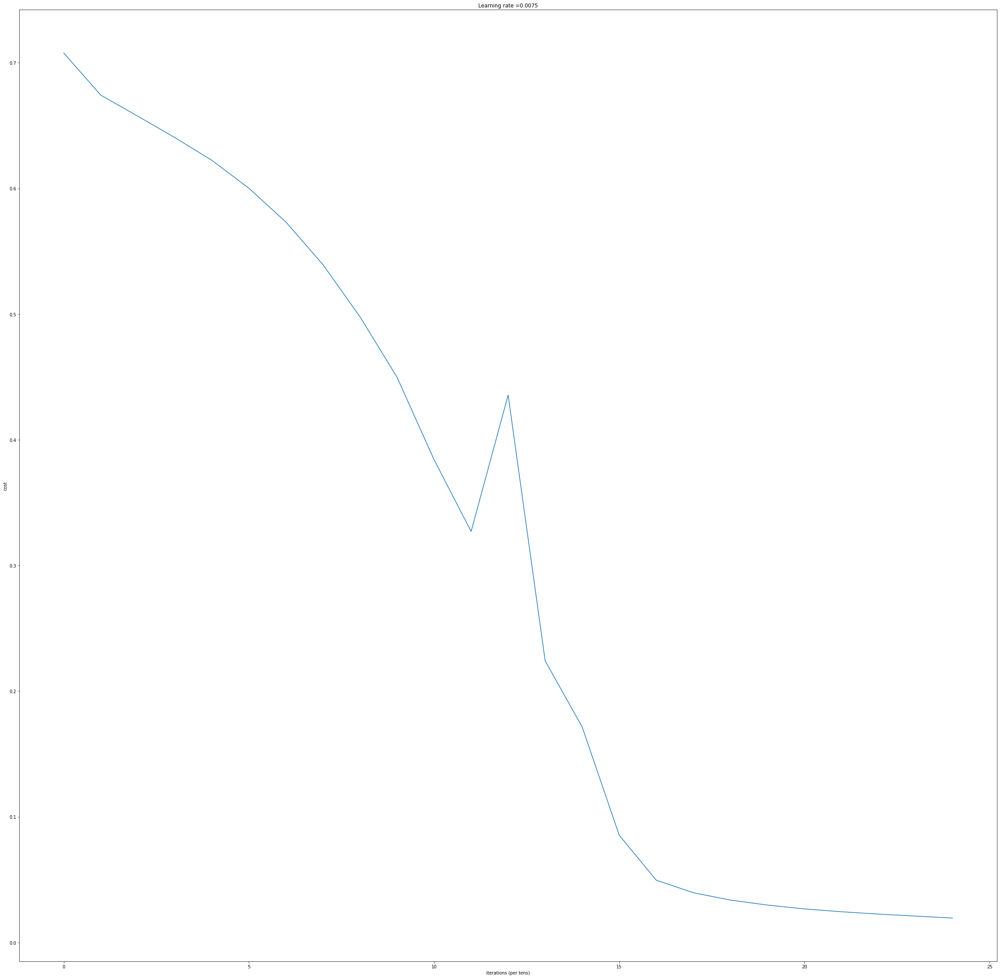

In [60]:
starting_params,fit_params = L_layer_model(train_set_x, train_set_y, nn_layers, num_iterations = 2500, print_cost = True)

## 10. Results analysis

Now we can check the performance of the trained network by predicting the results of the test set and comparing them with the actual labels.

In [55]:
def predict(X, y, parameters):
    """
    This function is used to predict the results of a  L-layer neural network.
    
    Arguments:
    X -- data set of examples you would like to label
    parameters -- parameters of the trained model
    
    Returns:
    p -- predictions for the given dataset X
    """
    
    m = X.shape[1]
    n = len(parameters) // 2 # number of layers in the neural network
    p = np.zeros((1,m))
    
    # Forward propagation
    probas, caches = L_model_forward(X, parameters)

    
    # convert probs to 0/1 predictions
    for i in range(0, probas.shape[1]):
        if probas[0,i] > 0.5:
            p[0,i] = 1
        else:
            p[0,i] = 0
    
    # print results
    print("Accuracy: "  + str(np.sum((p == y)/m)))
        
    return p

In [56]:
pred_train = predict(train_set_x, train_set_y, fit_params)

Accuracy: 0.9856459330143539


In [57]:
pred_test = predict(test_set_x, test_set_y, fit_params)

Accuracy: 0.8


Congrats! It seems that this 5-layer neural network has **better performance (80%)** than the logistic regression model (72%) on the same test set. 

This is good performance for this task. 

Even higher accuracy could be obtained, by systematically searching for better hyperparameters (learning_rate, layers_dims, num_iterations) and other techniques such as regularisation, that we can see in the next notebook. 

With logistic regression we had 14 misses in the test set, out of 50.  
Let's check how many we have now and which ones are.

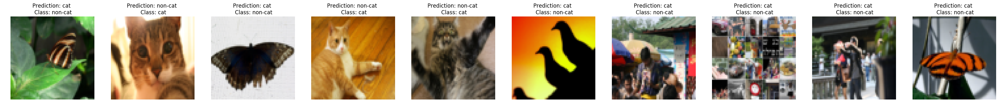

In [67]:
misses = print_mislabeled_images(classes, test_set_x, test_set_y, pred_test[0])

In [68]:
print("Number of misses: {0}".format(misses))

Number of misses: 10


### 10.1 - Test with your own image 

We will try again with the bunny/cat image.  
The logistic regression model predicted it was not a cat ! Let's ee if the neural network has a different opinion:

In [71]:
fname

'../images/Bunny+cat.png'

Accuracy: 0.0
y = 1.0, the algorithm predicts a "cat" picture.


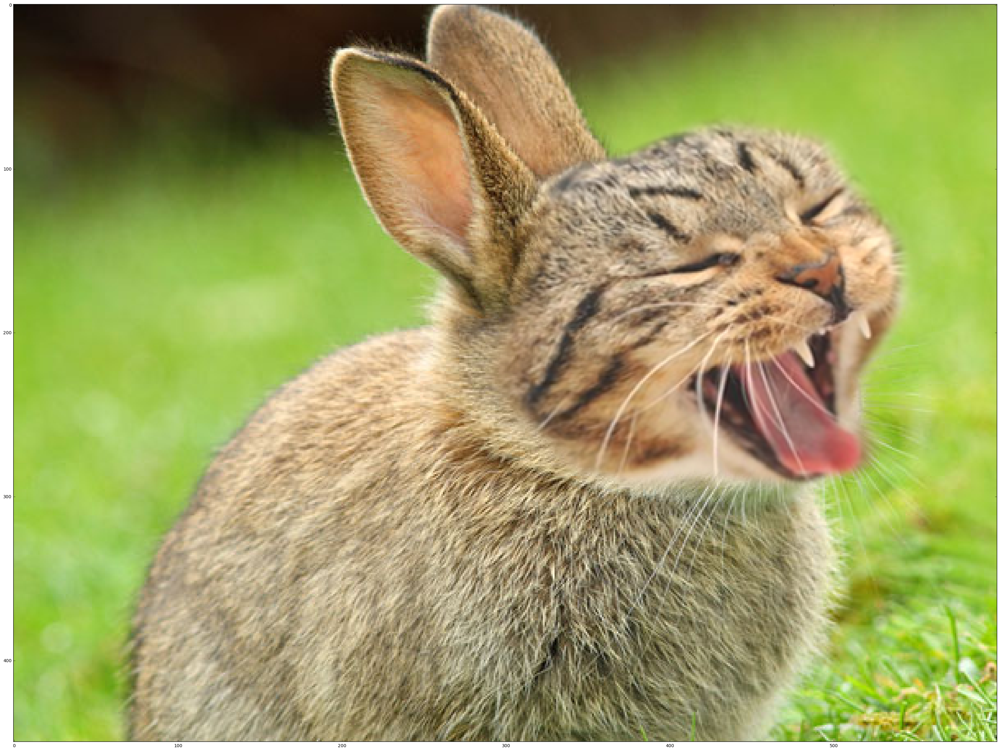

In [72]:
# Remember that my_image contains the processed image, previously prepared

my_predicted_image = predict(my_image, [0], fit_params)

plt.imshow(image)
print("y = " + str(np.squeeze(my_predicted_image)) + ", the algorithm predicts a \"" + classes[int(np.squeeze(my_predicted_image)),].decode("utf-8") +  "\" picture.")

Yes, now it classifies it as a cat ! (which I think is correct: it's just a cat with long ears ...)

Bibliography:
- [Andrew Ng's deep learning course](https://www.deeplearning.ai/)
- [Tutorial: implement a neural network from scratch](http://www.wildml.com/2015/09/implementing-a-neural-network-from-scratch/)
- [Image normalisation](https://stats.stackexchange.com/questions/211436/why-do-we-normalize-images-by-subtracting-the-datasets-image-mean-and-not-the-c)

Coursera L_model_forward,Yhat [[0.45886585 0.45282739 0.35599216 0.46856068 0.46643173 0.46872552
  0.46135581 0.36829163 0.37523    0.45000957]]
Cost after iteration 0: 0.665848


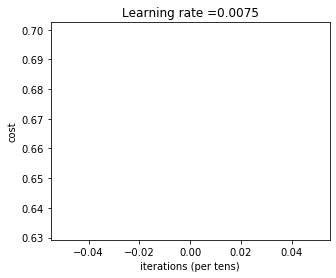

In [27]:
nn_layers=[64*64*3,10,1]
# Vamos a comparar los modelos
starting_params,fit_params,grads = L_layer_model(train_set_x, train_set_y, nn_layers, learning_rate=0.0075,num_iterations = 1, print_cost = True)


In [28]:
print (nn_layers)

[12288, 10, 1]


In [29]:
##### configuración de una deep red neural, 2 layer (10 y 1) 
# Prueba con una configuración sencilla, pero con deep 
L = 2 # Number of layers
nx = 64*64*3  # Number of features 
n = [nx,10, 1] # Número de nodos en cada layer 0=nfeatures, 1=3, ....,
w = []  # Numero total de Weights en cada layer (0,1,2, L-1)
z = []  # Número total de Z en cada layer, depende del numero de muestras [n. de units en layer * muestras]
activation = [ nn.relu,  nn.sigmoid ] # 0, layer1, 1, layer2
derivate_activation = [nn.d_relu, nn.d_sigmoid]
CONST = 0.01
nn_config = {"nodes_in_layer":n,
             "weights_in_layer":w,
             "activation":activation,
             "derivate_activation":derivate_activation}

w,W,b = deep.initializeWeightsAndInterceptors(n,L)
nn_config["weights_in_layer"] = w

In [30]:
# ACTUALIZO CON LOS OBTENIDOS EN COURSERA
for i in range(1,len(nn_layers)):
    W,b = deep.updateWeightsAndInterceptorsForLayer (W,starting_params["W"+str(i)],b,starting_params["b"+str(i)],nn_config,i)
for i in range(1,len(nn_layers)):
    Wi,bi = deep.getWeightsAndInterceptorsForLayer (W,b,nn_config,i)
    print ("Comparamos W" + str(i) + "{0}".format(Wi - starting_params["W"+str(i)]))
    print ("Comparamos b" + str(i) + "{0}".format(bi - starting_params["b"+str(i)]))

Comparamos W1[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Comparamos b1[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]
Comparamos W2[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Comparamos b2[[0.]]


In [31]:
iterations=1
for i in range(iterations):
    Predicted,cacheZ = deep.forwardProp_NN (train_set_x,W,b,L,nn_config)
    W,b = deep.backwardProp_NN (train_set_x,Predicted,train_set_y,cacheZ,W,b,L,nn_config,lr=0.0075)

forwardProp_NN, A values [[0.45886585 0.45282739 0.35599216 0.46856068 0.46643173 0.46872552
  0.46135581 0.36829163 0.37523    0.45000957]]


In [106]:
# Comparamos los valores de los parametros
for i in range(1,len(nn_layers)):
    Wi,bi = deep.getWeightsAndInterceptorsForLayer (W,b,nn_config,i)
    print ("Comparamos W" + str(i) + "{0}".format(Wi - fit_params["W"+str(i)]))
    print ("Comparamos b" + str(i) + "{0}".format(bi - fit_params["b"+str(i)]))

Comparamos W1[[-3.79484208e-05 -6.45651532e-05 -3.56746044e-05 ... -5.48849357e-05
  -7.65048841e-05 -2.06600149e-05]
 [-4.29671755e-05 -6.48722323e-05 -4.84367343e-05 ... -5.28192014e-05
  -6.97226935e-05 -3.07843785e-05]
 [ 1.66691695e-06  1.64061041e-06  1.72513631e-06 ... -1.02004545e-07
   2.27969587e-07  1.78853589e-07]
 ...
 [ 1.45991524e-04  2.20179243e-04  1.64333107e-04 ...  1.78097338e-04
   2.35155162e-04  1.03883480e-04]
 [ 2.63872899e-06  3.25143887e-06  3.63627294e-06 ... -1.39155013e-06
  -5.09387215e-07 -1.12506181e-06]
 [-1.09210427e-05 -1.75158273e-05 -1.29013065e-05 ... -1.39220289e-05
  -1.83733043e-05 -6.75304175e-06]]
Comparamos b1[[-1.70375144e-04]
 [-1.62677168e-04]
 [-1.81434672e-06]
 [ 1.13409580e-05]
 [-6.45027543e-05]
 [-9.91551450e-05]
 [-1.49202776e-05]
 [ 5.59888490e-04]
 [ 6.29379558e-06]
 [-4.90713389e-05]]
Comparamos W2[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Comparamos b2[[0.]]
